# CycleGAN

### Goals
In this notebook, you will write a generative model based on the paper [*Unpaired Image-to-Image Translation
using Cycle-Consistent Adversarial Networks*](https://arxiv.org/abs/1703.10593) by Zhu et al. 2017, commonly referred to as CycleGAN.

You will be training a model that can convert horses into zebras, and vice versa. Once again, the emphasis of the assignment will be on the loss functions. In order for you to see good outputs more quickly, you'll be training your model starting from a pre-trained checkpoint. You are also welcome to train it from scratch on your own, if you so choose.


<!-- You will take the segmentations that you generated in the previous assignment and produce photorealistic images. -->

### Learning Objectives
1.   Implement the loss functions of a CycleGAN model.
2.   Observe the two GANs used in CycleGAN.



## Getting Started
You will start by importing libraries, defining a visualization function, and getting the pre-trained CycleGAN checkpoint.

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()


import glob
import random
import os
from torch.utils.data import Dataset
from PIL import Image

# Inspired by https://github.com/aitorzip/PyTorch-CycleGAN/blob/master/datasets.py
class ImageDataset(Dataset):
    def __init__(self, root, transform=None, mode='train'):
        self.transform = transform
        self.files_A = sorted(glob.glob(os.path.join(root, '%sA' % mode) + '/*.*'))
        self.files_B = sorted(glob.glob(os.path.join(root, '%sB' % mode) + '/*.*'))
        if len(self.files_A) > len(self.files_B):
            self.files_A, self.files_B = self.files_B, self.files_A
        self.new_perm()
        assert len(self.files_A) > 0, "Make sure you downloaded the horse2zebra images!"

    def new_perm(self):
        self.randperm = torch.randperm(len(self.files_B))[:len(self.files_A)]

    def __getitem__(self, index):
        item_A = self.transform(Image.open(self.files_A[index % len(self.files_A)]))
        item_B = self.transform(Image.open(self.files_B[self.randperm[index]]))
        if item_A.shape[0] != 3: 
            item_A = item_A.repeat(3, 1, 1)
        if item_B.shape[0] != 3: 
            item_B = item_B.repeat(3, 1, 1)
        if index == len(self) - 1:
            self.new_perm()
        # Old versions of PyTorch didn't support normalization for different-channeled images
        return (item_A - 0.5) * 2, (item_B - 0.5) * 2

    def __len__(self):
        return min(len(self.files_A), len(self.files_B))

## Generator
The code for a CycleGAN generator is much like Pix2Pix's U-Net with the addition of the residual block between the encoding (contracting) and decoding (expanding) blocks.

![Diagram of a CycleGAN generator: composed of encoding blocks, residual blocks, then decoding blocks](CycleGAN_Generator.png)
*Diagram of a CycleGAN generator: composed of encoding blocks, residual blocks, and then decoding blocks.*

#### Residual Block
Perhaps the most notable architectural difference between the U-Net you used for Pix2Pix and the architecture you're using for CycleGAN are the residual blocks. In CycleGAN, after the expanding blocks, there are convolutional layers where the output is ultimately added to the original input so that the network can change as little as possible on the image. You can think of this transformation as a kind of skip connection, where instead of being concatenated as new channels before the convolution which combines them, it's added directly to the output of the convolution. In the visualization below, you can imagine the stripes being generated by the convolutions and then added to the original image of the horse to transform it into a zebra. These skip connections also allow the network to be deeper, because they help with vanishing gradients issues that come when a neural network gets too deep and the gradients multiply in backpropagation to become very small; instead, these skip connections enable more gradient flow. A deeper network is often able to learn more complex features.


![Residual block explanation: shows horse going through convolutions leading to stripes, added to the original horse image to get a zebra](residual_block.png)

*Example of a residual block.*

In [2]:
class ResidualBlock(nn.Module):
    '''
    ResidualBlock Class:
    Performs two convolutions and an instance normalization, the input is added
    to this output to form the residual block output.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels, kernel_size=3, padding=1, padding_mode='reflect')
        self.conv2 = nn.Conv2d(input_channels, input_channels, kernel_size=3, padding=1, padding_mode='reflect')
        self.instancenorm = nn.InstanceNorm2d(input_channels)
        self.activation = nn.ReLU()

    def forward(self, x):
        '''
        Function for completing a forward pass of ResidualBlock: 
        Given an image tensor, completes a residual block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        original_x = x.clone()
        x = self.conv1(x)
        x = self.instancenorm(x)
        x = self.activation(x)
        x = self.conv2(x)
        x = self.instancenorm(x)
        return original_x + x

#### Contracting and Expanding Blocks

The rest of the generator code will otherwise be much like the code you wrote for the last assignment: Pix2Pix's U-Net. The primary changes are the use of instance norm instead of batch norm (which you may recall from StyleGAN), no dropout, and a stride-2 convolution instead of max pooling. Feel free to investigate the code if you're interested!

In [3]:
class ContractingBlock(nn.Module):
    '''
    ContractingBlock Class
    Performs a convolution followed by a max pool operation and an optional instance norm.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, use_bn=True, kernel_size=3, activation='relu'):
        super(ContractingBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels * 2, kernel_size=kernel_size, padding=1, stride=2, padding_mode='reflect')
        self.activation = nn.ReLU() if activation == 'relu' else nn.LeakyReLU(0.2)
        if use_bn:
            self.instancenorm = nn.InstanceNorm2d(input_channels * 2)
        self.use_bn = use_bn

    def forward(self, x):
        '''
        Function for completing a forward pass of ContractingBlock: 
        Given an image tensor, completes a contracting block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv1(x)
        if self.use_bn:
            x = self.instancenorm(x)
        x = self.activation(x)
        return x

class ExpandingBlock(nn.Module):
    '''
    ExpandingBlock Class:
    Performs a convolutional transpose operation in order to upsample, 
        with an optional instance norm
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, use_bn=True):
        super(ExpandingBlock, self).__init__()
        self.conv1 = nn.ConvTranspose2d(input_channels, input_channels // 2, kernel_size=3, stride=2, padding=1, output_padding=1)
        if use_bn:
            self.instancenorm = nn.InstanceNorm2d(input_channels // 2)
        self.use_bn = use_bn
        self.activation = nn.ReLU()

    def forward(self, x):
        '''
        Function for completing a forward pass of ExpandingBlock: 
        Given an image tensor, completes an expanding block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
            skip_con_x: the image tensor from the contracting path (from the opposing block of x)
                    for the skip connection
        '''
        x = self.conv1(x)
        if self.use_bn:
            x = self.instancenorm(x)
        x = self.activation(x)
        return x

class FeatureMapBlock(nn.Module):
    '''
    FeatureMapBlock Class
    The final layer of a Generator - 
    maps each the output to the desired number of output channels
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=7, padding=3, padding_mode='reflect')

    def forward(self, x):
        '''
        Function for completing a forward pass of FeatureMapBlock: 
        Given an image tensor, returns it mapped to the desired number of channels.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv(x)
        return x

#### CycleGAN Generator
Finally, you can put all the blocks together to create your CycleGAN generator.

In [4]:
class Generator(nn.Module):
    '''
    Generator Class
    A series of 2 contracting blocks, 9 residual blocks, and 2 expanding blocks to 
    transform an input image into an image from the other class, with an upfeature
    layer at the start and a downfeature layer at the end.
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels, hidden_channels=64):
        super(Generator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        res_mult = 4
        self.res0 = ResidualBlock(hidden_channels * res_mult)
        self.res1 = ResidualBlock(hidden_channels * res_mult)
        self.res2 = ResidualBlock(hidden_channels * res_mult)
        self.res3 = ResidualBlock(hidden_channels * res_mult)
        self.res4 = ResidualBlock(hidden_channels * res_mult)
        self.res5 = ResidualBlock(hidden_channels * res_mult)
        self.res6 = ResidualBlock(hidden_channels * res_mult)
        self.res7 = ResidualBlock(hidden_channels * res_mult)
        self.res8 = ResidualBlock(hidden_channels * res_mult)
        self.expand2 = ExpandingBlock(hidden_channels * 4)
        self.expand3 = ExpandingBlock(hidden_channels * 2)
        self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
        self.tanh = torch.nn.Tanh()

    def forward(self, x):
        '''
        Function for completing a forward pass of Generator: 
        Given an image tensor, passes it through the U-Net with residual blocks
        and returns the output.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.res0(x2)
        x4 = self.res1(x3)
        x5 = self.res2(x4)
        x6 = self.res3(x5)
        x7 = self.res4(x6)
        x8 = self.res5(x7)
        x9 = self.res6(x8)
        x10 = self.res7(x9)
        x11 = self.res8(x10)
        x12 = self.expand2(x11)
        x13 = self.expand3(x12)
        xn = self.downfeature(x13)
        return self.tanh(xn)

## PatchGAN Discriminator

Next, you will define the discriminator—a PatchGAN. It will be very similar to what you saw in Pix2Pix.

In [5]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Structured like the contracting path of the U-Net, the discriminator will
    output a matrix of values classifying corresponding portions of the image as real or fake. 
    Parameters:
        input_channels: the number of image input channels
        hidden_channels: the initial number of discriminator convolutional filters
    '''
    def __init__(self, input_channels, hidden_channels=64):
        super(Discriminator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_bn=False, kernel_size=4, activation='lrelu')
        self.contract2 = ContractingBlock(hidden_channels * 2, kernel_size=4, activation='lrelu')
        self.contract3 = ContractingBlock(hidden_channels * 4, kernel_size=4, activation='lrelu')
        self.final = nn.Conv2d(hidden_channels * 8, 1, kernel_size=1)

    def forward(self, x):
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        xn = self.final(x3)
        return xn

## Training Preparation
<!-- You'll be using the same U-Net as in the previous assignment, but you'll write another discriminator and change the loss to make it a GAN. -->

Now you can put everything together for training! You will start by defining your parameters:

  *   adv_criterion: an adversarial loss function to keep track of how well the GAN is fooling the discriminator and how well the discriminator is catching the GAN
  *   recon_criterion: a loss function that rewards similar images to the ground truth, which "reconstruct" the image
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   dim_A: the number of channels of the images in pile A
  *   dim_B: the number of channels of the images in pile B (note that in the visualization this is currently treated as equivalent to dim_A)
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   target_shape: the size of the input and output images (in pixels)
  *   load_shape: the size for the dataset to load the images at before randomly cropping them to target_shape as a simple data augmentation
  *   device: the device type

In [6]:
import torch.nn.functional as F

adv_criterion = nn.MSELoss() 
recon_criterion = nn.L1Loss() 

n_epochs = 20
dim_A = 3
dim_B = 3
display_step = 200
batch_size = 1
lr = 0.0002
load_shape = 286
target_shape = 256
device = 'cuda'

You will then load the images of the dataset while introducing some data augmentation (e.g. crops and random horizontal flips). 

In [7]:
transform = transforms.Compose([
    transforms.Resize(load_shape),
    transforms.RandomCrop(target_shape),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
])

import torchvision
dataset = ImageDataset("horse2zebra", transform=transform)

Next, you can initialize your generators and discriminators, as well as their optimizers. For CycleGAN, you will have two generators and two discriminators since there are two GANs:

*   Generator for horse to zebra (`gen_AB`)
*   Generator for zebra to horse (`gen_BA`)
*   Discriminator for horse (`disc_A`)
*   Discriminator for zebra (`disc_B`)

You will also load your pre-trained model.

In [8]:
gen_AB = Generator(dim_A, dim_B).to(device)
gen_BA = Generator(dim_B, dim_A).to(device)
gen_opt = torch.optim.Adam(list(gen_AB.parameters()) + list(gen_BA.parameters()), lr=lr, betas=(0.5, 0.999))
disc_A = Discriminator(dim_A).to(device)
disc_A_opt = torch.optim.Adam(disc_A.parameters(), lr=lr, betas=(0.5, 0.999))
disc_B = Discriminator(dim_B).to(device)
disc_B_opt = torch.optim.Adam(disc_B.parameters(), lr=lr, betas=(0.5, 0.999))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

# Feel free to change pretrained to False if you're training the model from scratch
pretrained = True
if pretrained:
    pre_dict = torch.load('cycleGAN_100000.pth')
    gen_AB.load_state_dict(pre_dict['gen_AB'])
    gen_BA.load_state_dict(pre_dict['gen_BA'])
    gen_opt.load_state_dict(pre_dict['gen_opt'])
    disc_A.load_state_dict(pre_dict['disc_A'])
    disc_A_opt.load_state_dict(pre_dict['disc_A_opt'])
    disc_B.load_state_dict(pre_dict['disc_B'])
    disc_B_opt.load_state_dict(pre_dict['disc_B_opt'])
else:
    gen_AB = gen_AB.apply(weights_init)
    gen_BA = gen_BA.apply(weights_init)
    disc_A = disc_A.apply(weights_init)
    disc_B = disc_B.apply(weights_init)

## Discriminator Loss
First, you're going to be implementing the discriminator loss. This is the same as in previous assignments, so it should be a breeze :) Don't forget to detach your generator!

In [39]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(real_X, fake_X, disc_X, adv_criterion):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        real_X: the real images from pile X
        fake_X: the generated images of class X
        disc_X: the discriminator for class X; takes images and returns real/fake class X
            prediction matrices
        adv_criterion: the adversarial loss function; takes the discriminator 
            predictions and the target labels and returns a adversarial 
            loss (which you aim to minimize)
    '''
    #### START CODE HERE ####
    fake_X.detach()
    real_loss = adv_criterion(disc_X(real_X), torch.ones_like(disc_X(real_X)))
    fake_loss = adv_criterion(disc_X(fake_X), torch.zeros_like(disc_X(fake_X)))    
    disc_loss = (real_loss + fake_loss) / 2
    #print(f"fake_pred: {fake_pred}, real_pred: {real_pred}, disc_loss: {disc_loss}")
    #### END CODE HERE ####
    return disc_loss

In [40]:
# UNIT TEST
test_disc_X = lambda x: x * 97
test_real_X = torch.tensor(83.)
test_fake_X = torch.tensor(89.)
test_adv_criterion = lambda x, y: x * 79 + y * 73
assert torch.abs((get_disc_loss(test_real_X, test_fake_X, test_disc_X, test_adv_criterion)) - 659054.5000) < 1e-6
test_disc_X = lambda x: x.mean(0, keepdim=True)
test_adv_criterion = torch.nn.BCEWithLogitsLoss()
test_input = torch.ones(20, 10)
# If this runs, it's a pass - checks that the shapes are treated correctly
get_disc_loss(test_input, test_input, test_disc_X, test_adv_criterion)
print("Success!")

Success!


## Generator Loss
While there are some changes to the CycleGAN architecture from Pix2Pix, the most important distinguishing feature of CycleGAN is its generator loss. You will be implementing that here!

#### Adversarial Loss
The first component of the generator's loss you're going to implement is its adversarial loss—this once again is pretty similar to the GAN loss that you've implemented in the past. The important thing to note is that the criterion now is based on least squares loss, rather than binary cross entropy loss or W-loss.

In [45]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_adversarial_loss
def get_gen_adversarial_loss(real_X, disc_Y, gen_XY, adv_criterion):
    '''
    Return the adversarial loss of the generator given inputs
    (and the generated images for testing purposes).
    Parameters:
        real_X: the real images from pile X
        disc_Y: the discriminator for class Y; takes images and returns real/fake class Y
            prediction matrices
        gen_XY: the generator for class X to Y; takes images and returns the images 
            transformed to class Y
        adv_criterion: the adversarial loss function; takes the discriminator 
                  predictions and the target labels and returns a adversarial 
                  loss (which you aim to minimize)
    '''
    #### START CODE HERE ####
    fake_Y = gen_XY(real_X)
    adversarial_loss = adv_criterion(disc_Y(fake_Y), torch.ones_like(disc_Y(fake_Y)))
    #### END CODE HERE ####
    return adversarial_loss, fake_Y

In [46]:
# UNIT TEST
test_disc_Y = lambda x: x * 97
test_real_X = torch.tensor(83.)
test_gen_XY = lambda x: x * 89
test_adv_criterion = lambda x, y: x * 79 + y * 73
test_res = get_gen_adversarial_loss(test_real_X, test_disc_Y, test_gen_XY, test_adv_criterion)
assert torch.abs(test_res[0] - 56606652) < 1e-6
assert torch.abs(test_res[1] - 7387) < 1e-6
test_disc_Y = lambda x: x.mean(0, keepdim=True)
test_adv_criterion = torch.nn.BCEWithLogitsLoss()
test_input = torch.ones(20, 10)
# If this runs, it's a pass - checks that the shapes are treated correctly
get_gen_adversarial_loss(test_input, test_disc_Y, test_gen_XY, test_adv_criterion)
print("Success!")

Success!


#### Identity Loss
Here you get to see some of the superbly new material! You'll want to measure the change in an image when you pass the generator an example from the target domain instead of the input domain it's expecting. The output should be the same as the input since it is already of the target domain class. For example, if you put a horse through a zebra -> horse generator, you'd expect the output to be the same horse because nothing needed to be transformed. It's already a horse! You don't want your generator to be transforming it into any other thing, so you want to encourage this behavior. In encouraging this identity mapping, the authors of CycleGAN found that for some tasks, this helped properly preserve the colors of an image, even when the expected input (here, a zebra) was put in. This was particularly useful for the photos <-> paintings mapping and, while an optional aesthetic component, you might find it useful for your applications down the line.

![Diagram showing a real horse image going through a zebra -> horse generator and the ideal output being the same input image](Identity_Loss.png)

In [47]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_identity_loss
def get_identity_loss(real_X, gen_YX, identity_criterion):
    '''
    Return the identity loss of the generator given inputs
    (and the generated images for testing purposes).
    Parameters:
        real_X: the real images from pile X
        gen_YX: the generator for class Y to X; takes images and returns the images 
            transformed to class X
        identity_criterion: the identity loss function; takes the real images from X and
                        those images put through a Y->X generator and returns the identity 
                        loss (which you aim to minimize)
    '''
    #### START CODE HERE ####
    identity_X = gen_YX(real_X)
    identity_loss = identity_criterion(identity_X, real_X)
    #### END CODE HERE ####
    return identity_loss, identity_X

In [48]:
# UNIT TEST
test_real_X = torch.tensor(83.)
test_gen_YX = lambda x: x * 89
test_identity_criterion = lambda x, y: (x + y) * 73
test_res = get_identity_loss(test_real_X, test_gen_YX, test_identity_criterion)
assert torch.abs(test_res[0] - 545310) < 1e-6
assert torch.abs(test_res[1] - 7387) < 1e-6
print("Success!")

Success!


#### Cycle Consistency Loss
Now, you can implement the final generator loss and the part that puts the "cycle" in CycleGAN: cycle consistency loss. This is used to ensure that when you put an image through one generator, that if it is then transformed back into the input class using the opposite generator, the image is the same as the original input image.

![Diagram showing a real zebra image being transformed into a horse and then back into a zebra. The output zebra should be the same as the input zebra.](Cycle_Consistency_Loss.png)

Since you've already generated a fake image for the adversarial part, you can pass that fake image back to produce a full cycle—this loss will encourage the cycle to preserve as much information as possible.

*Fun fact: Cycle consistency is a broader concept that's used outside of CycleGAN a lot too! It's helped with data augmentation and has been used on text translation too, e.g. French -> English -> French should get the same phrase back.*

In [78]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_cycle_consistency_loss
def get_cycle_consistency_loss(real_X, fake_Y, gen_YX, cycle_criterion):
    '''
    Return the cycle consistency loss of the generator given inputs
    (and the generated images for testing purposes).
    Parameters:
        real_X: the real images from pile X
        fake_Y: the generated images of class Y
        gen_YX: the generator for class Y to X; takes images and returns the images 
            transformed to class X
        cycle_criterion: the cycle consistency loss function; takes the real images from X and
                        those images put through a X->Y generator and then Y->X generator
                        and returns the cycle consistency loss (which you aim to minimize)
    '''
    #### START CODE HERE ####
    # fake_Y: image put through X->Y generator
    fake_X = gen_YX(fake_Y) # Put through Y->X generator
    cycle_loss = cycle_criterion(real_X, fake_X)
    #### END CODE HERE ####
    return cycle_loss, fake_X

In [79]:
# UNIT TEST
test_real_X = torch.tensor(83.)
test_fake_Y = torch.tensor(97.)
test_gen_YX = lambda x: x * 89
test_cycle_criterion = lambda x, y: (x + y) * 73
test_res = get_cycle_consistency_loss(test_real_X, test_fake_Y, test_gen_YX, test_cycle_criterion)
assert torch.abs(test_res[1] - 8633) < 1e-6
assert torch.abs(test_res[0] - 636268) < 1e-6
print("Success!")

Success!


#### Generator Loss (Total)

Finally, you can put it all together! There are many components, so be careful as you go through this section.

In [98]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(real_A, real_B, gen_AB, gen_BA, disc_A, disc_B, adv_criterion, identity_criterion, cycle_criterion, lambda_identity=0.1, lambda_cycle=10):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        real_A: the real images from pile A
        real_B: the real images from pile B
        gen_AB: the generator for class A to B; takes images and returns the images 
            transformed to class B
        gen_BA: the generator for class B to A; takes images and returns the images 
            transformed to class A
        disc_A: the discriminator for class A; takes images and returns real/fake class A
            prediction matrices
        disc_B: the discriminator for class B; takes images and returns real/fake class B
            prediction matrices
        adv_criterion: the adversarial loss function; takes the discriminator 
            predictions and the true labels and returns a adversarial 
            loss (which you aim to minimize)
        identity_criterion: the reconstruction loss function used for identity loss
            and cycle consistency loss; takes two sets of images and returns
            their pixel differences (which you aim to minimize)
        cycle_criterion: the cycle consistency loss function; takes the real images from X and
            those images put through a X->Y generator and then Y->X generator
            and returns the cycle consistency loss (which you aim to minimize).
            Note that in practice, cycle_criterion == identity_criterion == L1 loss
        lambda_identity: the weight of the identity loss
        lambda_cycle: the weight of the cycle-consistency loss
    '''
    # Hint 1: Make sure you include both directions - you can think of the generators as collaborating
    # Hint 2: Don't forget to use the lambdas for the identity loss and cycle loss!
    #### START CODE HERE ####
    # Adversarial Loss -- get_gen_adversarial_loss(real_X, disc_Y, gen_XY, adv_criterion) return adversarial_loss, fake_Y
    adverserial_loss_AB, fake_B = get_gen_adversarial_loss(real_A, disc_B, gen_AB, adv_criterion)
    adverserial_loss_BA, fake_A = get_gen_adversarial_loss(real_B, disc_A, gen_BA, adv_criterion)
    print(f"{adverserial_loss_AB} + {adverserial_loss_BA} = {adverserial_loss_BA + adverserial_loss_AB}")
    # Identity Loss -- get_identity_loss(real_X, gen_YX, identity_criterion) return identity_loss, identity_X
    identity_loss_AB, _ = get_identity_loss(real_B, gen_AB, identity_criterion)
    identity_loss_BA, _ = get_identity_loss(real_A, gen_BA, identity_criterion)
    print(f"{identity_loss_AB} + {identity_loss_BA} = {identity_loss_AB + identity_loss_BA}")
    # Cycle-consistency Loss -- get_cycle_consistency_loss(real_X, fake_Y, gen_YX, cycle_criterion) return cycle_loss, fake_X
    cycle_consistency_loss_BA, _ = get_cycle_consistency_loss(real_A, fake_B, gen_BA, cycle_criterion)
    cycle_consistency_loss_AB, _ = get_cycle_consistency_loss(real_B, fake_A, gen_AB, cycle_criterion)
    print(f"{cycle_consistency_loss_BA} + {cycle_consistency_loss_AB} = {cycle_consistency_loss_BA + cycle_consistency_loss_AB}")
    # Total loss
    gen_loss = adverserial_loss_AB + adverserial_loss_BA + lambda_identity * (identity_loss_AB + identity_loss_BA) + lambda_cycle * (cycle_consistency_loss_AB + cycle_consistency_loss_BA)
    print(f"gen_loss: {gen_loss} fake_A: {fake_A}, fake_B: {fake_B}")
    #### END CODE HERE ####
    return gen_loss, fake_A, fake_B

In [99]:
# UNIT TEST
test_real_A = torch.tensor(97)
test_real_B = torch.tensor(89)
test_gen_AB = lambda x: x * 83
test_gen_BA = lambda x: x * 79
test_disc_A = lambda x: x * 47
test_disc_B = lambda x: x * 43
test_adv_criterion = lambda x, y: x * 73 + y * 71
test_recon_criterion = lambda x, y: (x + y) * 61
test_lambda_identity = 59
test_lambda_cycle = 53
test_res = get_gen_loss(
    test_real_A, 
    test_real_B, 
    test_gen_AB, 
    test_gen_BA, 
    test_disc_A,
    test_disc_B,
    test_adv_criterion, 
    test_recon_criterion, 
    test_recon_criterion, 
    test_lambda_identity, 
    test_lambda_cycle)
assert test_res[0].item() == 4047804560
assert test_res[1].item() == 7031
assert test_res[2].item() == 8051
print("Success!")

25272160 + 24123432 = 49395592
456036 + 473360 = 929396
38803686 + 35603382 = 74407068
gen_loss: 4047804560 fake_A: 7031, fake_B: 8051
Success!


## CycleGAN Training

Lastly, you can train the model and see some of your zebras, horses, and some that might not quite look like either! Note that this training will take a long time, so feel free to use the pre-trained checkpoint as an example of what a pretty-good CycleGAN does.

  0%|          | 0/1067 [00:00<?, ?it/s]

0.6550353169441223 + 0.3891400396823883 = 1.044175386428833
0.09950920939445496 + 0.10094692558050156 = 0.2004561424255371
0.07755374908447266 + 0.09356413781642914 = 0.1711178869009018
gen_loss: 2.775399923324585 fake_A: tensor([[[[-0.2271, -0.1864, -0.1840,  ...,  0.0913,  0.0946,  0.0455],
          [-0.1615, -0.1741, -0.1423,  ..., -0.0519,  0.0258,  0.0651],
          [-0.0288, -0.0589, -0.1242,  ..., -0.0548, -0.0054,  0.0595],
          ...,
          [-0.4441, -0.4207, -0.3834,  ..., -0.3991, -0.4639, -0.3681],
          [-0.4952, -0.4887, -0.5915,  ..., -0.3572, -0.4178, -0.3941],
          [-0.2766, -0.3440, -0.4301,  ..., -0.3251, -0.2841, -0.3477]],

         [[-0.1760, -0.1535, -0.1337,  ...,  0.1925,  0.1876,  0.1520],
          [-0.0745, -0.1054, -0.0899,  ...,  0.0579,  0.1107,  0.1631],
          [ 0.0241,  0.0120, -0.0612,  ...,  0.0482,  0.0889,  0.1592],
          ...,
          [-0.2026, -0.1599, -0.1255,  ..., -0.1693, -0.2732, -0.1970],
          [-0.2843, -0.256

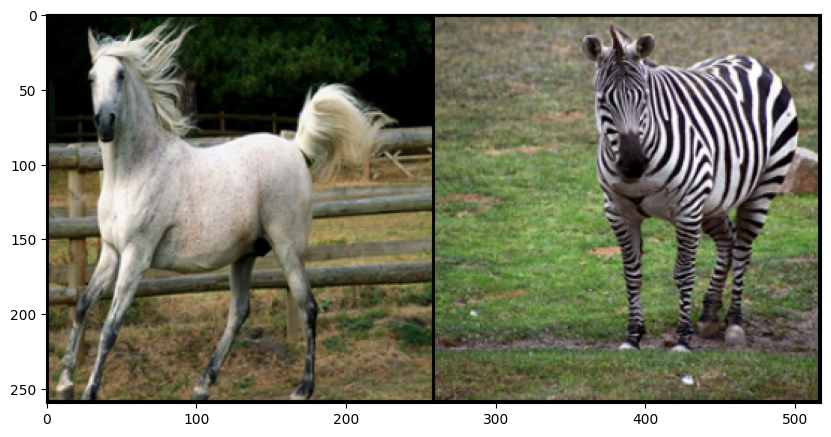

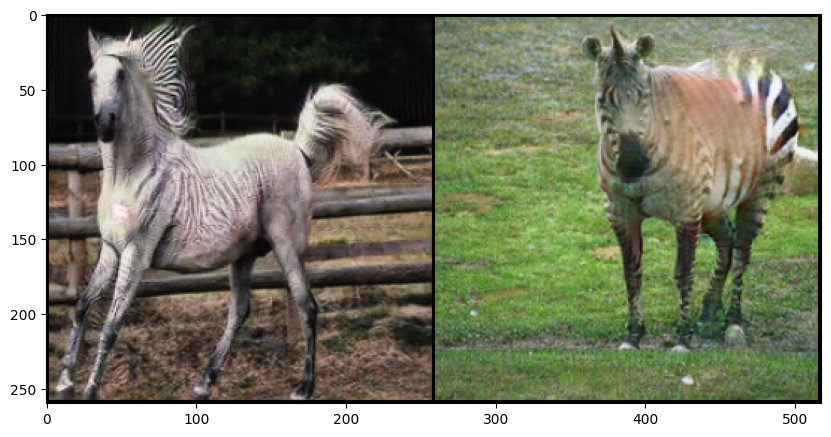

0.5633138418197632 + 0.3278660178184509 = 0.8911798596382141
0.15380766987800598 + 0.0977071151137352 = 0.2515147924423218
0.09298431128263474 + 0.06199359893798828 = 0.1549779176712036
gen_loss: 2.4661104679107666 fake_A: tensor([[[[ 0.4210,  0.4341,  0.4480,  ...,  0.1104,  0.1151,  0.1932],
          [ 0.4380,  0.4233,  0.4332,  ...,  0.2193,  0.2522,  0.3110],
          [ 0.4339,  0.4149,  0.4432,  ...,  0.3606,  0.5195,  0.3771],
          ...,
          [-0.1608, -0.1615, -0.1170,  ..., -0.5121, -0.5304, -0.4737],
          [-0.1659, -0.1406, -0.0589,  ..., -0.5939, -0.5386, -0.4999],
          [-0.1918, -0.1523, -0.0975,  ..., -0.5989, -0.5180, -0.4997]],

         [[ 0.6748,  0.6872,  0.6853,  ...,  0.2768,  0.2644,  0.3167],
          [ 0.6725,  0.6726,  0.6690,  ...,  0.3817,  0.4358,  0.4593],
          [ 0.6668,  0.6658,  0.6749,  ...,  0.5051,  0.6366,  0.4985],
          ...,
          [-0.1417, -0.1284, -0.0797,  ..., -0.4138, -0.4297, -0.3879],
          [-0.1632, -0.11

0.5741384029388428 + 0.5976021885871887 = 1.1717405319213867
0.09577904641628265 + 0.18788228929042816 = 0.2836613357067108
0.08727595210075378 + 0.07884036749601364 = 0.16611632704734802
gen_loss: 2.861269950866699 fake_A: tensor([[[[ 0.5760,  0.5636,  0.5783,  ..., -0.4561, -0.4941, -0.5865],
          [ 0.4808,  0.4727,  0.5634,  ..., -0.5583, -0.5711, -0.6276],
          [ 0.3468,  0.3633,  0.4852,  ..., -0.5445, -0.5625, -0.6288],
          ...,
          [ 0.5428,  0.4883,  0.4397,  ...,  0.1960,  0.1435,  0.0839],
          [ 0.5326,  0.4612,  0.4720,  ...,  0.1741,  0.1963,  0.1219],
          [ 0.5700,  0.5022,  0.4886,  ...,  0.1022,  0.1771,  0.0961]],

         [[ 0.5589,  0.5537,  0.6088,  ..., -0.3496, -0.3586, -0.4692],
          [ 0.4505,  0.4517,  0.5621,  ..., -0.4547, -0.4628, -0.5483],
          [ 0.3430,  0.3388,  0.4658,  ..., -0.4811, -0.4983, -0.5450],
          ...,
          [ 0.3885,  0.3289,  0.2974,  ...,  0.1690,  0.1294,  0.0936],
          [ 0.3664,  0.2

0.7948338389396667 + 0.6061446666717529 = 1.4009785652160645
0.16479268670082092 + 0.10864661633968353 = 0.27343928813934326
0.0656498521566391 + 0.07556913793087006 = 0.14121899008750916
gen_loss: 2.84051251411438 fake_A: tensor([[[[-0.4528, -0.7247, -0.8605,  ...,  0.8103,  0.7456,  0.6437],
          [-0.2725, -0.6145, -0.8268,  ...,  0.7462,  0.6630,  0.5900],
          [-0.2832, -0.6039, -0.7890,  ...,  0.6463,  0.6009,  0.5414],
          ...,
          [ 0.1715,  0.2822,  0.2532,  ...,  0.4670,  0.5165,  0.3391],
          [ 0.2028,  0.2286,  0.2041,  ...,  0.3204,  0.3002,  0.2918],
          [ 0.1698,  0.1881,  0.1699,  ...,  0.1059,  0.2147,  0.2274]],

         [[-0.4399, -0.7149, -0.8299,  ...,  0.8188,  0.7707,  0.6911],
          [-0.2158, -0.6448, -0.8114,  ...,  0.7610,  0.7197,  0.6605],
          [-0.4003, -0.6668, -0.7942,  ...,  0.6980,  0.6656,  0.6405],
          ...,
          [ 0.2716,  0.3427,  0.2690,  ...,  0.5378,  0.5089,  0.2828],
          [ 0.3605,  0.33

0.5759578943252563 + 0.8698921203613281 = 1.4458500146865845
0.16105958819389343 + 0.12758570909500122 = 0.28864529728889465
0.06515893340110779 + 0.08430328220129013 = 0.14946222305297852
gen_loss: 2.969336748123169 fake_A: tensor([[[[ 0.6846,  0.7077,  0.6396,  ...,  0.6264,  0.6599,  0.2562],
          [ 0.6546,  0.7013,  0.5195,  ...,  0.8758,  0.7893,  0.2752],
          [ 0.7372,  0.6806,  0.4393,  ...,  0.8829,  0.8495,  0.3261],
          ...,
          [-0.0672,  0.0205,  0.0156,  ...,  0.0069, -0.0336,  0.0095],
          [ 0.0099, -0.1084, -0.1938,  ..., -0.0501, -0.1066, -0.1174],
          [-0.1534, -0.3611, -0.4834,  ..., -0.0889,  0.0373, -0.0093]],

         [[ 0.6171,  0.6747,  0.6057,  ...,  0.7225,  0.7189,  0.2682],
          [ 0.5812,  0.6511,  0.4377,  ...,  0.9134,  0.8643,  0.3660],
          [ 0.6630,  0.5790,  0.3356,  ...,  0.8864,  0.8675,  0.2630],
          ...,
          [-0.1977, -0.1182, -0.1019,  ..., -0.1942, -0.1998, -0.1850],
          [-0.1966, -0.

0.5275462865829468 + 0.843163251876831 = 1.3707095384597778
0.09453292191028595 + 0.16749611496925354 = 0.2620290517807007
0.09138580411672592 + 0.07711367309093475 = 0.16849946975708008
gen_loss: 3.081907272338867 fake_A: tensor([[[[-0.4252, -0.4226, -0.4342,  ..., -0.4376, -0.3264, -0.2496],
          [-0.4164, -0.4106, -0.3991,  ..., -0.3996, -0.3450, -0.2700],
          [-0.3765, -0.3759, -0.3860,  ..., -0.4052, -0.3728, -0.2724],
          ...,
          [-0.4063, -0.4103, -0.2418,  ..., -0.3677, -0.2261, -0.1678],
          [-0.3514, -0.3672, -0.2757,  ..., -0.3436, -0.2247, -0.2137],
          [-0.2047, -0.2566, -0.2617,  ..., -0.3879, -0.2715, -0.2484]],

         [[-0.2441, -0.2329, -0.2194,  ..., -0.1536, -0.0679,  0.0056],
          [-0.2019, -0.2156, -0.2190,  ..., -0.1360, -0.0903, -0.0108],
          [-0.1884, -0.2060, -0.2021,  ..., -0.1609, -0.1332, -0.0213],
          ...,
          [-0.3665, -0.3986, -0.2488,  ..., -0.2388, -0.1036, -0.0341],
          [-0.3277, -0.35

0.545341968536377 + 1.4485384225845337 = 1.9938803911209106
0.122860386967659 + 0.22209620475769043 = 0.34495657682418823
0.10084383189678192 + 0.11416008323431015 = 0.21500390768051147
gen_loss: 4.178415298461914 fake_A: tensor([[[[ 0.1667,  0.1763,  0.1945,  ...,  0.1629,  0.1158,  0.1255],
          [ 0.1548,  0.1499,  0.1655,  ...,  0.1636,  0.1538,  0.1772],
          [ 0.1428,  0.1246,  0.1439,  ...,  0.1780,  0.1637,  0.1563],
          ...,
          [-0.7018, -0.6976, -0.7022,  ..., -0.6898, -0.5939, -0.5743],
          [-0.6882, -0.6962, -0.7311,  ..., -0.5966, -0.6217, -0.6328],
          [-0.6683, -0.6726, -0.7198,  ..., -0.5764, -0.5376, -0.5780]],

         [[ 0.3336,  0.3689,  0.3686,  ...,  0.2986,  0.2692,  0.2922],
          [ 0.3204,  0.3325,  0.3228,  ...,  0.2971,  0.3048,  0.3358],
          [ 0.3125,  0.3116,  0.2911,  ...,  0.3090,  0.3019,  0.3220],
          ...,
          [-0.5601, -0.5921, -0.6325,  ..., -0.6619, -0.5215, -0.4996],
          [-0.5780, -0.596

0.6671881675720215 + 0.614799439907074 = 1.2819876670837402
0.14911314845085144 + 0.08315648138523102 = 0.23226962983608246
0.047419868409633636 + 0.08008594810962677 = 0.1275058090686798
gen_loss: 2.580272674560547 fake_A: tensor([[[[ 0.2600,  0.1357,  0.1199,  ...,  0.1869,  0.2734,  0.1018],
          [ 0.2575,  0.1389,  0.0933,  ...,  0.1525,  0.2841,  0.1667],
          [ 0.1826,  0.1032,  0.0275,  ...,  0.0586,  0.1868,  0.0800],
          ...,
          [-0.4846, -0.5582, -0.4193,  ...,  0.1377,  0.1895,  0.0556],
          [-0.5934, -0.5871, -0.3760,  ...,  0.1309,  0.1967,  0.0666],
          [-0.7037, -0.6250, -0.4700,  ..., -0.0381,  0.0286, -0.0401]],

         [[ 0.4150,  0.3112,  0.3193,  ...,  0.3540,  0.3944,  0.2736],
          [ 0.3868,  0.2480,  0.2257,  ...,  0.3082,  0.4406,  0.3371],
          [ 0.3718,  0.2570,  0.1806,  ...,  0.2481,  0.3310,  0.2830],
          ...,
          [-0.2781, -0.4130, -0.2369,  ...,  0.3450,  0.4102,  0.2876],
          [-0.4436, -0.4

0.5601866245269775 + 0.5017367601394653 = 1.0619233846664429
0.2127334326505661 + 0.07785730808973312 = 0.29059073328971863
0.064679816365242 + 0.08443170040845871 = 0.14911150932312012
gen_loss: 2.5820975303649902 fake_A: tensor([[[[ 0.0971,  0.0999,  0.1951,  ...,  0.4754,  0.5101,  0.4765],
          [ 0.0942,  0.1591,  0.1962,  ...,  0.5113,  0.5257,  0.4915],
          [ 0.0408,  0.1511,  0.1678,  ...,  0.3911,  0.4584,  0.4627],
          ...,
          [ 0.4674,  0.4429,  0.4813,  ...,  0.3086,  0.2354,  0.2477],
          [ 0.5426,  0.5449,  0.5604,  ...,  0.3233,  0.2433,  0.1847],
          [ 0.3738,  0.3848,  0.3961,  ...,  0.2641,  0.3045,  0.2255]],

         [[ 0.1166,  0.1104,  0.1919,  ...,  0.4033,  0.4492,  0.4305],
          [ 0.1230,  0.1712,  0.1729,  ...,  0.4235,  0.4734,  0.4187],
          [ 0.0644,  0.1739,  0.1637,  ...,  0.3313,  0.4057,  0.4176],
          ...,
          [ 0.3424,  0.3558,  0.4215,  ...,  0.1361,  0.0758,  0.1321],
          [ 0.4376,  0.49

0.5723927021026611 + 0.610427975654602 = 1.1828206777572632
0.22945153713226318 + 0.0915435403585434 = 0.3209950923919678
0.0682431161403656 + 0.10647313296794891 = 0.17471624910831451
gen_loss: 2.962082624435425 fake_A: tensor([[[[-0.3284, -0.1907,  0.0046,  ..., -0.5119, -0.4361, -0.5334],
          [-0.3621, -0.1403,  0.0404,  ..., -0.4824, -0.4746, -0.5064],
          [-0.2998, -0.1090,  0.0988,  ..., -0.4570, -0.5231, -0.5264],
          ...,
          [-0.7477, -0.5186, -0.1567,  ..., -0.1972, -0.1611, -0.1289],
          [-0.5849, -0.4265, -0.2398,  ..., -0.2001, -0.2719, -0.1845],
          [-0.5035, -0.4501, -0.3784,  ..., -0.0802, -0.0866, -0.0927]],

         [[-0.4880, -0.4340, -0.3296,  ..., -0.6182, -0.6505, -0.7288],
          [-0.5363, -0.3996, -0.3391,  ..., -0.6271, -0.6531, -0.7045],
          [-0.4336, -0.3622, -0.2586,  ..., -0.6003, -0.7017, -0.7053],
          ...,
          [-0.8348, -0.6871, -0.4604,  ..., -0.4640, -0.4279, -0.4320],
          [-0.7548, -0.6808

0.5954513549804688 + 0.584132194519043 = 1.1795835494995117
0.11007892340421677 + 0.07917486131191254 = 0.1892537772655487
0.07066645473241806 + 0.07131077349185944 = 0.1419772207736969
gen_loss: 2.618281126022339 fake_A: tensor([[[[ 0.4784,  0.4802,  0.4525,  ...,  0.3979,  0.3861,  0.3496],
          [ 0.4841,  0.4560,  0.4937,  ...,  0.3916,  0.3674,  0.3931],
          [ 0.4817,  0.4616,  0.5329,  ...,  0.3296,  0.3766,  0.4021],
          ...,
          [-0.1600, -0.4428, -0.3717,  ...,  0.2853,  0.3067,  0.2035],
          [-0.2990, -0.4681, -0.4049,  ...,  0.2508,  0.2806,  0.1968],
          [-0.3351, -0.3553, -0.3044,  ...,  0.2320,  0.3189,  0.1958]],

         [[ 0.4698,  0.5242,  0.5046,  ...,  0.3515,  0.3493,  0.3519],
          [ 0.4568,  0.4443,  0.4370,  ...,  0.3639,  0.3514,  0.3914],
          [ 0.4175,  0.4486,  0.4534,  ...,  0.3172,  0.3501,  0.3933],
          ...,
          [-0.0975, -0.4560, -0.4381,  ...,  0.1944,  0.2759,  0.1566],
          [-0.2890, -0.525

0.6220844388008118 + 0.5329168438911438 = 1.1550012826919556
0.12748491764068604 + 0.09302495419979095 = 0.220509871840477
0.054130129516124725 + 0.0874553769826889 = 0.14158549904823303
gen_loss: 2.592907190322876 fake_A: tensor([[[[ 9.1795e-01,  9.7589e-01,  9.7268e-01,  ..., -5.0447e-01,
           -4.2309e-01, -5.0947e-01],
          [ 9.2502e-01,  9.7282e-01,  9.7160e-01,  ..., -2.6838e-01,
           -3.5276e-01, -4.7217e-01],
          [ 8.7256e-01,  9.2927e-01,  9.3807e-01,  ..., -3.5986e-01,
           -4.4916e-01, -5.3109e-01],
          ...,
          [ 8.6542e-02,  1.5885e-01,  2.0595e-01,  ..., -2.9917e-02,
            5.1004e-02,  1.1652e-01],
          [ 1.7074e-01,  1.6219e-01,  2.4692e-01,  ...,  3.3085e-02,
            1.5776e-01,  2.1234e-01],
          [ 1.6971e-01,  9.2904e-02,  1.1014e-01,  ...,  1.4383e-01,
            1.9209e-01,  1.6468e-01]],

         [[ 9.2652e-01,  9.7424e-01,  9.7131e-01,  ..., -9.5764e-02,
           -7.9010e-02, -1.6559e-01],
          [

0.7700539231300354 + 0.311005175113678 = 1.0810590982437134
0.11314760148525238 + 0.13671061396598816 = 0.24985821545124054
0.09163522720336914 + 0.05991191789507866 = 0.1515471488237381
gen_loss: 2.621516227722168 fake_A: tensor([[[[-0.4602, -0.5936, -0.5676,  ..., -0.0964, -0.1796, -0.1597],
          [-0.4053, -0.5888, -0.5426,  ...,  0.0014, -0.1718, -0.1643],
          [-0.4191, -0.6603, -0.5780,  ...,  0.0636, -0.1275, -0.1527],
          ...,
          [-0.0727, -0.0667,  0.0173,  ...,  0.4179,  0.2785,  0.2073],
          [-0.1170, -0.0863, -0.0235,  ...,  0.3631,  0.2522,  0.2138],
          [-0.0712, -0.0571, -0.0535,  ...,  0.3581,  0.2990,  0.2482]],

         [[-0.5790, -0.6882, -0.6738,  ..., -0.1401, -0.2387, -0.2410],
          [-0.5489, -0.6933, -0.6404,  ..., -0.0532, -0.2136, -0.2130],
          [-0.5479, -0.7034, -0.6337,  ..., -0.0156, -0.2055, -0.2187],
          ...,
          [-0.3201, -0.3552, -0.3293,  ...,  0.0613, -0.0795, -0.1422],
          [-0.4023, -0.40

0.7000501155853271 + 0.5377326011657715 = 1.2377827167510986
0.18197254836559296 + 0.06928370147943497 = 0.2512562572956085
0.07945937663316727 + 0.09402944892644882 = 0.1734888255596161
gen_loss: 2.9977965354919434 fake_A: tensor([[[[-0.2250, -0.2696, -0.2763,  ..., -0.2614, -0.3001, -0.3726],
          [-0.2704, -0.2601, -0.2544,  ..., -0.2115, -0.2695, -0.4132],
          [-0.2611, -0.2671, -0.2353,  ..., -0.1468, -0.2770, -0.3981],
          ...,
          [ 0.9555,  0.9495,  0.9312,  ...,  0.9713,  0.9685,  0.9716],
          [ 0.9547,  0.9345,  0.9214,  ...,  0.9698,  0.9624,  0.9479],
          [ 0.9762,  0.9594,  0.9572,  ...,  0.9683,  0.9655,  0.9478]],

         [[-0.5923, -0.5741, -0.5510,  ..., -0.1391, -0.2348, -0.3427],
          [-0.6025, -0.5968, -0.5714,  ..., -0.0701, -0.1772, -0.3594],
          [-0.5963, -0.5780, -0.5266,  ..., -0.0740, -0.1932, -0.3374],
          ...,
          [ 0.9263,  0.9208,  0.8755,  ...,  0.9487,  0.9390,  0.9383],
          [ 0.9250,  0.9

0.5100735425949097 + 0.5438289642333984 = 1.053902506828308
0.1818828582763672 + 0.09545841068029404 = 0.2773412764072418
0.052684053778648376 + 0.0679432675242424 = 0.12062732130289078
gen_loss: 2.287909984588623 fake_A: tensor([[[[-0.2163, -0.3233, -0.0689,  ..., -0.1978, -0.0760, -0.2624],
          [-0.1928, -0.2176, -0.0763,  ..., -0.1876,  0.0025, -0.1667],
          [-0.1308, -0.1794, -0.1744,  ..., -0.0799,  0.1452, -0.2128],
          ...,
          [ 0.7508,  0.7889,  0.0189,  ...,  0.8923,  0.8668,  0.8892],
          [ 0.6518,  0.5695, -0.1659,  ...,  0.9090,  0.8675,  0.8492],
          [ 0.6058,  0.4694, -0.1344,  ...,  0.8886,  0.8868,  0.8519]],

         [[-0.1758, -0.2848, -0.0053,  ...,  0.0318,  0.1289, -0.0854],
          [-0.1149, -0.2073, -0.0820,  ...,  0.0288,  0.2287,  0.0531],
          [-0.0625, -0.1630, -0.1581,  ...,  0.1531,  0.3427, -0.0828],
          ...,
          [ 0.5906,  0.7289, -0.0711,  ...,  0.8669,  0.8423,  0.8652],
          [ 0.4242,  0.493

0.5945286154747009 + 0.5783332586288452 = 1.1728618144989014
0.11903070658445358 + 0.07079028338193893 = 0.18982098996639252
0.07231340557336807 + 0.06899547576904297 = 0.14130887389183044
gen_loss: 2.6049327850341797 fake_A: tensor([[[[ 0.5781,  0.5324,  0.4503,  ...,  0.2352,  0.0034,  0.1872],
          [ 0.6198,  0.5786,  0.5448,  ...,  0.2805,  0.1454,  0.2156],
          [ 0.6484,  0.6458,  0.7104,  ...,  0.4199,  0.3514,  0.3902],
          ...,
          [-0.4488, -0.3657, -0.3947,  ...,  0.2831,  0.3929,  0.3922],
          [-0.3759, -0.3760, -0.3715,  ...,  0.3048,  0.3435,  0.3437],
          [-0.3550, -0.3972, -0.3782,  ...,  0.3077,  0.3690,  0.3560]],

         [[ 0.3935,  0.3406,  0.2491,  ...,  0.3525,  0.1152,  0.1599],
          [ 0.4629,  0.3782,  0.3214,  ...,  0.4477,  0.2360,  0.2760],
          [ 0.4815,  0.4600,  0.5414,  ...,  0.5544,  0.4847,  0.4405],
          ...,
          [-0.4737, -0.4143, -0.4557,  ..., -0.1478, -0.0181, -0.0213],
          [-0.4711, -0

0.5045835971832275 + 0.6020053029060364 = 1.1065888404846191
0.191878080368042 + 0.12840679287910461 = 0.3202848732471466
0.07094725221395493 + 0.07522254437208176 = 0.14616979658603668
gen_loss: 2.6003150939941406 fake_A: tensor([[[[-0.2751, -0.2748, -0.2730,  ..., -0.2380, -0.2183, -0.2268],
          [-0.2699, -0.2743, -0.2639,  ..., -0.2283, -0.2222, -0.2312],
          [-0.2566, -0.2627, -0.2634,  ..., -0.2333, -0.2556, -0.2782],
          ...,
          [ 0.1376,  0.1357,  0.1322,  ..., -0.0245,  0.0504,  0.0678],
          [ 0.1040,  0.0912,  0.0650,  ..., -0.0282,  0.0480,  0.0784],
          [ 0.1056,  0.0734,  0.0074,  ...,  0.0182,  0.0976,  0.0813]],

         [[ 0.1217,  0.1233,  0.1286,  ...,  0.1755,  0.1895,  0.1843],
          [ 0.1304,  0.1280,  0.1201,  ...,  0.1728,  0.1839,  0.1737],
          [ 0.1317,  0.1334,  0.1360,  ...,  0.1747,  0.1506,  0.1319],
          ...,
          [ 0.0895,  0.1083,  0.0919,  ..., -0.0194,  0.0606,  0.1052],
          [ 0.0758,  0.05

0.40046510100364685 + 0.4933720529079437 = 0.8938371539115906
0.1631624847650528 + 0.06800371408462524 = 0.23116619884967804
0.038124844431877136 + 0.05502037703990936 = 0.0931452214717865
gen_loss: 1.8484060764312744 fake_A: tensor([[[[0.9883, 0.9875, 0.9881,  ..., 0.9807, 0.9812, 0.9817],
          [0.9902, 0.9896, 0.9886,  ..., 0.9806, 0.9803, 0.9808],
          [0.9905, 0.9903, 0.9878,  ..., 0.9825, 0.9805, 0.9777],
          ...,
          [0.9850, 0.9815, 0.9788,  ..., 0.9810, 0.9785, 0.9778],
          [0.9834, 0.9788, 0.9740,  ..., 0.9810, 0.9742, 0.9685],
          [0.9877, 0.9842, 0.9809,  ..., 0.9816, 0.9772, 0.9714]],

         [[0.9804, 0.9824, 0.9815,  ..., 0.9765, 0.9784, 0.9806],
          [0.9828, 0.9837, 0.9824,  ..., 0.9761, 0.9766, 0.9810],
          [0.9839, 0.9852, 0.9810,  ..., 0.9789, 0.9776, 0.9775],
          ...,
          [0.9779, 0.9762, 0.9752,  ..., 0.9697, 0.9697, 0.9729],
          [0.9795, 0.9767, 0.9738,  ..., 0.9754, 0.9690, 0.9668],
          [0.982

0.5082364082336426 + 0.5937104225158691 = 1.1019468307495117
0.12259205430746078 + 0.1556653082370758 = 0.2782573699951172
0.0781509280204773 + 0.07188057154417038 = 0.15003150701522827
gen_loss: 2.6300876140594482 fake_A: tensor([[[[-0.6513, -0.6519, -0.6523,  ..., -0.6530, -0.6561, -0.6865],
          [-0.6689, -0.6625, -0.6645,  ..., -0.6624, -0.6611, -0.6737],
          [-0.6611, -0.6645, -0.6801,  ..., -0.6661, -0.6794, -0.6954],
          ...,
          [-0.6985, -0.6852, -0.6753,  ..., -0.7215, -0.7209, -0.7408],
          [-0.7210, -0.6979, -0.6411,  ..., -0.7279, -0.7325, -0.7505],
          [-0.6979, -0.6742, -0.6454,  ..., -0.7424, -0.7314, -0.7429]],

         [[-0.7150, -0.6867, -0.6977,  ..., -0.6950, -0.6951, -0.7022],
          [-0.7076, -0.6892, -0.6944,  ..., -0.6882, -0.6816, -0.6856],
          [-0.6941, -0.6803, -0.7013,  ..., -0.6841, -0.6978, -0.7051],
          ...,
          [-0.6386, -0.6216, -0.6157,  ..., -0.7311, -0.7330, -0.7403],
          [-0.6710, -0.62

0.7151586413383484 + 0.5243693590164185 = 1.239527940750122
0.12964946031570435 + 0.09293436259031296 = 0.2225838303565979
0.07023721933364868 + 0.08185192197561264 = 0.15208914875984192
gen_loss: 2.78267765045166 fake_A: tensor([[[[-0.9038, -0.9052, -0.9155,  ..., -0.9205, -0.9253, -0.9165],
          [-0.9123, -0.9039, -0.9041,  ..., -0.9197, -0.9207, -0.9108],
          [-0.9082, -0.9131, -0.9187,  ..., -0.9155, -0.9214, -0.9131],
          ...,
          [-0.8677, -0.8610, -0.8662,  ..., -0.8232, -0.8258, -0.8123],
          [-0.8649, -0.8669, -0.8722,  ..., -0.8179, -0.8149, -0.8129],
          [-0.8613, -0.8540, -0.8657,  ..., -0.8136, -0.8017, -0.7970]],

         [[-0.9403, -0.9358, -0.9442,  ..., -0.9313, -0.9439, -0.9340],
          [-0.9346, -0.9288, -0.9383,  ..., -0.9322, -0.9415, -0.9334],
          [-0.9316, -0.9311, -0.9351,  ..., -0.9298, -0.9373, -0.9342],
          ...,
          [-0.9121, -0.9121, -0.9098,  ..., -0.8792, -0.8740, -0.8647],
          [-0.9118, -0.905

0.5270827412605286 + 0.33232346177101135 = 0.8594062328338623
0.18562674522399902 + 0.1085440143942833 = 0.2941707670688629
0.07839477062225342 + 0.07131671905517578 = 0.1497114896774292
gen_loss: 2.3859381675720215 fake_A: tensor([[[[ 6.1005e-01,  5.6356e-01,  5.6247e-01,  ...,  7.8616e-01,
            7.6853e-01,  7.2203e-01],
          [ 2.3532e-01,  1.5799e-01,  2.2467e-01,  ...,  6.1915e-01,
            6.7563e-01,  6.8763e-01],
          [ 4.4513e-01,  4.2249e-01,  2.9334e-01,  ...,  6.8133e-01,
            6.6099e-01,  6.4109e-01],
          ...,
          [ 6.4941e-01,  6.0993e-01,  5.4198e-01,  ...,  4.9855e-02,
            5.3452e-02,  2.1684e-01],
          [ 6.0049e-01,  5.7446e-01,  5.2613e-01,  ...,  4.8081e-02,
            9.5331e-02,  2.3078e-01],
          [ 5.4860e-01,  5.2800e-01,  5.1081e-01,  ...,  1.6738e-01,
            2.6795e-01,  3.1975e-01]],

         [[ 6.2801e-01,  5.8920e-01,  5.6520e-01,  ...,  7.5784e-01,
            7.2558e-01,  6.6870e-01],
          

0.6878402233123779 + 0.6230494976043701 = 1.310889720916748
0.16006474196910858 + 0.1577025204896927 = 0.31776726245880127
0.12863850593566895 + 0.05605003982782364 = 0.184688538312912
gen_loss: 3.189551830291748 fake_A: tensor([[[[-0.1930, -0.1844, -0.1920,  ..., -0.1205, -0.1137, -0.1248],
          [-0.1875, -0.1745, -0.1680,  ..., -0.1188, -0.1115, -0.0978],
          [-0.1730, -0.1499, -0.1576,  ..., -0.1315, -0.1472, -0.1569],
          ...,
          [ 0.1207,  0.1590,  0.1659,  ..., -0.1816, -0.2050, -0.2080],
          [ 0.1238,  0.1494,  0.1113,  ..., -0.1302, -0.1281, -0.1362],
          [ 0.1129,  0.0657,  0.0809,  ...,  0.0594,  0.0323, -0.0454]],

         [[ 0.1243,  0.0940,  0.1048,  ...,  0.1924,  0.2065,  0.1983],
          [ 0.1434,  0.1056,  0.0999,  ...,  0.1733,  0.2116,  0.2349],
          [ 0.1308,  0.1247,  0.1245,  ...,  0.1756,  0.1701,  0.1832],
          ...,
          [ 0.0731,  0.1175,  0.1139,  ..., -0.1448, -0.1507, -0.1120],
          [ 0.0530,  0.0803

0.8512183427810669 + 0.4126315712928772 = 1.2638499736785889
0.1691686511039734 + 0.09922271221876144 = 0.26839137077331543
0.09978353977203369 + 0.06410085409879684 = 0.16388440132141113
gen_loss: 2.929533004760742 fake_A: tensor([[[[-6.6113e-01, -6.7308e-01, -7.1167e-01,  ...,  6.1494e-01,
            7.5653e-01,  7.7920e-01],
          [-6.9473e-01, -6.8406e-01, -6.8218e-01,  ...,  6.7926e-01,
            7.1293e-01,  7.3855e-01],
          [-7.2574e-01, -7.4637e-01, -7.3128e-01,  ...,  7.1994e-01,
            6.9755e-01,  7.2736e-01],
          ...,
          [-1.6386e-01, -1.5424e-01, -1.7313e-01,  ..., -1.8780e-01,
           -1.3716e-01, -1.6051e-01],
          [-2.0799e-01, -2.2454e-01, -1.8632e-01,  ..., -2.0352e-01,
           -2.1311e-01, -2.0818e-01],
          [-2.3361e-01, -2.7088e-01, -2.5223e-01,  ..., -2.3870e-01,
           -2.2658e-01, -2.2539e-01]],

         [[-3.4302e-01, -3.9872e-01, -4.8719e-01,  ...,  5.5719e-01,
            7.3706e-01,  7.8735e-01],
          

0.5787866115570068 + 0.5022784471511841 = 1.081065058708191
0.09747181832790375 + 0.14893727004528046 = 0.2464090883731842
0.09664680808782578 + 0.061436574906110764 = 0.15808337926864624
gen_loss: 2.686539649963379 fake_A: tensor([[[[-0.7767, -0.7866, -0.7480,  ..., -0.5882, -0.5865, -0.5989],
          [-0.7396, -0.7323, -0.6881,  ..., -0.5917, -0.5790, -0.5721],
          [-0.7228, -0.6862, -0.6141,  ..., -0.6193, -0.6128, -0.5977],
          ...,
          [-0.7759, -0.7663, -0.7065,  ..., -0.1684, -0.1609, -0.1787],
          [-0.7073, -0.6705, -0.6375,  ..., -0.0954, -0.1444, -0.1405],
          [-0.6975, -0.6565, -0.6729,  ..., -0.0453, -0.0889, -0.1276]],

         [[-0.6787, -0.6892, -0.6397,  ..., -0.4328, -0.4486, -0.4597],
          [-0.6410, -0.6375, -0.5828,  ..., -0.4421, -0.4393, -0.4253],
          [-0.6092, -0.5686, -0.4806,  ..., -0.4776, -0.4863, -0.4508],
          ...,
          [-0.6255, -0.6407, -0.5674,  ..., -0.0947, -0.0455, -0.0564],
          [-0.5770, -0.5

0.31408441066741943 + 0.3774411678314209 = 0.6915255784988403
0.1620229333639145 + 0.13658565282821655 = 0.29860860109329224
0.09848719090223312 + 0.08527227491140366 = 0.18375946581363678
gen_loss: 2.558980941772461 fake_A: tensor([[[[0.7351, 0.7126, 0.7004,  ..., 0.7679, 0.7232, 0.7787],
          [0.7091, 0.6905, 0.7061,  ..., 0.7746, 0.7441, 0.7857],
          [0.6683, 0.6851, 0.7305,  ..., 0.7483, 0.7531, 0.7582],
          ...,
          [0.6700, 0.6518, 0.6662,  ..., 0.8312, 0.7794, 0.7510],
          [0.6250, 0.6579, 0.6888,  ..., 0.7848, 0.7827, 0.7822],
          [0.5797, 0.6060, 0.6718,  ..., 0.7824, 0.8014, 0.7694]],

         [[0.5362, 0.5320, 0.5458,  ..., 0.7917, 0.7472, 0.7713],
          [0.4587, 0.4618, 0.4753,  ..., 0.7855, 0.7705, 0.8044],
          [0.4358, 0.4789, 0.5416,  ..., 0.7736, 0.7674, 0.7773],
          ...,
          [0.5025, 0.4953, 0.5221,  ..., 0.7643, 0.7036, 0.6760],
          [0.4248, 0.5089, 0.5614,  ..., 0.7155, 0.7247, 0.7195],
          [0.3822

0.7331019043922424 + 0.465389609336853 = 1.1984915733337402
0.1180504783987999 + 0.12875473499298096 = 0.24680522084236145
0.07014568150043488 + 0.06275114417076111 = 0.13289682567119598
gen_loss: 2.552140235900879 fake_A: tensor([[[[ 9.6442e-02,  5.9933e-02,  1.1316e-01,  ...,  3.9775e-02,
            1.0790e-02,  1.9413e-04],
          [-2.4916e-02, -2.7970e-02,  3.3312e-02,  ...,  9.8708e-02,
            8.8856e-02,  1.0949e-01],
          [ 2.6651e-02,  5.5515e-02,  7.7837e-02,  ...,  2.2316e-02,
            6.6883e-02,  8.5192e-02],
          ...,
          [ 1.0857e-01,  1.3907e-01,  1.6103e-01,  ...,  1.1019e-01,
            1.3120e-01,  1.2500e-01],
          [ 1.0372e-01,  1.3790e-01,  1.7127e-01,  ...,  1.5258e-01,
            1.6680e-01,  1.4451e-01],
          [ 8.5074e-02,  1.3177e-01,  1.1975e-01,  ...,  1.3808e-01,
            2.2382e-01,  1.5801e-01]],

         [[-5.4782e-02, -9.0233e-02,  1.7129e-02,  ..., -1.8635e-01,
           -2.2707e-01, -2.1791e-01],
          [

0.4433210492134094 + 0.4323813319206238 = 0.8757023811340332
0.12173756211996078 + 0.2002606987953186 = 0.32199826836586
0.1124388799071312 + 0.08660678565502167 = 0.19904565811157227
gen_loss: 2.8983588218688965 fake_A: tensor([[[[-0.5532, -0.5915, -0.5982,  ..., -0.6665, -0.4737, -0.4907],
          [-0.5612, -0.6006, -0.6807,  ..., -0.4311, -0.5460, -0.5952],
          [-0.6575, -0.6333, -0.7244,  ..., -0.2699, -0.6747, -0.5635],
          ...,
          [ 0.1919,  0.1719,  0.0622,  ...,  0.7855,  0.7562,  0.7794],
          [ 0.1868,  0.1508,  0.1625,  ...,  0.8537,  0.6768,  0.5063],
          [ 0.3019,  0.2870,  0.2832,  ...,  0.6541,  0.5878,  0.6274]],

         [[-0.4642, -0.5603, -0.5933,  ..., -0.6088, -0.4864, -0.4687],
          [-0.4793, -0.6026, -0.6835,  ..., -0.3774, -0.4889, -0.5522],
          [-0.5852, -0.6067, -0.7366,  ..., -0.2023, -0.6377, -0.4901],
          ...,
          [-0.0338,  0.0044, -0.1257,  ...,  0.7182,  0.6745,  0.6849],
          [-0.1466, -0.0675

0.5151569247245789 + 0.5192897319793701 = 1.0344467163085938
0.22556529939174652 + 0.1213698536157608 = 0.3469351530075073
0.07628647983074188 + 0.11472740024328232 = 0.1910138726234436
gen_loss: 2.979279041290283 fake_A: tensor([[[[-0.8461, -0.8622, -0.8592,  ...,  0.9398,  0.9489,  0.9587],
          [-0.8654, -0.8622, -0.8495,  ...,  0.9258,  0.9337,  0.9501],
          [-0.8511, -0.8558, -0.8671,  ...,  0.9273,  0.9324,  0.9391],
          ...,
          [-0.2976, -0.3428, -0.4254,  ...,  0.6928,  0.6976,  0.6792],
          [-0.3403, -0.3091, -0.3428,  ...,  0.6833,  0.6476,  0.6338],
          [-0.4210, -0.3937, -0.3724,  ...,  0.5999,  0.6418,  0.6330]],

         [[-0.8666, -0.8609, -0.8618,  ...,  0.9379,  0.9450,  0.9530],
          [-0.8752, -0.8684, -0.8547,  ...,  0.9264,  0.9297,  0.9525],
          [-0.8810, -0.8759, -0.8622,  ...,  0.9309,  0.9320,  0.9416],
          ...,
          [-0.6194, -0.6536, -0.7136,  ...,  0.6092,  0.5688,  0.5636],
          [-0.6812, -0.634

0.5491275787353516 + 0.5231494307518005 = 1.0722770690917969
0.15739339590072632 + 0.10983265936374664 = 0.26722604036331177
0.10465644299983978 + 0.05219221115112305 = 0.15684865415096283
gen_loss: 2.6674861907958984 fake_A: tensor([[[[-0.8590, -0.8432, -0.8331,  ..., -0.2238, -0.2909, -0.2807],
          [-0.8371, -0.7716, -0.8329,  ..., -0.0467, -0.1686, -0.1788],
          [-0.8653, -0.7700, -0.8387,  ...,  0.2317, -0.0396, -0.1515],
          ...,
          [ 0.3773,  0.4540,  0.3868,  ...,  0.1874,  0.0983,  0.2999],
          [ 0.4386,  0.4521,  0.5176,  ...,  0.4172,  0.2763,  0.2789],
          [ 0.5584,  0.5432,  0.5955,  ...,  0.4076,  0.4829,  0.4093]],

         [[-0.7794, -0.7044, -0.7148,  ...,  0.0108, -0.1209, -0.1238],
          [-0.7535, -0.6487, -0.7442,  ...,  0.1674,  0.0069, -0.0023],
          [-0.8182, -0.6496, -0.7506,  ...,  0.3363,  0.1093,  0.0084],
          ...,
          [ 0.5569,  0.6260,  0.5172,  ...,  0.4691,  0.3473,  0.4566],
          [ 0.6101,  0

0.664225161075592 + 0.5885435938835144 = 1.2527687549591064
0.1276312619447708 + 0.11877273768186569 = 0.2464039921760559
0.05118149518966675 + 0.06589577347040176 = 0.11707726866006851
gen_loss: 2.4481818675994873 fake_A: tensor([[[[-0.1028, -0.1419, -0.1859,  ..., -0.0971, -0.0667, -0.1710],
          [-0.1952, -0.2308, -0.2916,  ..., -0.0982, -0.0370, -0.1068],
          [-0.3071, -0.3124, -0.3797,  ..., -0.1866, -0.2158, -0.2422],
          ...,
          [ 0.0365, -0.0105, -0.0578,  ..., -0.2038, -0.2023, -0.1885],
          [-0.0193, -0.0646, -0.2612,  ..., -0.1333, -0.1283, -0.1521],
          [-0.1445, -0.2474, -0.4011,  ..., -0.2059, -0.1120, -0.1904]],

         [[-0.0290, -0.0645, -0.0999,  ...,  0.1936,  0.1778,  0.1092],
          [-0.1001, -0.1693, -0.1903,  ...,  0.1823,  0.2337,  0.1748],
          [-0.2049, -0.1902, -0.2555,  ...,  0.1426,  0.0855,  0.0955],
          ...,
          [ 0.0884,  0.0775,  0.0575,  ...,  0.0265,  0.0242,  0.0233],
          [-0.0470, -0.01

0.33248552680015564 + 0.38725656270980835 = 0.7197420597076416
0.1878734827041626 + 0.14786061644554138 = 0.335734099149704
0.07882503420114517 + 0.07218296825885773 = 0.1510080099105835
gen_loss: 2.2633955478668213 fake_A: tensor([[[[ 0.3095,  0.3049,  0.2716,  ...,  0.0078,  0.0331,  0.0578],
          [ 0.2747,  0.2506,  0.2646,  ...,  0.1190,  0.0615,  0.0311],
          [ 0.2201,  0.1984,  0.2880,  ...,  0.0661,  0.0844,  0.0736],
          ...,
          [ 0.0076,  0.0166,  0.0814,  ...,  0.5700,  0.5326,  0.4393],
          [ 0.1705,  0.1503,  0.1533,  ...,  0.2504,  0.5570,  0.4756],
          [ 0.4086,  0.3851,  0.4339,  ...,  0.1157,  0.3131,  0.2126]],

         [[ 0.3869,  0.3897,  0.3841,  ...,  0.0791,  0.0518,  0.0875],
          [ 0.3652,  0.3524,  0.3256,  ...,  0.1729,  0.0737,  0.0412],
          [ 0.3157,  0.2927,  0.3771,  ...,  0.1505,  0.1274,  0.0964],
          ...,
          [-0.1047, -0.0971, -0.0491,  ...,  0.4864,  0.4340,  0.3014],
          [-0.0202,  0.0

0.6974155306816101 + 0.6702398657798767 = 1.3676553964614868
0.18666043877601624 + 0.10983725637197495 = 0.2964977025985718
0.06955363601446152 + 0.06607243418693542 = 0.13562607765197754
gen_loss: 2.753565788269043 fake_A: tensor([[[[-0.3984, -0.4673,  0.0864,  ...,  0.5297,  0.5283,  0.5350],
          [-0.5753, -0.5952, -0.2331,  ...,  0.5488,  0.5628,  0.5805],
          [-0.6424, -0.6350, -0.4857,  ...,  0.5967,  0.6100,  0.6350],
          ...,
          [ 0.2172,  0.1836,  0.0773,  ...,  0.7036,  0.6580,  0.5652],
          [ 0.0862,  0.0668,  0.0401,  ...,  0.5749,  0.6687,  0.5969],
          [ 0.1297,  0.1132,  0.1299,  ...,  0.4289,  0.5440,  0.4449]],

         [[-0.4751, -0.5425, -0.0924,  ...,  0.4048,  0.3671,  0.3767],
          [-0.6641, -0.7076, -0.3815,  ...,  0.4292,  0.4140,  0.4290],
          [-0.6921, -0.7141, -0.6033,  ...,  0.4554,  0.4530,  0.4827],
          ...,
          [-0.0988, -0.1106, -0.1728,  ...,  0.5967,  0.5161,  0.3582],
          [-0.2018, -0.1

0.3377140462398529 + 0.5370174646377563 = 0.8747315406799316
0.10371261835098267 + 0.0851355716586113 = 0.18884819746017456
0.07677504420280457 + 0.058276109397411346 = 0.1350511610507965
gen_loss: 2.2441279888153076 fake_A: tensor([[[[ 0.0891,  0.0767,  0.0857,  ..., -0.0146, -0.0142, -0.0584],
          [ 0.1795,  0.1585,  0.1594,  ..., -0.0239, -0.0147, -0.0207],
          [ 0.1904,  0.1619,  0.1909,  ..., -0.0532, -0.0726, -0.0497],
          ...,
          [-0.0673, -0.1322, -0.2182,  ...,  0.0657,  0.0167,  0.0446],
          [-0.0358, -0.0967, -0.1440,  ...,  0.0262,  0.0228,  0.0708],
          [-0.0034, -0.0611, -0.0680,  ...,  0.1209,  0.1275,  0.0986]],

         [[-0.0222, -0.0023,  0.0143,  ...,  0.0434,  0.0153, -0.0297],
          [ 0.0740,  0.0627,  0.0534,  ...,  0.0254,  0.0307,  0.0286],
          [ 0.0844,  0.0712,  0.0859,  ...,  0.0103, -0.0046,  0.0108],
          ...,
          [-0.1159, -0.1977, -0.2799,  ...,  0.0129,  0.0624,  0.0706],
          [-0.1008, -0.

0.5436481833457947 + 0.35550808906555176 = 0.8991562724113464
0.13651764392852783 + 0.05981246754527092 = 0.19633011519908905
0.05208591744303703 + 0.062073998153209686 = 0.11415991187095642
gen_loss: 2.0603885650634766 fake_A: tensor([[[[-0.0681, -0.0649, -0.0971,  ..., -0.5852, -0.4659, -0.4411],
          [-0.1485, -0.1433, -0.1253,  ..., -0.4471, -0.3477, -0.3925],
          [-0.1699, -0.1835, -0.1699,  ..., -0.3393, -0.2529, -0.2951],
          ...,
          [-0.7732, -0.7785, -0.7446,  ...,  0.0338,  0.2619,  0.0541],
          [-0.7698, -0.7959, -0.7770,  ...,  0.1592,  0.0497, -0.0382],
          [-0.7486, -0.7786, -0.7861,  ..., -0.0376, -0.1208, -0.1025]],

         [[-0.2054, -0.1914, -0.2029,  ..., -0.5729, -0.4920, -0.4700],
          [-0.2582, -0.2839, -0.2787,  ..., -0.4334, -0.3715, -0.4142],
          [-0.2594, -0.2905, -0.3030,  ..., -0.3518, -0.2817, -0.3417],
          ...,
          [-0.7839, -0.7865, -0.7478,  ..., -0.1193,  0.0676, -0.1135],
          [-0.7890, 

0.7858471274375916 + 0.25706925988197327 = 1.0429164171218872
0.11466525495052338 + 0.07713471353054047 = 0.19179996848106384
0.0639830231666565 + 0.08219525963068008 = 0.14617827534675598
gen_loss: 2.523879051208496 fake_A: tensor([[[[ 0.3339,  0.4187,  0.4611,  ..., -0.4977, -0.5482, -0.5291],
          [ 0.3046,  0.3747,  0.4659,  ..., -0.5113, -0.5806, -0.5815],
          [ 0.2789,  0.3766,  0.4790,  ..., -0.5164, -0.5955, -0.5936],
          ...,
          [ 0.3428,  0.3189,  0.3282,  ...,  0.5649,  0.5544,  0.5624],
          [ 0.0566,  0.0550, -0.0518,  ...,  0.5762,  0.5403,  0.5301],
          [ 0.1317,  0.1091,  0.1182,  ...,  0.5844,  0.5680,  0.5094]],

         [[ 0.1412,  0.2417,  0.2924,  ..., -0.4779, -0.5076, -0.5115],
          [ 0.1539,  0.2045,  0.2536,  ..., -0.4784, -0.5198, -0.5450],
          [ 0.0988,  0.1969,  0.2687,  ..., -0.5070, -0.5487, -0.5550],
          ...,
          [ 0.1045,  0.0645,  0.0764,  ...,  0.3127,  0.2648,  0.2890],
          [-0.1977, -0.

0.37211593985557556 + 0.38998425006866455 = 0.7621002197265625
0.15318484604358673 + 0.13813987374305725 = 0.2913247346878052
0.08029795438051224 + 0.1023932695388794 = 0.18269121646881104
gen_loss: 2.618144989013672 fake_A: tensor([[[[-6.1342e-01, -5.6952e-01, -5.4926e-01,  ..., -7.6409e-01,
           -7.6063e-01, -7.2162e-01],
          [-5.6644e-01, -5.4246e-01, -5.7222e-01,  ..., -7.6431e-01,
           -7.5610e-01, -7.4785e-01],
          [-5.4854e-01, -5.7184e-01, -6.0093e-01,  ..., -7.5958e-01,
           -7.8408e-01, -7.8221e-01],
          ...,
          [-2.0179e-02,  1.1701e-02,  1.3434e-04,  ..., -4.0903e-02,
           -1.4919e-01, -9.6969e-02],
          [-1.4418e-03, -2.2982e-02,  2.3516e-02,  ..., -2.5860e-01,
           -1.2477e-01, -8.0667e-02],
          [ 1.7530e-01,  1.5817e-01,  2.0503e-01,  ..., -1.5610e-01,
           -3.3858e-02, -8.0847e-02]],

         [[-5.2426e-01, -5.0152e-01, -4.7374e-01,  ..., -6.9722e-01,
           -6.7918e-01, -6.8290e-01],
         

0.8407689332962036 + 0.5408961772918701 = 1.3816651105880737
0.18156902492046356 + 0.06395711749792099 = 0.24552613496780396
0.05981740355491638 + 0.09550309181213379 = 0.15532049536705017
gen_loss: 2.9594225883483887 fake_A: tensor([[[[-0.7130, -0.7079, -0.6893,  ..., -0.7792, -0.7699, -0.7456],
          [-0.7157, -0.7261, -0.7163,  ..., -0.7704, -0.7812, -0.7533],
          [-0.7098, -0.7360, -0.7194,  ..., -0.6155, -0.8277, -0.7872],
          ...,
          [-0.1045, -0.0995, -0.1653,  ..., -0.5741, -0.5150, -0.5257],
          [-0.0246,  0.0222, -0.0890,  ..., -0.4664, -0.4558, -0.5052],
          [ 0.0224,  0.1417,  0.0250,  ..., -0.3884, -0.3556, -0.4406]],

         [[-0.9013, -0.8901, -0.8846,  ..., -0.8100, -0.8561, -0.8221],
          [-0.8900, -0.8890, -0.8819,  ..., -0.8101, -0.8340, -0.8209],
          [-0.8861, -0.8841, -0.8764,  ..., -0.7025, -0.8656, -0.8315],
          ...,
          [-0.1961, -0.1904, -0.2986,  ..., -0.7140, -0.6496, -0.6360],
          [-0.1633, -0

0.6247726678848267 + 0.6225458979606628 = 1.2473185062408447
0.16069068014621735 + 0.06348603963851929 = 0.22417671978473663
0.07358762621879578 + 0.0650809109210968 = 0.13866853713989258
gen_loss: 2.656421661376953 fake_A: tensor([[[[-0.2986, -0.2973, -0.2823,  ..., -0.2662, -0.2346, -0.2411],
          [-0.3135, -0.3030, -0.2936,  ..., -0.2698, -0.2598, -0.2505],
          [-0.2980, -0.3020, -0.3046,  ..., -0.2616, -0.2606, -0.2610],
          ...,
          [-0.6207, -0.6393, -0.6589,  ..., -0.6018, -0.5924, -0.5916],
          [-0.6438, -0.6594, -0.6457,  ..., -0.6356, -0.6012, -0.5982],
          [-0.6404, -0.6499, -0.6442,  ..., -0.6286, -0.6015, -0.5971]],

         [[-0.2396, -0.2225, -0.2087,  ..., -0.1604, -0.1331, -0.1462],
          [-0.2330, -0.2346, -0.2334,  ..., -0.1584, -0.1438, -0.1522],
          [-0.2272, -0.2309, -0.2374,  ..., -0.1534, -0.1601, -0.1601],
          ...,
          [-0.6326, -0.6490, -0.6672,  ..., -0.5431, -0.5369, -0.5461],
          [-0.6615, -0.6

0.354372501373291 + 0.3358398675918579 = 0.6902123689651489
0.17500647902488708 + 0.13395574688911438 = 0.30896222591400146
0.05970412492752075 + 0.14105002582073212 = 0.20075415074825287
gen_loss: 2.7286500930786133 fake_A: tensor([[[[-0.3579, -0.4088, -0.4336,  ...,  0.4079,  0.4014,  0.3973],
          [-0.2962, -0.3327, -0.3653,  ...,  0.3686,  0.3922,  0.3813],
          [ 0.1203,  0.0822, -0.0283,  ...,  0.3572,  0.3969,  0.4169],
          ...,
          [ 0.0248,  0.0339,  0.0641,  ...,  0.3323,  0.3247,  0.2444],
          [-0.0178, -0.0376,  0.0412,  ...,  0.2944,  0.2375,  0.1630],
          [-0.0331, -0.0802, -0.0151,  ...,  0.1993,  0.1724,  0.1203]],

         [[-0.2584, -0.3350, -0.3313,  ...,  0.4525,  0.4494,  0.4557],
          [-0.1015, -0.2065, -0.2342,  ...,  0.4605,  0.4508,  0.4508],
          [ 0.2464,  0.1924,  0.1141,  ...,  0.4370,  0.4186,  0.4539],
          ...,
          [ 0.1090,  0.1375,  0.1640,  ...,  0.3938,  0.3838,  0.3169],
          [ 0.0501,  0.

0.6484930515289307 + 0.3482547402381897 = 0.9967477917671204
0.08593009412288666 + 0.0955803394317627 = 0.18151043355464935
0.05822392925620079 + 0.08617836236953735 = 0.14440229535102844
gen_loss: 2.4589216709136963 fake_A: tensor([[[[ 0.4231,  0.4174,  0.4391,  ...,  0.3926,  0.3965,  0.3414],
          [ 0.4153,  0.4292,  0.4421,  ...,  0.3598,  0.3659,  0.3879],
          [ 0.4099,  0.4212,  0.4314,  ...,  0.3855,  0.3514,  0.3453],
          ...,
          [ 0.2154,  0.2394,  0.2380,  ...,  0.3130,  0.2140,  0.2138],
          [ 0.2579,  0.2802,  0.2644,  ...,  0.3366,  0.2622,  0.2198],
          [ 0.3710,  0.3495,  0.3318,  ...,  0.2585,  0.2787,  0.2190]],

         [[ 0.6350,  0.6395,  0.6519,  ...,  0.5807,  0.5941,  0.5758],
          [ 0.6567,  0.6645,  0.6637,  ...,  0.5815,  0.6030,  0.6275],
          [ 0.6648,  0.6800,  0.6718,  ...,  0.6097,  0.5885,  0.5962],
          ...,
          [-0.0083,  0.0771,  0.0245,  ...,  0.0718,  0.0291,  0.0441],
          [ 0.0116,  0.

0.38799014687538147 + 0.3628259301185608 = 0.7508161067962646
0.1327762007713318 + 0.10089429467916489 = 0.23367050290107727
0.07436832785606384 + 0.06497170031070709 = 0.13934002816677094
gen_loss: 2.167583465576172 fake_A: tensor([[[[-5.6757e-01, -5.0241e-01, -4.6606e-01,  ...,  8.1618e-02,
            1.0825e-01,  1.2839e-01],
          [-5.5996e-01, -4.9219e-01, -4.2915e-01,  ..., -1.4160e-02,
            2.5113e-02, -2.0879e-03],
          [-5.9497e-01, -5.5574e-01, -4.6674e-01,  ..., -5.3409e-01,
           -2.6969e-01, -1.2458e-01],
          ...,
          [ 6.1073e-01,  5.5419e-01,  6.4161e-01,  ...,  1.3632e-01,
            6.4956e-02,  1.2528e-01],
          [ 4.8351e-01,  4.6750e-01,  3.6444e-01,  ...,  9.6603e-02,
            1.1327e-01,  1.1935e-01],
          [ 6.0086e-01,  5.1406e-01,  3.1391e-01,  ...,  1.4921e-01,
            2.5090e-01,  1.5244e-01]],

         [[-5.1374e-01, -3.8846e-01, -3.2739e-01,  ...,  1.3475e-01,
            1.0536e-01,  1.3641e-01],
         

0.7036553621292114 + 0.39521294832229614 = 1.0988683700561523
0.1480920910835266 + 0.16293612122535706 = 0.31102821230888367
0.07955428957939148 + 0.0815395936369896 = 0.16109389066696167
gen_loss: 2.740910053253174 fake_A: tensor([[[[-0.1193, -0.0870,  0.0054,  ...,  0.0934,  0.2439,  0.2938],
          [-0.1984, -0.1430, -0.0165,  ...,  0.0223,  0.1868,  0.2643],
          [-0.2077, -0.2665, -0.1223,  ..., -0.0826,  0.0855,  0.1228],
          ...,
          [-0.2294, -0.2550, -0.2642,  ..., -0.2413, -0.1846, -0.2046],
          [-0.1642, -0.2497, -0.2440,  ..., -0.1241, -0.2565, -0.2977],
          [-0.0769, -0.1796, -0.1978,  ..., -0.1567, -0.0212, -0.1304]],

         [[ 0.2004,  0.2000,  0.2380,  ..., -0.1225, -0.0024,  0.1988],
          [ 0.0192,  0.0446,  0.0981,  ..., -0.1820,  0.0217,  0.1587],
          [ 0.0691, -0.0131,  0.0902,  ..., -0.2138, -0.0889,  0.0546],
          ...,
          [ 0.3365,  0.3431,  0.3370,  ..., -0.2900, -0.2308, -0.2410],
          [ 0.3872,  0.3

0.8302534818649292 + 0.5844725370407104 = 1.4147260189056396
0.1474003940820694 + 0.13695687055587769 = 0.2843572497367859
0.04311945661902428 + 0.08404328674077988 = 0.12716273963451385
gen_loss: 2.7147891521453857 fake_A: tensor([[[[-0.5159, -0.5042, -0.5423,  ..., -0.4293, -0.3860, -0.5787],
          [-0.5002, -0.4906, -0.5379,  ..., -0.5978, -0.4062, -0.4942],
          [-0.4775, -0.4973, -0.5101,  ..., -0.4997, -0.5034, -0.5203],
          ...,
          [ 0.6415,  0.6144,  0.6165,  ...,  0.5296,  0.4935,  0.4444],
          [ 0.6684,  0.6425,  0.6449,  ...,  0.4776,  0.4589,  0.4166],
          [ 0.7030,  0.6794,  0.6567,  ...,  0.4667,  0.4642,  0.4442]],

         [[-0.5875, -0.5784, -0.5983,  ..., -0.3224, -0.3071, -0.5427],
          [-0.5517, -0.5688, -0.5891,  ..., -0.5303, -0.3019, -0.4479],
          [-0.5611, -0.5751, -0.5804,  ..., -0.4438, -0.4660, -0.5429],
          ...,
          [ 0.7462,  0.7434,  0.7346,  ...,  0.6620,  0.6385,  0.5949],
          [ 0.7668,  0.7

0.44317957758903503 + 0.3820270299911499 = 0.8252066373825073
0.16241958737373352 + 0.08198820799589157 = 0.2444078028202057
0.07786630839109421 + 0.04721160978078842 = 0.12507791817188263
gen_loss: 2.10042667388916 fake_A: tensor([[[[ 0.1670,  0.2094,  0.2272,  ...,  0.2804,  0.2880,  0.2491],
          [ 0.2307,  0.2289,  0.1862,  ...,  0.2856,  0.2767,  0.2632],
          [ 0.2313,  0.1742,  0.0987,  ...,  0.3019,  0.2770,  0.2602],
          ...,
          [ 0.3897,  0.4312,  0.3813,  ...,  0.4875,  0.4036,  0.4554],
          [ 0.4158,  0.4683,  0.4157,  ...,  0.5054,  0.4749,  0.4814],
          [ 0.4614,  0.5205,  0.4873,  ...,  0.5080,  0.5217,  0.5163]],

         [[ 0.1664,  0.2230,  0.2234,  ...,  0.2785,  0.2987,  0.2568],
          [ 0.2281,  0.2256,  0.1633,  ...,  0.2736,  0.2913,  0.2675],
          [ 0.2114,  0.1591,  0.0629,  ...,  0.2986,  0.2814,  0.2579],
          ...,
          [ 0.2642,  0.3317,  0.2490,  ...,  0.3465,  0.2675,  0.3096],
          [ 0.2935,  0.3

0.5706369876861572 + 0.4586081802845001 = 1.029245138168335
0.1501106321811676 + 0.13610033690929413 = 0.28621095418930054
0.09021727740764618 + 0.07726652920246124 = 0.16748380661010742
gen_loss: 2.7327041625976562 fake_A: tensor([[[[-0.0224, -0.0541, -0.0860,  ..., -0.6541, -0.6999, -0.6036],
          [-0.2162, -0.1830, -0.1478,  ..., -0.6716, -0.7081, -0.6483],
          [-0.1936, -0.2031, -0.1636,  ..., -0.6577, -0.6770, -0.6679],
          ...,
          [ 0.1999,  0.1573,  0.1554,  ...,  0.8349,  0.7917,  0.8189],
          [ 0.1561,  0.0867,  0.0945,  ...,  0.8376,  0.7800,  0.7736],
          [ 0.1267,  0.0622,  0.0442,  ...,  0.8155,  0.8207,  0.7800]],

         [[-0.0432, -0.0458, -0.0929,  ..., -0.5491, -0.5715, -0.4430],
          [-0.1837, -0.1823, -0.1761,  ..., -0.5061, -0.5285, -0.4535],
          [-0.1810, -0.1804, -0.1711,  ..., -0.4552, -0.4886, -0.4552],
          ...,
          [ 0.2537,  0.2423,  0.2261,  ...,  0.8076,  0.7351,  0.7810],
          [ 0.1721,  0.1

0.5929701328277588 + 0.24850322306156158 = 0.8414733409881592
0.10776349157094955 + 0.0839901864528656 = 0.19175368547439575
0.043222617357969284 + 0.07716546952724457 = 0.12038809061050415
gen_loss: 2.0645296573638916 fake_A: tensor([[[[ 8.9514e-01,  8.8487e-01,  8.7693e-01,  ...,  8.6616e-01,
            8.7247e-01,  8.8532e-01],
          [ 8.9775e-01,  8.8801e-01,  8.8902e-01,  ...,  8.3990e-01,
            8.4770e-01,  8.7275e-01],
          [ 8.9837e-01,  8.8700e-01,  8.9143e-01,  ...,  8.5053e-01,
            8.5065e-01,  8.5411e-01],
          ...,
          [ 4.4306e-02, -1.3977e-02,  1.2323e-02,  ...,  1.9666e-01,
            1.8260e-01,  1.6862e-01],
          [ 2.0586e-03,  1.1896e-02, -3.1909e-02,  ...,  2.0833e-01,
            1.5751e-01,  5.9769e-02],
          [ 4.5137e-02,  3.9060e-02,  2.9948e-04,  ...,  1.1849e-01,
            1.6569e-01,  6.5638e-02]],

         [[ 9.5549e-01,  9.5077e-01,  9.4875e-01,  ...,  9.3188e-01,
            9.4115e-01,  9.4547e-01],
       

0.5645635724067688 + 0.507677435874939 = 1.0722410678863525
0.1325879991054535 + 0.25037989020347595 = 0.38296788930892944
0.09044203162193298 + 0.08025648444890976 = 0.17069852352142334
gen_loss: 2.8175230026245117 fake_A: tensor([[[[ 0.6955,  0.6768,  0.6716,  ...,  0.4677,  0.5371,  0.5007],
          [ 0.6961,  0.6726,  0.6766,  ...,  0.5219,  0.5280,  0.5233],
          [ 0.7089,  0.6961,  0.6852,  ...,  0.5323,  0.5196,  0.5236],
          ...,
          [ 0.4149,  0.4324,  0.4386,  ...,  0.1917,  0.0416, -0.0326],
          [ 0.4659,  0.4657,  0.5076,  ...,  0.4896,  0.2784,  0.0362],
          [ 0.5424,  0.5582,  0.5838,  ...,  0.5808,  0.3883,  0.0787]],

         [[ 0.6117,  0.6222,  0.6365,  ...,  0.3763,  0.4306,  0.3930],
          [ 0.6179,  0.6246,  0.6228,  ...,  0.4398,  0.4416,  0.4256],
          [ 0.6299,  0.6413,  0.6217,  ...,  0.4465,  0.4136,  0.4215],
          ...,
          [ 0.4023,  0.4458,  0.4284,  ...,  0.0834, -0.0232, -0.0865],
          [ 0.4319,  0.4

0.4227690100669861 + 0.33185774087905884 = 0.7546267509460449
0.10242237895727158 + 0.10278495401144028 = 0.20520733296871185
0.05765985697507858 + 0.05289922282099724 = 0.11055907607078552
gen_loss: 1.8807382583618164 fake_A: tensor([[[[-0.1159, -0.1379, -0.1350,  ...,  0.0619,  0.3794,  0.2444],
          [-0.2283, -0.2462, -0.2517,  ...,  0.2705,  0.4014,  0.1869],
          [-0.1030, -0.1344, -0.1991,  ...,  0.1995,  0.1261,  0.1132],
          ...,
          [ 0.7218,  0.7220,  0.7095,  ...,  0.4959,  0.4844,  0.1907],
          [ 0.6496,  0.6975,  0.6366,  ...,  0.5907,  0.3596,  0.0476],
          [ 0.6984,  0.6661,  0.6461,  ...,  0.4357,  0.1911,  0.0899]],

         [[-0.0996, -0.1053, -0.0631,  ...,  0.0881,  0.3582,  0.2795],
          [-0.1741, -0.2318, -0.2371,  ...,  0.2569,  0.3800,  0.1839],
          [-0.0929, -0.1082, -0.1675,  ...,  0.1964,  0.1025,  0.0887],
          ...,
          [ 0.6684,  0.6355,  0.6690,  ...,  0.4336,  0.4298,  0.1270],
          [ 0.5829,  

0.55245041847229 + 0.3558993935585022 = 0.9083498120307922
0.14986084401607513 + 0.09930672496557236 = 0.2491675615310669
0.0576668307185173 + 0.06993880867958069 = 0.1276056468486786
gen_loss: 2.2093231678009033 fake_A: tensor([[[[ 0.0052, -0.0503, -0.2052,  ..., -0.8563, -0.8618, -0.8404],
          [ 0.0207, -0.0893, -0.2204,  ..., -0.8813, -0.8470, -0.8541],
          [-0.0252, -0.1299, -0.1900,  ..., -0.8991, -0.8773, -0.8833],
          ...,
          [-0.7309, -0.7571, -0.7248,  ..., -0.8704, -0.8563, -0.8606],
          [-0.7785, -0.7413, -0.7731,  ..., -0.8768, -0.8290, -0.8095],
          [-0.8601, -0.8126, -0.8205,  ..., -0.9017, -0.8358, -0.8421]],

         [[ 0.2890,  0.2383,  0.1441,  ..., -0.8256, -0.8221, -0.7941],
          [ 0.2961,  0.2149,  0.1257,  ..., -0.8520, -0.7897, -0.8161],
          [ 0.2348,  0.1169,  0.0839,  ..., -0.8520, -0.8179, -0.8307],
          ...,
          [-0.5937, -0.6584, -0.6318,  ..., -0.8611, -0.8522, -0.8627],
          [-0.6523, -0.6312

0.5854285359382629 + 0.44024208188056946 = 1.0256706476211548
0.12886179983615875 + 0.05798610299825668 = 0.18684789538383484
0.10428708791732788 + 0.10757400095462799 = 0.21186108887195587
gen_loss: 3.162966251373291 fake_A: tensor([[[[0.4859, 0.4886, 0.4845,  ..., 0.2084, 0.2065, 0.2034],
          [0.4812, 0.4919, 0.4962,  ..., 0.1394, 0.1365, 0.1765],
          [0.4753, 0.4775, 0.4861,  ..., 0.3268, 0.2678, 0.2606],
          ...,
          [0.5846, 0.5133, 0.4757,  ..., 0.4900, 0.4780, 0.4267],
          [0.6197, 0.5787, 0.5738,  ..., 0.3568, 0.3551, 0.3402],
          [0.5763, 0.5829, 0.5639,  ..., 0.2535, 0.3020, 0.2959]],

         [[0.3554, 0.3659, 0.3881,  ..., 0.1570, 0.1553, 0.1316],
          [0.3523, 0.3467, 0.3597,  ..., 0.0688, 0.0711, 0.0916],
          [0.3328, 0.3477, 0.3529,  ..., 0.2306, 0.1709, 0.1545],
          ...,
          [0.4590, 0.3835, 0.3523,  ..., 0.3634, 0.3767, 0.3084],
          [0.4855, 0.4539, 0.4699,  ..., 0.2166, 0.2403, 0.2167],
          [0.424

0.7634857892990112 + 0.5260814428329468 = 1.289567232131958
0.1652681529521942 + 0.16792802512645721 = 0.33319616317749023
0.0816565752029419 + 0.06872483342885971 = 0.1503814160823822
gen_loss: 2.8267011642456055 fake_A: tensor([[[[-8.3145e-01, -8.4075e-01, -8.3327e-01,  ..., -2.6438e-01,
           -3.2028e-01, -3.0987e-01],
          [-8.1549e-01, -8.1980e-01, -8.2853e-01,  ..., -2.5864e-01,
           -3.3235e-01, -3.4276e-01],
          [-8.3499e-01, -8.4074e-01, -8.4247e-01,  ..., -2.9724e-01,
           -3.5529e-01, -3.7372e-01],
          ...,
          [ 5.3756e-02,  4.1056e-02,  1.2950e-01,  ..., -4.2992e-01,
            7.2457e-02,  4.7212e-01],
          [ 1.0877e-01,  1.0506e-01,  1.5765e-01,  ..., -4.9840e-01,
           -1.4329e-01,  2.7667e-01],
          [ 9.4963e-02,  9.5558e-02,  1.7496e-01,  ..., -4.3275e-01,
           -1.1547e-01,  2.3686e-01]],

         [[-7.9182e-01, -8.0933e-01, -8.2104e-01,  ..., -2.2586e-01,
           -2.8946e-01, -2.5948e-01],
          [-

0.7354581356048584 + 0.5078520774841309 = 1.2433102130889893
0.2265676110982895 + 0.08193571120500565 = 0.30850332975387573
0.06088331341743469 + 0.06465166807174683 = 0.12553498148918152
gen_loss: 2.529510498046875 fake_A: tensor([[[[-0.6594, -0.6718, -0.6583,  ..., -0.2912, -0.1640, -0.2260],
          [-0.6555, -0.6629, -0.6581,  ..., -0.3598, -0.2252, -0.2225],
          [-0.6558, -0.6544, -0.6594,  ..., -0.3804, -0.1727, -0.1598],
          ...,
          [-0.4533, -0.4830, -0.4599,  ..., -0.3976, -0.4433, -0.4799],
          [-0.4722, -0.4334, -0.4737,  ..., -0.4668, -0.4425, -0.4908],
          [-0.5348, -0.4818, -0.4977,  ..., -0.5162, -0.4758, -0.5328]],

         [[-0.6708, -0.6877, -0.6786,  ..., -0.3752, -0.2468, -0.2749],
          [-0.6677, -0.6705, -0.6647,  ..., -0.4430, -0.2720, -0.2928],
          [-0.6667, -0.6471, -0.6572,  ..., -0.4614, -0.2881, -0.2603],
          ...,
          [-0.5109, -0.5269, -0.4945,  ..., -0.4535, -0.4774, -0.4978],
          [-0.5122, -0.4

0.5129798650741577 + 0.3520435690879822 = 0.8650234341621399
0.13776466250419617 + 0.07568687200546265 = 0.2134515345096588
0.08473043888807297 + 0.0706813633441925 = 0.15541180968284607
gen_loss: 2.4404866695404053 fake_A: tensor([[[[-0.6925, -0.7511, -0.6361,  ..., -0.8727, -0.8956, -0.8833],
          [-0.6962, -0.7018, -0.6029,  ..., -0.8826, -0.8919, -0.8973],
          [-0.7118, -0.6733, -0.6032,  ..., -0.8870, -0.9036, -0.8944],
          ...,
          [-0.3561, -0.3216, -0.2643,  ..., -0.1184, -0.1222, -0.1626],
          [-0.4130, -0.3815, -0.3194,  ..., -0.1244, -0.2176, -0.2430],
          [-0.4583, -0.4720, -0.4233,  ..., -0.1387, -0.2183, -0.2486]],

         [[-0.6284, -0.6946, -0.5760,  ..., -0.8892, -0.8816, -0.8673],
          [-0.6422, -0.6678, -0.5614,  ..., -0.8816, -0.8575, -0.8809],
          [-0.6610, -0.6218, -0.5397,  ..., -0.8996, -0.8853, -0.8971],
          ...,
          [-0.1966, -0.1550, -0.1109,  ...,  0.0697,  0.1057,  0.0683],
          [-0.2914, -0.2

0.6213895082473755 + 0.5102656483650208 = 1.131655216217041
0.12468044459819794 + 0.19901961088180542 = 0.32370007038116455
0.08964714407920837 + 0.08996471762657166 = 0.17961186170578003
gen_loss: 2.960143804550171 fake_A: tensor([[[[-0.4064, -0.3410, -0.2441,  ..., -0.6094, -0.6480, -0.5983],
          [-0.3490, -0.2413, -0.1682,  ..., -0.5948, -0.6136, -0.5874],
          [-0.2935, -0.2045, -0.1458,  ..., -0.5851, -0.5969, -0.6126],
          ...,
          [ 0.4807,  0.4291,  0.4185,  ...,  0.4331,  0.4173,  0.3625],
          [ 0.4795,  0.4486,  0.4575,  ...,  0.4987,  0.4290,  0.3566],
          [ 0.4625,  0.4323,  0.4421,  ...,  0.4847,  0.4706,  0.4042]],

         [[-0.1471, -0.0381,  0.0463,  ..., -0.4312, -0.4814, -0.4191],
          [-0.0829,  0.0304,  0.1010,  ..., -0.4344, -0.4608, -0.4362],
          [-0.0192,  0.0748,  0.0975,  ..., -0.4128, -0.4385, -0.4571],
          ...,
          [ 0.5205,  0.4867,  0.4754,  ...,  0.4443,  0.4402,  0.4081],
          [ 0.4950,  0.4

0.6305219531059265 + 0.38930967450141907 = 1.019831657409668
0.11908909678459167 + 0.22672222554683685 = 0.34581130743026733
0.08137750625610352 + 0.07267991453409195 = 0.15405741333961487
gen_loss: 2.594986915588379 fake_A: tensor([[[[0.9790, 0.9679, 0.9632,  ..., 0.9579, 0.9522, 0.9594],
          [0.9696, 0.9566, 0.9550,  ..., 0.9504, 0.9344, 0.9402],
          [0.9665, 0.9594, 0.9546,  ..., 0.9353, 0.9312, 0.9374],
          ...,
          [0.4230, 0.4058, 0.3948,  ..., 0.5112, 0.5127, 0.5811],
          [0.4673, 0.4361, 0.4336,  ..., 0.4987, 0.5515, 0.6005],
          [0.5675, 0.5277, 0.5164,  ..., 0.5328, 0.5962, 0.5771]],

         [[0.9876, 0.9823, 0.9822,  ..., 0.9779, 0.9752, 0.9787],
          [0.9843, 0.9808, 0.9815,  ..., 0.9754, 0.9693, 0.9705],
          [0.9847, 0.9818, 0.9799,  ..., 0.9664, 0.9663, 0.9656],
          ...,
          [0.3099, 0.3096, 0.2929,  ..., 0.3910, 0.4020, 0.4903],
          [0.3315, 0.3296, 0.3214,  ..., 0.4010, 0.4597, 0.5173],
          [0.4052

0.7971926927566528 + 0.46711665391921997 = 1.2643094062805176
0.1790928691625595 + 0.22802703082561493 = 0.40711989998817444
0.05960967391729355 + 0.06895802170038223 = 0.12856769561767578
gen_loss: 2.5906982421875 fake_A: tensor([[[[-0.6523, -0.5727, -0.5903,  ..., -0.3283, -0.3655, -0.4475],
          [-0.6078, -0.5399, -0.5394,  ..., -0.3234, -0.3948, -0.4692],
          [-0.5773, -0.5459, -0.5186,  ..., -0.4129, -0.4808, -0.4941],
          ...,
          [-0.5933, -0.6490, -0.6893,  ..., -0.4153, -0.4440, -0.4822],
          [-0.5535, -0.5966, -0.6358,  ..., -0.4242, -0.4659, -0.5105],
          [-0.6472, -0.6588, -0.6545,  ..., -0.4913, -0.4709, -0.5354]],

         [[-0.5727, -0.4674, -0.4740,  ..., -0.0995, -0.1845, -0.2755],
          [-0.4908, -0.3891, -0.3881,  ..., -0.0625, -0.1571, -0.2800],
          [-0.4618, -0.3778, -0.3572,  ..., -0.1664, -0.2443, -0.2722],
          ...,
          [-0.5963, -0.6472, -0.6755,  ..., -0.4986, -0.5163, -0.5400],
          [-0.5803, -0.60

0.39778274297714233 + 0.3939891457557678 = 0.7917718887329102
0.11132319271564484 + 0.1329593062400818 = 0.24428249895572662
0.11458800733089447 + 0.07301583141088486 = 0.18760383129119873
gen_loss: 2.6922383308410645 fake_A: tensor([[[[-0.5238, -0.5253, -0.5184,  ...,  0.3692,  0.3599,  0.4068],
          [-0.4846, -0.5440, -0.5659,  ...,  0.3181,  0.3048,  0.3885],
          [-0.5031, -0.5698, -0.5836,  ...,  0.2719,  0.3096,  0.3928],
          ...,
          [-0.0046, -0.0586, -0.1023,  ...,  0.1309,  0.0756,  0.1204],
          [ 0.1044,  0.0517,  0.0031,  ...,  0.0441,  0.1330,  0.1254],
          [ 0.1324,  0.0733,  0.0402,  ..., -0.0231,  0.0982,  0.0422]],

         [[-0.4181, -0.4545, -0.4317,  ...,  0.4365,  0.4343,  0.4964],
          [-0.3312, -0.4258, -0.4283,  ...,  0.3920,  0.4127,  0.4703],
          [-0.3701, -0.4233, -0.4492,  ...,  0.3725,  0.4140,  0.4884],
          ...,
          [ 0.1639,  0.1321,  0.1071,  ...,  0.3535,  0.2874,  0.3169],
          [ 0.2869,  0

0.5409832000732422 + 0.4799714684486389 = 1.0209546089172363
0.1436627060174942 + 0.0936988815665245 = 0.2373615801334381
0.11386637389659882 + 0.06624451279640198 = 0.1801108866930008
gen_loss: 2.845799446105957 fake_A: tensor([[[[-0.2029, -0.2276, -0.2205,  ...,  0.7036,  0.6928,  0.6359],
          [-0.2343, -0.2393, -0.2248,  ...,  0.7141,  0.7127,  0.6759],
          [-0.1903, -0.2146, -0.1981,  ...,  0.7288,  0.7277,  0.6706],
          ...,
          [ 0.5604,  0.4534,  0.5141,  ..., -0.6138, -0.5713, -0.4313],
          [ 0.5768,  0.5802,  0.6039,  ..., -0.6557, -0.6244, -0.5540],
          [ 0.5200,  0.5382,  0.4958,  ..., -0.6762, -0.6125, -0.5780]],

         [[-0.3201, -0.3183, -0.2906,  ...,  0.6893,  0.6386,  0.5942],
          [-0.2976, -0.3103, -0.2940,  ...,  0.6590,  0.6250,  0.5998],
          [-0.2476, -0.2677, -0.2715,  ...,  0.6462,  0.6055,  0.5532],
          ...,
          [ 0.2964,  0.2408,  0.3559,  ..., -0.7125, -0.6928, -0.5650],
          [ 0.3084,  0.3948

0.45104074478149414 + 0.5355628728866577 = 0.9866036176681519
0.11612912267446518 + 0.2777355909347534 = 0.3938647210597992
0.07170197367668152 + 0.07480373978614807 = 0.1465057134628296
gen_loss: 2.4910473823547363 fake_A: tensor([[[[-0.2615, -0.3339, -0.3280,  ..., -0.4476, -0.4115, -0.3410],
          [-0.2449, -0.2663, -0.2983,  ..., -0.4305, -0.3325, -0.3461],
          [-0.2335, -0.2654, -0.3391,  ..., -0.3475, -0.2765, -0.3665],
          ...,
          [ 0.3168,  0.3028,  0.2566,  ...,  0.1483,  0.1697, -0.0269],
          [ 0.2637,  0.2551,  0.2376,  ...,  0.3402,  0.0200,  0.0009],
          [ 0.2382,  0.1838,  0.1645,  ...,  0.1821, -0.0008,  0.0219]],

         [[-0.1354, -0.2142, -0.2319,  ..., -0.3911, -0.3718, -0.2620],
          [-0.1914, -0.2060, -0.2125,  ..., -0.3103, -0.2385, -0.2213],
          [-0.2061, -0.1962, -0.2755,  ..., -0.1961, -0.1683, -0.1988],
          ...,
          [ 0.3018,  0.3431,  0.3350,  ...,  0.4658,  0.4708,  0.2865],
          [ 0.2157,  0.2

0.674022376537323 + 0.5746550559997559 = 1.2486774921417236
0.1694045513868332 + 0.07991042733192444 = 0.24931497871875763
0.06988175213336945 + 0.07412144541740417 = 0.14400319755077362
gen_loss: 2.7136411666870117 fake_A: tensor([[[[ 0.9847,  0.9658,  0.9556,  ..., -0.2605, -0.3259, -0.2983],
          [ 0.9865,  0.9702,  0.9558,  ..., -0.1627, -0.2925, -0.3030],
          [ 0.9845,  0.9713,  0.9579,  ..., -0.2334, -0.2976, -0.3139],
          ...,
          [ 0.9455,  0.8602,  0.8880,  ...,  0.7652,  0.7525,  0.6842],
          [ 0.9394,  0.8752,  0.8575,  ...,  0.7640,  0.7195,  0.6401],
          [ 0.9457,  0.9206,  0.8974,  ...,  0.6798,  0.6898,  0.6542]],

         [[ 0.9827,  0.9682,  0.9593,  ..., -0.4102, -0.4476, -0.4078],
          [ 0.9826,  0.9646,  0.9515,  ..., -0.2627, -0.3415, -0.3838],
          [ 0.9816,  0.9693,  0.9585,  ..., -0.3250, -0.3498, -0.3435],
          ...,
          [ 0.9632,  0.9168,  0.9236,  ...,  0.7863,  0.7661,  0.6975],
          [ 0.9599,  0.9

0.5836853384971619 + 0.52544105052948 = 1.109126329421997
0.06977579742670059 + 0.12979181110858917 = 0.19956761598587036
0.05542510002851486 + 0.0536612831056118 = 0.10908637940883636
gen_loss: 2.21994686126709 fake_A: tensor([[[[-0.4452, -0.3183, -0.3780,  ..., -0.4614, -0.4479, -0.5106],
          [-0.4944, -0.3954, -0.4196,  ..., -0.4456, -0.4249, -0.5174],
          [-0.4839, -0.5346, -0.3813,  ..., -0.4194, -0.3612, -0.4898],
          ...,
          [-0.5198, -0.4670, -0.5121,  ..., -0.3853, -0.2992, -0.3803],
          [-0.5163, -0.5408, -0.4462,  ..., -0.1945, -0.2956, -0.4504],
          [-0.5098, -0.5332, -0.4781,  ..., -0.2611, -0.3176, -0.4329]],

         [[-0.4099, -0.3107, -0.3512,  ..., -0.4052, -0.3708, -0.4416],
          [-0.4485, -0.4310, -0.4687,  ..., -0.4058, -0.3335, -0.4525],
          [-0.4616, -0.5657, -0.4209,  ..., -0.3696, -0.2891, -0.4274],
          ...,
          [-0.5263, -0.4586, -0.5195,  ..., -0.5227, -0.4211, -0.4438],
          [-0.5556, -0.5565,

0.6270333528518677 + 0.4567602872848511 = 1.0837936401367188
0.11338269710540771 + 0.07915228605270386 = 0.19253498315811157
0.0841030701994896 + 0.06926107406616211 = 0.1533641517162323
gen_loss: 2.636688709259033 fake_A: tensor([[[[0.4190, 0.5024, 0.4658,  ..., 0.5605, 0.6795, 0.6520],
          [0.4830, 0.5979, 0.5917,  ..., 0.5924, 0.7121, 0.6517],
          [0.5395, 0.6330, 0.5409,  ..., 0.7143, 0.7635, 0.6762],
          ...,
          [0.5491, 0.5244, 0.5834,  ..., 0.3787, 0.3554, 0.3059],
          [0.4488, 0.4388, 0.4794,  ..., 0.2570, 0.3623, 0.2678],
          [0.3523, 0.3386, 0.3577,  ..., 0.2259, 0.3693, 0.2173]],

         [[0.5000, 0.6228, 0.5845,  ..., 0.6223, 0.7412, 0.7315],
          [0.5343, 0.6536, 0.6447,  ..., 0.6806, 0.7777, 0.7336],
          [0.5579, 0.6613, 0.5762,  ..., 0.7672, 0.8232, 0.7418],
          ...,
          [0.4817, 0.4554, 0.5200,  ..., 0.2774, 0.2864, 0.2577],
          [0.3604, 0.3379, 0.4116,  ..., 0.1834, 0.3037, 0.2254],
          [0.2368, 

0.6514706611633301 + 0.47945159673690796 = 1.1309223175048828
0.09294737875461578 + 0.14151513576507568 = 0.23446251451969147
0.07894927263259888 + 0.10423555225133896 = 0.18318483233451843
gen_loss: 2.9862170219421387 fake_A: tensor([[[[-0.7265, -0.7084, -0.7896,  ..., -0.3295, -0.2403, -0.1761],
          [-0.6883, -0.6971, -0.7559,  ..., -0.1855, -0.1856, -0.1503],
          [-0.6260, -0.6977, -0.6842,  ..., -0.1224, -0.1195, -0.1667],
          ...,
          [-0.5885, -0.4808, -0.4150,  ..., -0.3983, -0.3121, -0.3849],
          [-0.4706, -0.5161, -0.4360,  ..., -0.4057, -0.3844, -0.4092],
          [-0.4126, -0.5289, -0.4851,  ..., -0.4730, -0.3931, -0.4609]],

         [[-0.4999, -0.4944, -0.6116,  ..., -0.0492, -0.0887,  0.0795],
          [-0.4505, -0.4513, -0.5457,  ...,  0.1081,  0.0800,  0.1440],
          [-0.3490, -0.4448, -0.4325,  ...,  0.1198,  0.1344,  0.1738],
          ...,
          [-0.3238, -0.2144, -0.1566,  ..., -0.1764, -0.0271, -0.0818],
          [-0.1930, -

0.6937607526779175 + 0.41374853253364563 = 1.1075092554092407
0.14748412370681763 + 0.06858234107494354 = 0.21606646478176117
0.05493564531207085 + 0.1022777408361435 = 0.15721338987350464
gen_loss: 2.701249837875366 fake_A: tensor([[[[0.6495, 0.6496, 0.6573,  ..., 0.6095, 0.6090, 0.5927],
          [0.6513, 0.6547, 0.6589,  ..., 0.6384, 0.6364, 0.6162],
          [0.6270, 0.6219, 0.6299,  ..., 0.6318, 0.6241, 0.5893],
          ...,
          [0.4534, 0.4833, 0.5167,  ..., 0.4498, 0.5014, 0.5532],
          [0.4591, 0.4728, 0.4816,  ..., 0.4567, 0.4603, 0.4750],
          [0.5161, 0.5041, 0.4828,  ..., 0.4551, 0.5129, 0.5154]],

         [[0.6806, 0.6916, 0.7010,  ..., 0.6521, 0.6265, 0.6383],
          [0.6982, 0.6899, 0.6928,  ..., 0.6662, 0.6558, 0.6496],
          [0.6774, 0.6779, 0.6737,  ..., 0.6585, 0.6326, 0.6226],
          ...,
          [0.5186, 0.5505, 0.5769,  ..., 0.5358, 0.5731, 0.6119],
          [0.5283, 0.5329, 0.5512,  ..., 0.5341, 0.5426, 0.5569],
          [0.5659

0.620862603187561 + 0.3535155653953552 = 0.9743781685829163
0.218307226896286 + 0.13541319966316223 = 0.35372042655944824
0.048469699919223785 + 0.06617502868175507 = 0.11464472860097885
gen_loss: 2.1561975479125977 fake_A: tensor([[[[-0.4377, -0.4291, -0.4230,  ...,  0.4600,  0.5600,  0.6435],
          [-0.4026, -0.4158, -0.3903,  ...,  0.4784,  0.5622,  0.6481],
          [-0.4128, -0.4250, -0.4136,  ...,  0.4939,  0.6065,  0.6495],
          ...,
          [-0.1568, -0.1963, -0.2478,  ..., -0.1943, -0.1131, -0.0810],
          [-0.2385, -0.2859, -0.3097,  ..., -0.3555, -0.3222, -0.2889],
          [-0.1241, -0.1673, -0.1840,  ..., -0.4795, -0.3762, -0.3484]],

         [[-0.1549, -0.1038, -0.0821,  ...,  0.5867,  0.6564,  0.7481],
          [-0.0968, -0.1249, -0.1158,  ...,  0.6089,  0.6772,  0.7531],
          [-0.1486, -0.1458, -0.1308,  ...,  0.6358,  0.7150,  0.7476],
          ...,
          [-0.0975, -0.1224, -0.1757,  ..., -0.1794, -0.0442, -0.0498],
          [-0.2148, -0.2

0.5936206579208374 + 0.48247504234313965 = 1.076095700263977
0.19667375087738037 + 0.11916347593069077 = 0.31583723425865173
0.11412157118320465 + 0.08685680478811264 = 0.2009783685207367
gen_loss: 3.1174631118774414 fake_A: tensor([[[[-0.2806, -0.0720,  0.1753,  ...,  0.0133,  0.1926,  0.4175],
          [-0.4745, -0.2337,  0.0014,  ...,  0.1631,  0.3015,  0.4758],
          [-0.5578, -0.4072, -0.4131,  ...,  0.4258,  0.3944,  0.4102],
          ...,
          [ 0.4976,  0.3692,  0.0766,  ..., -0.0055, -0.0508, -0.1708],
          [ 0.4400,  0.3838,  0.2886,  ..., -0.1202, -0.0979, -0.2436],
          [ 0.2153,  0.2099,  0.1575,  ..., -0.1863, -0.1097, -0.2372]],

         [[ 0.0032,  0.2618,  0.4386,  ...,  0.2365,  0.3676,  0.5258],
          [-0.2780,  0.0213,  0.2507,  ...,  0.3771,  0.4520,  0.5994],
          [-0.3292, -0.1881, -0.1939,  ...,  0.5881,  0.5380,  0.5485],
          ...,
          [ 0.5219,  0.3984,  0.1312,  ..., -0.0396, -0.0760, -0.2333],
          [ 0.3490,  0.

0.6830557584762573 + 0.4791305363178253 = 1.1621862649917603
0.10953836143016815 + 0.07219092547893524 = 0.1817292869091034
0.05642808601260185 + 0.07793795317411423 = 0.13436603546142578
gen_loss: 2.524019718170166 fake_A: tensor([[[[-0.5115, -0.4838, -0.3679,  ..., -0.5898, -0.4555, -0.5671],
          [-0.6505, -0.6372, -0.4640,  ..., -0.5034, -0.3376, -0.5337],
          [-0.5192, -0.5512, -0.4751,  ..., -0.5023, -0.3731, -0.4583],
          ...,
          [ 0.4037,  0.3279, -0.0887,  ..., -0.3313, -0.2348,  0.0716],
          [ 0.1905,  0.0696, -0.1821,  ..., -0.1835, -0.1410,  0.1258],
          [ 0.0301, -0.1153, -0.3974,  ...,  0.0964,  0.2103,  0.2746]],

         [[-0.1266, -0.0890, -0.0210,  ..., -0.4262, -0.2489, -0.2894],
          [-0.2403, -0.2225, -0.0453,  ..., -0.3594, -0.1354, -0.3046],
          [-0.0522, -0.0929, -0.0306,  ..., -0.3868, -0.2375, -0.2900],
          ...,
          [ 0.4073,  0.3229, -0.0729,  ..., -0.0511, -0.0398,  0.3044],
          [ 0.2182,  0.1

0.5769240260124207 + 0.4624467194080353 = 1.0393707752227783
0.20762567222118378 + 0.15024621784687042 = 0.3578718900680542
0.06659653037786484 + 0.05061668902635574 = 0.11721321940422058
gen_loss: 2.2472901344299316 fake_A: tensor([[[[-0.6715, -0.6454, -0.6278,  ...,  0.7775,  0.7748,  0.7384],
          [-0.6221, -0.6362, -0.6158,  ...,  0.7634,  0.7589,  0.7507],
          [-0.5770, -0.6012, -0.5725,  ...,  0.6970,  0.7219,  0.7275],
          ...,
          [-0.0112, -0.0692, -0.0238,  ..., -0.3558, -0.3537, -0.4601],
          [-0.0567, -0.1084, -0.0731,  ..., -0.3527, -0.3715, -0.4401],
          [-0.0543, -0.0921,  0.0439,  ..., -0.4229, -0.3896, -0.4745]],

         [[-0.6100, -0.5343, -0.5104,  ...,  0.8327,  0.8089,  0.7886],
          [-0.5238, -0.5019, -0.4887,  ...,  0.7988,  0.7980,  0.7839],
          [-0.4819, -0.4763, -0.4564,  ...,  0.7478,  0.7574,  0.7505],
          ...,
          [-0.0875, -0.1317, -0.0769,  ..., -0.3466, -0.3027, -0.4071],
          [-0.0527, -0.

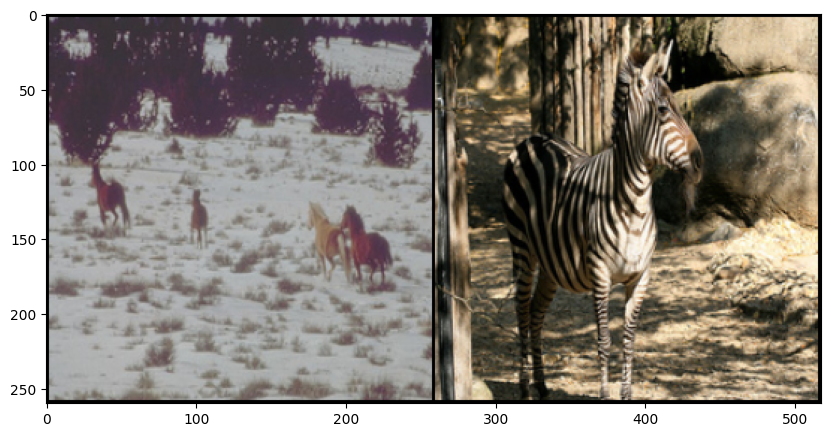

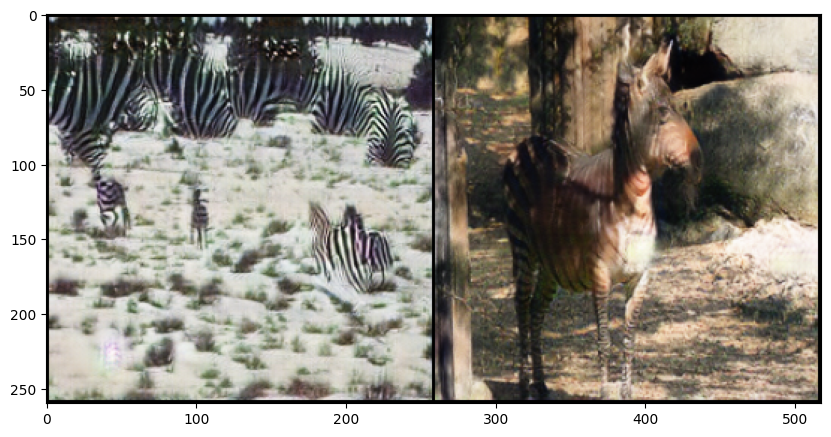

0.5451674461364746 + 0.4902456998825073 = 1.035413146018982
0.17057251930236816 + 0.05743499845266342 = 0.22800752520561218
0.04545968025922775 + 0.07755235582590103 = 0.12301203608512878
gen_loss: 2.288334369659424 fake_A: tensor([[[[ 0.5835,  0.4832,  0.5208,  ...,  0.4266,  0.4868,  0.4064],
          [ 0.5089,  0.4542,  0.5080,  ...,  0.4075,  0.4504,  0.3638],
          [ 0.3674,  0.3853,  0.5475,  ...,  0.3084,  0.2598,  0.2263],
          ...,
          [ 0.3815,  0.5713,  0.6443,  ...,  0.4105,  0.4601,  0.3955],
          [ 0.4269,  0.5104,  0.5535,  ...,  0.4901,  0.4454,  0.3685],
          [ 0.5127,  0.5687,  0.5110,  ...,  0.3412,  0.4285,  0.3575]],

         [[ 0.6141,  0.5443,  0.5590,  ...,  0.5363,  0.5793,  0.4724],
          [ 0.5532,  0.4662,  0.4887,  ...,  0.5279,  0.5885,  0.4686],
          [ 0.4274,  0.4189,  0.5411,  ...,  0.4325,  0.4296,  0.3527],
          ...,
          [ 0.2986,  0.5183,  0.5689,  ...,  0.3710,  0.3850,  0.3400],
          [ 0.2793,  0.4

0.45219969749450684 + 0.38173189759254456 = 0.833931565284729
0.14183184504508972 + 0.21206478774547577 = 0.3538966178894043
0.05577017366886139 + 0.053104013204574585 = 0.10887418687343597
gen_loss: 1.9580631256103516 fake_A: tensor([[[[0.9714, 0.9651, 0.9627,  ..., 0.9540, 0.9612, 0.9651],
          [0.9687, 0.9642, 0.9649,  ..., 0.9570, 0.9680, 0.9689],
          [0.9697, 0.9610, 0.9627,  ..., 0.9649, 0.9719, 0.9638],
          ...,
          [0.9018, 0.8733, 0.8845,  ..., 0.8238, 0.8084, 0.8240],
          [0.8733, 0.8680, 0.8707,  ..., 0.8164, 0.7656, 0.7548],
          [0.8809, 0.8650, 0.8721,  ..., 0.7665, 0.7477, 0.7226]],

         [[0.9575, 0.9632, 0.9602,  ..., 0.9344, 0.9337, 0.9476],
          [0.9498, 0.9549, 0.9579,  ..., 0.9315, 0.9340, 0.9457],
          [0.9550, 0.9559, 0.9548,  ..., 0.9360, 0.9440, 0.9398],
          ...,
          [0.8416, 0.8108, 0.8249,  ..., 0.7452, 0.7312, 0.7524],
          [0.8052, 0.7985, 0.8169,  ..., 0.7611, 0.7016, 0.6825],
          [0.83

0.47025439143180847 + 0.6443694829940796 = 1.1146239042282104
0.11948966234922409 + 0.31539440155029297 = 0.43488407135009766
0.04862193390727043 + 0.07093551009893417 = 0.1195574402809143
gen_loss: 2.353686809539795 fake_A: tensor([[[[ 0.5868,  0.5172,  0.5410,  ...,  0.5096,  0.4960,  0.4947],
          [ 0.5319,  0.4777,  0.4945,  ...,  0.4361,  0.5004,  0.5196],
          [ 0.5054,  0.4697,  0.4774,  ...,  0.4929,  0.5319,  0.5379],
          ...,
          [ 0.4853,  0.3542,  0.3216,  ...,  0.4580,  0.4628,  0.5604],
          [ 0.5016,  0.3777,  0.4028,  ...,  0.5690,  0.5045,  0.5635],
          [ 0.5942,  0.5270,  0.5243,  ...,  0.5173,  0.5058,  0.5466]],

         [[ 0.4767,  0.4261,  0.4440,  ...,  0.5096,  0.4996,  0.5165],
          [ 0.3952,  0.3453,  0.3714,  ...,  0.4399,  0.5205,  0.5357],
          [ 0.3665,  0.3409,  0.3533,  ...,  0.4760,  0.5342,  0.5363],
          ...,
          [ 0.5548,  0.4416,  0.3918,  ...,  0.3324,  0.3518,  0.4644],
          [ 0.5599,  0.

0.63930344581604 + 0.39690878987312317 = 1.0362122058868408
0.09772007912397385 + 0.21249531209468842 = 0.31021538376808167
0.11943018436431885 + 0.06314544379711151 = 0.18257562816143036
gen_loss: 2.8929901123046875 fake_A: tensor([[[[ 0.9302,  0.9248,  0.9290,  ...,  0.9064,  0.9076,  0.8979],
          [ 0.9242,  0.9186,  0.9221,  ...,  0.9018,  0.9025,  0.8965],
          [ 0.9241,  0.9173,  0.9219,  ...,  0.9071,  0.9047,  0.8932],
          ...,
          [ 0.5507,  0.6124,  0.6363,  ..., -0.9445, -0.9400, -0.9248],
          [ 0.6112,  0.6594,  0.5592,  ..., -0.9370, -0.9249, -0.9263],
          [ 0.5410,  0.5919,  0.4889,  ..., -0.9320, -0.8957, -0.9024]],

         [[ 0.9602,  0.9621,  0.9645,  ...,  0.9494,  0.9502,  0.9502],
          [ 0.9568,  0.9558,  0.9600,  ...,  0.9432,  0.9481,  0.9510],
          [ 0.9588,  0.9594,  0.9601,  ...,  0.9500,  0.9493,  0.9495],
          ...,
          [ 0.5777,  0.6674,  0.6639,  ..., -0.9106, -0.8998, -0.8855],
          [ 0.6006,  0.

0.5994582176208496 + 0.5902978181838989 = 1.1897560358047485
0.1620522290468216 + 0.07884237170219421 = 0.2408946007490158
0.0927601158618927 + 0.07834511250257492 = 0.17110523581504822
gen_loss: 2.9248979091644287 fake_A: tensor([[[[ 0.3937,  0.3433,  0.2802,  ...,  0.1660,  0.0135, -0.0460],
          [ 0.3126,  0.2815,  0.2903,  ...,  0.0876, -0.1163, -0.1277],
          [ 0.3369,  0.2990,  0.2799,  ..., -0.0717, -0.2198, -0.1714],
          ...,
          [ 0.7630,  0.7534,  0.6876,  ...,  0.7674,  0.8008,  0.8251],
          [ 0.7376,  0.7081,  0.6747,  ...,  0.8325,  0.8227,  0.8110],
          [ 0.5964,  0.5440,  0.5492,  ...,  0.7954,  0.8249,  0.7995]],

         [[ 0.1533,  0.1395,  0.0882,  ...,  0.1689, -0.0433, -0.0993],
          [ 0.1021,  0.1019,  0.1062,  ...,  0.0556, -0.1539, -0.1946],
          [ 0.1287,  0.1437,  0.1096,  ..., -0.1744, -0.2654, -0.2160],
          ...,
          [ 0.7889,  0.7906,  0.7579,  ...,  0.8770,  0.8625,  0.8882],
          [ 0.7326,  0.71

0.6202096939086914 + 0.2479318380355835 = 0.8681415319442749
0.12321364134550095 + 0.10588729381561279 = 0.22910094261169434
0.049880944192409515 + 0.08800286054611206 = 0.13788381218910217
gen_loss: 2.2698898315429688 fake_A: tensor([[[[ 0.1409,  0.1704,  0.1231,  ...,  0.1209,  0.0736,  0.0060],
          [ 0.0275,  0.0591,  0.0768,  ...,  0.0269,  0.0277, -0.0118],
          [-0.0320, -0.0504, -0.0317,  ..., -0.1207, -0.1121, -0.1261],
          ...,
          [ 0.6263,  0.6169,  0.6194,  ...,  0.4877,  0.4504,  0.4627],
          [ 0.6369,  0.6175,  0.6105,  ...,  0.4073,  0.4328,  0.4642],
          [ 0.6806,  0.6643,  0.6294,  ...,  0.4502,  0.4966,  0.5163]],

         [[ 0.1510,  0.1612,  0.0925,  ...,  0.1969,  0.1523,  0.1672],
          [ 0.0940,  0.0890,  0.0989,  ...,  0.1440,  0.1859,  0.1783],
          [ 0.0792,  0.0382,  0.0129,  ...,  0.0632,  0.0787,  0.1208],
          ...,
          [ 0.7054,  0.7034,  0.6987,  ...,  0.5870,  0.5539,  0.5655],
          [ 0.7299,  

0.4788721203804016 + 0.5662150979042053 = 1.045087218284607
0.15500912070274353 + 0.1068144291639328 = 0.26182353496551514
0.05563824623823166 + 0.08690042793750763 = 0.1425386667251587
gen_loss: 2.4966561794281006 fake_A: tensor([[[[ 0.5742,  0.5619,  0.5114,  ...,  0.4779,  0.5475,  0.5464],
          [ 0.5293,  0.5097,  0.4973,  ...,  0.4587,  0.5346,  0.5656],
          [ 0.4855,  0.4794,  0.4760,  ...,  0.4698,  0.4580,  0.5068],
          ...,
          [ 0.1921,  0.1730,  0.0874,  ...,  0.4399,  0.3311,  0.1548],
          [ 0.2126,  0.2054,  0.1725,  ...,  0.3121,  0.1604,  0.0594],
          [ 0.2129,  0.2068,  0.1800,  ...,  0.1323,  0.1092,  0.0234]],

         [[ 0.5675,  0.5631,  0.5297,  ...,  0.5198,  0.5580,  0.5718],
          [ 0.5301,  0.4940,  0.4738,  ...,  0.4887,  0.5447,  0.5743],
          [ 0.4651,  0.4511,  0.4426,  ...,  0.5017,  0.4732,  0.5201],
          ...,
          [ 0.1157,  0.1051,  0.0387,  ...,  0.4102,  0.3003,  0.1192],
          [ 0.0977,  0.11

0.3842914402484894 + 0.401109904050827 = 0.7854013442993164
0.1485138088464737 + 0.08966758847236633 = 0.23818139731884003
0.08095413446426392 + 0.10781888663768768 = 0.1887730211019516
gen_loss: 2.6969497203826904 fake_A: tensor([[[[ 0.5779,  0.4585,  0.5405,  ..., -0.4627, -0.5319, -0.3134],
          [ 0.5299,  0.4555,  0.5196,  ..., -0.5182, -0.4853, -0.2698],
          [ 0.5395,  0.4664,  0.5515,  ..., -0.2331, -0.1356, -0.0742],
          ...,
          [-0.1878, -0.1487, -0.1301,  ..., -0.3972, -0.3808, -0.3682],
          [-0.2038, -0.1870, -0.1613,  ..., -0.4330, -0.4061, -0.3756],
          [-0.2594, -0.2446, -0.2467,  ..., -0.4807, -0.3925, -0.3974]],

         [[ 0.4985,  0.3470,  0.4273,  ..., -0.3525, -0.4588, -0.3122],
          [ 0.4237,  0.3067,  0.3498,  ..., -0.3884, -0.4111, -0.2291],
          [ 0.4468,  0.2881,  0.3772,  ..., -0.2063, -0.0913, -0.0707],
          ...,
          [-0.3219, -0.3067, -0.2919,  ..., -0.4069, -0.4084, -0.4003],
          [-0.3351, -0.32

0.4637017846107483 + 0.368854284286499 = 0.8325560688972473
0.13898596167564392 + 0.10339837521314621 = 0.24238434433937073
0.08304112404584885 + 0.08435644954442978 = 0.16739757359027863
gen_loss: 2.5307703018188477 fake_A: tensor([[[[-0.7920, -0.8066, -0.8135,  ..., -0.3908, -0.4930, -0.5353],
          [-0.8013, -0.8056, -0.8241,  ..., -0.4502, -0.5445, -0.5672],
          [-0.7924, -0.8037, -0.8359,  ..., -0.5529, -0.5821, -0.5878],
          ...,
          [-0.1336, -0.0307,  0.0213,  ...,  0.2911,  0.3081,  0.2641],
          [-0.1567, -0.1433, -0.0942,  ...,  0.2521,  0.2342,  0.1833],
          [ 0.0444,  0.0455, -0.0231,  ...,  0.2510,  0.2482,  0.1706]],

         [[-0.6784, -0.6781, -0.7028,  ..., -0.5040, -0.6027, -0.6661],
          [-0.7222, -0.7072, -0.7319,  ..., -0.5739, -0.6469, -0.7058],
          [-0.7482, -0.7335, -0.7763,  ..., -0.6458, -0.6804, -0.7127],
          ...,
          [-0.0140, -0.0252,  0.0046,  ...,  0.3985,  0.3786,  0.2891],
          [-0.0193, -0.

0.6024751663208008 + 0.6681718826293945 = 1.2706470489501953
0.11319844424724579 + 0.0703885555267334 = 0.1835869997739792
0.07044662535190582 + 0.09587564319372177 = 0.166322261095047
gen_loss: 2.952228307723999 fake_A: tensor([[[[-0.6744, -0.6920, -0.7616,  ..., -0.6715, -0.7247, -0.7348],
          [-0.6303, -0.5836, -0.7602,  ..., -0.7663, -0.7955, -0.7648],
          [-0.6803, -0.6681, -0.7613,  ..., -0.8215, -0.8125, -0.8115],
          ...,
          [-0.1897, -0.2831, -0.3138,  ...,  0.1891,  0.1395,  0.1719],
          [-0.1326, -0.2698, -0.2257,  ...,  0.1402,  0.0953,  0.1106],
          [-0.1081, -0.1759, -0.1737,  ...,  0.2135,  0.2200,  0.1872]],

         [[-0.6131, -0.4652, -0.5334,  ..., -0.6708, -0.6657, -0.6489],
          [-0.5519, -0.3893, -0.5856,  ..., -0.6726, -0.6427, -0.6322],
          [-0.6201, -0.5336, -0.6358,  ..., -0.6890, -0.6661, -0.6728],
          ...,
          [-0.3046, -0.3546, -0.3854,  ...,  0.2295,  0.1694,  0.2053],
          [-0.2568, -0.3288

0.43534284830093384 + 0.336156964302063 = 0.7714998126029968
0.127958744764328 + 0.13201066851615906 = 0.25996941328048706
0.10740828514099121 + 0.06404944509267807 = 0.17145773768424988
gen_loss: 2.5120742321014404 fake_A: tensor([[[[0.9205, 0.9226, 0.9156,  ..., 0.9560, 0.9565, 0.9608],
          [0.9303, 0.9337, 0.9325,  ..., 0.9547, 0.9620, 0.9641],
          [0.9355, 0.9363, 0.9341,  ..., 0.9615, 0.9614, 0.9484],
          ...,
          [0.8411, 0.8430, 0.8932,  ..., 0.8758, 0.8661, 0.7999],
          [0.7982, 0.8209, 0.8668,  ..., 0.7767, 0.7481, 0.7403],
          [0.8509, 0.8624, 0.8801,  ..., 0.6267, 0.5681, 0.6301]],

         [[0.9202, 0.9288, 0.9152,  ..., 0.9439, 0.9387, 0.9482],
          [0.9318, 0.9352, 0.9300,  ..., 0.9373, 0.9389, 0.9473],
          [0.9425, 0.9439, 0.9353,  ..., 0.9468, 0.9408, 0.9319],
          ...,
          [0.7352, 0.7536, 0.8198,  ..., 0.8221, 0.8317, 0.7721],
          [0.6452, 0.6970, 0.7729,  ..., 0.7083, 0.6887, 0.7170],
          [0.7305,

0.5427491664886475 + 0.2384345829486847 = 0.7811837196350098
0.1290174126625061 + 0.12919750809669495 = 0.25821492075920105
0.05317752808332443 + 0.08040426671504974 = 0.13358178734779358
gen_loss: 2.1428229808807373 fake_A: tensor([[[[ 0.0892,  0.1007,  0.0986,  ...,  0.1205,  0.1313,  0.1479],
          [ 0.1032,  0.0973,  0.1109,  ...,  0.1355,  0.1161,  0.1519],
          [ 0.1050,  0.0961,  0.1248,  ...,  0.1299,  0.1659,  0.1886],
          ...,
          [-0.3593, -0.3851, -0.3039,  ..., -0.3265, -0.2854, -0.3170],
          [-0.3968, -0.4113, -0.3508,  ..., -0.3588, -0.3187, -0.3277],
          [-0.4043, -0.4316, -0.3825,  ..., -0.3904, -0.3190, -0.3321]],

         [[ 0.4728,  0.4819,  0.4861,  ...,  0.4611,  0.4617,  0.4645],
          [ 0.4936,  0.4812,  0.4865,  ...,  0.4603,  0.4638,  0.4791],
          [ 0.4935,  0.4983,  0.5044,  ...,  0.4665,  0.4864,  0.5024],
          ...,
          [-0.2928, -0.3366, -0.2627,  ..., -0.1693, -0.1155, -0.1600],
          [-0.3359, -0.

0.49043259024620056 + 0.5699236989021301 = 1.0603562593460083
0.17194817960262299 + 0.1245734691619873 = 0.2965216636657715
0.06192588061094284 + 0.05578089877963066 = 0.1177067756652832
gen_loss: 2.267076015472412 fake_A: tensor([[[[-0.3297, -0.3252, -0.3205,  ...,  0.6585,  0.6821,  0.7057],
          [-0.3195, -0.2820, -0.2621,  ...,  0.6685,  0.6920,  0.7253],
          [-0.2745, -0.2440, -0.2231,  ...,  0.7173,  0.7168,  0.7283],
          ...,
          [ 0.1097,  0.0977,  0.1142,  ..., -0.6008, -0.5900, -0.5572],
          [ 0.1012,  0.0705,  0.0981,  ..., -0.6662, -0.6472, -0.5947],
          [ 0.1126,  0.0521,  0.0924,  ..., -0.6447, -0.6106, -0.5518]],

         [[-0.2242, -0.1941, -0.2013,  ...,  0.7269,  0.7344,  0.7576],
          [-0.1999, -0.1675, -0.1674,  ...,  0.7422,  0.7562,  0.7844],
          [-0.1767, -0.1275, -0.1175,  ...,  0.7735,  0.7791,  0.7949],
          ...,
          [ 0.1261,  0.1297,  0.1266,  ..., -0.4117, -0.3645, -0.3612],
          [ 0.1133,  0.08

0.5773584842681885 + 0.43939492106437683 = 1.0167534351348877
0.15279334783554077 + 0.17329975962638855 = 0.3260931074619293
0.09028667211532593 + 0.09476535022258759 = 0.1850520223379135
gen_loss: 2.8998830318450928 fake_A: tensor([[[[-0.7482, -0.7622, -0.7513,  ..., -0.6778, -0.7563, -0.7800],
          [-0.7678, -0.7698, -0.7627,  ..., -0.6656, -0.7595, -0.7896],
          [-0.7623, -0.7749, -0.7757,  ..., -0.7137, -0.7749, -0.7996],
          ...,
          [-0.4503, -0.5815, -0.7317,  ..., -0.6261, -0.6077, -0.5296],
          [-0.6079, -0.6784, -0.7315,  ..., -0.5590, -0.5644, -0.5451],
          [-0.6774, -0.6774, -0.6906,  ..., -0.6272, -0.5577, -0.5383]],

         [[-0.8614, -0.8535, -0.8468,  ..., -0.7160, -0.8130, -0.8133],
          [-0.8615, -0.8524, -0.8480,  ..., -0.6977, -0.7940, -0.8284],
          [-0.8539, -0.8471, -0.8467,  ..., -0.7433, -0.8078, -0.8266],
          ...,
          [-0.5114, -0.6189, -0.7608,  ..., -0.6591, -0.6266, -0.5424],
          [-0.7003, -0.

0.42632192373275757 + 0.431307315826416 = 0.8576292395591736
0.09432664513587952 + 0.06861232221126556 = 0.16293896734714508
0.05558820068836212 + 0.06621449440717697 = 0.12180269509553909
gen_loss: 2.0919501781463623 fake_A: tensor([[[[-0.3454, -0.2564, -0.1875,  ..., -0.0826, -0.0509, -0.0964],
          [-0.4559, -0.3838, -0.2570,  ..., -0.1067, -0.0143, -0.0024],
          [-0.5166, -0.5147, -0.3845,  ..., -0.1538,  0.1173,  0.0892],
          ...,
          [-0.5895, -0.5732, -0.7116,  ..., -0.4413, -0.4028, -0.3241],
          [-0.6064, -0.6144, -0.6705,  ..., -0.3934, -0.3829, -0.3377],
          [-0.5983, -0.5820, -0.6271,  ..., -0.2692, -0.2692, -0.2792]],

         [[-0.2831, -0.1799, -0.1256,  ..., -0.0029,  0.0444,  0.0136],
          [-0.3999, -0.3273, -0.2066,  ..., -0.0280,  0.1038,  0.1040],
          [-0.4557, -0.4469, -0.3197,  ..., -0.0686,  0.1948,  0.1738],
          ...,
          [-0.5577, -0.5521, -0.6916,  ..., -0.5221, -0.4636, -0.3769],
          [-0.6184, -0

0.3616866171360016 + 0.44474586844444275 = 0.8064324855804443
0.10353167355060577 + 0.11913217604160309 = 0.22266384959220886
0.09711258113384247 + 0.0702407956123352 = 0.16735337674617767
gen_loss: 2.502232551574707 fake_A: tensor([[[[-0.2300, -0.2515, -0.2967,  ...,  0.7675,  0.7239,  0.7750],
          [-0.2781, -0.2797, -0.2715,  ...,  0.7434,  0.6991,  0.7861],
          [-0.2675, -0.2730, -0.2283,  ...,  0.6129,  0.7099,  0.8019],
          ...,
          [-0.1751, -0.1468, -0.1751,  ..., -0.1833, -0.1253,  0.1140],
          [-0.0217, -0.0211, -0.0205,  ..., -0.0709,  0.0029,  0.1850],
          [ 0.2549,  0.2693,  0.2310,  ...,  0.2087,  0.2624,  0.3524]],

         [[-0.2196, -0.2499, -0.2745,  ...,  0.7956,  0.7521,  0.8063],
          [-0.2703, -0.3105, -0.2957,  ...,  0.7559,  0.7259,  0.7957],
          [-0.2522, -0.2982, -0.2595,  ...,  0.6329,  0.7272,  0.8110],
          ...,
          [-0.1227, -0.0675, -0.1220,  ..., -0.0594, -0.0329,  0.1946],
          [ 0.0088,  0.

0.5182384252548218 + 0.7635535597801208 = 1.2817919254302979
0.32041284441947937 + 0.2098756730556488 = 0.5302885174751282
0.09365043044090271 + 0.05836144834756851 = 0.15201187133789062
gen_loss: 2.8549394607543945 fake_A: tensor([[[[ 0.4926,  0.4712,  0.4862,  ..., -0.3629, -0.3234, -0.3726],
          [ 0.4836,  0.4591,  0.4778,  ..., -0.3619, -0.3400, -0.3867],
          [ 0.4707,  0.4640,  0.4890,  ..., -0.3671, -0.3922, -0.4350],
          ...,
          [ 0.2922,  0.2602,  0.2978,  ...,  0.2203,  0.2515,  0.2226],
          [ 0.3869,  0.3239,  0.3199,  ...,  0.2462,  0.2987,  0.2874],
          [ 0.5020,  0.4612,  0.4266,  ...,  0.2739,  0.3088,  0.2772]],

         [[ 0.6352,  0.6376,  0.6415,  ..., -0.2347, -0.1959, -0.2254],
          [ 0.6341,  0.6262,  0.6232,  ..., -0.2280, -0.1969, -0.2421],
          [ 0.6298,  0.6368,  0.6404,  ..., -0.2091, -0.2365, -0.2702],
          ...,
          [ 0.3258,  0.3089,  0.3232,  ...,  0.3870,  0.4230,  0.4179],
          [ 0.4037,  0.3

0.4096546769142151 + 0.6312206387519836 = 1.0408753156661987
0.13609418272972107 + 0.2033289074897766 = 0.3394230902194977
0.0643024891614914 + 0.0978836640715599 = 0.1621861457824707
gen_loss: 2.69667911529541 fake_A: tensor([[[[-0.3109, -0.2861, -0.1119,  ..., -0.1746, -0.2186, -0.2931],
          [-0.2921, -0.2757, -0.1599,  ..., -0.1956, -0.2042, -0.2886],
          [-0.2759, -0.3241, -0.3630,  ..., -0.2080, -0.2949, -0.4116],
          ...,
          [ 0.8414,  0.8318,  0.8365,  ...,  0.7135,  0.7072,  0.6936],
          [ 0.8313,  0.8175,  0.8369,  ...,  0.6972,  0.7164,  0.7023],
          [ 0.8648,  0.8487,  0.8483,  ...,  0.6928,  0.7454,  0.7357]],

         [[-0.1735, -0.1030,  0.0578,  ..., -0.0379, -0.1058, -0.1277],
          [-0.2121, -0.1998, -0.0374,  ..., -0.0702, -0.0677, -0.1238],
          [-0.2368, -0.2564, -0.2835,  ..., -0.0971, -0.1461, -0.2230],
          ...,
          [ 0.8726,  0.8770,  0.8824,  ...,  0.6886,  0.6829,  0.6655],
          [ 0.8639,  0.8719, 

0.48761269450187683 + 0.5608561038970947 = 1.048468828201294
0.18634049594402313 + 0.0655834972858429 = 0.25192397832870483
0.07229526340961456 + 0.056556280702352524 = 0.12885154783725739
gen_loss: 2.3621766567230225 fake_A: tensor([[[[-0.2011, -0.1604, -0.2587,  ..., -0.4873, -0.4853, -0.4899],
          [-0.3521, -0.3053, -0.3297,  ..., -0.4817, -0.4973, -0.4879],
          [-0.3839, -0.3755, -0.3599,  ..., -0.4800, -0.4940, -0.4756],
          ...,
          [-0.6486, -0.6450, -0.6836,  ..., -0.3787, -0.3932, -0.4119],
          [-0.6618, -0.6675, -0.6855,  ..., -0.3160, -0.3848, -0.4381],
          [-0.6781, -0.6822, -0.7033,  ..., -0.3324, -0.3586, -0.4272]],

         [[-0.1989, -0.1395, -0.2323,  ..., -0.4455, -0.4455, -0.4475],
          [-0.3252, -0.3006, -0.3269,  ..., -0.4418, -0.4582, -0.4601],
          [-0.3413, -0.3399, -0.3292,  ..., -0.4207, -0.4477, -0.4257],
          ...,
          [-0.6859, -0.6695, -0.7096,  ..., -0.3905, -0.3770, -0.3909],
          [-0.7023, -0

0.8891191482543945 + 0.33002394437789917 = 1.2191431522369385
0.14383411407470703 + 0.07510772347450256 = 0.2189418375492096
0.06916085630655289 + 0.0874268040060997 = 0.1565876603126526
gen_loss: 2.8069138526916504 fake_A: tensor([[[[-3.0478e-01, -4.3087e-01, -5.7569e-01,  ..., -7.1821e-01,
           -7.9399e-01, -7.8131e-01],
          [-3.2386e-01, -4.3239e-01, -5.9082e-01,  ..., -7.4053e-01,
           -8.1203e-01, -7.9000e-01],
          [-3.4884e-01, -4.4640e-01, -5.8577e-01,  ..., -7.9461e-01,
           -8.3696e-01, -8.1848e-01],
          ...,
          [ 5.1311e-01,  4.3224e-01,  3.1372e-01,  ...,  5.9943e-01,
            4.8987e-01,  5.2625e-01],
          [ 5.2941e-01,  4.4689e-01,  3.2558e-01,  ...,  5.7182e-01,
            4.4787e-01,  4.6301e-01],
          [ 4.8202e-01,  4.1925e-01,  3.4539e-01,  ...,  6.0397e-01,
            5.7780e-01,  5.6130e-01]],

         [[-4.6316e-01, -5.7897e-01, -6.9969e-01,  ..., -7.2826e-01,
           -8.1779e-01, -8.3333e-01],
          

0.40420398116111755 + 0.4542098343372345 = 0.858413815498352
0.1163717657327652 + 0.10110427439212799 = 0.2174760401248932
0.07812517881393433 + 0.06489357352256775 = 0.14301875233650208
gen_loss: 2.3103489875793457 fake_A: tensor([[[[ 0.6328,  0.6439,  0.6422,  ...,  0.3999,  0.4968,  0.5437],
          [ 0.6401,  0.6337,  0.6387,  ...,  0.3776,  0.4139,  0.4797],
          [ 0.6304,  0.6223,  0.6417,  ...,  0.3391,  0.3672,  0.4242],
          ...,
          [-0.0588, -0.1881, -0.2897,  ..., -0.0840, -0.1778, -0.2059],
          [-0.2328, -0.3048, -0.4053,  ..., -0.0390, -0.1261, -0.1590],
          [-0.3353, -0.3973, -0.3826,  ..., -0.1079, -0.1215, -0.1854]],

         [[ 0.7590,  0.7719,  0.7654,  ...,  0.6495,  0.7050,  0.7016],
          [ 0.7609,  0.7623,  0.7584,  ...,  0.6166,  0.6428,  0.6640],
          [ 0.7513,  0.7511,  0.7572,  ...,  0.5931,  0.6033,  0.6365],
          ...,
          [-0.1040, -0.2188, -0.2869,  ..., -0.0365, -0.1041, -0.1302],
          [-0.2157, -0.2

0.720870316028595 + 0.49133825302124023 = 1.2122085094451904
0.10218417644500732 + 0.11912056803703308 = 0.2213047444820404
0.09544341266155243 + 0.06091083213686943 = 0.15635424852371216
gen_loss: 2.797881603240967 fake_A: tensor([[[[-0.0493, -0.1165, -0.1208,  ..., -0.1998, -0.1341, -0.2207],
          [-0.0552, -0.1256, -0.1064,  ..., -0.1860, -0.1405, -0.2044],
          [-0.0598, -0.1579, -0.1340,  ..., -0.0635, -0.1405, -0.2500],
          ...,
          [-0.3467, -0.3261, -0.2442,  ..., -0.4444, -0.4429, -0.2787],
          [-0.3418, -0.3473, -0.2649,  ..., -0.4606, -0.4480, -0.3030],
          [-0.2817, -0.3056, -0.2420,  ..., -0.3790, -0.2679, -0.2061]],

         [[ 0.1329,  0.0752,  0.0856,  ...,  0.0864,  0.1395,  0.0620],
          [ 0.1195,  0.0509,  0.0579,  ...,  0.0910,  0.1293,  0.0523],
          [ 0.0964, -0.0012,  0.0142,  ...,  0.1595,  0.0741, -0.0062],
          ...,
          [-0.2282, -0.1806, -0.1035,  ..., -0.2275, -0.2421, -0.0142],
          [-0.2467, -0.2

0.4293239116668701 + 0.4991905391216278 = 0.9285144805908203
0.12059371173381805 + 0.10839295387268066 = 0.22898666560649872
0.0589851513504982 + 0.1050318032503128 = 0.1640169620513916
gen_loss: 2.591582775115967 fake_A: tensor([[[[ 0.2145,  0.0029, -0.0165,  ...,  0.1547,  0.1826,  0.1529],
          [-0.1459, -0.3294, -0.1680,  ...,  0.3508,  0.1637,  0.0848],
          [ 0.1228,  0.0175,  0.1004,  ...,  0.6595,  0.4580,  0.3061],
          ...,
          [ 0.2237,  0.1894,  0.3998,  ...,  0.5848,  0.5435,  0.4708],
          [ 0.3753,  0.3700,  0.4339,  ...,  0.3538,  0.3935,  0.3351],
          [ 0.4428,  0.4032,  0.4245,  ...,  0.0775,  0.2047,  0.2049]],

         [[ 0.0857, -0.0907, -0.0943,  ...,  0.0647,  0.0728,  0.0648],
          [-0.2425, -0.4163, -0.2302,  ...,  0.3367,  0.1356,  0.0600],
          [ 0.0264, -0.0891,  0.0505,  ...,  0.6602,  0.4351,  0.2823],
          ...,
          [ 0.3400,  0.3506,  0.4985,  ...,  0.5663,  0.5476,  0.4831],
          [ 0.4950,  0.501

0.26334553956985474 + 0.4017370045185089 = 0.665082573890686
0.12421716749668121 + 0.1465350240468979 = 0.2707521915435791
0.09942098706960678 + 0.05288199707865715 = 0.15230298042297363
gen_loss: 2.2151875495910645 fake_A: tensor([[[[ 9.7766e-01,  9.7377e-01,  9.7556e-01,  ...,  9.7940e-01,
            9.8320e-01,  9.8356e-01],
          [ 9.8054e-01,  9.7662e-01,  9.7637e-01,  ...,  9.8071e-01,
            9.8354e-01,  9.8409e-01],
          [ 9.7872e-01,  9.7659e-01,  9.7553e-01,  ...,  9.8148e-01,
            9.8283e-01,  9.7938e-01],
          ...,
          [ 7.7459e-02,  5.5348e-02, -2.7639e-02,  ...,  2.8072e-02,
            6.0533e-02,  1.3589e-01],
          [ 1.1390e-02, -8.6808e-03, -6.4185e-02,  ...,  8.9730e-02,
            4.7380e-02,  5.8118e-02],
          [-7.3080e-02, -9.8821e-02, -1.6241e-01,  ...,  8.0937e-02,
            9.1109e-02,  7.1505e-02]],

         [[ 9.8542e-01,  9.8359e-01,  9.8322e-01,  ...,  9.8561e-01,
            9.8642e-01,  9.8704e-01],
          

0.6146597266197205 + 0.5064705610275269 = 1.1211302280426025
0.16086840629577637 + 0.139902263879776 = 0.30077067017555237
0.06636503338813782 + 0.06443469226360321 = 0.13079972565174103
gen_loss: 2.45920467376709 fake_A: tensor([[[[-0.7257, -0.7282, -0.7318,  ..., -0.2905, -0.4414, -0.5937],
          [-0.7256, -0.7235, -0.7216,  ..., -0.3483, -0.4054, -0.5498],
          [-0.7192, -0.7332, -0.7315,  ..., -0.4920, -0.3618, -0.5002],
          ...,
          [-0.8274, -0.8163, -0.7781,  ..., -0.6637, -0.6512, -0.6585],
          [-0.8271, -0.8258, -0.8006,  ..., -0.6882, -0.6771, -0.6814],
          [-0.8293, -0.8228, -0.8201,  ..., -0.6909, -0.6857, -0.6861]],

         [[-0.8180, -0.8170, -0.8114,  ..., -0.2477, -0.4388, -0.5773],
          [-0.8050, -0.8033, -0.8000,  ..., -0.2794, -0.3490, -0.5258],
          [-0.7955, -0.7981, -0.7939,  ..., -0.4311, -0.2886, -0.4735],
          ...,
          [-0.8288, -0.8203, -0.7841,  ..., -0.6831, -0.6683, -0.6674],
          [-0.8335, -0.820

0.4189453125 + 0.4881056547164917 = 0.9070509672164917
0.11248668283224106 + 0.0754711851477623 = 0.18795786798000336
0.07351788878440857 + 0.08984821289777756 = 0.16336610913276672
gen_loss: 2.5595078468322754 fake_A: tensor([[[[0.9163, 0.8973, 0.8963,  ..., 0.6291, 0.5447, 0.5572],
          [0.9118, 0.9023, 0.9086,  ..., 0.6221, 0.5307, 0.5692],
          [0.9013, 0.9175, 0.9212,  ..., 0.6304, 0.5199, 0.5583],
          ...,
          [0.8986, 0.8968, 0.9053,  ..., 0.6272, 0.4942, 0.5021],
          [0.8823, 0.8802, 0.8900,  ..., 0.6497, 0.4711, 0.4275],
          [0.8143, 0.7803, 0.8013,  ..., 0.6619, 0.5410, 0.4783]],

         [[0.9144, 0.9080, 0.9011,  ..., 0.5856, 0.5090, 0.5769],
          [0.9154, 0.9097, 0.9054,  ..., 0.5812, 0.4837, 0.5655],
          [0.9137, 0.9301, 0.9193,  ..., 0.5974, 0.4795, 0.5809],
          ...,
          [0.8211, 0.8404, 0.8624,  ..., 0.5711, 0.4289, 0.4695],
          [0.8238, 0.8341, 0.8604,  ..., 0.6143, 0.4262, 0.4234],
          [0.7327, 0.75

0.3523521423339844 + 0.5072012543678284 = 0.8595533967018127
0.12568989396095276 + 0.2080395668745041 = 0.33372944593429565
0.0742807686328888 + 0.09676039218902588 = 0.17104116082191467
gen_loss: 2.6033377647399902 fake_A: tensor([[[[ 0.2515,  0.2062, -0.0113,  ...,  0.1565,  0.3962,  0.3666],
          [ 0.1476,  0.1788,  0.1583,  ...,  0.0764,  0.1822,  0.1978],
          [ 0.0635,  0.0189,  0.1237,  ...,  0.1600,  0.1058,  0.1210],
          ...,
          [-0.7667, -0.8293, -0.7374,  ..., -0.8443, -0.8285, -0.8175],
          [-0.8131, -0.8311, -0.7867,  ..., -0.8423, -0.8467, -0.8441],
          [-0.8163, -0.8141, -0.8059,  ..., -0.8618, -0.8391, -0.8356]],

         [[ 0.1926,  0.1796, -0.0233,  ...,  0.2174,  0.4329,  0.4053],
          [ 0.1201,  0.1324,  0.1410,  ...,  0.1461,  0.2523,  0.2728],
          [ 0.0554,  0.0272,  0.0930,  ...,  0.2542,  0.2064,  0.2036],
          ...,
          [-0.8054, -0.8569, -0.7736,  ..., -0.8900, -0.8764, -0.8736],
          [-0.8378, -0.8

0.44291168451309204 + 0.3921140730381012 = 0.8350257873535156
0.19105808436870575 + 0.08232483267784119 = 0.27338290214538574
0.05912008881568909 + 0.04671848937869072 = 0.1058385819196701
gen_loss: 1.9207499027252197 fake_A: tensor([[[[-0.8613, -0.8371, -0.7400,  ..., -0.9227, -0.9266, -0.9269],
          [-0.8421, -0.8005, -0.6949,  ..., -0.9075, -0.9153, -0.9156],
          [-0.8277, -0.7845, -0.6313,  ..., -0.9006, -0.9097, -0.9115],
          ...,
          [ 0.1195,  0.0375,  0.0057,  ..., -0.5743, -0.5991, -0.6200],
          [ 0.1451,  0.1004, -0.0471,  ..., -0.5822, -0.5823, -0.6252],
          [ 0.0685,  0.0116, -0.0619,  ..., -0.6417, -0.5933, -0.6393]],

         [[-0.8214, -0.7936, -0.7112,  ..., -0.9099, -0.9154, -0.9162],
          [-0.7920, -0.7512, -0.6599,  ..., -0.8886, -0.8974, -0.9038],
          [-0.7801, -0.7249, -0.6011,  ..., -0.8716, -0.8874, -0.9003],
          ...,
          [ 0.0264, -0.0532, -0.0618,  ..., -0.6186, -0.6441, -0.6523],
          [ 0.1000,  0

0.19803565740585327 + 0.34322261810302734 = 0.5412582755088806
0.11924886703491211 + 0.14559754729270935 = 0.26484641432762146
0.054262347519397736 + 0.08774451911449432 = 0.14200687408447266
gen_loss: 1.9878116846084595 fake_A: tensor([[[[ 0.1951,  0.0984,  0.1390,  ..., -0.7703, -0.7767, -0.7542],
          [ 0.2193,  0.2138,  0.2502,  ..., -0.7453, -0.7304, -0.6947],
          [ 0.0836,  0.1570,  0.2367,  ..., -0.7091, -0.7054, -0.6846],
          ...,
          [-0.4262, -0.3798, -0.3440,  ..., -0.5349, -0.5040, -0.4458],
          [-0.4675, -0.4074, -0.3718,  ..., -0.6050, -0.5761, -0.5245],
          [-0.5243, -0.4812, -0.4792,  ..., -0.6315, -0.5696, -0.5466]],

         [[ 0.3862,  0.3194,  0.3710,  ..., -0.6036, -0.6820, -0.6533],
          [ 0.4415,  0.4303,  0.4276,  ..., -0.5650, -0.6096, -0.5851],
          [ 0.2886,  0.3504,  0.3946,  ..., -0.5041, -0.5561, -0.5692],
          ...,
          [-0.2935, -0.2203, -0.1585,  ..., -0.3122, -0.2298, -0.1605],
          [-0.3726,

0.39736658334732056 + 0.6273901462554932 = 1.024756669998169
0.16321249306201935 + 0.08312192559242249 = 0.24633441865444183
0.059922974556684494 + 0.05356950685381889 = 0.11349248141050339
gen_loss: 2.184314727783203 fake_A: tensor([[[[-0.7739, -0.7838, -0.7878,  ...,  0.7756,  0.7912,  0.7858],
          [-0.7504, -0.7298, -0.7414,  ...,  0.7812,  0.7791,  0.7892],
          [-0.7608, -0.7470, -0.7582,  ...,  0.7649,  0.7858,  0.7971],
          ...,
          [-0.6811, -0.6754, -0.6946,  ..., -0.7739, -0.7380, -0.7228],
          [-0.7087, -0.7103, -0.7121,  ..., -0.7914, -0.7441, -0.7326],
          [-0.7261, -0.7263, -0.7251,  ..., -0.8029, -0.7270, -0.7290]],

         [[-0.6373, -0.6363, -0.6639,  ...,  0.7896,  0.7968,  0.7972],
          [-0.6105, -0.6035, -0.6172,  ...,  0.7964,  0.7976,  0.8042],
          [-0.6189, -0.5885, -0.6234,  ...,  0.7766,  0.7913,  0.8111],
          ...,
          [-0.7721, -0.7768, -0.7866,  ..., -0.6600, -0.6267, -0.6111],
          [-0.8032, -0

0.4893079996109009 + 0.37279045581817627 = 0.8620984554290771
0.10836781561374664 + 0.08555065840482712 = 0.19391846656799316
0.07619538903236389 + 0.06467306613922119 = 0.14086845517158508
gen_loss: 2.290174722671509 fake_A: tensor([[[[-0.2821, -0.2533, -0.2562,  ..., -0.2115, -0.2480, -0.2945],
          [-0.2869, -0.2708, -0.2802,  ..., -0.2291, -0.2275, -0.2441],
          [-0.2670, -0.3101, -0.2957,  ..., -0.2494, -0.2373, -0.2611],
          ...,
          [-0.5045, -0.5313, -0.4024,  ..., -0.3925, -0.4142, -0.3137],
          [-0.4154, -0.4092, -0.2489,  ..., -0.5706, -0.5519, -0.4420],
          [-0.3746, -0.3698, -0.3207,  ..., -0.6829, -0.5833, -0.5161]],

         [[-0.1088, -0.0704, -0.0663,  ...,  0.0853,  0.0283,  0.0091],
          [-0.1105, -0.0994, -0.1251,  ...,  0.0703,  0.0677,  0.0536],
          [-0.0811, -0.1238, -0.1089,  ...,  0.0676,  0.0739,  0.0516],
          ...,
          [-0.4004, -0.4327, -0.3262,  ..., -0.2694, -0.2521, -0.1301],
          [-0.3034, -0

0.44070112705230713 + 0.4845626652240753 = 0.9252637624740601
0.16406971216201782 + 0.23493215441703796 = 0.3990018665790558
0.053115155547857285 + 0.098047636449337 = 0.151162788271904
gen_loss: 2.4767918586730957 fake_A: tensor([[[[ 0.8462,  0.8464,  0.8509,  ...,  0.8408,  0.8475,  0.8546],
          [ 0.8428,  0.8356,  0.8397,  ...,  0.8304,  0.8331,  0.8499],
          [ 0.8356,  0.8232,  0.8334,  ...,  0.8417,  0.8352,  0.8311],
          ...,
          [ 0.3214,  0.3445,  0.3767,  ...,  0.1880,  0.1277,  0.1059],
          [ 0.3377,  0.3595,  0.3281,  ...,  0.2549,  0.2787,  0.1747],
          [ 0.2867,  0.3245,  0.2760,  ...,  0.1750,  0.2371,  0.1320]],

         [[ 0.8684,  0.8727,  0.8763,  ...,  0.8607,  0.8698,  0.8734],
          [ 0.8627,  0.8649,  0.8695,  ...,  0.8517,  0.8624,  0.8808],
          [ 0.8725,  0.8697,  0.8682,  ...,  0.8746,  0.8686,  0.8684],
          ...,
          [ 0.1034,  0.1191,  0.1390,  ...,  0.0430, -0.0155, -0.0583],
          [ 0.1135,  0.16

0.6367098093032837 + 0.4312364459037781 = 1.067946195602417
0.15513017773628235 + 0.3305676579475403 = 0.48569783568382263
0.17245982587337494 + 0.08146446198225021 = 0.25392428040504456
gen_loss: 3.655758857727051 fake_A: tensor([[[[-0.1335, -0.2138, -0.2468,  ...,  0.1958, -0.0447, -0.0161],
          [-0.2852, -0.3600, -0.3757,  ...,  0.3158,  0.1605,  0.1860],
          [-0.2913, -0.3399, -0.3454,  ..., -0.0068,  0.1461,  0.1692],
          ...,
          [-0.0288, -0.0560, -0.0581,  ...,  0.1380,  0.2169,  0.1150],
          [-0.0049, -0.0427, -0.0332,  ...,  0.0319,  0.1468,  0.1511],
          [ 0.0218, -0.0091, -0.0082,  ..., -0.0554,  0.0553,  0.1062]],

         [[-0.1350, -0.2059, -0.2089,  ...,  0.3834,  0.1812,  0.1743],
          [-0.2511, -0.3558, -0.3655,  ...,  0.5238,  0.3889,  0.3875],
          [-0.2762, -0.2938, -0.3208,  ...,  0.2331,  0.3875,  0.3604],
          ...,
          [-0.1268, -0.0862, -0.0829,  ...,  0.3398,  0.3194,  0.1915],
          [-0.1554, -0.09

0.7735129594802856 + 0.5285590887069702 = 1.3020720481872559
0.12130753695964813 + 0.10681378841400146 = 0.2281213253736496
0.05223625525832176 + 0.08008119463920593 = 0.132317453622818
gen_loss: 2.6480586528778076 fake_A: tensor([[[[-0.4612, -0.6255, -0.6739,  ..., -0.3342, -0.3810, -0.4472],
          [-0.6638, -0.7278, -0.7455,  ..., -0.2743, -0.3618, -0.4041],
          [-0.7456, -0.8144, -0.7622,  ..., -0.3934, -0.3778, -0.4217],
          ...,
          [ 0.1337,  0.1524,  0.2819,  ...,  0.1688,  0.3041,  0.4300],
          [ 0.3647,  0.3036,  0.3051,  ...,  0.3228,  0.3623,  0.4089],
          [ 0.3208,  0.1788,  0.1775,  ...,  0.2999,  0.4898,  0.4762]],

         [[-0.3783, -0.5776, -0.6675,  ..., -0.2758, -0.3332, -0.3499],
          [-0.6709, -0.7312, -0.7749,  ..., -0.1961, -0.2974, -0.3209],
          [-0.7370, -0.8057, -0.7631,  ..., -0.3455, -0.3616, -0.3550],
          ...,
          [ 0.0478,  0.0512,  0.2165,  ...,  0.0457,  0.1536,  0.2860],
          [ 0.3028,  0.21

0.6787102222442627 + 0.3458813428878784 = 1.0245915651321411
0.22052256762981415 + 0.074342742562294 = 0.29486531019210815
0.08149593323469162 + 0.08021289110183716 = 0.16170883178710938
gen_loss: 2.67116641998291 fake_A: tensor([[[[-0.0666, -0.0884, -0.0952,  ...,  0.6338,  0.6339,  0.6392],
          [-0.1490, -0.1485, -0.1697,  ...,  0.6320,  0.6338,  0.6573],
          [-0.2502, -0.2461, -0.2486,  ...,  0.6430,  0.6656,  0.6603],
          ...,
          [ 0.4797,  0.4806,  0.5161,  ...,  0.6247,  0.4896,  0.5119],
          [ 0.4016,  0.3696,  0.3994,  ...,  0.6303,  0.4787,  0.4734],
          [ 0.3758,  0.3082,  0.3620,  ...,  0.6283,  0.5564,  0.5330]],

         [[ 0.0432,  0.0123,  0.0086,  ...,  0.5084,  0.5240,  0.5531],
          [-0.0197, -0.0559, -0.0807,  ...,  0.5016,  0.5307,  0.5636],
          [-0.1055, -0.1058, -0.1370,  ...,  0.5143,  0.5295,  0.5439],
          ...,
          [ 0.3118,  0.3109,  0.3165,  ...,  0.3431,  0.2146,  0.2776],
          [ 0.2118,  0.162

0.42996010184288025 + 0.33297625184059143 = 0.7629363536834717
0.13753269612789154 + 0.18549668788909912 = 0.32302939891815186
0.06879981607198715 + 0.061501577496528625 = 0.13030138611793518
gen_loss: 2.098253011703491 fake_A: tensor([[[[ 0.0453,  0.1108,  0.1011,  ...,  0.3839, -0.1574, -0.3485],
          [ 0.0928,  0.0969,  0.0806,  ..., -0.1567, -0.3656, -0.3963],
          [ 0.1061,  0.1147,  0.1126,  ..., -0.4729, -0.4649, -0.4849],
          ...,
          [-0.8174, -0.8054, -0.8461,  ..., -0.7668, -0.7616, -0.7566],
          [-0.8323, -0.8245, -0.8484,  ..., -0.7748, -0.7566, -0.7460],
          [-0.8021, -0.7858, -0.8129,  ..., -0.7718, -0.7462, -0.7531]],

         [[ 0.7334,  0.7501,  0.7459,  ...,  0.4430, -0.1015, -0.2555],
          [ 0.7296,  0.7324,  0.7150,  ..., -0.0868, -0.2801, -0.3483],
          [ 0.7349,  0.7238,  0.7339,  ..., -0.3968, -0.3791, -0.4292],
          ...,
          [-0.7780, -0.7674, -0.8223,  ..., -0.6931, -0.6946, -0.7041],
          [-0.8136, 

0.3925618827342987 + 0.4597437381744385 = 0.8523056507110596
0.10246659815311432 + 0.09210996329784393 = 0.19457656145095825
0.09068933129310608 + 0.0885164737701416 = 0.17920580506324768
gen_loss: 2.663821220397949 fake_A: tensor([[[[ 0.9716,  0.9684,  0.9683,  ...,  0.9568,  0.9569,  0.9567],
          [ 0.9684,  0.9662,  0.9674,  ...,  0.9553,  0.9562,  0.9519],
          [ 0.9687,  0.9660,  0.9668,  ...,  0.9580,  0.9566,  0.9481],
          ...,
          [-0.4406, -0.4680, -0.4689,  ..., -0.5890, -0.5723, -0.5823],
          [-0.4447, -0.4496, -0.4664,  ..., -0.6034, -0.5868, -0.5949],
          [-0.4715, -0.4744, -0.4943,  ..., -0.5974, -0.5821, -0.5848]],

         [[ 0.9774,  0.9786,  0.9782,  ...,  0.9669,  0.9679,  0.9695],
          [ 0.9766,  0.9781,  0.9796,  ...,  0.9678,  0.9686,  0.9688],
          [ 0.9790,  0.9812,  0.9796,  ...,  0.9715,  0.9697,  0.9648],
          ...,
          [-0.5095, -0.5249, -0.5100,  ..., -0.6127, -0.5955, -0.6182],
          [-0.5444, -0.5

0.4364964962005615 + 0.3495923578739166 = 0.7860888242721558
0.12097375839948654 + 0.10165738314390182 = 0.22263114154338837
0.08474671840667725 + 0.06729783862829208 = 0.15204456448554993
gen_loss: 2.3287975788116455 fake_A: tensor([[[[ 0.6465,  0.6035,  0.6239,  ...,  0.7895,  0.7539,  0.6957],
          [ 0.5713,  0.5360,  0.5506,  ...,  0.6879,  0.6854,  0.6772],
          [ 0.5777,  0.5703,  0.5787,  ...,  0.6145,  0.6677,  0.6646],
          ...,
          [-0.1669, -0.2434, -0.2830,  ..., -0.3726, -0.3350, -0.2099],
          [-0.2160, -0.2553, -0.3058,  ..., -0.3942, -0.3621, -0.2263],
          [-0.3299, -0.3846, -0.3530,  ..., -0.4132, -0.3430, -0.2352]],

         [[ 0.6541,  0.6162,  0.6241,  ...,  0.7801,  0.7369,  0.6959],
          [ 0.5759,  0.5460,  0.5571,  ...,  0.6651,  0.6539,  0.6541],
          [ 0.5986,  0.5783,  0.5762,  ...,  0.6040,  0.6292,  0.6538],
          ...,
          [ 0.2343,  0.1467,  0.0729,  ..., -0.0933, -0.0185,  0.1115],
          [ 0.1236,  0

0.4413439631462097 + 0.35534608364105225 = 0.796690046787262
0.1971747726202011 + 0.0944121927022934 = 0.2915869653224945
0.07023343443870544 + 0.058750562369823456 = 0.1289840042591095
gen_loss: 2.1156888008117676 fake_A: tensor([[[[ 0.8102,  0.8300,  0.8299,  ...,  0.9543,  0.9651,  0.9655],
          [ 0.7394,  0.7613,  0.7565,  ...,  0.9599,  0.9732,  0.9729],
          [ 0.2887,  0.2836,  0.3968,  ...,  0.9660,  0.9765,  0.9703],
          ...,
          [-0.1756, -0.1998, -0.2047,  ...,  0.9387,  0.9341,  0.9330],
          [-0.1750, -0.2238, -0.2041,  ...,  0.9407,  0.9252,  0.9059],
          [-0.2166, -0.2930, -0.2484,  ...,  0.9454,  0.9412,  0.9135]],

         [[ 0.9296,  0.9369,  0.9212,  ...,  0.9450,  0.9439,  0.9430],
          [ 0.8650,  0.8700,  0.8526,  ...,  0.9444,  0.9547,  0.9507],
          [ 0.5621,  0.5215,  0.5547,  ...,  0.9460,  0.9551,  0.9472],
          ...,
          [-0.3682, -0.4117, -0.4170,  ...,  0.9293,  0.9246,  0.9241],
          [-0.3807, -0.43

0.31039345264434814 + 0.7491740584373474 = 1.0595674514770508
0.1108553409576416 + 0.0930493175983429 = 0.2039046585559845
0.06974378228187561 + 0.05579341575503349 = 0.1255372017621994
gen_loss: 2.335330009460449 fake_A: tensor([[[[0.7082, 0.6684, 0.6476,  ..., 0.6271, 0.6113, 0.6079],
          [0.6938, 0.6766, 0.7168,  ..., 0.6031, 0.5569, 0.5700],
          [0.8024, 0.7605, 0.8016,  ..., 0.4805, 0.4977, 0.5838],
          ...,
          [0.8895, 0.8818, 0.8720,  ..., 0.4356, 0.6424, 0.6885],
          [0.8651, 0.8532, 0.8715,  ..., 0.2983, 0.5854, 0.6456],
          [0.8854, 0.8665, 0.8500,  ..., 0.3646, 0.5797, 0.6349]],

         [[0.6598, 0.6660, 0.6444,  ..., 0.6613, 0.6175, 0.6284],
          [0.6345, 0.6565, 0.6998,  ..., 0.6424, 0.5834, 0.5977],
          [0.7684, 0.7474, 0.7906,  ..., 0.5209, 0.5059, 0.6011],
          ...,
          [0.9385, 0.9385, 0.9286,  ..., 0.4540, 0.6618, 0.7081],
          [0.9223, 0.9228, 0.9296,  ..., 0.3102, 0.6079, 0.6356],
          [0.9316, 0

0.5908326506614685 + 0.5611732602119446 = 1.152005910873413
0.12612289190292358 + 0.21674713492393494 = 0.3428700268268585
0.06357218325138092 + 0.07403220236301422 = 0.13760438561439514
gen_loss: 2.5623366832733154 fake_A: tensor([[[[-0.5868, -0.5454, -0.6417,  ...,  0.2140,  0.1774,  0.3026],
          [-0.7821, -0.7206, -0.8168,  ...,  0.2035,  0.2384,  0.3719],
          [-0.8217, -0.7808, -0.8230,  ...,  0.1897,  0.3234,  0.3815],
          ...,
          [ 0.6758,  0.5816,  0.6942,  ..., -0.1725, -0.1097, -0.0010],
          [ 0.7296,  0.6576,  0.7395,  ..., -0.2405, -0.0811,  0.0393],
          [ 0.6858,  0.6572,  0.6900,  ...,  0.0091,  0.1269,  0.1621]],

         [[-0.5388, -0.4661, -0.5587,  ..., -0.0375, -0.1211,  0.0385],
          [-0.7118, -0.6566, -0.7793,  ..., -0.0737, -0.0517,  0.1066],
          [-0.7824, -0.7107, -0.7757,  ..., -0.0573,  0.0250,  0.1056],
          ...,
          [ 0.6090,  0.5325,  0.6862,  ..., -0.3414, -0.2630, -0.1988],
          [ 0.6714,  0.6

0.32348835468292236 + 0.4263303279876709 = 0.7498186826705933
0.12479626387357712 + 0.06807582080364227 = 0.1928720772266388
0.06088577210903168 + 0.08440375328063965 = 0.14528952538967133
gen_loss: 2.222001075744629 fake_A: tensor([[[[ 0.4361,  0.4929,  0.5064,  ..., -0.6754, -0.6030, -0.6351],
          [ 0.4690,  0.4997,  0.5107,  ..., -0.5457, -0.4819, -0.5511],
          [ 0.5215,  0.4812,  0.6155,  ..., -0.6440, -0.6225, -0.5982],
          ...,
          [ 0.3268,  0.3405,  0.4650,  ...,  0.4373,  0.3611,  0.2908],
          [ 0.3702,  0.3780,  0.4147,  ...,  0.4213,  0.3625,  0.2963],
          [ 0.4632,  0.4477,  0.4336,  ...,  0.4167,  0.3883,  0.2899]],

         [[ 0.2100,  0.2670,  0.2983,  ..., -0.7333, -0.7192, -0.7377],
          [ 0.2755,  0.3154,  0.2944,  ..., -0.6185, -0.5777, -0.6706],
          [ 0.3455,  0.2802,  0.4156,  ..., -0.7059, -0.6934, -0.6867],
          ...,
          [ 0.0822,  0.0903,  0.2358,  ...,  0.1538,  0.1130,  0.0264],
          [ 0.1045,  0.

0.7263875007629395 + 0.43271851539611816 = 1.1591060161590576
0.12546369433403015 + 0.07727186381816864 = 0.2027355581521988
0.06851202994585037 + 0.06688752770423889 = 0.13539955019950867
gen_loss: 2.5333752632141113 fake_A: tensor([[[[-0.7684, -0.7721, -0.7555,  ..., -0.8478, -0.8793, -0.8773],
          [-0.7826, -0.7662, -0.7554,  ..., -0.8546, -0.8746, -0.8777],
          [-0.7834, -0.7710, -0.7700,  ..., -0.8438, -0.8897, -0.8836],
          ...,
          [-0.3097, -0.4621, -0.4932,  ..., -0.0062, -0.0264, -0.3613],
          [-0.2467, -0.3768, -0.2233,  ...,  0.0233, -0.1540, -0.3360],
          [-0.3484, -0.3794, -0.3588,  ..., -0.2591, -0.3294, -0.4552]],

         [[-0.7789, -0.7723, -0.7596,  ..., -0.8682, -0.8854, -0.8891],
          [-0.7712, -0.7619, -0.7562,  ..., -0.8591, -0.8691, -0.8844],
          [-0.7622, -0.7311, -0.7434,  ..., -0.8540, -0.8808, -0.8946],
          ...,
          [-0.0710, -0.2056, -0.2261,  ...,  0.1606,  0.1066, -0.1998],
          [-0.0618, -0

0.7484736442565918 + 0.4146452248096466 = 1.163118839263916
0.2775629758834839 + 0.13059020042419434 = 0.4081531763076782
0.07202903926372528 + 0.13607749342918396 = 0.20810653269290924
gen_loss: 3.2849996089935303 fake_A: tensor([[[[ 0.1262,  0.0372,  0.1575,  ...,  0.1213,  0.1450,  0.0875],
          [ 0.0545, -0.0136,  0.0624,  ...,  0.0705,  0.1039,  0.1210],
          [ 0.0814,  0.0020,  0.0529,  ..., -0.0155,  0.0524,  0.0994],
          ...,
          [ 0.1192,  0.1285,  0.3304,  ..., -0.6872, -0.6864, -0.6765],
          [-0.0297, -0.1470,  0.0223,  ..., -0.6949, -0.6711, -0.6594],
          [-0.0577, -0.1608, -0.0731,  ..., -0.6932, -0.6419, -0.6429]],

         [[ 0.2780,  0.2457,  0.3200,  ...,  0.1395,  0.1290,  0.0922],
          [ 0.2124,  0.1629,  0.1974,  ...,  0.0650,  0.0900,  0.0932],
          [ 0.2558,  0.1934,  0.2063,  ..., -0.0099,  0.0241,  0.0833],
          ...,
          [-0.1441, -0.1369,  0.0690,  ..., -0.7001, -0.6988, -0.7049],
          [-0.2703, -0.39

0.6154871582984924 + 0.4992184042930603 = 1.1147055625915527
0.1526571810245514 + 0.06662766635417938 = 0.21928484737873077
0.08304338157176971 + 0.0757710337638855 = 0.1588144153356552
gen_loss: 2.724778175354004 fake_A: tensor([[[[ 0.1148,  0.1557, -0.1672,  ..., -0.2065, -0.2192, -0.4272],
          [ 0.0670,  0.1612, -0.0802,  ..., -0.1660, -0.1817, -0.3632],
          [ 0.0841,  0.0262, -0.0146,  ..., -0.0608, -0.2735, -0.3501],
          ...,
          [-0.0721, -0.2907, -0.1788,  ...,  0.7932,  0.7793,  0.6256],
          [-0.2059, -0.3115, -0.2677,  ...,  0.7519,  0.6757,  0.5362],
          [-0.2436, -0.3008, -0.3111,  ...,  0.5313,  0.5235,  0.4442]],

         [[ 0.2184,  0.2628, -0.0137,  ..., -0.2092, -0.2620, -0.4119],
          [ 0.1723,  0.2397, -0.0096,  ..., -0.1868, -0.1996, -0.3839],
          [ 0.1737,  0.0934,  0.0292,  ..., -0.0789, -0.2987, -0.3709],
          ...,
          [-0.1335, -0.3441, -0.2489,  ...,  0.8023,  0.7777,  0.6171],
          [-0.2573, -0.335

0.6369249224662781 + 0.2971888780593872 = 0.9341138005256653
0.10827116668224335 + 0.09676960110664368 = 0.20504076778888702
0.0653650090098381 + 0.07323169708251953 = 0.13859671354293823
gen_loss: 2.3405849933624268 fake_A: tensor([[[[ 0.3943,  0.3667,  0.3522,  ...,  0.2460,  0.2438,  0.2136],
          [ 0.3855,  0.3751,  0.3812,  ...,  0.2241,  0.2182,  0.2276],
          [ 0.3928,  0.3824,  0.3904,  ...,  0.2200,  0.2554,  0.2782],
          ...,
          [ 0.4734,  0.4674,  0.4699,  ...,  0.0330, -0.0062,  0.0871],
          [ 0.4736,  0.4728,  0.4769,  ...,  0.0867,  0.1076,  0.1194],
          [ 0.4797,  0.4715,  0.4645,  ...,  0.2065,  0.2803,  0.2517]],

         [[ 0.4069,  0.4000,  0.3924,  ...,  0.3490,  0.3529,  0.3658],
          [ 0.4233,  0.4043,  0.4095,  ...,  0.3591,  0.3616,  0.3740],
          [ 0.4384,  0.4324,  0.4390,  ...,  0.3746,  0.3931,  0.4235],
          ...,
          [ 0.5189,  0.5275,  0.5201,  ...,  0.1518,  0.1398,  0.2250],
          [ 0.5151,  0.

0.48563650250434875 + 0.5851659774780273 = 1.0708024501800537
0.15567803382873535 + 0.16735297441482544 = 0.3230310082435608
0.09815928339958191 + 0.08594714105129242 = 0.18410642445087433
gen_loss: 2.944169759750366 fake_A: tensor([[[[-0.0666, -0.0151,  0.1144,  ...,  0.8260,  0.7528,  0.6136],
          [-0.0119,  0.0642,  0.1936,  ...,  0.8453,  0.7811,  0.6595],
          [-0.0519,  0.1897,  0.3324,  ...,  0.7011,  0.7638,  0.6549],
          ...,
          [ 0.5663,  0.6003,  0.5825,  ..., -0.4070, -0.3991, -0.4114],
          [ 0.5761,  0.5797,  0.5020,  ..., -0.4182, -0.4363, -0.4684],
          [ 0.5546,  0.5773,  0.3978,  ..., -0.4885, -0.4450, -0.4660]],

         [[-0.2113, -0.1836, -0.0543,  ...,  0.8636,  0.8098,  0.7074],
          [-0.1812, -0.1110,  0.0172,  ...,  0.8836,  0.8585,  0.7560],
          [-0.2350,  0.0294,  0.1419,  ...,  0.7871,  0.8458,  0.7392],
          ...,
          [ 0.6156,  0.6751,  0.6772,  ..., -0.3495, -0.3393, -0.3724],
          [ 0.6455,  0.

0.674659013748169 + 0.4950590431690216 = 1.1697180271148682
0.2321491688489914 + 0.10488522052764893 = 0.3370344042778015
0.0734233483672142 + 0.08861936628818512 = 0.16204270720481873
gen_loss: 2.8238487243652344 fake_A: tensor([[[[-0.4551, -0.4211, -0.4646,  ...,  0.1439,  0.1712,  0.1668],
          [-0.4585, -0.4226, -0.4846,  ...,  0.1850,  0.1139,  0.1503],
          [-0.5386, -0.5260, -0.5411,  ...,  0.1579,  0.1475,  0.1845],
          ...,
          [ 0.3302,  0.3490,  0.4167,  ...,  0.2654,  0.1826,  0.2186],
          [ 0.3515,  0.3884,  0.4629,  ...,  0.3176,  0.1913,  0.1560],
          [ 0.2816,  0.3245,  0.3775,  ...,  0.2960,  0.2737,  0.2325]],

         [[-0.4628, -0.4142, -0.4150,  ..., -0.0053,  0.0250,  0.0252],
          [-0.4474, -0.4117, -0.4542,  ...,  0.0629,  0.0044,  0.0119],
          [-0.5301, -0.5148, -0.5170,  ...,  0.0370,  0.0021,  0.0291],
          ...,
          [ 0.2286,  0.2582,  0.3305,  ...,  0.1418,  0.0745,  0.0888],
          [ 0.2228,  0.265

0.5491293668746948 + 0.5901095867156982 = 1.139238953590393
0.14209938049316406 + 0.09355785697698593 = 0.2356572449207306
0.054385773837566376 + 0.07419435679912567 = 0.12858012318611145
gen_loss: 2.448606014251709 fake_A: tensor([[[[-0.5355, -0.4302, -0.4216,  ..., -0.4154, -0.4084, -0.4346],
          [-0.5092, -0.3828, -0.4168,  ..., -0.3832, -0.3579, -0.3750],
          [-0.5124, -0.4273, -0.4176,  ..., -0.3832, -0.3625, -0.3657],
          ...,
          [-0.0403,  0.4344,  0.4685,  ..., -0.1238, -0.1354, -0.1213],
          [ 0.1465,  0.2943,  0.3418,  ..., -0.2525, -0.2201, -0.2017],
          [ 0.3582,  0.3161,  0.2513,  ..., -0.2876, -0.2117, -0.2125]],

         [[-0.7043, -0.6176, -0.6157,  ..., -0.5676, -0.5943, -0.6237],
          [-0.6771, -0.5978, -0.6330,  ..., -0.5336, -0.5383, -0.5762],
          [-0.6805, -0.6159, -0.6277,  ..., -0.5210, -0.5212, -0.5526],
          ...,
          [-0.2132,  0.2543,  0.2541,  ..., -0.1971, -0.1773, -0.2046],
          [-0.0560,  0.0

0.6278853416442871 + 0.6879005432128906 = 1.3157858848571777
0.23268455266952515 + 0.13467353582382202 = 0.36735808849334717
0.08035685122013092 + 0.07179680466651917 = 0.15215365588665009
gen_loss: 2.874058246612549 fake_A: tensor([[[[-0.1037, -0.1002, -0.0917,  ..., -0.4696, -0.5249, -0.5000],
          [-0.1223, -0.1086, -0.0770,  ..., -0.6615, -0.6088, -0.5620],
          [-0.1102, -0.1007, -0.0822,  ..., -0.5393, -0.5443, -0.4792],
          ...,
          [ 0.2877,  0.2647,  0.3023,  ...,  0.7724,  0.7977,  0.7568],
          [ 0.2834,  0.2773,  0.2939,  ...,  0.7865,  0.7730,  0.7381],
          [ 0.2473,  0.2376,  0.2620,  ...,  0.7683,  0.7565,  0.7043]],

         [[ 0.0615,  0.0813,  0.0909,  ..., -0.3398, -0.4183, -0.4570],
          [ 0.0555,  0.0657,  0.0691,  ..., -0.5800, -0.5414, -0.5213],
          [ 0.0510,  0.0588,  0.0759,  ..., -0.4438, -0.4611, -0.4159],
          ...,
          [ 0.1605,  0.1454,  0.1726,  ...,  0.4124,  0.4466,  0.4323],
          [ 0.1248,  0.

0.5184441804885864 + 0.2749514877796173 = 0.7933956384658813
0.16296803951263428 + 0.11062756180763245 = 0.2735956013202667
0.08302204310894012 + 0.07381302118301392 = 0.15683506429195404
gen_loss: 2.389105796813965 fake_A: tensor([[[[-0.2669, -0.2480, -0.2394,  ..., -0.1749, -0.1561, -0.1642],
          [-0.2603, -0.2545, -0.2450,  ..., -0.2017, -0.1764, -0.1600],
          [-0.2577, -0.2532, -0.2536,  ..., -0.2193, -0.1892, -0.1679],
          ...,
          [ 0.2243,  0.2973,  0.2435,  ...,  0.0584,  0.0704,  0.1180],
          [ 0.1450,  0.1498,  0.2009,  ...,  0.0718,  0.1183,  0.1278],
          [ 0.0971,  0.0841,  0.1325,  ...,  0.0481,  0.1369,  0.1098]],

         [[ 0.1617,  0.1585,  0.1686,  ...,  0.1946,  0.1868,  0.1744],
          [ 0.1623,  0.1637,  0.1751,  ...,  0.1681,  0.1819,  0.1808],
          [ 0.1593,  0.1481,  0.1641,  ...,  0.1491,  0.1607,  0.1748],
          ...,
          [ 0.0430,  0.1431,  0.0860,  ..., -0.0641, -0.0063,  0.0557],
          [-0.0103,  0.0

0.5371490716934204 + 0.6916117072105408 = 1.2287607192993164
0.17394322156906128 + 0.17230133712291718 = 0.34624457359313965
0.04855798929929733 + 0.066859170794487 = 0.11541716009378433
gen_loss: 2.4175567626953125 fake_A: tensor([[[[-0.6293, -0.7835, -0.8685,  ..., -0.0034, -0.0567, -0.0599],
          [-0.5753, -0.6923, -0.8876,  ..., -0.0113, -0.0639, -0.0468],
          [-0.5419, -0.7004, -0.8854,  ...,  0.0077, -0.0391, -0.0391],
          ...,
          [-0.9021, -0.8810, -0.8684,  ...,  0.3734,  0.3434,  0.3074],
          [-0.8822, -0.8852, -0.8836,  ...,  0.3236,  0.2783,  0.2563],
          [-0.8788, -0.8857, -0.8778,  ...,  0.2624,  0.2536,  0.2237]],

         [[-0.5799, -0.7168, -0.8367,  ...,  0.0580, -0.0073, -0.0188],
          [-0.5341, -0.6708, -0.8663,  ...,  0.0543, -0.0018,  0.0059],
          [-0.5906, -0.6544, -0.8751,  ...,  0.0719,  0.0131,  0.0044],
          ...,
          [-0.9102, -0.9048, -0.8861,  ...,  0.3697,  0.3486,  0.2910],
          [-0.9002, -0.9

0.4819861352443695 + 0.5190880298614502 = 1.001074194908142
0.21793490648269653 + 0.14717203378677368 = 0.3651069402694702
0.062258824706077576 + 0.08261369168758392 = 0.1448725163936615
gen_loss: 2.4863100051879883 fake_A: tensor([[[[-0.7562, -0.7541, -0.7455,  ...,  0.9763,  0.9769,  0.9757],
          [-0.7735, -0.7733, -0.7560,  ...,  0.9722,  0.9747,  0.9748],
          [-0.7756, -0.7764, -0.7720,  ...,  0.9738,  0.9732,  0.9693],
          ...,
          [-0.8319, -0.8278, -0.8180,  ..., -0.2463, -0.5625, -0.6140],
          [-0.8327, -0.8269, -0.8148,  ..., -0.7048, -0.6460, -0.6068],
          [-0.8313, -0.8199, -0.8298,  ..., -0.7586, -0.7113, -0.6818]],

         [[-0.8315, -0.8318, -0.8359,  ...,  0.9841,  0.9843,  0.9834],
          [-0.8413, -0.8562, -0.8482,  ...,  0.9827,  0.9817,  0.9835],
          [-0.8564, -0.8647, -0.8630,  ...,  0.9834,  0.9813,  0.9794],
          ...,
          [-0.8668, -0.8670, -0.8451,  ..., -0.1318, -0.4659, -0.5780],
          [-0.8811, -0.8

0.5511059761047363 + 0.44614946842193604 = 0.9972554445266724
0.16858240962028503 + 0.1652657836675644 = 0.33384817838668823
0.07866312563419342 + 0.09797871112823486 = 0.17664183676242828
gen_loss: 2.797058582305908 fake_A: tensor([[[[-0.1709, -0.2084, -0.2146,  ..., -0.1721, -0.1942, -0.2646],
          [-0.1886, -0.1888, -0.2256,  ..., -0.1530, -0.1773, -0.2280],
          [-0.2116, -0.2258, -0.2744,  ..., -0.1086, -0.1303, -0.1793],
          ...,
          [-0.2057, -0.1899, -0.1438,  ...,  0.0107,  0.0831,  0.1397],
          [-0.1894, -0.1776, -0.1596,  ...,  0.0652,  0.1300,  0.1428],
          [-0.2281, -0.2295, -0.2403,  ...,  0.0010,  0.1629,  0.1749]],

         [[-0.0376, -0.0551, -0.0537,  ..., -0.1497, -0.1858, -0.2077],
          [-0.0547, -0.0791, -0.0939,  ..., -0.1283, -0.1440, -0.1839],
          [-0.0948, -0.1199, -0.1709,  ..., -0.0743, -0.1111, -0.1037],
          ...,
          [ 0.1468,  0.1438,  0.1569,  ...,  0.1131,  0.1860,  0.2219],
          [ 0.1589,  0.

0.4450508952140808 + 0.31459537148475647 = 0.7596462965011597
0.1409488022327423 + 0.11156966537237167 = 0.2525184750556946
0.05833671987056732 + 0.08609522879123688 = 0.1444319486618042
gen_loss: 2.229217529296875 fake_A: tensor([[[[ 0.5141,  0.5010,  0.5095,  ...,  0.5666,  0.5517,  0.5805],
          [ 0.5220,  0.4964,  0.5125,  ...,  0.5478,  0.5700,  0.6149],
          [ 0.5174,  0.5023,  0.5186,  ...,  0.5552,  0.6049,  0.6320],
          ...,
          [-0.3414, -0.5317, -0.4813,  ..., -0.6517, -0.6381, -0.5950],
          [-0.4544, -0.5225, -0.4083,  ..., -0.6520, -0.5992, -0.6063],
          [-0.5539, -0.5689, -0.5082,  ..., -0.6116, -0.5066, -0.5716]],

         [[ 0.7329,  0.7426,  0.7501,  ...,  0.7928,  0.7737,  0.7979],
          [ 0.7400,  0.7430,  0.7416,  ...,  0.7874,  0.7952,  0.8219],
          [ 0.7488,  0.7463,  0.7471,  ...,  0.7932,  0.8136,  0.8305],
          ...,
          [-0.3589, -0.5431, -0.5023,  ..., -0.6205, -0.5839, -0.5653],
          [-0.4783, -0.52

0.5914790034294128 + 0.614859402179718 = 1.2063384056091309
0.127046599984169 + 0.09303148090839386 = 0.22007808089256287
0.045254163444042206 + 0.07942661643028259 = 0.1246807798743248
gen_loss: 2.475153923034668 fake_A: tensor([[[[ 0.1506,  0.1323,  0.1367,  ...,  0.1488,  0.1806,  0.1362],
          [ 0.1509,  0.1489,  0.1575,  ...,  0.1570,  0.1730,  0.1592],
          [ 0.1964,  0.1764,  0.1721,  ...,  0.1138,  0.0923,  0.0860],
          ...,
          [-0.1237, -0.1048, -0.0206,  ..., -0.0406,  0.0629,  0.1036],
          [-0.1543, -0.0584, -0.0318,  ..., -0.1319, -0.0466,  0.0108],
          [-0.2562, -0.1332, -0.1756,  ..., -0.1410, -0.0998, -0.0593]],

         [[ 0.3901,  0.3733,  0.3670,  ...,  0.3592,  0.3681,  0.3362],
          [ 0.3890,  0.3562,  0.3505,  ...,  0.3681,  0.3858,  0.3736],
          [ 0.4088,  0.3778,  0.3631,  ...,  0.3547,  0.3326,  0.3209],
          ...,
          [ 0.0934,  0.1105,  0.1978,  ...,  0.2041,  0.2636,  0.2801],
          [-0.0091,  0.123

0.8063775300979614 + 0.37578409910202026 = 1.182161569595337
0.110859714448452 + 0.09140770137310028 = 0.20226740837097168
0.08035583049058914 + 0.07148921489715576 = 0.1518450379371643
gen_loss: 2.7208385467529297 fake_A: tensor([[[[ 0.5966,  0.6192,  0.6130,  ...,  0.4266,  0.3866,  0.3850],
          [ 0.5330,  0.4745,  0.5001,  ...,  0.4044,  0.3101,  0.3238],
          [ 0.5275,  0.5526,  0.5396,  ...,  0.4146,  0.0844,  0.1448],
          ...,
          [ 0.5287,  0.5404,  0.3525,  ...,  0.6121,  0.5363,  0.3303],
          [ 0.5340,  0.5193,  0.3465,  ...,  0.6475,  0.5107,  0.3366],
          [ 0.6342,  0.6066,  0.4175,  ...,  0.5248,  0.4610,  0.3084]],

         [[ 0.5839,  0.6076,  0.5826,  ...,  0.5021,  0.3982,  0.4060],
          [ 0.5239,  0.4590,  0.4812,  ...,  0.4530,  0.3483,  0.3565],
          [ 0.4444,  0.5146,  0.4940,  ...,  0.4489,  0.0942,  0.2034],
          ...,
          [ 0.3204,  0.4150,  0.2546,  ...,  0.4907,  0.4101,  0.2659],
          [ 0.2612,  0.33

0.562894344329834 + 0.6015851497650146 = 1.1644794940948486
0.1510997712612152 + 0.08005468547344208 = 0.2311544567346573
0.13194583356380463 + 0.10303133726119995 = 0.23497717082500458
gen_loss: 3.5373666286468506 fake_A: tensor([[[[-0.2452, -0.4028, -0.4562,  ..., -0.0132, -0.1147, -0.2640],
          [-0.3253, -0.4132, -0.4302,  ...,  0.1239, -0.0967, -0.2706],
          [-0.3224, -0.3656, -0.4632,  ...,  0.0684, -0.2014, -0.4046],
          ...,
          [ 0.5475,  0.5726,  0.5874,  ...,  0.7255,  0.6841,  0.6870],
          [ 0.4715,  0.4635,  0.3333,  ...,  0.7676,  0.7164,  0.6776],
          [ 0.5101,  0.4214,  0.3746,  ...,  0.6546,  0.6713,  0.6525]],

         [[-0.1376, -0.2603, -0.3197,  ..., -0.0402, -0.1678, -0.2484],
          [-0.1714, -0.2742, -0.3060,  ...,  0.1324, -0.0842, -0.2566],
          [-0.1862, -0.2255, -0.3194,  ...,  0.0989, -0.1675, -0.3343],
          ...,
          [ 0.4805,  0.4887,  0.4562,  ...,  0.6078,  0.5845,  0.5826],
          [ 0.3859,  0.34

0.5288779735565186 + 0.4639441668987274 = 0.9928221702575684
0.16372567415237427 + 0.07267126441001892 = 0.2363969385623932
0.08076442778110504 + 0.06390433758497238 = 0.14466875791549683
gen_loss: 2.4631495475769043 fake_A: tensor([[[[-2.3192e-02, -4.0865e-03,  1.9542e-02,  ...,  4.0302e-02,
            5.2210e-02,  4.1329e-02],
          [-3.4615e-02, -2.7238e-02,  1.6709e-04,  ...,  3.2463e-02,
            1.5429e-02,  4.0701e-02],
          [-1.3981e-02, -2.0101e-02, -7.0231e-03,  ...,  4.3665e-02,
            3.4144e-02,  4.3351e-02],
          ...,
          [-5.8838e-01, -6.1391e-01, -5.7299e-01,  ..., -3.6692e-01,
           -4.1504e-01, -4.5229e-01],
          [-2.6752e-01, -2.5428e-01, -5.0595e-02,  ..., -3.8095e-01,
           -3.8447e-01, -4.0160e-01],
          [ 4.7962e-01,  5.8277e-01,  6.1389e-01,  ..., -3.8509e-01,
           -3.2928e-01, -3.9979e-01]],

         [[ 4.1669e-01,  4.3110e-01,  4.5103e-01,  ...,  4.6411e-01,
            4.7951e-01,  4.6468e-01],
         

0.49445849657058716 + 0.20857146382331848 = 0.703029990196228
0.05888865515589714 + 0.12812012434005737 = 0.1870087832212448
0.0699818804860115 + 0.05739776790142059 = 0.1273796558380127
gen_loss: 1.9955275058746338 fake_A: tensor([[[[ 0.2198,  0.2326,  0.2430,  ...,  0.1214,  0.1118,  0.1291],
          [ 0.2129,  0.2066,  0.2255,  ...,  0.1139,  0.1091,  0.1455],
          [ 0.2265,  0.2099,  0.2398,  ...,  0.1274,  0.1549,  0.1626],
          ...,
          [-0.1696, -0.1287, -0.2325,  ..., -0.2239, -0.1144, -0.0462],
          [-0.0223, -0.0798, -0.0917,  ..., -0.1250, -0.0241, -0.0021],
          [ 0.1786,  0.1611,  0.1186,  ...,  0.0679,  0.1220,  0.1077]],

         [[ 0.3338,  0.3489,  0.3468,  ...,  0.2282,  0.1965,  0.2342],
          [ 0.3326,  0.3277,  0.3184,  ...,  0.2124,  0.1896,  0.2328],
          [ 0.3416,  0.3365,  0.3453,  ...,  0.2251,  0.2233,  0.2517],
          ...,
          [-0.1674, -0.0999, -0.2502,  ..., -0.2060, -0.0742, -0.0277],
          [-0.0900, -0.0

0.5207350850105286 + 0.4606921970844269 = 0.9814273118972778
0.24798521399497986 + 0.12957802414894104 = 0.3775632381439209
0.07988845556974411 + 0.05420936271548271 = 0.13409781455993652
gen_loss: 2.360161781311035 fake_A: tensor([[[[-6.2239e-01, -6.7194e-01, -5.5944e-01,  ..., -5.2044e-01,
           -5.5584e-01, -5.2276e-01],
          [-5.4879e-01, -5.5540e-01, -4.4317e-01,  ..., -4.4488e-01,
           -5.1657e-01, -5.0057e-01],
          [-5.1713e-01, -4.7030e-01, -3.7945e-01,  ..., -3.8689e-01,
           -4.6682e-01, -4.5938e-01],
          ...,
          [-4.7010e-01, -4.5644e-01, -3.8687e-01,  ...,  3.2524e-01,
            1.5527e-01, -5.7029e-02],
          [-5.2740e-01, -5.4198e-01, -4.9180e-01,  ...,  3.8336e-01,
            1.9734e-01, -3.2978e-02],
          [-5.5761e-01, -5.6205e-01, -5.0106e-01,  ...,  2.1799e-01,
            1.1060e-01, -6.7234e-02]],

         [[-4.7446e-01, -5.4640e-01, -4.2130e-01,  ..., -3.9287e-01,
           -4.7013e-01, -4.4279e-01],
          

0.33381444215774536 + 0.4971964955329895 = 0.8310109376907349
0.08673903346061707 + 0.10047121345996857 = 0.18721024692058563
0.0646306574344635 + 0.07291513681411743 = 0.13754579424858093
gen_loss: 2.2251899242401123 fake_A: tensor([[[[-0.2973, -0.3055, -0.3014,  ..., -0.8148, -0.7963, -0.7646],
          [-0.2985, -0.3249, -0.3093,  ..., -0.8017, -0.7722, -0.7264],
          [-0.3053, -0.3499, -0.2886,  ..., -0.7161, -0.7610, -0.7388],
          ...,
          [ 0.0459,  0.1499,  0.0789,  ..., -0.5046, -0.4745, -0.4451],
          [ 0.1297,  0.1647,  0.1921,  ..., -0.5213, -0.5044, -0.4962],
          [ 0.1914,  0.2422,  0.2461,  ..., -0.5502, -0.5108, -0.5117]],

         [[-0.3370, -0.3464, -0.3166,  ..., -0.7701, -0.7849, -0.7702],
          [-0.3208, -0.3788, -0.3430,  ..., -0.7567, -0.7643, -0.7328],
          [-0.3512, -0.3907, -0.3349,  ..., -0.6799, -0.7590, -0.7548],
          ...,
          [-0.0050,  0.1222,  0.0196,  ..., -0.6926, -0.6466, -0.6392],
          [ 0.0353,  0

0.5127524733543396 + 0.3492031991481781 = 0.8619556427001953
0.20177343487739563 + 0.10294266045093536 = 0.3047161102294922
0.085743248462677 + 0.10619466006755829 = 0.1919379085302353
gen_loss: 2.8118064403533936 fake_A: tensor([[[[ 0.5212,  0.5442,  0.5265,  ..., -0.3253, -0.3246, -0.3141],
          [ 0.5175,  0.5086,  0.5086,  ..., -0.3305, -0.2828, -0.2663],
          [ 0.4926,  0.5099,  0.5472,  ..., -0.4093, -0.2803, -0.2137],
          ...,
          [-0.3847, -0.3489, -0.2511,  ..., -0.1756, -0.3700, -0.2942],
          [-0.2622, -0.2954, -0.2072,  ..., -0.1523, -0.3443, -0.2488],
          [-0.2276, -0.2525, -0.2198,  ..., -0.1614, -0.2001, -0.2121]],

         [[-0.2455, -0.2044, -0.2312,  ..., -0.3253, -0.2977, -0.2868],
          [-0.2678, -0.2920, -0.2790,  ..., -0.3242, -0.2490, -0.2530],
          [-0.3004, -0.2656, -0.2283,  ..., -0.3855, -0.2801, -0.2113],
          ...,
          [-0.0317,  0.0103,  0.0463,  ...,  0.3409,  0.0927,  0.1342],
          [ 0.1053,  0.084

0.6086758971214294 + 0.7897000908851624 = 1.3983759880065918
0.2807726263999939 + 0.06301654875278473 = 0.34378916025161743
0.07071492820978165 + 0.08254566043615341 = 0.15326058864593506
gen_loss: 2.965360641479492 fake_A: tensor([[[[ 0.9414,  0.9666,  0.9694,  ...,  0.1987,  0.0585, -0.4099],
          [ 0.9549,  0.9634,  0.9707,  ...,  0.0813, -0.2212, -0.5130],
          [ 0.9652,  0.9717,  0.9740,  ..., -0.2018, -0.5434, -0.6269],
          ...,
          [ 0.9676,  0.9624,  0.9627,  ...,  0.9291,  0.9275,  0.9112],
          [ 0.9631,  0.9604,  0.9602,  ...,  0.9112,  0.8480,  0.8686],
          [ 0.9724,  0.9688,  0.9689,  ...,  0.8779,  0.8292,  0.8545]],

         [[ 0.9827,  0.9906,  0.9921,  ...,  0.1520, -0.1266, -0.4920],
          [ 0.9889,  0.9911,  0.9940,  ..., -0.0146, -0.3515, -0.6063],
          [ 0.9914,  0.9932,  0.9937,  ..., -0.2724, -0.6341, -0.6919],
          ...,
          [ 0.9680,  0.9714,  0.9673,  ...,  0.9633,  0.9509,  0.9520],
          [ 0.9622,  0.9

0.4731667637825012 + 0.5140597820281982 = 0.9872265458106995
0.16168895363807678 + 0.10677812993526459 = 0.2684670686721802
0.07952342927455902 + 0.05563385784626007 = 0.1351572871208191
gen_loss: 2.3656461238861084 fake_A: tensor([[[[-0.8172, -0.8244, -0.7970,  ...,  0.6388,  0.6417,  0.6309],
          [-0.7861, -0.7768, -0.7416,  ...,  0.6192,  0.6225,  0.6299],
          [-0.7257, -0.7450, -0.7284,  ...,  0.5822,  0.6015,  0.6017],
          ...,
          [-0.8946, -0.8922, -0.8492,  ..., -0.3629, -0.3637, -0.3768],
          [-0.8766, -0.8702, -0.8223,  ..., -0.3747, -0.3708, -0.3829],
          [-0.8355, -0.8047, -0.7843,  ..., -0.3836, -0.3598, -0.3850]],

         [[-0.8580, -0.8588, -0.8471,  ...,  0.7365,  0.7254,  0.7238],
          [-0.8245, -0.8234, -0.7940,  ...,  0.7211,  0.7217,  0.7270],
          [-0.7946, -0.7958, -0.7944,  ...,  0.6895,  0.6956,  0.6988],
          ...,
          [-0.8806, -0.8735, -0.8188,  ..., -0.1669, -0.1515, -0.1319],
          [-0.8478, -0.8

0.4985255300998688 + 0.2519042491912842 = 0.7504297494888306
0.14252816140651703 + 0.09399866312742233 = 0.23652681708335876
0.07783615589141846 + 0.05883954092860222 = 0.13667570054531097
gen_loss: 2.1408395767211914 fake_A: tensor([[[[ 1.9780e-01,  2.2974e-01,  2.5685e-01,  ..., -3.0147e-01,
           -2.1394e-01, -1.4017e-01],
          [ 2.3000e-01,  2.3524e-01,  2.6066e-01,  ..., -3.2488e-01,
           -2.4721e-01, -1.4987e-01],
          [ 2.4678e-01,  2.2305e-01,  2.3556e-01,  ..., -8.0451e-02,
           -9.3768e-02, -8.3471e-02],
          ...,
          [ 9.2667e-02,  8.2857e-02,  7.5255e-02,  ...,  3.2205e-01,
            1.4066e-01,  1.0800e-01],
          [ 5.8782e-02,  8.4833e-02,  8.9099e-02,  ...,  1.3333e-01,
            5.5643e-02,  1.2667e-01],
          [ 9.9544e-02,  1.0916e-01,  1.0445e-01,  ..., -4.0114e-04,
           -6.5993e-03,  8.2330e-02]],

         [[ 3.0781e-01,  3.5633e-01,  3.7896e-01,  ..., -1.6970e-01,
           -9.5881e-02, -5.0621e-02],
        

0.4753285050392151 + 0.4836057424545288 = 0.9589342474937439
0.12569797039031982 + 0.10940450429916382 = 0.23510247468948364
0.06928750872612 + 0.11521845310926437 = 0.18450596928596497
gen_loss: 2.8275041580200195 fake_A: tensor([[[[ 0.2506,  0.1500,  0.1173,  ..., -0.9073, -0.9019, -0.9182],
          [ 0.2719,  0.2672,  0.3362,  ..., -0.9032, -0.9025, -0.9150],
          [ 0.5169,  0.5685,  0.5570,  ..., -0.8995, -0.9019, -0.9259],
          ...,
          [ 0.0793,  0.0371, -0.0507,  ..., -0.8755, -0.8591, -0.8817],
          [ 0.1780,  0.1375,  0.2244,  ..., -0.8820, -0.8647, -0.8794],
          [ 0.3712,  0.3978,  0.4197,  ..., -0.8880, -0.8626, -0.8667]],

         [[ 0.4820,  0.4489,  0.3901,  ..., -0.9261, -0.9269, -0.9326],
          [ 0.4678,  0.4955,  0.5109,  ..., -0.9233, -0.9056, -0.9295],
          [ 0.5785,  0.6278,  0.6269,  ..., -0.9109, -0.9158, -0.9366],
          ...,
          [ 0.0434, -0.0138, -0.1351,  ..., -0.9154, -0.8992, -0.9243],
          [ 0.0989,  0.11

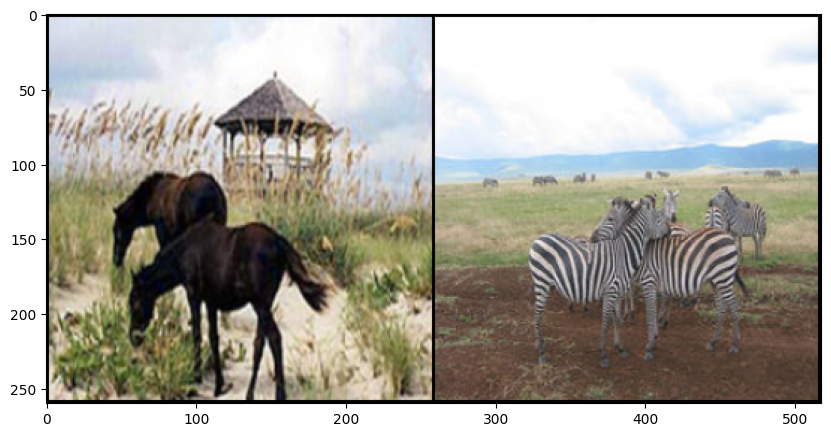

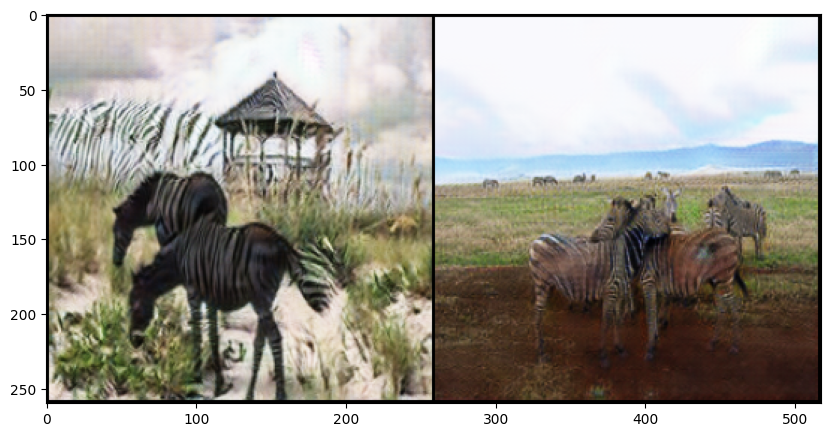

0.40947210788726807 + 0.5552712678909302 = 0.9647433757781982
0.1427212804555893 + 0.11300712078809738 = 0.2557283937931061
0.10305508226156235 + 0.07425560057163239 = 0.17731067538261414
gen_loss: 2.763422966003418 fake_A: tensor([[[[ 0.7249,  0.7234,  0.7268,  ...,  0.5137,  0.5972,  0.5653],
          [ 0.7337,  0.7181,  0.7310,  ...,  0.5058,  0.5786,  0.5835],
          [ 0.7218,  0.6967,  0.7304,  ...,  0.5076,  0.5768,  0.6152],
          ...,
          [ 0.4323,  0.4475,  0.4628,  ..., -0.5317, -0.5718, -0.4168],
          [ 0.4687,  0.4678,  0.5993,  ..., -0.6609, -0.6463, -0.5160],
          [ 0.5053,  0.5145,  0.6049,  ..., -0.6419, -0.6188, -0.4336]],

         [[ 0.6435,  0.6693,  0.6834,  ...,  0.4109,  0.4743,  0.4369],
          [ 0.6516,  0.6669,  0.6583,  ...,  0.3998,  0.4490,  0.4474],
          [ 0.6129,  0.6388,  0.6554,  ...,  0.3783,  0.4265,  0.4526],
          ...,
          [ 0.3752,  0.4333,  0.4392,  ..., -0.3998, -0.5110, -0.2805],
          [ 0.3830,  0.4

0.35697683691978455 + 0.45490965247154236 = 0.8118864893913269
0.12118552625179291 + 0.10425415635108948 = 0.22543968260288239
0.0679941177368164 + 0.10554808378219604 = 0.17354220151901245
gen_loss: 2.569852352142334 fake_A: tensor([[[[ 0.5990,  0.5265,  0.5086,  ..., -0.4558, -0.4158, -0.4351],
          [ 0.5886,  0.5170,  0.5014,  ..., -0.4984, -0.3889, -0.3130],
          [ 0.5980,  0.5299,  0.5011,  ..., -0.4464, -0.4627, -0.4237],
          ...,
          [ 0.9123,  0.9165,  0.9250,  ..., -0.3606, -0.1610, -0.1297],
          [ 0.9374,  0.9361,  0.9382,  ..., -0.1820, -0.1745, -0.1484],
          [ 0.9499,  0.9390,  0.9462,  ...,  0.0276,  0.0855,  0.0890]],

         [[ 0.3466,  0.2723,  0.2626,  ..., -0.4960, -0.4852, -0.4797],
          [ 0.3206,  0.2102,  0.1882,  ..., -0.5473, -0.4595, -0.3970],
          [ 0.2983,  0.2254,  0.1891,  ..., -0.5113, -0.5069, -0.4935],
          ...,
          [ 0.8643,  0.8668,  0.8827,  ..., -0.2227, -0.0219,  0.0051],
          [ 0.8987,  0

0.4174315333366394 + 0.4534309506416321 = 0.8708624839782715
0.1397741138935089 + 0.10633324086666107 = 0.24610735476016998
0.08083122968673706 + 0.06664051115512848 = 0.14747174084186554
gen_loss: 2.3701906204223633 fake_A: tensor([[[[ 0.2759,  0.1674,  0.0541,  ...,  0.1582,  0.2222,  0.1557],
          [ 0.3475,  0.2835,  0.1319,  ...,  0.1295,  0.2530,  0.2587],
          [ 0.3150,  0.2804,  0.1208,  ...,  0.1009,  0.2377,  0.2409],
          ...,
          [ 0.2128, -0.3197, -0.7175,  ...,  0.4221,  0.5013,  0.5798],
          [ 0.2380, -0.0671, -0.5718,  ...,  0.4211,  0.4913,  0.5166],
          [ 0.3537,  0.2802, -0.0485,  ...,  0.4273,  0.5894,  0.5789]],

         [[ 0.1151,  0.0092, -0.0590,  ...,  0.1263,  0.1342,  0.0753],
          [ 0.2165,  0.1236, -0.0079,  ...,  0.0825,  0.1875,  0.1652],
          [ 0.1370,  0.0986, -0.0569,  ...,  0.0541,  0.1605,  0.1342],
          ...,
          [-0.0872, -0.5161, -0.8067,  ..., -0.0095,  0.1977,  0.3502],
          [-0.1425, -0.

0.49095556139945984 + 0.26510074734687805 = 0.7560563087463379
0.07688217610120773 + 0.10168483853340149 = 0.17856702208518982
0.07114186137914658 + 0.05702855437994003 = 0.1281704157590866
gen_loss: 2.055617332458496 fake_A: tensor([[[[-0.5065, -0.4039, -0.1089,  ..., -0.0088,  0.0014, -0.0230],
          [-0.5031, -0.3897, -0.0965,  ..., -0.0372, -0.0170, -0.0350],
          [-0.4868, -0.3856, -0.1225,  ..., -0.0648, -0.0516, -0.0758],
          ...,
          [ 0.0009, -0.0428, -0.0413,  ...,  0.2014,  0.2061,  0.1958],
          [ 0.0717,  0.0740,  0.1084,  ...,  0.1678,  0.1633,  0.1435],
          [ 0.0512,  0.0756,  0.0938,  ...,  0.0934,  0.1315,  0.1245]],

         [[-0.4663, -0.3405, -0.0526,  ...,  0.0114,  0.0353,  0.0172],
          [-0.4676, -0.3440, -0.0600,  ..., -0.0076,  0.0287, -0.0011],
          [-0.4609, -0.3270, -0.0719,  ..., -0.0222, -0.0062, -0.0344],
          ...,
          [ 0.0210, -0.0163, -0.0015,  ...,  0.1958,  0.2137,  0.2079],
          [ 0.0931,  0

0.5633310079574585 + 0.6206142902374268 = 1.1839452981948853
0.1036817654967308 + 0.08782446384429932 = 0.19150623679161072
0.03888300061225891 + 0.07523807883262634 = 0.11412107944488525
gen_loss: 2.344306707382202 fake_A: tensor([[[[-0.4496, -0.4964, -0.4239,  ...,  0.3737,  0.2501,  0.1493],
          [-0.4635, -0.4749, -0.4103,  ...,  0.3088,  0.2834,  0.2315],
          [-0.4514, -0.4523, -0.4094,  ...,  0.2125,  0.2691,  0.2119],
          ...,
          [-0.6379, -0.6189, -0.5536,  ..., -0.3005, -0.1987,  0.1394],
          [-0.6161, -0.6248, -0.6126,  ..., -0.3702, -0.2372,  0.0211],
          [-0.6268, -0.6258, -0.6144,  ..., -0.3386, -0.1766,  0.0607]],

         [[-0.5876, -0.6365, -0.5794,  ...,  0.4073,  0.2306,  0.1234],
          [-0.5912, -0.6329, -0.5896,  ...,  0.3899,  0.3389,  0.2275],
          [-0.5699, -0.5967, -0.5741,  ...,  0.3240,  0.3514,  0.2558],
          ...,
          [-0.8116, -0.8118, -0.7588,  ..., -0.7395, -0.6567, -0.3900],
          [-0.8138, -0.8

0.410636842250824 + 0.34527158737182617 = 0.7559084296226501
0.08909706771373749 + 0.12477993965148926 = 0.21387700736522675
0.07365857064723969 + 0.052999481558799744 = 0.12665805220603943
gen_loss: 2.0438766479492188 fake_A: tensor([[[[-0.7597, -0.5846, -0.4758,  ..., -0.2703, -0.1969, -0.2319],
          [-0.7687, -0.6024, -0.4799,  ..., -0.2099, -0.2016, -0.2027],
          [-0.7936, -0.6470, -0.5245,  ..., -0.0906, -0.1633, -0.1899],
          ...,
          [ 0.0346, -0.0794, -0.1063,  ...,  0.1760,  0.1393,  0.1498],
          [ 0.1902,  0.1025,  0.0387,  ...,  0.1643,  0.1227,  0.1177],
          [ 0.4513,  0.4082,  0.3735,  ...,  0.2090,  0.2106,  0.1859]],

         [[-0.7653, -0.5683, -0.4780,  ..., -0.0053,  0.0316,  0.0100],
          [-0.7613, -0.6017, -0.5109,  ...,  0.0359,  0.0057, -0.0018],
          [-0.7732, -0.6304, -0.5440,  ...,  0.1393,  0.0107, -0.0146],
          ...,
          [ 0.2715,  0.1689,  0.1130,  ...,  0.1712,  0.1516,  0.1951],
          [ 0.3717,  

0.38872408866882324 + 0.4288485050201416 = 0.8175725936889648
0.11189047992229462 + 0.26014578342437744 = 0.37203627824783325
0.10403036326169968 + 0.10999014973640442 = 0.2140205204486847
gen_loss: 2.994981288909912 fake_A: tensor([[[[ 3.6598e-01,  3.6727e-01,  3.7883e-01,  ...,  4.9831e-01,
            4.9434e-01,  4.7900e-01],
          [ 3.6581e-01,  3.5890e-01,  3.5888e-01,  ...,  4.7673e-01,
            4.6133e-01,  4.8926e-01],
          [ 3.5957e-01,  3.6421e-01,  3.7566e-01,  ...,  4.8598e-01,
            4.8800e-01,  4.8144e-01],
          ...,
          [ 2.0947e-01,  3.7072e-01,  4.9294e-01,  ...,  4.7476e-01,
            2.8412e-01,  4.0397e-01],
          [ 3.7715e-01,  3.6346e-01,  4.9799e-01,  ...,  5.1328e-01,
            4.1898e-01,  4.4189e-01],
          [ 4.6360e-01,  4.1274e-01,  4.5179e-01,  ...,  5.9817e-01,
            5.6864e-01,  5.2631e-01]],

         [[ 5.4999e-01,  5.4772e-01,  5.5152e-01,  ...,  6.3180e-01,
            6.3790e-01,  6.3057e-01],
         

0.48854860663414 + 0.27426615357398987 = 0.7628147602081299
0.15394708514213562 + 0.07624802738428116 = 0.23019510507583618
0.06974183022975922 + 0.05575522035360336 = 0.12549704313278198
gen_loss: 2.040804624557495 fake_A: tensor([[[[-0.2912, -0.2555, -0.1731,  ...,  0.7244,  0.6848,  0.5263],
          [-0.4312, -0.3828, -0.3164,  ...,  0.7117,  0.6347,  0.4960],
          [-0.5154, -0.4570, -0.4097,  ...,  0.6003,  0.5565,  0.4579],
          ...,
          [ 0.0463,  0.0486,  0.1143,  ...,  0.0009, -0.0287, -0.0424],
          [ 0.0149, -0.0030,  0.0641,  ..., -0.0178, -0.0271, -0.0516],
          [-0.0223, -0.0527, -0.0180,  ..., -0.0209, -0.0060, -0.0323]],

         [[-0.3019, -0.2350, -0.1397,  ...,  0.6984,  0.6416,  0.5244],
          [-0.3913, -0.3502, -0.2422,  ...,  0.7062,  0.6431,  0.5150],
          [-0.4711, -0.3873, -0.3217,  ...,  0.5982,  0.5401,  0.4670],
          ...,
          [ 0.0032, -0.0032,  0.0519,  ..., -0.0295, -0.0432, -0.0524],
          [-0.0349, -0.0

0.3520147204399109 + 0.3771893382072449 = 0.7292040586471558
0.12054970115423203 + 0.11221276968717575 = 0.23276247084140778
0.09396439790725708 + 0.08289732038974762 = 0.1768617182970047
gen_loss: 2.521097421646118 fake_A: tensor([[[[ 0.2042,  0.2155,  0.4238,  ...,  0.6534,  0.6947,  0.7587],
          [-0.0644,  0.0256,  0.4576,  ...,  0.5995,  0.5719,  0.7398],
          [ 0.3702,  0.4397,  0.6318,  ...,  0.7824,  0.6748,  0.7179],
          ...,
          [ 0.4271,  0.3989,  0.4025,  ...,  0.4176,  0.4682,  0.5341],
          [ 0.4055,  0.3967,  0.4010,  ...,  0.4014,  0.4509,  0.5110],
          [ 0.4068,  0.4025,  0.3879,  ...,  0.3582,  0.4383,  0.4854]],

         [[ 0.1475,  0.1986,  0.3721,  ...,  0.5922,  0.5953,  0.6684],
          [-0.1052, -0.0054,  0.3936,  ...,  0.5402,  0.5154,  0.6827],
          [ 0.3175,  0.3579,  0.5715,  ...,  0.7266,  0.6322,  0.6713],
          ...,
          [ 0.5614,  0.5564,  0.5574,  ...,  0.3033,  0.3266,  0.3709],
          [ 0.5310,  0.5

0.41468679904937744 + 0.523129403591156 = 0.9378162026405334
0.15312127768993378 + 0.0630757063627243 = 0.21619698405265808
0.06323742866516113 + 0.07358887791633606 = 0.1368263065814972
gen_loss: 2.3276989459991455 fake_A: tensor([[[[-0.8016, -0.7624, -0.7890,  ..., -0.6813, -0.6815, -0.6259],
          [-0.7506, -0.6539, -0.7183,  ..., -0.6925, -0.6802, -0.6371],
          [-0.7205, -0.5485, -0.7492,  ..., -0.6572, -0.6457, -0.5926],
          ...,
          [-0.1538, -0.1782, -0.1976,  ...,  0.7275,  0.6838,  0.6541],
          [-0.0826, -0.1610, -0.1559,  ...,  0.7178,  0.6518,  0.6000],
          [-0.1096, -0.1763, -0.1660,  ...,  0.7004,  0.6346,  0.5725]],

         [[-0.7709, -0.6399, -0.6622,  ..., -0.5933, -0.6301, -0.5411],
          [-0.7033, -0.5216, -0.5926,  ..., -0.5844, -0.5904, -0.5669],
          [-0.6590, -0.4644, -0.6705,  ..., -0.5396, -0.6199, -0.5554],
          ...,
          [-0.2452, -0.2448, -0.2710,  ...,  0.8641,  0.8306,  0.8222],
          [-0.2361, -0.2

0.7696391344070435 + 0.387714684009552 = 1.1573538780212402
0.16205845773220062 + 0.08749213814735413 = 0.24955059587955475
0.07682311534881592 + 0.08426793664693832 = 0.16109105944633484
gen_loss: 2.793219566345215 fake_A: tensor([[[[ 0.9243,  0.9191,  0.9118,  ...,  0.9351,  0.9441,  0.9461],
          [ 0.9301,  0.9199,  0.9195,  ...,  0.9420,  0.9493,  0.9518],
          [ 0.9258,  0.9128,  0.9160,  ...,  0.9419,  0.9521,  0.9460],
          ...,
          [-0.3484, -0.3519, -0.3713,  ...,  0.1094,  0.0400,  0.0253],
          [-0.3782, -0.3945, -0.4018,  ...,  0.1145,  0.0502,  0.0032],
          [-0.2902, -0.3499, -0.3912,  ...,  0.0999,  0.1186,  0.0826]],

         [[ 0.9535,  0.9569,  0.9508,  ...,  0.9422,  0.9411,  0.9445],
          [ 0.9525,  0.9537,  0.9525,  ...,  0.9461,  0.9453,  0.9506],
          [ 0.9535,  0.9536,  0.9488,  ...,  0.9461,  0.9506,  0.9436],
          ...,
          [-0.3721, -0.4218, -0.4431,  ...,  0.0777,  0.0189, -0.0340],
          [-0.3733, -0.4

0.5502336025238037 + 0.3495789170265198 = 0.8998125195503235
0.11966004222631454 + 0.07868834584951401 = 0.19834838807582855
0.06353627890348434 + 0.06998308002948761 = 0.13351935148239136
gen_loss: 2.254840850830078 fake_A: tensor([[[[ 0.4229,  0.4775,  0.5651,  ...,  0.4606,  0.4206,  0.3335],
          [ 0.4601,  0.5269,  0.6089,  ...,  0.4309,  0.3931,  0.3440],
          [ 0.5551,  0.6121,  0.6687,  ...,  0.2322,  0.2358,  0.2596],
          ...,
          [ 0.0698,  0.1179,  0.3694,  ...,  0.5026,  0.4974,  0.5547],
          [ 0.1879,  0.2080,  0.3960,  ...,  0.3961,  0.4709,  0.5355],
          [ 0.2986,  0.2954,  0.3486,  ...,  0.4716,  0.5431,  0.5497]],

         [[ 0.2476,  0.3182,  0.4117,  ...,  0.3751,  0.2840,  0.1976],
          [ 0.2749,  0.3523,  0.4420,  ...,  0.3307,  0.2657,  0.1939],
          [ 0.3786,  0.4521,  0.5091,  ...,  0.1203,  0.0922,  0.1266],
          ...,
          [-0.0231,  0.0538,  0.2820,  ...,  0.2957,  0.2926,  0.3588],
          [ 0.0968,  0.

0.3255481719970703 + 0.21282052993774414 = 0.5383687019348145
0.09165653586387634 + 0.08659755438566208 = 0.17825409770011902
0.07076579332351685 + 0.06889303028583527 = 0.1396588236093521
gen_loss: 1.952782392501831 fake_A: tensor([[[[ 0.3657,  0.3707,  0.3815,  ...,  0.1605,  0.2213,  0.2347],
          [ 0.3667,  0.3569,  0.3686,  ...,  0.1576,  0.1948,  0.2407],
          [ 0.3640,  0.3548,  0.3573,  ...,  0.1640,  0.1693,  0.2151],
          ...,
          [ 0.1452,  0.1398,  0.1975,  ...,  0.1845,  0.1885,  0.1770],
          [ 0.1082,  0.1196,  0.1232,  ...,  0.1201,  0.0948,  0.0847],
          [ 0.0589,  0.0736,  0.1273,  ...,  0.0852,  0.1166,  0.1143]],

         [[ 0.4966,  0.5114,  0.5150,  ...,  0.3973,  0.4300,  0.4429],
          [ 0.4994,  0.5078,  0.5102,  ...,  0.3734,  0.4072,  0.4447],
          [ 0.5014,  0.5038,  0.5011,  ...,  0.3777,  0.3801,  0.4196],
          ...,
          [ 0.0966,  0.1127,  0.1439,  ...,  0.1555,  0.1772,  0.1293],
          [ 0.0293,  0.

0.6372107863426208 + 0.4365708529949188 = 1.0737816095352173
0.15624134242534637 + 0.08551307022571564 = 0.241754412651062
0.055674225091934204 + 0.05938516557216644 = 0.11505939066410065
gen_loss: 2.2485508918762207 fake_A: tensor([[[[-0.6553, -0.6618, -0.6582,  ..., -0.8750, -0.8724, -0.8750],
          [-0.6620, -0.6656, -0.6528,  ..., -0.8762, -0.8771, -0.8754],
          [-0.6504, -0.6624, -0.6590,  ..., -0.8922, -0.8879, -0.8796],
          ...,
          [ 0.3200,  0.3068,  0.4044,  ...,  0.0963,  0.1499,  0.1520],
          [ 0.2670,  0.2662,  0.2244,  ...,  0.0851,  0.0825,  0.1091],
          [ 0.2572,  0.2517,  0.1773,  ...,  0.1114,  0.1169,  0.1209]],

         [[-0.6575, -0.6561, -0.6687,  ..., -0.8027, -0.8219, -0.8322],
          [-0.6663, -0.6767, -0.6743,  ..., -0.8058, -0.8233, -0.8385],
          [-0.6564, -0.6776, -0.6737,  ..., -0.8280, -0.8439, -0.8411],
          ...,
          [-0.2336, -0.2896, -0.1690,  ..., -0.1950, -0.1157, -0.0829],
          [-0.2667, -0.

0.4795018434524536 + 0.4212631583213806 = 0.9007650017738342
0.12712019681930542 + 0.15094441175460815 = 0.2780646085739136
0.07861414551734924 + 0.05973370000720024 = 0.13834784924983978
gen_loss: 2.3120498657226562 fake_A: tensor([[[[-0.4491, -0.3796, -0.3072,  ..., -0.2465, -0.2749, -0.3994],
          [-0.4973, -0.3657, -0.2902,  ..., -0.3613, -0.3392, -0.3911],
          [-0.5239, -0.3689, -0.3070,  ..., -0.3838, -0.2774, -0.3578],
          ...,
          [ 0.0195,  0.0113, -0.0025,  ..., -0.1406, -0.1711, -0.1919],
          [-0.0951, -0.1065, -0.0801,  ..., -0.1661, -0.2010, -0.2193],
          [-0.1445, -0.1638, -0.1296,  ..., -0.1794, -0.2092, -0.2296]],

         [[-0.3772, -0.2971, -0.2307,  ..., -0.1458, -0.1987, -0.3167],
          [-0.4497, -0.3142, -0.2326,  ..., -0.2568, -0.2259, -0.3068],
          [-0.4678, -0.3109, -0.2549,  ..., -0.2626, -0.1556, -0.2537],
          ...,
          [ 0.1170,  0.1079,  0.0806,  ...,  0.0380,  0.0318,  0.0151],
          [ 0.0072,  0.

0.1966811865568161 + 0.38287967443466187 = 0.5795608758926392
0.08908024430274963 + 0.0710994154214859 = 0.16017965972423553
0.04698561131954193 + 0.06880013644695282 = 0.11578574776649475
gen_loss: 1.7534363269805908 fake_A: tensor([[[[-0.1078, -0.1827, -0.1388,  ...,  0.0502,  0.0372,  0.0436],
          [-0.1989, -0.2604, -0.1765,  ...,  0.0408,  0.0447,  0.0572],
          [-0.1169, -0.2163, -0.2248,  ...,  0.0618,  0.0640,  0.0735],
          ...,
          [ 0.6158,  0.5509,  0.5944,  ...,  0.6827,  0.6722,  0.6580],
          [ 0.6236,  0.5909,  0.5881,  ...,  0.7673,  0.7376,  0.6369],
          [ 0.6449,  0.6051,  0.5668,  ...,  0.7438,  0.7541,  0.6719]],

         [[ 0.1346,  0.0487,  0.0839,  ...,  0.1956,  0.2166,  0.2129],
          [ 0.0185, -0.0627, -0.0077,  ...,  0.2525,  0.2574,  0.2441],
          [ 0.0742, -0.0277, -0.0591,  ...,  0.2676,  0.2203,  0.2398],
          ...,
          [ 0.6510,  0.6037,  0.6524,  ...,  0.7358,  0.7353,  0.7160],
          [ 0.6842,  0

0.6423553228378296 + 0.3866676092147827 = 1.0290229320526123
0.13446222245693207 + 0.07439251989126205 = 0.20885473489761353
0.06730140745639801 + 0.08561306446790695 = 0.15291446447372437
gen_loss: 2.5790529251098633 fake_A: tensor([[[[ 0.1194,  0.0097,  0.2058,  ..., -0.1553,  0.0190,  0.1259],
          [ 0.1112,  0.0615,  0.1721,  ..., -0.2317, -0.0671,  0.1033],
          [-0.0346, -0.0916, -0.0294,  ..., -0.1496, -0.2351, -0.0034],
          ...,
          [ 0.2924,  0.1757,  0.0712,  ...,  0.1861,  0.2098,  0.2612],
          [ 0.3923,  0.3559,  0.1635,  ...,  0.2366,  0.1979,  0.2464],
          [ 0.4580,  0.3945,  0.1886,  ...,  0.2177,  0.3137,  0.3001]],

         [[ 0.4837,  0.4478,  0.5114,  ...,  0.3011,  0.3061,  0.3537],
          [ 0.4741,  0.4305,  0.4597,  ...,  0.1880,  0.2386,  0.3520],
          [ 0.3113,  0.2598,  0.2422,  ...,  0.1675,  0.0429,  0.2630],
          ...,
          [ 0.4119,  0.3918,  0.3352,  ...,  0.3297,  0.3078,  0.3249],
          [ 0.4612,  0

0.5194124579429626 + 0.5768370628356934 = 1.0962495803833008
0.13378766179084778 + 0.07665644586086273 = 0.2104441076517105
0.07246138900518417 + 0.07528437674045563 = 0.1477457582950592
gen_loss: 2.5947513580322266 fake_A: tensor([[[[-0.2127, -0.2581, -0.2910,  ..., -0.2500, -0.2077, -0.2107],
          [-0.2243, -0.2457, -0.2550,  ..., -0.2074, -0.1786, -0.1679],
          [-0.2332, -0.2753, -0.2823,  ..., -0.1673, -0.1574, -0.1717],
          ...,
          [-0.2183, -0.2394, -0.2305,  ..., -0.7622, -0.7743, -0.7702],
          [-0.0794, -0.1158, -0.0954,  ..., -0.7527, -0.7566, -0.7575],
          [-0.0485, -0.0875, -0.0579,  ..., -0.7525, -0.7336, -0.7344]],

         [[-0.0556, -0.0847, -0.1356,  ..., -0.1214, -0.1158, -0.1329],
          [-0.0565, -0.0876, -0.1180,  ..., -0.0764, -0.0648, -0.0744],
          [-0.0835, -0.1278, -0.1383,  ..., -0.0435, -0.0430, -0.0682],
          ...,
          [-0.1704, -0.1965, -0.1972,  ..., -0.6686, -0.6795, -0.7097],
          [-0.0700, -0.1

0.5260421633720398 + 0.552488386631012 = 1.0785305500030518
0.11383263766765594 + 0.05390126630663872 = 0.16773390769958496
0.05607956647872925 + 0.07734908163547516 = 0.1334286481142044
gen_loss: 2.4295902252197266 fake_A: tensor([[[[ 0.8204,  0.8088,  0.8134,  ...,  0.2643,  0.1082,  0.0101],
          [ 0.8528,  0.8304,  0.8016,  ...,  0.2575,  0.1180,  0.0497],
          [ 0.8156,  0.7799,  0.7101,  ...,  0.0567, -0.0392,  0.0955],
          ...,
          [-0.2144, -0.2246, -0.3207,  ...,  0.5261,  0.5503,  0.5103],
          [-0.2306, -0.2731, -0.3670,  ...,  0.4095,  0.4915,  0.4541],
          [-0.1530, -0.1714, -0.2302,  ...,  0.3290,  0.3968,  0.3427]],

         [[ 0.7781,  0.7657,  0.7614,  ...,  0.1261, -0.0443, -0.1396],
          [ 0.8077,  0.7617,  0.7257,  ...,  0.0882, -0.0403, -0.1116],
          [ 0.7651,  0.7218,  0.6225,  ..., -0.0880, -0.2057, -0.0535],
          ...,
          [-0.1601, -0.1825, -0.2657,  ...,  0.4963,  0.5100,  0.4769],
          [-0.2300, -0.2

0.2844192385673523 + 0.3511616289615631 = 0.6355808973312378
0.11759122461080551 + 0.071901336312294 = 0.18949255347251892
0.07330141961574554 + 0.06023254245519638 = 0.13353395462036133
gen_loss: 1.9898697137832642 fake_A: tensor([[[[ 0.5768,  0.5866,  0.5903,  ...,  0.6633,  0.6497,  0.6566],
          [ 0.5874,  0.5759,  0.5796,  ...,  0.6490,  0.6457,  0.6711],
          [ 0.5867,  0.5753,  0.5826,  ...,  0.6489,  0.6479,  0.6504],
          ...,
          [ 0.3187,  0.3128,  0.2760,  ...,  0.4408,  0.3424,  0.4051],
          [ 0.2699,  0.2722,  0.2064,  ...,  0.3808,  0.3773,  0.4206],
          [ 0.2167,  0.2293,  0.1654,  ...,  0.3068,  0.3625,  0.4031]],

         [[ 0.6303,  0.6441,  0.6460,  ...,  0.7057,  0.7085,  0.7207],
          [ 0.6252,  0.6304,  0.6301,  ...,  0.6981,  0.7134,  0.7392],
          [ 0.6245,  0.6207,  0.6290,  ...,  0.7091,  0.7161,  0.7196],
          ...,
          [ 0.1797,  0.1806,  0.1373,  ...,  0.3180,  0.2172,  0.2977],
          [ 0.1103,  0.1

0.5588119029998779 + 0.4223122000694275 = 0.9811241030693054
0.1706346720457077 + 0.17978309094905853 = 0.35041776299476624
0.08193018287420273 + 0.09023060649633408 = 0.1721607893705368
gen_loss: 2.737773895263672 fake_A: tensor([[[[0.9652, 0.9608, 0.9639,  ..., 0.9615, 0.9700, 0.9722],
          [0.9663, 0.9603, 0.9613,  ..., 0.9612, 0.9699, 0.9713],
          [0.9601, 0.9541, 0.9556,  ..., 0.9665, 0.9678, 0.9662],
          ...,
          [0.9311, 0.9111, 0.9055,  ..., 0.8770, 0.8048, 0.7969],
          [0.9227, 0.8788, 0.9039,  ..., 0.8245, 0.7668, 0.7292],
          [0.8766, 0.8270, 0.8335,  ..., 0.7312, 0.7064, 0.6500]],

         [[0.9497, 0.9497, 0.9489,  ..., 0.9503, 0.9594, 0.9617],
          [0.9428, 0.9440, 0.9425,  ..., 0.9469, 0.9540, 0.9620],
          [0.9388, 0.9390, 0.9321,  ..., 0.9519, 0.9514, 0.9508],
          ...,
          [0.8823, 0.8486, 0.8428,  ..., 0.8033, 0.6733, 0.6527],
          [0.8600, 0.7981, 0.8503,  ..., 0.7431, 0.6640, 0.5989],
          [0.7915, 

0.5845310688018799 + 0.4517667889595032 = 1.0362977981567383
0.17610657215118408 + 0.06951301544904709 = 0.24561959505081177
0.055201124399900436 + 0.058301713317632675 = 0.11350283771753311
gen_loss: 2.195888042449951 fake_A: tensor([[[[ 0.1301,  0.0840,  0.1123,  ...,  0.4045,  0.3961,  0.2295],
          [ 0.1735,  0.1943,  0.2685,  ...,  0.3877,  0.4850,  0.4547],
          [ 0.3395,  0.2362,  0.1346,  ...,  0.0957,  0.4335,  0.4936],
          ...,
          [ 0.9850,  0.9809,  0.9828,  ...,  0.8555,  0.8746,  0.8855],
          [ 0.9906,  0.9881,  0.9816,  ...,  0.9061,  0.9039,  0.8151],
          [ 0.9668,  0.9483,  0.8313,  ...,  0.9480,  0.9453,  0.8600]],

         [[ 0.1962,  0.1773,  0.1857,  ...,  0.5043,  0.4274,  0.3040],
          [ 0.2372,  0.2198,  0.2754,  ...,  0.4000,  0.4299,  0.3732],
          [ 0.3783,  0.2472,  0.1331,  ...,  0.0934,  0.3561,  0.4298],
          ...,
          [ 0.9843,  0.9836,  0.9794,  ...,  0.6951,  0.7504,  0.7582],
          [ 0.9920,  

0.4670906662940979 + 0.4805346429347992 = 0.9476252794265747
0.14409257471561432 + 0.07101191580295563 = 0.21510449051856995
0.05687240883708 + 0.05497143417596817 = 0.11184383928775787
gen_loss: 2.087574005126953 fake_A: tensor([[[[-0.2171, -0.1954, -0.2044,  ..., -0.1347, -0.1077, -0.1614],
          [-0.2239, -0.1885, -0.2158,  ..., -0.1185, -0.0934, -0.0945],
          [-0.2331, -0.2329, -0.2734,  ..., -0.1300, -0.1219, -0.1308],
          ...,
          [ 0.2553,  0.2369,  0.1803,  ...,  0.0656,  0.0773,  0.0854],
          [ 0.2615,  0.2521,  0.1903,  ...,  0.0433,  0.0369,  0.0240],
          [ 0.2649,  0.2777,  0.2322,  ...,  0.0107,  0.0425,  0.0295]],

         [[-0.2636, -0.2369, -0.2465,  ..., -0.1648, -0.1476, -0.1880],
          [-0.2532, -0.2453, -0.2815,  ..., -0.1579, -0.1086, -0.1215],
          [-0.2787, -0.2687, -0.3066,  ..., -0.1544, -0.1361, -0.1597],
          ...,
          [ 0.0125,  0.0110, -0.0387,  ..., -0.0693, -0.0259, -0.0442],
          [-0.0163,  0.014

0.6289951801300049 + 0.6542772054672241 = 1.283272385597229
0.11689677834510803 + 0.08319544047117233 = 0.20009222626686096
0.0525776669383049 + 0.06643012911081314 = 0.11900779604911804
gen_loss: 2.4933595657348633 fake_A: tensor([[[[-0.0703, -0.0959, -0.1270,  ..., -0.0814, -0.1552, -0.0853],
          [-0.2785, -0.1577, -0.2888,  ..., -0.0649, -0.0827, -0.0204],
          [-0.3169, -0.1171, -0.1771,  ..., -0.0614, -0.0515, -0.0653],
          ...,
          [-0.5160, -0.5386, -0.5319,  ..., -0.2703, -0.3189, -0.3647],
          [-0.0357, -0.0171,  0.0217,  ..., -0.3022, -0.3805, -0.3995],
          [ 0.2983,  0.3523,  0.3172,  ..., -0.3513, -0.3987, -0.4113]],

         [[-0.0198,  0.0305, -0.0287,  ..., -0.0472, -0.1021,  0.0428],
          [-0.1342, -0.0120, -0.1962,  ...,  0.0140,  0.0056,  0.1056],
          [-0.1215,  0.0034, -0.1110,  ...,  0.0007,  0.0156,  0.0558],
          ...,
          [-0.3790, -0.3889, -0.4051,  ...,  0.0701,  0.0327,  0.0010],
          [ 0.1811,  0.2

0.27796703577041626 + 0.3694325089454651 = 0.6473995447158813
0.1309489607810974 + 0.0757245421409607 = 0.2066735029220581
0.0712980180978775 + 0.05792591720819473 = 0.12922394275665283
gen_loss: 1.9603064060211182 fake_A: tensor([[[[-0.3268, -0.5394, -0.4901,  ..., -0.8870, -0.8984, -0.8741],
          [-0.3291, -0.4776, -0.4345,  ..., -0.9053, -0.8813, -0.8767],
          [-0.1642, -0.2633, -0.3185,  ..., -0.8923, -0.8878, -0.8821],
          ...,
          [ 0.4730,  0.2954,  0.2634,  ...,  0.1383,  0.1362,  0.0099],
          [ 0.4976,  0.3717,  0.3533,  ...,  0.3836,  0.1957,  0.0802],
          [ 0.4674,  0.4048,  0.3590,  ...,  0.2632,  0.2207,  0.1015]],

         [[-0.3492, -0.5971, -0.5583,  ..., -0.7940, -0.8295, -0.7900],
          [-0.4226, -0.6017, -0.5486,  ..., -0.8017, -0.7679, -0.7874],
          [-0.2295, -0.4537, -0.4855,  ..., -0.7893, -0.7916, -0.7753],
          ...,
          [ 0.4973,  0.3353,  0.2731,  ...,  0.2414,  0.2232,  0.0907],
          [ 0.4582,  0.35

0.6764989495277405 + 0.5192460417747498 = 1.1957449913024902
0.14672613143920898 + 0.18199974298477173 = 0.3287258744239807
0.08902697265148163 + 0.0847352147102356 = 0.17376218736171722
gen_loss: 2.9662394523620605 fake_A: tensor([[[[-0.2358, -0.3180, -0.2209,  ...,  0.0126,  0.0215, -0.1375],
          [-0.2991, -0.2232, -0.1597,  ..., -0.0857, -0.0603, -0.1688],
          [-0.2101, -0.1891, -0.1980,  ..., -0.1559, -0.2299, -0.2931],
          ...,
          [-0.4083, -0.4035, -0.3022,  ...,  0.2426,  0.2812,  0.1421],
          [-0.3750, -0.4931, -0.4392,  ...,  0.3789,  0.4043,  0.1888],
          [-0.1435, -0.2901, -0.3007,  ...,  0.2652,  0.3792,  0.1953]],

         [[-0.1227, -0.2458, -0.1623,  ...,  0.3820,  0.3465,  0.2190],
          [-0.2425, -0.1636, -0.1365,  ...,  0.2978,  0.2968,  0.2092],
          [-0.1322, -0.1952, -0.2009,  ...,  0.2224,  0.1391,  0.1079],
          ...,
          [-0.1332, -0.0999, -0.0157,  ...,  0.3116,  0.3253,  0.2247],
          [-0.1445, -0.2

0.5372995138168335 + 0.36872124671936035 = 0.9060207605361938
0.1494041085243225 + 0.10408411920070648 = 0.2534882426261902
0.06818580627441406 + 0.06344401836395264 = 0.1316298246383667
gen_loss: 2.2476677894592285 fake_A: tensor([[[[ 0.2249,  0.4919,  0.5138,  ...,  0.4969,  0.4831,  0.4942],
          [ 0.2708,  0.5842,  0.5961,  ...,  0.4933,  0.4778,  0.4902],
          [ 0.3262,  0.6224,  0.7005,  ...,  0.4971,  0.4979,  0.4826],
          ...,
          [-0.5601, -0.6344, -0.6461,  ..., -0.4505, -0.2979, -0.1391],
          [-0.5108, -0.5676, -0.5027,  ..., -0.3367, -0.2533, -0.1760],
          [-0.4227, -0.4526, -0.4175,  ..., -0.2276, -0.1187, -0.1128]],

         [[ 0.3582,  0.6372,  0.6481,  ...,  0.6935,  0.6772,  0.6795],
          [ 0.4025,  0.7103,  0.7026,  ...,  0.6866,  0.6757,  0.6810],
          [ 0.4277,  0.7220,  0.7643,  ...,  0.6903,  0.6833,  0.6716],
          ...,
          [-0.4594, -0.5674, -0.5912,  ..., -0.3727, -0.2114, -0.0711],
          [-0.4155, -0.4

0.4830898642539978 + 0.49323153495788574 = 0.9763213992118835
0.22159117460250854 + 0.07313172519207001 = 0.29472291469573975
0.06786947697401047 + 0.08759903162717819 = 0.15546850860118866
gen_loss: 2.560478687286377 fake_A: tensor([[[[-0.0520, -0.0787, -0.0730,  ...,  0.9043,  0.8760,  0.8967],
          [-0.0570, -0.0902, -0.0946,  ...,  0.9165,  0.8882,  0.8760],
          [-0.0299, -0.0320, -0.0667,  ...,  0.9182,  0.8959,  0.8867],
          ...,
          [-0.4396, -0.3321, -0.5081,  ...,  0.8130,  0.7977,  0.7705],
          [-0.4324, -0.4211, -0.5790,  ...,  0.8078,  0.7798,  0.7523],
          [-0.4394, -0.4180, -0.5495,  ...,  0.7885,  0.7748,  0.7578]],

         [[-0.1403, -0.1513, -0.1419,  ...,  0.9308,  0.8808,  0.8715],
          [-0.1488, -0.1953, -0.2000,  ...,  0.9309,  0.8810,  0.8397],
          [-0.1193, -0.1174, -0.1650,  ...,  0.9178,  0.8621,  0.8551],
          ...,
          [-0.5240, -0.4143, -0.5764,  ...,  0.8307,  0.8139,  0.7922],
          [-0.5591, -0

0.5340691804885864 + 0.3082624673843384 = 0.8423316478729248
0.12402807176113129 + 0.0939776748418808 = 0.21800574660301208
0.08512651920318604 + 0.0713769868016243 = 0.15650349855422974
gen_loss: 2.4291672706604004 fake_A: tensor([[[[0.8328, 0.8310, 0.8198,  ..., 0.8480, 0.8452, 0.8213],
          [0.8221, 0.8136, 0.8419,  ..., 0.8540, 0.8100, 0.7565],
          [0.8408, 0.8259, 0.8694,  ..., 0.8131, 0.7870, 0.7917],
          ...,
          [0.9308, 0.9331, 0.9286,  ..., 0.9260, 0.9225, 0.9013],
          [0.9111, 0.8833, 0.9089,  ..., 0.8659, 0.8625, 0.8652],
          [0.9154, 0.8713, 0.8510,  ..., 0.7923, 0.7860, 0.7909]],

         [[0.8451, 0.8758, 0.8560,  ..., 0.9264, 0.9092, 0.8871],
          [0.8198, 0.8422, 0.8457,  ..., 0.9318, 0.8927, 0.8493],
          [0.8220, 0.8465, 0.8544,  ..., 0.9033, 0.8704, 0.8649],
          ...,
          [0.9351, 0.9398, 0.9303,  ..., 0.9395, 0.9221, 0.9009],
          [0.9302, 0.9043, 0.9262,  ..., 0.9118, 0.8954, 0.8953],
          [0.9323,

0.4162484407424927 + 0.6559137105941772 = 1.07216215133667
0.11392923444509506 + 0.15581446886062622 = 0.2697437107563019
0.06735622137784958 + 0.062488824129104614 = 0.1298450529575348
gen_loss: 2.3975868225097656 fake_A: tensor([[[[-8.1322e-01, -8.2326e-01, -8.1497e-01,  ..., -8.0491e-01,
           -8.0609e-01, -8.2345e-01],
          [-8.1794e-01, -8.2486e-01, -8.2400e-01,  ..., -7.9488e-01,
           -7.8771e-01, -7.9782e-01],
          [-8.2190e-01, -8.2929e-01, -8.3031e-01,  ..., -8.0872e-01,
           -8.1839e-01, -8.2093e-01],
          ...,
          [-4.7036e-02,  1.9123e-01,  1.5836e-01,  ...,  5.2135e-01,
            4.4748e-01,  5.4141e-01],
          [-7.7929e-02, -2.1643e-02,  7.2014e-02,  ...,  6.0035e-01,
            5.5274e-01,  6.4430e-01],
          [ 2.6154e-01,  2.9342e-01,  3.5958e-01,  ...,  4.2488e-01,
            4.5053e-01,  5.7199e-01]],

         [[-8.9412e-01, -8.9502e-01, -8.9514e-01,  ..., -8.6399e-01,
           -8.7170e-01, -8.8052e-01],
          [

0.5374283790588379 + 0.30088570713996887 = 0.8383140563964844
0.12577994167804718 + 0.10290129482746124 = 0.22868123650550842
0.0818471685051918 + 0.09787609428167343 = 0.17972326278686523
gen_loss: 2.658414840698242 fake_A: tensor([[[[ 0.5746,  0.5772,  0.5783,  ...,  0.5867,  0.5905,  0.5918],
          [ 0.5037,  0.5024,  0.5373,  ...,  0.5781,  0.5796,  0.5924],
          [ 0.5231,  0.5110,  0.5188,  ...,  0.5849,  0.5960,  0.5615],
          ...,
          [-0.1186, -0.1414, -0.0688,  ..., -0.1746, -0.2325, -0.1177],
          [ 0.0052,  0.0024,  0.0203,  ...,  0.0980, -0.0056, -0.0243],
          [-0.0486, -0.0399, -0.0052,  ...,  0.0986,  0.0966,  0.0160]],

         [[ 0.6382,  0.6822,  0.6772,  ...,  0.7632,  0.7542,  0.7716],
          [ 0.6069,  0.6632,  0.6809,  ...,  0.7716,  0.7691,  0.7815],
          [ 0.6277,  0.6633,  0.6610,  ...,  0.7842,  0.7747,  0.7582],
          ...,
          [-0.2133, -0.2340, -0.1500,  ..., -0.0847, -0.1512, -0.0662],
          [-0.1254, -0.

0.5760995149612427 + 0.38861286640167236 = 0.964712381362915
0.1204918846487999 + 0.12115609645843506 = 0.24164798855781555
0.09795579314231873 + 0.07800400257110596 = 0.17595979571342468
gen_loss: 2.7484750747680664 fake_A: tensor([[[[-0.3436, -0.3577, -0.3375,  ..., -0.7403, -0.6295, -0.5325],
          [-0.3840, -0.3961, -0.4040,  ..., -0.6925, -0.6012, -0.5091],
          [-0.2080, -0.2280, -0.2320,  ..., -0.5109, -0.5069, -0.4340],
          ...,
          [ 0.2094,  0.2112,  0.3164,  ...,  0.3519,  0.5129,  0.2473],
          [ 0.3431,  0.2979,  0.3946,  ...,  0.5234,  0.5645,  0.2773],
          [ 0.2993,  0.3192,  0.3173,  ...,  0.5988,  0.5025,  0.2103]],

         [[-0.1447, -0.1329, -0.1296,  ..., -0.5552, -0.4163, -0.3130],
          [-0.1451, -0.1560, -0.2036,  ..., -0.4871, -0.3563, -0.2976],
          [-0.0009,  0.0016, -0.0392,  ..., -0.2796, -0.2810, -0.2302],
          ...,
          [ 0.1698,  0.2114,  0.3380,  ...,  0.3922,  0.4712,  0.2555],
          [ 0.2746,  0.

0.6150065660476685 + 0.49228572845458984 = 1.1072922945022583
0.1803000271320343 + 0.054016679525375366 = 0.23431670665740967
0.0856686681509018 + 0.07854433357715607 = 0.16421300172805786
gen_loss: 2.7728538513183594 fake_A: tensor([[[[ 0.7902,  0.7763,  0.7560,  ..., -0.1016, -0.3710, -0.5050],
          [ 0.8057,  0.7966,  0.7935,  ...,  0.0042, -0.2861, -0.4880],
          [ 0.8001,  0.7940,  0.8047,  ..., -0.0102, -0.1921, -0.4773],
          ...,
          [ 0.1233,  0.0415,  0.3060,  ..., -0.6123, -0.5234, -0.5168],
          [ 0.1455,  0.1274,  0.2734,  ..., -0.5672, -0.5643, -0.5975],
          [ 0.0883,  0.1386,  0.1842,  ..., -0.4343, -0.4681, -0.5151]],

         [[ 0.8098,  0.8250,  0.8007,  ...,  0.0329, -0.1899, -0.1916],
          [ 0.8037,  0.8115,  0.7937,  ...,  0.0512, -0.1097, -0.2807],
          [ 0.7742,  0.7894,  0.7962,  ..., -0.0096, -0.0877, -0.2768],
          ...,
          [ 0.1429,  0.0974,  0.3318,  ..., -0.6802, -0.4856, -0.4247],
          [ 0.2016,  0

0.562859058380127 + 0.342842698097229 = 0.905701756477356
0.18301598727703094 + 0.10502847284078598 = 0.28804445266723633
0.0854903906583786 + 0.09222523868083954 = 0.17771562933921814
gen_loss: 2.711662530899048 fake_A: tensor([[[[-0.7474, -0.7661, -0.8069,  ...,  0.1570,  0.1093,  0.0834],
          [-0.7451, -0.7543, -0.7688,  ...,  0.2817,  0.2353,  0.2155],
          [-0.7416, -0.7638, -0.7749,  ...,  0.3829,  0.3081,  0.2251],
          ...,
          [ 0.2708,  0.2331,  0.1988,  ..., -0.0392,  0.0750,  0.0036],
          [ 0.2736,  0.2480,  0.1716,  ...,  0.1948, -0.0323, -0.0944],
          [ 0.3190,  0.2922,  0.2244,  ...,  0.2123,  0.1419,  0.0740]],

         [[-0.6748, -0.7051, -0.7589,  ...,  0.1903,  0.0926,  0.0728],
          [-0.6597, -0.6942, -0.7220,  ...,  0.2797,  0.2162,  0.1850],
          [-0.6839, -0.7220, -0.7455,  ...,  0.3435,  0.2608,  0.1672],
          ...,
          [ 0.2784,  0.2456,  0.2120,  ...,  0.0331,  0.2058,  0.0927],
          [ 0.2649,  0.2669

0.7277857065200806 + 0.2697351574897766 = 0.9975208640098572
0.13789692521095276 + 0.0996633768081665 = 0.23756030201911926
0.07941583544015884 + 0.0806807354092598 = 0.16009657084941864
gen_loss: 2.6222426891326904 fake_A: tensor([[[[ 0.6165,  0.6768,  0.8642,  ...,  0.4800,  0.3114,  0.0812],
          [-0.1669, -0.1081, -0.0566,  ...,  0.0698, -0.0733, -0.1165],
          [-0.4057, -0.3626, -0.5378,  ...,  0.4199,  0.1270, -0.0193],
          ...,
          [-0.0807, -0.3097,  0.2471,  ...,  0.0504,  0.1550,  0.1799],
          [ 0.0861,  0.1073,  0.2513,  ...,  0.0958,  0.2422,  0.2211],
          [ 0.3029,  0.3677,  0.3792,  ...,  0.2640,  0.3689,  0.2966]],

         [[ 0.7124,  0.7377,  0.8490,  ...,  0.5126,  0.2081, -0.0516],
          [-0.1419, -0.1923, -0.1421,  ...,  0.0977, -0.1253, -0.2382],
          [-0.6167, -0.6353, -0.7428,  ...,  0.3630,  0.1001, -0.1123],
          ...,
          [-0.2385, -0.4414,  0.1141,  ..., -0.0328,  0.0703,  0.0154],
          [-0.0896, -0.0

0.8800235986709595 + 0.5760523080825806 = 1.45607590675354
0.1389898955821991 + 0.2801966667175293 = 0.4191865622997284
0.09052183479070663 + 0.06966943293809891 = 0.16019126772880554
gen_loss: 3.099907398223877 fake_A: tensor([[[[ 1.9223e-01,  1.6859e-01,  2.0325e-01,  ..., -4.9865e-01,
           -5.3225e-01, -5.8241e-01],
          [ 1.7814e-01,  1.6910e-01,  1.9869e-01,  ..., -4.8379e-01,
           -4.9250e-01, -5.2696e-01],
          [ 2.2494e-01,  2.0892e-01,  2.0316e-01,  ..., -5.0556e-01,
           -5.2127e-01, -5.3660e-01],
          ...,
          [ 7.3848e-02,  6.2003e-02,  5.6396e-02,  ...,  6.1492e-01,
            5.7134e-01,  3.6741e-01],
          [ 5.6265e-02,  2.4728e-02,  4.3374e-02,  ...,  6.2205e-01,
            5.3665e-01,  3.5917e-01],
          [ 1.7773e-02, -2.5245e-02,  3.4254e-04,  ...,  6.0875e-01,
            5.1466e-01,  3.6230e-01]],

         [[ 3.1343e-01,  2.9307e-01,  3.2149e-01,  ..., -7.6131e-01,
           -8.0580e-01, -8.3191e-01],
          [ 2.

0.43829599022865295 + 0.7205238342285156 = 1.1588197946548462
0.17216794192790985 + 0.13792556524276733 = 0.3100935220718384
0.08828169107437134 + 0.061018265783786774 = 0.14929994940757751
gen_loss: 2.682828664779663 fake_A: tensor([[[[-0.3453, -0.6943, -0.7317,  ..., -0.2684, -0.1339, -0.1384],
          [-0.3357, -0.7003, -0.7574,  ..., -0.2782, -0.1470, -0.0896],
          [-0.3855, -0.6599, -0.7889,  ...,  0.0042, -0.1200, -0.1585],
          ...,
          [-0.2656, -0.3352, -0.4854,  ...,  0.1194,  0.2009,  0.1867],
          [-0.1850, -0.3871, -0.5927,  ...,  0.0350,  0.1201,  0.2000],
          [ 0.1040, -0.0691, -0.1437,  ..., -0.0357,  0.0609,  0.1448]],

         [[-0.2558, -0.6311, -0.6749,  ..., -0.2578, -0.1597, -0.1661],
          [-0.2608, -0.6654, -0.7080,  ..., -0.2720, -0.1788, -0.1325],
          [-0.2906, -0.6211, -0.7483,  ..., -0.0044, -0.1350, -0.2196],
          ...,
          [-0.1902, -0.2968, -0.4509,  ...,  0.0575,  0.1304,  0.1475],
          [-0.2137, -0

0.5362929105758667 + 0.20783182978630066 = 0.7441247701644897
0.17995916306972504 + 0.10465483367443085 = 0.2846139967441559
0.06448163092136383 + 0.0656035989522934 = 0.13008522987365723
gen_loss: 2.0734384059906006 fake_A: tensor([[[[-0.1769, -0.1578, -0.1482,  ..., -0.3332, -0.2654, -0.2502],
          [-0.1617, -0.1738, -0.1750,  ..., -0.3202, -0.2834, -0.2625],
          [-0.1689, -0.1594, -0.1425,  ..., -0.2597, -0.2833, -0.2578],
          ...,
          [ 0.4310,  0.4105,  0.2403,  ...,  0.5815,  0.4695,  0.4318],
          [ 0.4274,  0.3866,  0.2166,  ...,  0.5127,  0.3919,  0.4014],
          [ 0.3576,  0.3461,  0.2761,  ...,  0.4815,  0.4548,  0.4477]],

         [[ 0.4199,  0.4205,  0.4189,  ...,  0.1462,  0.2211,  0.2322],
          [ 0.4493,  0.4345,  0.4226,  ...,  0.1529,  0.2303,  0.2431],
          [ 0.4364,  0.4384,  0.4451,  ...,  0.2613,  0.2495,  0.2628],
          ...,
          [ 0.2612,  0.2610,  0.0890,  ...,  0.4603,  0.3775,  0.3547],
          [ 0.2839,  0.

0.26352858543395996 + 0.501979649066925 = 0.765508234500885
0.16194510459899902 + 0.13101570308208466 = 0.2929608225822449
0.08537276089191437 + 0.07154889404773712 = 0.1569216549396515
gen_loss: 2.364020824432373 fake_A: tensor([[[[ 0.7947,  0.7745,  0.7744,  ...,  0.0295, -0.3239, -0.0985],
          [ 0.7802,  0.7583,  0.7605,  ...,  0.0915, -0.3316, -0.1422],
          [ 0.8043,  0.7902,  0.7774,  ...,  0.0890, -0.2409, -0.0887],
          ...,
          [ 0.2811,  0.4748,  0.1028,  ..., -0.2112, -0.0057,  0.2089],
          [ 0.5198,  0.5524,  0.4537,  ...,  0.0021,  0.0115,  0.0869],
          [ 0.7345,  0.7410,  0.6717,  ...,  0.1323,  0.3275,  0.4081]],

         [[ 0.7466,  0.7116,  0.7610,  ..., -0.0600, -0.4261, -0.2751],
          [ 0.7434,  0.7215,  0.7666,  ...,  0.0367, -0.3777, -0.2468],
          [ 0.7805,  0.7727,  0.7327,  ...,  0.0074, -0.3150, -0.1561],
          ...,
          [ 0.2154,  0.4904,  0.0761,  ..., -0.1955,  0.0423,  0.2518],
          [ 0.4338,  0.546

0.7147213220596313 + 0.6230388879776001 = 1.3377602100372314
0.2186870276927948 + 0.08737659454345703 = 0.30606362223625183
0.08656977117061615 + 0.058328643441200256 = 0.1448984146118164
gen_loss: 2.8173508644104004 fake_A: tensor([[[[ 0.9224,  0.9660,  0.9791,  ..., -0.1062, -0.0922, -0.2276],
          [ 0.9400,  0.9620,  0.9685,  ..., -0.3142, -0.1877, -0.1891],
          [ 0.9471,  0.9687,  0.9695,  ..., -0.5853, -0.2897, -0.2641],
          ...,
          [-0.8357, -0.8404, -0.8327,  ..., -0.7943, -0.8442, -0.8256],
          [-0.8371, -0.8396, -0.8376,  ..., -0.8224, -0.8397, -0.8371],
          [-0.8510, -0.8424, -0.8505,  ..., -0.8428, -0.8377, -0.8458]],

         [[ 0.9421,  0.9640,  0.9619,  ...,  0.1081,  0.1194, -0.0273],
          [ 0.9571,  0.9673,  0.9626,  ..., -0.1220,  0.0579, -0.0045],
          [ 0.9535,  0.9592,  0.9447,  ..., -0.4224, -0.0739, -0.0743],
          ...,
          [-0.8381, -0.8500, -0.8435,  ..., -0.7660, -0.8221, -0.8147],
          [-0.8481, -0.

0.6582401990890503 + 0.38498756289482117 = 1.0432277917861938
0.12410412728786469 + 0.07905444502830505 = 0.20315857231616974
0.10642445087432861 + 0.09313708543777466 = 0.19956153631210327
gen_loss: 3.05915904045105 fake_A: tensor([[[[-0.6307, -0.6635, -0.6381,  ..., -0.6099, -0.3472, -0.3839],
          [-0.6448, -0.6379, -0.5662,  ..., -0.6458, -0.2694, -0.3180],
          [-0.5516, -0.5895, -0.4656,  ..., -0.6619, -0.4526, -0.4778],
          ...,
          [-0.3972, -0.4520, -0.5600,  ..., -0.1538, -0.1405, -0.1156],
          [-0.4185, -0.4768, -0.5712,  ..., -0.1426, -0.1765, -0.1462],
          [-0.4622, -0.4874, -0.5507,  ..., -0.1766, -0.0935, -0.1155]],

         [[-0.3797, -0.3872, -0.3133,  ..., -0.2525, -0.0046, -0.0225],
          [-0.3825, -0.3649, -0.2519,  ..., -0.3280,  0.0884,  0.0217],
          [-0.2835, -0.3159, -0.1577,  ..., -0.3800, -0.1093, -0.1481],
          ...,
          [-0.4046, -0.4532, -0.5328,  ...,  0.1095,  0.0414,  0.0969],
          [-0.4653, -0.

0.5296696424484253 + 0.4768279194831848 = 1.0064976215362549
0.1507655531167984 + 0.18421360850334167 = 0.33497917652130127
0.10178383439779282 + 0.09034530818462372 = 0.19212913513183594
gen_loss: 2.961287021636963 fake_A: tensor([[[[-4.7019e-01, -5.2314e-01, -5.6876e-01,  ..., -2.0714e-01,
           -2.2757e-01, -2.8461e-01],
          [-4.9175e-01, -5.2696e-01, -6.0971e-01,  ..., -2.8870e-01,
           -3.1494e-01, -3.1731e-01],
          [-3.9999e-01, -4.7492e-01, -5.5026e-01,  ..., -2.9112e-01,
           -3.3824e-01, -3.1697e-01],
          ...,
          [ 1.3538e-01,  1.2807e-01,  8.1809e-02,  ..., -1.5344e-01,
           -1.4741e-01, -2.7355e-01],
          [ 7.7301e-03, -6.5503e-02, -9.5159e-02,  ..., -1.3063e-01,
           -2.7843e-01, -3.1738e-01],
          [-1.5702e-01, -2.3639e-01, -2.0975e-01,  ..., -2.3443e-01,
           -3.1672e-01, -3.3116e-01]],

         [[-2.9160e-02, -1.0145e-01, -1.3584e-01,  ...,  1.5512e-01,
            1.2361e-01,  7.0701e-02],
          

0.5557985901832581 + 0.5348862409591675 = 1.0906848907470703
0.09536246955394745 + 0.10897496342658997 = 0.20433743298053741
0.09371140599250793 + 0.06211908906698227 = 0.1558305025100708
gen_loss: 2.6694235801696777 fake_A: tensor([[[[-0.4153, -0.5129, -0.5024,  ..., -0.5898, -0.6641, -0.6541],
          [-0.4018, -0.4490, -0.4423,  ..., -0.5950, -0.6752, -0.6431],
          [-0.3717, -0.4327, -0.3986,  ..., -0.6326, -0.6969, -0.6408],
          ...,
          [-0.1949, -0.2530, -0.1620,  ..., -0.3953, -0.3541, -0.3937],
          [-0.0729, -0.0729, -0.1229,  ..., -0.3133, -0.3311, -0.4071],
          [-0.0983, -0.0532, -0.0697,  ..., -0.3894, -0.3811, -0.4056]],

         [[-0.2753, -0.3737, -0.3794,  ..., -0.4335, -0.5571, -0.5421],
          [-0.2422, -0.3317, -0.3410,  ..., -0.4467, -0.5595, -0.5434],
          [-0.1937, -0.3128, -0.3129,  ..., -0.4857, -0.5860, -0.5165],
          ...,
          [-0.0069, -0.0235,  0.0543,  ..., -0.2194, -0.1699, -0.1903],
          [ 0.1474,  0.

0.4452556073665619 + 0.377280056476593 = 0.8225356340408325
0.1428600400686264 + 0.11952849477529526 = 0.26238852739334106
0.08060365915298462 + 0.08044762909412384 = 0.16105128824710846
gen_loss: 2.459287405014038 fake_A: tensor([[[[-1.3908e-01, -1.3984e-01, -1.1342e-01,  ..., -1.6436e-01,
           -1.2595e-01, -1.4547e-01],
          [-1.7929e-01, -1.8195e-01, -2.1430e-01,  ..., -1.1363e-01,
           -1.2862e-01, -1.1459e-01],
          [-2.3477e-01, -2.1546e-01, -2.5914e-01,  ..., -1.4051e-01,
           -1.1115e-01, -8.6494e-02],
          ...,
          [-5.1437e-01, -5.2004e-01, -5.1364e-01,  ..., -4.8193e-02,
            1.1904e-01, -4.7388e-03],
          [-4.6142e-01, -5.0142e-01, -5.0565e-01,  ...,  9.3129e-02,
           -8.7224e-02, -1.7268e-01],
          [-4.6445e-01, -5.3305e-01, -5.2631e-01,  ..., -6.4656e-02,
           -1.3823e-01, -2.2921e-01]],

         [[ 8.7527e-02,  1.1952e-01,  1.7496e-01,  ...,  2.1653e-02,
            5.4663e-02,  7.3688e-02],
          [

0.579021155834198 + 0.7686510682106018 = 1.3476722240447998
0.20216690003871918 + 0.09560930728912354 = 0.2977762222290039
0.07873249053955078 + 0.08002682030200958 = 0.15875931084156036
gen_loss: 2.965043067932129 fake_A: tensor([[[[-0.5323, -0.5555, -0.6359,  ..., -0.8378, -0.8048, -0.7661],
          [-0.5120, -0.4648, -0.5609,  ..., -0.8339, -0.7862, -0.7479],
          [-0.4766, -0.4191, -0.5244,  ..., -0.7972, -0.7655, -0.7271],
          ...,
          [-0.1338, -0.0408,  0.0829,  ..., -0.5924, -0.6307, -0.5753],
          [-0.0232, -0.1079,  0.0071,  ..., -0.6151, -0.5953, -0.5865],
          [ 0.2585,  0.1054,  0.0535,  ..., -0.6876, -0.6125, -0.6208]],

         [[-0.4732, -0.4899, -0.5914,  ..., -0.7617, -0.7524, -0.7276],
          [-0.4676, -0.4002, -0.5179,  ..., -0.7383, -0.6986, -0.6933],
          [-0.4006, -0.3595, -0.4849,  ..., -0.7110, -0.6665, -0.6395],
          ...,
          [ 0.2036,  0.3329,  0.3321,  ..., -0.5918, -0.6452, -0.5997],
          [ 0.4594,  0.38

0.8278600573539734 + 0.5332254767417908 = 1.3610855340957642
0.16136083006858826 + 0.11228691041469574 = 0.2736477255821228
0.0831938162446022 + 0.07384781539440155 = 0.15704163908958435
gen_loss: 2.958866596221924 fake_A: tensor([[[[-0.2300, -0.2153, -0.0887,  ..., -0.7225, -0.7524, -0.7128],
          [ 0.2154,  0.3369,  0.4597,  ..., -0.6799, -0.7005, -0.6450],
          [ 0.5461,  0.5924,  0.6587,  ..., -0.6745, -0.6954, -0.6219],
          ...,
          [ 0.3345,  0.3307,  0.3469,  ..., -0.0534, -0.0635, -0.0916],
          [ 0.3191,  0.2686,  0.3132,  ..., -0.0170, -0.0183, -0.0462],
          [ 0.1552,  0.1359,  0.1541,  ..., -0.0283, -0.0480, -0.0652]],

         [[-0.1264, -0.0311,  0.0749,  ..., -0.6174, -0.6729, -0.6283],
          [ 0.2881,  0.4505,  0.5539,  ..., -0.5846, -0.6131, -0.5649],
          [ 0.6316,  0.6816,  0.7177,  ..., -0.5740, -0.6103, -0.5612],
          ...,
          [ 0.3069,  0.3170,  0.3341,  ...,  0.0823,  0.0869,  0.0439],
          [ 0.2613,  0.26

0.7909337282180786 + 0.5163013339042664 = 1.3072350025177002
0.1260167956352234 + 0.07647022604942322 = 0.2024870216846466
0.06893612444400787 + 0.08154328167438507 = 0.15047940611839294
gen_loss: 2.832277774810791 fake_A: tensor([[[[ 0.5731, -0.0379, -0.0163,  ..., -0.6415, -0.6119, -0.6010],
          [ 0.5564,  0.1333,  0.2517,  ..., -0.6142, -0.5939, -0.5806],
          [ 0.5826,  0.0404,  0.1739,  ..., -0.6232, -0.5830, -0.5563],
          ...,
          [ 0.0397,  0.0072,  0.0123,  ..., -0.7617, -0.7522, -0.7128],
          [ 0.2352,  0.2113,  0.1538,  ..., -0.7047, -0.7026, -0.7000],
          [ 0.3790,  0.3862,  0.3517,  ..., -0.5904, -0.5928, -0.5708]],

         [[ 0.7633,  0.2364,  0.2748,  ..., -0.4871, -0.4871, -0.4683],
          [ 0.6502,  0.1520,  0.3115,  ..., -0.4638, -0.4563, -0.4601],
          [ 0.6269,  0.0568,  0.1367,  ..., -0.4570, -0.4375, -0.4339],
          ...,
          [ 0.0474,  0.0132,  0.0075,  ..., -0.8324, -0.8187, -0.7709],
          [ 0.1560,  0.15

0.33419156074523926 + 0.5562340021133423 = 0.8904255628585815
0.15153637528419495 + 0.11503534018993378 = 0.26657170057296753
0.06108705326914787 + 0.09352070093154907 = 0.15460775792598724
gen_loss: 2.463160276412964 fake_A: tensor([[[[ 2.1984e-01, -2.2763e-01, -7.1231e-01,  ..., -2.2314e-01,
           -8.4598e-02, -1.5764e-02],
          [ 2.4062e-01, -1.4296e-01, -7.2365e-01,  ..., -2.2903e-01,
           -1.4272e-01, -5.0790e-02],
          [ 2.8086e-01, -1.8526e-01, -7.2827e-01,  ..., -2.9755e-01,
           -2.3380e-01, -1.4859e-01],
          ...,
          [-6.4206e-01, -6.4434e-01, -6.3856e-01,  ...,  4.9016e-02,
           -1.0248e-02, -5.7048e-02],
          [-6.5460e-01, -6.6091e-01, -6.3598e-01,  ...,  1.7842e-02,
           -3.2470e-02, -8.1944e-02],
          [-6.7046e-01, -6.6898e-01, -6.6740e-01,  ...,  2.6243e-04,
           -3.0397e-02, -7.7397e-02]],

         [[ 1.8706e-01, -2.1700e-01, -6.9313e-01,  ..., -1.3108e-01,
           -2.9813e-02,  8.6156e-02],
        

0.7150254845619202 + 0.32058024406433105 = 1.0356056690216064
0.16277527809143066 + 0.13157150149345398 = 0.29434677958488464
0.08449973165988922 + 0.08256485313177109 = 0.1670645773410797
gen_loss: 2.7356860637664795 fake_A: tensor([[[[ 0.8480,  0.8029,  0.8615,  ...,  0.9164,  0.9299,  0.9451],
          [ 0.8475,  0.7994,  0.8513,  ...,  0.9245,  0.9253,  0.9436],
          [ 0.6851,  0.6921,  0.8121,  ...,  0.9057,  0.9099,  0.9080],
          ...,
          [-0.4825, -0.4721, -0.3576,  ...,  0.0795,  0.1510,  0.0963],
          [-0.4587, -0.4946, -0.4285,  ...,  0.0592,  0.0777,  0.0293],
          [-0.3347, -0.3314, -0.2904,  ...,  0.0068,  0.0635,  0.0458]],

         [[ 0.9535,  0.9453,  0.9658,  ...,  0.9314,  0.9388,  0.9484],
          [ 0.9396,  0.9382,  0.9615,  ...,  0.9343,  0.9357,  0.9540],
          [ 0.8874,  0.8934,  0.9339,  ...,  0.9236,  0.9184,  0.9234],
          ...,
          [-0.2494, -0.2798, -0.1473,  ...,  0.2465,  0.3047,  0.2652],
          [-0.2353, -0

0.4158385396003723 + 0.45838573575019836 = 0.8742243051528931
0.17210648953914642 + 0.1161419004201889 = 0.2882483899593353
0.0816178247332573 + 0.06137745827436447 = 0.14299528300762177
gen_loss: 2.3330020904541016 fake_A: tensor([[[[ 0.3034,  0.2121,  0.2682,  ...,  0.3625,  0.3332,  0.0865],
          [ 0.2623,  0.2197,  0.3047,  ...,  0.3669,  0.3557,  0.0967],
          [ 0.2500,  0.2247,  0.3064,  ...,  0.4754,  0.3697,  0.0317],
          ...,
          [ 0.6536,  0.6512,  0.6728,  ...,  0.6681,  0.6450,  0.6481],
          [ 0.6722,  0.6655,  0.6661,  ...,  0.6777,  0.6810,  0.6688],
          [ 0.7022,  0.6906,  0.6768,  ...,  0.6864,  0.6850,  0.6595]],

         [[ 0.3599,  0.2830,  0.3363,  ...,  0.3960,  0.2862,  0.0773],
          [ 0.3284,  0.2755,  0.3399,  ...,  0.4027,  0.3645,  0.1106],
          [ 0.3214,  0.2798,  0.3587,  ...,  0.5119,  0.3685,  0.0659],
          ...,
          [ 0.6737,  0.6790,  0.6992,  ...,  0.7120,  0.7087,  0.7031],
          [ 0.6850,  0.6

0.44356030225753784 + 0.49920371174812317 = 0.9427640438079834
0.14676930010318756 + 0.1085660383105278 = 0.25533533096313477
0.11541599035263062 + 0.085194431245327 = 0.2006104290485382
gen_loss: 2.9744019508361816 fake_A: tensor([[[[-0.8353, -0.8291, -0.8429,  ..., -0.9398, -0.9263, -0.9060],
          [-0.8443, -0.8403, -0.8538,  ..., -0.9427, -0.9308, -0.9121],
          [-0.8520, -0.8504, -0.8539,  ..., -0.9503, -0.9298, -0.9166],
          ...,
          [ 0.7101,  0.7094,  0.7257,  ..., -0.8932, -0.9145, -0.9049],
          [ 0.7309,  0.7238,  0.7439,  ..., -0.8939, -0.9029, -0.9103],
          [ 0.7166,  0.7024,  0.7281,  ..., -0.8793, -0.8723, -0.8849]],

         [[-0.8809, -0.8740, -0.8921,  ..., -0.9684, -0.9600, -0.9422],
          [-0.8797, -0.8718, -0.8873,  ..., -0.9695, -0.9567, -0.9455],
          [-0.8984, -0.8858, -0.8821,  ..., -0.9710, -0.9600, -0.9538],
          ...,
          [ 0.6860,  0.7065,  0.6927,  ..., -0.9037, -0.9269, -0.9223],
          [ 0.6934,  0.7

0.5877685546875 + 0.49369120597839355 = 1.0814597606658936
0.17105183005332947 + 0.19699452817440033 = 0.3680463433265686
0.1118813008069992 + 0.07130390405654907 = 0.18318520486354828
gen_loss: 2.9501166343688965 fake_A: tensor([[[[ 0.9810,  0.9921,  0.9967,  ...,  0.4553,  0.3770,  0.4135],
          [ 0.9876,  0.9921,  0.9918,  ...,  0.4913,  0.4527,  0.5073],
          [ 0.9759,  0.9884,  0.9875,  ...,  0.4214,  0.4160,  0.5094],
          ...,
          [ 0.4967,  0.5678,  0.7119,  ...,  0.7305,  0.4520,  0.4207],
          [ 0.5460,  0.5703,  0.6801,  ...,  0.6881,  0.5827,  0.4831],
          [ 0.5728,  0.5658,  0.6098,  ...,  0.6214,  0.6051,  0.4813]],

         [[ 0.9859,  0.9904,  0.9927,  ...,  0.2510,  0.2114,  0.2562],
          [ 0.9881,  0.9914,  0.9892,  ...,  0.3107,  0.3196,  0.3759],
          [ 0.9743,  0.9742,  0.9732,  ...,  0.2335,  0.2454,  0.3945],
          ...,
          [ 0.2154,  0.2822,  0.4604,  ...,  0.5984,  0.2753,  0.2031],
          [ 0.2341,  0.269

0.6662079691886902 + 0.4937548041343689 = 1.159962773323059
0.22772948443889618 + 0.08665649592876434 = 0.3143859803676605
0.07432644814252853 + 0.06758737564086914 = 0.14191383123397827
gen_loss: 2.610539674758911 fake_A: tensor([[[[ 0.0376,  0.0342,  0.0492,  ...,  0.0123,  0.0244,  0.0352],
          [ 0.0708,  0.0668,  0.0753,  ...,  0.0069,  0.0179,  0.0440],
          [ 0.0817,  0.0696,  0.0756,  ...,  0.0210,  0.0277,  0.0321],
          ...,
          [-0.0373, -0.0339, -0.1242,  ..., -0.3049, -0.2057, -0.0884],
          [-0.0413, -0.0698, -0.1051,  ..., -0.4148, -0.2710, -0.1612],
          [-0.0567, -0.0879, -0.1360,  ..., -0.3775, -0.2360, -0.1643]],

         [[ 0.5505,  0.5568,  0.5595,  ...,  0.4883,  0.4791,  0.4725],
          [ 0.5427,  0.5569,  0.5587,  ...,  0.4721,  0.4710,  0.4709],
          [ 0.5433,  0.5460,  0.5550,  ...,  0.4875,  0.4664,  0.4635],
          ...,
          [-0.3285, -0.3169, -0.3818,  ..., -0.3622, -0.2313, -0.1390],
          [-0.3382, -0.33

0.6420709490776062 + 0.5415855050086975 = 1.1836564540863037
0.15573085844516754 + 0.0919322595000267 = 0.24766311049461365
0.07280819118022919 + 0.08992302417755127 = 0.16273121535778046
gen_loss: 2.8357348442077637 fake_A: tensor([[[[-0.8261, -0.8241, -0.8310,  ..., -0.1712, -0.1503, -0.1795],
          [-0.8452, -0.8233, -0.8183,  ..., -0.1688, -0.1279, -0.1382],
          [-0.8786, -0.8512, -0.8522,  ..., -0.1903, -0.1328, -0.1344],
          ...,
          [-0.3170, -0.3091, -0.2571,  ..., -0.2695, -0.2218, -0.2202],
          [-0.3411, -0.3139, -0.2703,  ..., -0.2582, -0.2361, -0.2341],
          [-0.3101, -0.3120, -0.3162,  ..., -0.2519, -0.2391, -0.2443]],

         [[-0.6004, -0.5666, -0.6417,  ...,  0.2125,  0.1878,  0.1688],
          [-0.6441, -0.6046, -0.6251,  ...,  0.2015,  0.2074,  0.1834],
          [-0.7043, -0.6457, -0.6555,  ...,  0.1931,  0.1959,  0.1974],
          ...,
          [-0.1324, -0.0944, -0.0426,  ...,  0.1647,  0.1940,  0.1887],
          [-0.1643, -0.

0.38542863726615906 + 0.3221089243888855 = 0.7075375318527222
0.24798238277435303 + 0.19002625346183777 = 0.4380086362361908
0.05365550518035889 + 0.12101268768310547 = 0.17466819286346436
gen_loss: 2.4980204105377197 fake_A: tensor([[[[-0.8926, -0.9078, -0.9029,  ..., -0.4004, -0.4573, -0.5133],
          [-0.8807, -0.8285, -0.8703,  ..., -0.3902, -0.4227, -0.4870],
          [-0.8026, -0.8132, -0.8615,  ..., -0.4008, -0.4125, -0.4956],
          ...,
          [-0.6521, -0.6493, -0.5964,  ...,  0.6064,  0.5785,  0.5635],
          [-0.6174, -0.6646, -0.6079,  ...,  0.6023,  0.5521,  0.5302],
          [-0.5686, -0.6479, -0.5844,  ...,  0.5935,  0.5776,  0.5544]],

         [[-0.7238, -0.7489, -0.7501,  ..., -0.4784, -0.5539, -0.5880],
          [-0.6786, -0.5998, -0.6305,  ..., -0.4823, -0.5071, -0.5738],
          [-0.6406, -0.5708, -0.6679,  ..., -0.5020, -0.5034, -0.5681],
          ...,
          [-0.5959, -0.5587, -0.5188,  ...,  0.4939,  0.4655,  0.4502],
          [-0.5301, -0

0.41654181480407715 + 0.4365313649177551 = 0.8530731797218323
0.17781810462474823 + 0.1272045224905014 = 0.30502262711524963
0.11226218938827515 + 0.09393016993999481 = 0.20619235932826996
gen_loss: 2.9454989433288574 fake_A: tensor([[[[ 0.9866,  0.9793,  0.9777,  ...,  0.4039,  0.3584,  0.2797],
          [ 0.9813,  0.9735,  0.9678,  ...,  0.3718,  0.4344,  0.3625],
          [ 0.9779,  0.9753,  0.9706,  ...,  0.2257,  0.3225,  0.3545],
          ...,
          [-0.7998, -0.7507, -0.7274,  ..., -0.2211, -0.5177, -0.5679],
          [-0.7664, -0.7512, -0.7342,  ..., -0.3802, -0.5415, -0.5827],
          [-0.7428, -0.7494, -0.7572,  ..., -0.4088, -0.4666, -0.5532]],

         [[ 0.9876,  0.9831,  0.9818,  ...,  0.4669,  0.3831,  0.3368],
          [ 0.9835,  0.9796,  0.9739,  ...,  0.4019,  0.4608,  0.3920],
          [ 0.9831,  0.9800,  0.9736,  ...,  0.2870,  0.3371,  0.3938],
          ...,
          [-0.8002, -0.7373, -0.7304,  ..., -0.2772, -0.5391, -0.5957],
          [-0.7585, -0

0.7461060285568237 + 0.5274608731269836 = 1.2735669612884521
0.12571865320205688 + 0.35801470279693604 = 0.4837333559989929
0.1498609483242035 + 0.0766758918762207 = 0.2265368402004242
gen_loss: 3.587308883666992 fake_A: tensor([[[[ 0.3975,  0.3851,  0.3913,  ...,  0.2433,  0.2565,  0.2470],
          [ 0.3922,  0.3719,  0.3906,  ...,  0.2376,  0.2668,  0.2791],
          [ 0.3353,  0.3291,  0.3576,  ...,  0.2335,  0.2543,  0.2635],
          ...,
          [ 0.3859,  0.3227,  0.2031,  ...,  0.1101,  0.2123,  0.1101],
          [ 0.2178,  0.1841,  0.1572,  ...,  0.0677,  0.1117,  0.0398],
          [ 0.1250,  0.1030,  0.1225,  ..., -0.0125,  0.0412,  0.0145]],

         [[ 0.5405,  0.5460,  0.5398,  ...,  0.4307,  0.4204,  0.4231],
          [ 0.5393,  0.5174,  0.5298,  ...,  0.4226,  0.4398,  0.4555],
          [ 0.5046,  0.4999,  0.5139,  ...,  0.4341,  0.4379,  0.4487],
          ...,
          [ 0.5443,  0.4880,  0.3856,  ...,  0.2646,  0.3953,  0.3023],
          [ 0.3679,  0.3406

0.5412383079528809 + 0.24831539392471313 = 0.789553701877594
0.21172533929347992 + 0.17496024072170258 = 0.3866855800151825
0.08759739249944687 + 0.0652519091963768 = 0.15284930169582367
gen_loss: 2.356715202331543 fake_A: tensor([[[[ 0.6755,  0.6884,  0.6982,  ...,  0.0512,  0.0217,  0.0129],
          [ 0.6711,  0.6721,  0.6898,  ...,  0.0152, -0.0088,  0.0276],
          [ 0.6678,  0.6711,  0.6863,  ...,  0.0180, -0.0334,  0.0070],
          ...,
          [ 0.8905,  0.8856,  0.8887,  ...,  0.7629,  0.7332,  0.7374],
          [ 0.8849,  0.8746,  0.8726,  ...,  0.7727,  0.7495,  0.7305],
          [ 0.8983,  0.8882,  0.8816,  ...,  0.7640,  0.7743,  0.7519]],

         [[ 0.6757,  0.6935,  0.6940,  ..., -0.0391, -0.1133, -0.1074],
          [ 0.6642,  0.6618,  0.6691,  ..., -0.0981, -0.1336, -0.1031],
          [ 0.6569,  0.6612,  0.6732,  ..., -0.0687, -0.1255, -0.0849],
          ...,
          [ 0.8882,  0.8835,  0.8854,  ...,  0.7320,  0.6963,  0.7028],
          [ 0.8834,  0.87

0.6290967464447021 + 0.40701448917388916 = 1.0361112356185913
0.1826333999633789 + 0.0911240205168724 = 0.2737574279308319
0.09369830787181854 + 0.06630303710699081 = 0.16000133752822876
gen_loss: 2.6635003089904785 fake_A: tensor([[[[-0.2911, -0.2874, -0.2905,  ..., -0.1491, -0.1716, -0.2552],
          [-0.3082, -0.2810, -0.2615,  ..., -0.2694, -0.2496, -0.2624],
          [-0.2060, -0.2183, -0.2316,  ..., -0.3587, -0.3465, -0.3374],
          ...,
          [-0.3491, -0.3442, -0.4222,  ...,  0.8483,  0.8328,  0.8488],
          [-0.3248, -0.3009, -0.2956,  ...,  0.8827,  0.8447,  0.7954],
          [-0.2777, -0.2710, -0.2951,  ...,  0.9043,  0.8960,  0.8357]],

         [[-0.0450, -0.0011, -0.0039,  ..., -0.1249, -0.1702, -0.2351],
          [-0.0685, -0.0445, -0.0504,  ..., -0.2330, -0.1976, -0.1915],
          [-0.0166, -0.0331, -0.0384,  ..., -0.2764, -0.2440, -0.2001],
          ...,
          [-0.5481, -0.5900, -0.6383,  ...,  0.5405,  0.4873,  0.5575],
          [-0.5494, -0.5

0.9286389350891113 + 0.56102454662323 = 1.4896634817123413
0.1676524579524994 + 0.11586499214172363 = 0.283517450094223
0.13041286170482635 + 0.0999382883310318 = 0.23035115003585815
gen_loss: 3.8215270042419434 fake_A: tensor([[[[ 0.8479,  0.6400,  0.2900,  ..., -0.9365, -0.9221, -0.9172],
          [ 0.8419,  0.6332,  0.2947,  ..., -0.9332, -0.9137, -0.9152],
          [ 0.8533,  0.6162,  0.3216,  ..., -0.9326, -0.9162, -0.9131],
          ...,
          [ 0.9716,  0.9260,  0.9276,  ..., -0.5735, -0.5072, -0.5408],
          [ 0.9461,  0.8963,  0.8804,  ..., -0.5461, -0.5398, -0.5974],
          [ 0.9118,  0.8898,  0.8756,  ..., -0.5720, -0.5302, -0.5953]],

         [[ 0.8305,  0.6560,  0.4335,  ..., -0.8645, -0.8716, -0.8690],
          [ 0.8506,  0.7074,  0.4869,  ..., -0.8449, -0.8341, -0.8526],
          [ 0.8699,  0.6931,  0.5205,  ..., -0.8598, -0.8188, -0.8289],
          ...,
          [ 0.9799,  0.9545,  0.9514,  ..., -0.4713, -0.3688, -0.4035],
          [ 0.9636,  0.9447,

0.563020646572113 + 0.3156561851501465 = 0.8786768317222595
0.11812447011470795 + 0.09861873835325241 = 0.21674320101737976
0.06886380910873413 + 0.08027535676956177 = 0.1491391658782959
gen_loss: 2.391742706298828 fake_A: tensor([[[[ 0.5444,  0.5538,  0.5594,  ...,  0.3956,  0.4131,  0.4313],
          [ 0.5631,  0.5525,  0.5542,  ...,  0.4151,  0.4246,  0.4434],
          [ 0.5532,  0.5585,  0.5715,  ...,  0.4192,  0.4561,  0.4514],
          ...,
          [ 0.5518,  0.5176,  0.5159,  ...,  0.4039,  0.3377,  0.3589],
          [ 0.5481,  0.5074,  0.5449,  ...,  0.4509,  0.3884,  0.3381],
          [ 0.5274,  0.5034,  0.5043,  ...,  0.4729,  0.4778,  0.4280]],

         [[ 0.6370,  0.6448,  0.6528,  ...,  0.4754,  0.4474,  0.4781],
          [ 0.6461,  0.6433,  0.6449,  ...,  0.4828,  0.4708,  0.4960],
          [ 0.6286,  0.6473,  0.6557,  ...,  0.4927,  0.4937,  0.5029],
          ...,
          [ 0.3575,  0.3274,  0.3553,  ...,  0.2946,  0.2317,  0.2535],
          [ 0.3123,  0.29

0.2925293445587158 + 0.43999117612838745 = 0.7325205206871033
0.132089763879776 + 0.12236875295639038 = 0.2544585168361664
0.05810154974460602 + 0.08655460923910141 = 0.14465615153312683
gen_loss: 2.2045278549194336 fake_A: tensor([[[[-0.0211, -0.0913, -0.0766,  ...,  0.1464,  0.2131,  0.1445],
          [ 0.0751, -0.0327, -0.0695,  ...,  0.2379,  0.2176,  0.1174],
          [ 0.2392,  0.1227, -0.0117,  ...,  0.3169,  0.1479,  0.0142],
          ...,
          [ 0.5297,  0.4392,  0.3423,  ...,  0.3562,  0.2082,  0.1715],
          [ 0.5801,  0.6275,  0.4952,  ...,  0.3340,  0.3376,  0.3134],
          [ 0.4737,  0.5390,  0.4273,  ...,  0.2216,  0.2361,  0.2082]],

         [[-0.0463, -0.0773, -0.0560,  ...,  0.1777,  0.2042,  0.1389],
          [ 0.0948, -0.0083, -0.0482,  ...,  0.2819,  0.2715,  0.1503],
          [ 0.2531,  0.1554,  0.0518,  ...,  0.3503,  0.1964,  0.0763],
          ...,
          [ 0.3568,  0.3090,  0.2671,  ...,  0.1692,  0.1524,  0.1439],
          [ 0.3876,  0.4

0.7158747911453247 + 0.4818331003189087 = 1.1977078914642334
0.12712424993515015 + 0.1254274696111679 = 0.25255173444747925
0.06984533369541168 + 0.11005707085132599 = 0.17990240454673767
gen_loss: 3.021987199783325 fake_A: tensor([[[[ 3.2388e-02, -7.5517e-03, -1.7825e-02,  ..., -2.6779e-01,
           -1.3142e-01, -6.2433e-02],
          [ 3.2893e-02,  7.4823e-02,  3.7710e-02,  ..., -2.3107e-01,
           -1.1429e-01,  2.5467e-03],
          [-2.5926e-02, -2.6074e-03, -1.7643e-01,  ..., -1.2157e-01,
           -1.7522e-01, -1.1762e-01],
          ...,
          [ 8.2452e-02,  1.2131e-01,  5.0444e-02,  ...,  2.9367e-01,
            2.7595e-01,  2.2503e-01],
          [-4.5372e-02,  5.7679e-02, -1.4735e-01,  ...,  2.2353e-01,
            1.2396e-01,  1.2011e-01],
          [-1.0600e-04, -2.7165e-02, -2.3903e-01,  ...,  1.4734e-01,
            1.2355e-01, -3.7542e-03]],

         [[-2.5096e-02, -3.8971e-02, -1.4772e-02,  ..., -2.8331e-01,
           -2.4920e-01, -1.1943e-01],
          

0.6579134464263916 + 0.5441890358924866 = 1.2021024227142334
0.14472588896751404 + 0.0901309996843338 = 0.23485688865184784
0.07143251597881317 + 0.08968620002269745 = 0.16111871600151062
gen_loss: 2.836775302886963 fake_A: tensor([[[[ 0.6630,  0.5684,  0.5507,  ...,  0.6677,  0.6611,  0.7027],
          [ 0.5964,  0.5471,  0.5326,  ...,  0.6802,  0.6763,  0.6624],
          [ 0.6346,  0.5901,  0.5727,  ...,  0.7104,  0.7210,  0.6643],
          ...,
          [-0.3444, -0.3570, -0.2308,  ..., -0.2149, -0.2007, -0.1803],
          [-0.4009, -0.4265, -0.2188,  ..., -0.2060, -0.2034, -0.2369],
          [-0.3986, -0.4670, -0.3810,  ..., -0.2503, -0.2020, -0.2080]],

         [[ 0.8969,  0.8975,  0.8917,  ...,  0.9113,  0.8984,  0.8990],
          [ 0.8837,  0.8888,  0.8830,  ...,  0.9115,  0.9008,  0.8818],
          [ 0.8883,  0.8902,  0.8784,  ...,  0.9205,  0.9154,  0.8825],
          ...,
          [-0.4230, -0.4924, -0.3830,  ..., -0.4937, -0.4765, -0.4716],
          [-0.5147, -0.5

0.4363716244697571 + 0.6584290862083435 = 1.0948007106781006
0.13836079835891724 + 0.19015434384346008 = 0.3285151422023773
0.06661593914031982 + 0.08394923061132431 = 0.15056517720222473
gen_loss: 2.6333038806915283 fake_A: tensor([[[[-1.3090e-02, -1.8519e-02,  9.8408e-03,  ...,  3.3030e-01,
            2.4994e-01,  2.1994e-01],
          [ 8.3428e-03, -2.5900e-04,  1.7954e-02,  ...,  3.0255e-01,
            3.1841e-01,  2.9420e-01],
          [-5.3931e-02, -5.0552e-02,  1.3723e-03,  ...,  3.5496e-01,
            4.6018e-01,  3.7646e-01],
          ...,
          [ 9.6689e-01,  9.4230e-01,  9.3186e-01,  ...,  3.3181e-01,
            3.7146e-01,  4.8736e-01],
          [ 9.8891e-01,  9.6597e-01,  9.0059e-01,  ...,  1.3392e-01,
            2.7388e-01,  3.3644e-01],
          [ 8.8466e-01,  6.2928e-01,  1.3634e-01,  ...,  2.1992e-01,
            4.1186e-01,  3.8997e-01]],

         [[ 3.4621e-02,  3.1371e-02,  9.0959e-02,  ...,  4.4035e-01,
            3.6280e-01,  3.3789e-01],
         

0.7231667041778564 + 0.6246800422668457 = 1.3478467464447021
0.1272256076335907 + 0.3950493335723877 = 0.5222749710083008
0.06946415454149246 + 0.07059117406606674 = 0.1400553286075592
gen_loss: 2.8006274700164795 fake_A: tensor([[[[-0.9644, -0.9638, -0.9592,  ..., -0.9474, -0.9369, -0.9338],
          [-0.9657, -0.9593, -0.9586,  ..., -0.9482, -0.9362, -0.9307],
          [-0.9620, -0.9583, -0.9616,  ..., -0.9435, -0.9363, -0.9316],
          ...,
          [-0.3629, -0.3677, -0.3396,  ...,  0.1459,  0.1160,  0.0799],
          [-0.3684, -0.3867, -0.3539,  ...,  0.1657,  0.1240,  0.0658],
          [-0.3967, -0.4236, -0.3994,  ...,  0.1341,  0.1425,  0.0886]],

         [[-0.9638, -0.9596, -0.9602,  ..., -0.9440, -0.9348, -0.9302],
          [-0.9624, -0.9551, -0.9551,  ..., -0.9440, -0.9342, -0.9294],
          [-0.9635, -0.9522, -0.9596,  ..., -0.9384, -0.9340, -0.9293],
          ...,
          [-0.3973, -0.3947, -0.3737,  ...,  0.1833,  0.1442,  0.1061],
          [-0.4138, -0.419

0.47945263981819153 + 0.4908805191516876 = 0.9703331589698792
0.09842990338802338 + 0.10010205209255219 = 0.19853195548057556
0.05817423388361931 + 0.08025465160608292 = 0.13842888176441193
gen_loss: 2.3744750022888184 fake_A: tensor([[[[ 0.1826,  0.2043,  0.2462,  ..., -0.0742, -0.1035, -0.1237],
          [ 0.2045,  0.2050,  0.2617,  ..., -0.0962, -0.1337, -0.1112],
          [ 0.2307,  0.2169,  0.2566,  ..., -0.0851, -0.1048, -0.1165],
          ...,
          [-0.1904, -0.1148,  0.0248,  ...,  0.5310,  0.4586,  0.4386],
          [-0.2893, -0.2471, -0.0920,  ...,  0.4418,  0.4615,  0.4190],
          [-0.2151, -0.2532, -0.1034,  ...,  0.2159,  0.3285,  0.2691]],

         [[ 0.4244,  0.4722,  0.5349,  ...,  0.2020,  0.1788,  0.1931],
          [ 0.4190,  0.4455,  0.4982,  ...,  0.2212,  0.2142,  0.2574],
          [ 0.4385,  0.4614,  0.5061,  ...,  0.2531,  0.2485,  0.2665],
          ...,
          [-0.2019, -0.1253, -0.0222,  ...,  0.4026,  0.2996,  0.3205],
          [-0.2633, -

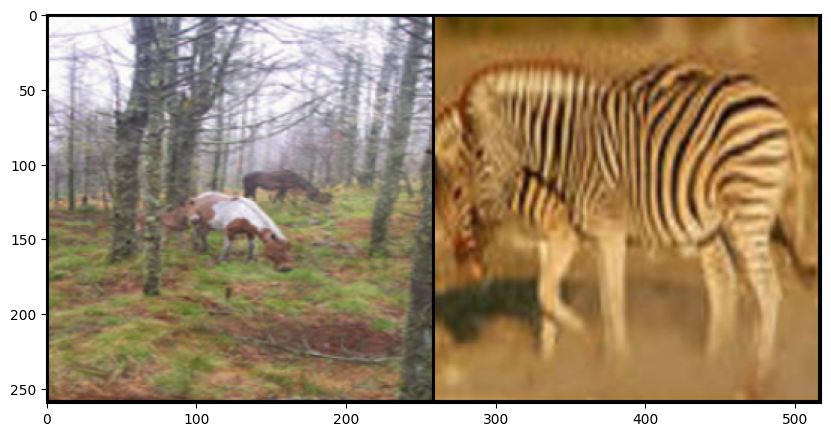

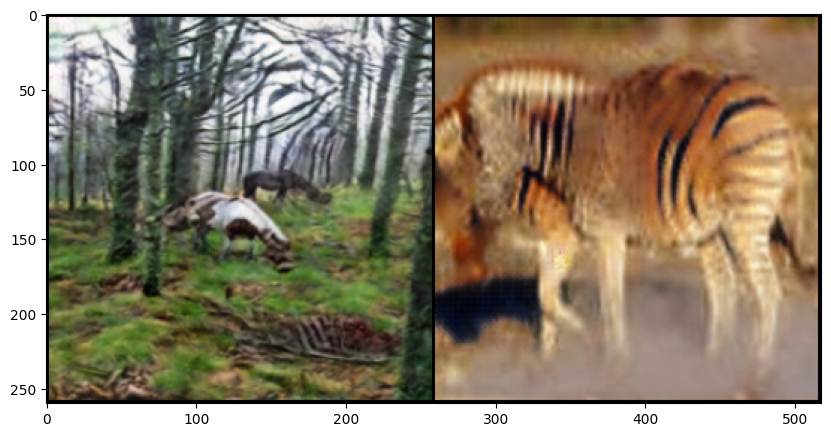

0.323108971118927 + 0.46289753913879395 = 0.786006510257721
0.14451570808887482 + 0.130288228392601 = 0.27480393648147583
0.06845536828041077 + 0.06806966662406921 = 0.13652503490447998
gen_loss: 2.178737163543701 fake_A: tensor([[[[ 0.6482,  0.5803,  0.7392,  ..., -0.0748, -0.1973, -0.0634],
          [ 0.6215,  0.5689,  0.7700,  ..., -0.1776, -0.2077,  0.0030],
          [ 0.6204,  0.5681,  0.8185,  ..., -0.2630, -0.1781,  0.0061],
          ...,
          [ 0.7633,  0.7522,  0.6288,  ..., -0.1575, -0.1820, -0.0349],
          [ 0.7644,  0.7124,  0.5995,  ..., -0.1540, -0.1225, -0.1799],
          [ 0.7104,  0.6633,  0.5320,  ..., -0.1807, -0.0074, -0.1609]],

         [[ 0.6865,  0.5884,  0.7216,  ..., -0.0558, -0.2091, -0.1046],
          [ 0.6709,  0.5622,  0.7467,  ..., -0.1789, -0.1995, -0.0436],
          [ 0.6309,  0.5515,  0.7939,  ..., -0.2467, -0.1762, -0.0261],
          ...,
          [ 0.4872,  0.5412,  0.4047,  ..., -0.1968, -0.2166, -0.0869],
          [ 0.5075,  0.491

0.3776971697807312 + 0.3740242123603821 = 0.7517213821411133
0.1996668577194214 + 0.11706467717885971 = 0.3167315423488617
0.08024661242961884 + 0.06072045490145683 = 0.14096707105636597
gen_loss: 2.1930651664733887 fake_A: tensor([[[[-0.8060, -0.8116, -0.8402,  ...,  0.6801,  0.8444,  0.8916],
          [-0.7983, -0.7853, -0.8033,  ...,  0.7032,  0.8507,  0.9043],
          [-0.7354, -0.7623, -0.7796,  ...,  0.7341,  0.8455,  0.8952],
          ...,
          [-0.8738, -0.8588, -0.8622,  ...,  0.2932,  0.2587,  0.2848],
          [-0.8690, -0.8749, -0.8780,  ...,  0.1798,  0.1314,  0.1579],
          [-0.8672, -0.8678, -0.8828,  ...,  0.1103,  0.1500,  0.1610]],

         [[-0.8237, -0.8396, -0.8621,  ...,  0.6243,  0.7636,  0.8465],
          [-0.8179, -0.8294, -0.8431,  ...,  0.6386,  0.7867,  0.8732],
          [-0.7890, -0.8148, -0.8209,  ...,  0.6860,  0.7753,  0.8555],
          ...,
          [-0.9013, -0.9008, -0.9008,  ...,  0.1962,  0.1492,  0.1586],
          [-0.9177, -0.9

0.6527184844017029 + 0.44510820508003235 = 1.0978267192840576
0.09835854172706604 + 0.09329183399677277 = 0.1916503757238388
0.06132512539625168 + 0.07132452726364136 = 0.13264966011047363
gen_loss: 2.443488359451294 fake_A: tensor([[[[ 0.6672,  0.6617,  0.6280,  ...,  0.2818,  0.1997,  0.3204],
          [ 0.6792,  0.6620,  0.6588,  ...,  0.1994,  0.1902,  0.2948],
          [ 0.7064,  0.6774,  0.6711,  ...,  0.1926,  0.2729,  0.2851],
          ...,
          [ 0.8129,  0.8255,  0.8002,  ...,  0.7026,  0.6698,  0.6549],
          [ 0.8173,  0.7841,  0.7651,  ...,  0.7094,  0.6599,  0.6174],
          [ 0.8393,  0.8078,  0.7718,  ...,  0.6937,  0.6943,  0.6593]],

         [[ 0.2491,  0.2480,  0.2119,  ..., -0.0159, -0.0956,  0.0044],
          [ 0.2616,  0.2167,  0.2176,  ..., -0.0726, -0.1020, -0.0184],
          [ 0.2753,  0.2390,  0.2398,  ..., -0.0931,  0.0080,  0.0053],
          ...,
          [ 0.4539,  0.5262,  0.4826,  ...,  0.2684,  0.2232,  0.2362],
          [ 0.4424,  0.

0.49197298288345337 + 0.3747205138206482 = 0.8666934967041016
0.26765260100364685 + 0.12366782873868942 = 0.39132043719291687
0.05318612605333328 + 0.0831722617149353 = 0.136358380317688
gen_loss: 2.269409418106079 fake_A: tensor([[[[-0.0016,  0.0231,  0.0517,  ...,  0.3379,  0.3518,  0.4065],
          [ 0.0249,  0.0427,  0.0589,  ...,  0.2978,  0.3422,  0.3977],
          [ 0.0321,  0.0427,  0.0464,  ...,  0.3201,  0.3830,  0.4171],
          ...,
          [ 0.2602,  0.3190,  0.1343,  ...,  0.5927,  0.6612,  0.6778],
          [ 0.2744,  0.2960,  0.1412,  ...,  0.6037,  0.6316,  0.6135],
          [ 0.2253,  0.2105, -0.0187,  ...,  0.6020,  0.6855,  0.6416]],

         [[ 0.5144,  0.5525,  0.5792,  ...,  0.7678,  0.7545,  0.7842],
          [ 0.5386,  0.5540,  0.5629,  ...,  0.7487,  0.7658,  0.7858],
          [ 0.5126,  0.5364,  0.5504,  ...,  0.7645,  0.7742,  0.7901],
          ...,
          [-0.2383, -0.1776, -0.3164,  ...,  0.2689,  0.3607,  0.4374],
          [-0.3064, -0.29

0.6130296587944031 + 0.5213379263877869 = 1.13436758518219
0.15842878818511963 + 0.12495593726634979 = 0.2833847403526306
0.06272419542074203 + 0.07556073367595673 = 0.13828492164611816
gen_loss: 2.5455551147460938 fake_A: tensor([[[[-0.8506, -0.8485, -0.8440,  ..., -0.8594, -0.8499, -0.8657],
          [-0.8518, -0.8366, -0.8325,  ..., -0.8484, -0.8401, -0.8476],
          [-0.8414, -0.8448, -0.8429,  ..., -0.8457, -0.8554, -0.8643],
          ...,
          [-0.8911, -0.8923, -0.8930,  ..., -0.8797, -0.8717, -0.8659],
          [-0.8977, -0.9123, -0.9141,  ..., -0.8926, -0.8777, -0.8768],
          [-0.9041, -0.9118, -0.9247,  ..., -0.8922, -0.8823, -0.8751]],

         [[-0.9522, -0.9509, -0.9505,  ..., -0.9442, -0.9409, -0.9395],
          [-0.9493, -0.9480, -0.9499,  ..., -0.9406, -0.9373, -0.9375],
          [-0.9434, -0.9469, -0.9475,  ..., -0.9371, -0.9382, -0.9399],
          ...,
          [-0.9496, -0.9516, -0.9481,  ..., -0.9381, -0.9292, -0.9241],
          [-0.9541, -0.95

0.8441483974456787 + 0.5599691867828369 = 1.4041175842285156
0.16476260125637054 + 0.0691237524151802 = 0.23388636112213135
0.05913744494318962 + 0.07732606679201126 = 0.13646350800991058
gen_loss: 2.7921414375305176 fake_A: tensor([[[[-0.5530, -0.6041, -0.6137,  ..., -0.7257, -0.6985, -0.6852],
          [-0.5628, -0.5713, -0.5862,  ..., -0.7336, -0.6716, -0.6479],
          [-0.5495, -0.5641, -0.5786,  ..., -0.7147, -0.6507, -0.6355],
          ...,
          [ 0.8830,  0.8375,  0.7690,  ...,  0.9129,  0.8849,  0.8098],
          [ 0.8879,  0.8793,  0.8641,  ...,  0.8177,  0.8144,  0.7907],
          [ 0.9265,  0.9082,  0.9065,  ...,  0.6345,  0.7354,  0.6858]],

         [[-0.6006, -0.6182, -0.6201,  ..., -0.7320, -0.6689, -0.6553],
          [-0.5823, -0.5813, -0.5956,  ..., -0.7285, -0.6378, -0.6158],
          [-0.5881, -0.5680, -0.5694,  ..., -0.7081, -0.6127, -0.5987],
          ...,
          [ 0.8529,  0.8314,  0.7525,  ...,  0.8865,  0.8485,  0.7703],
          [ 0.8615,  0.

0.45911240577697754 + 0.5494927167892456 = 1.0086051225662231
0.11413344740867615 + 0.060172028839588165 = 0.17430546879768372
0.06848103553056717 + 0.06543494760990143 = 0.1339159905910492
gen_loss: 2.3651957511901855 fake_A: tensor([[[[-0.7263, -0.7321, -0.7485,  ..., -0.7457, -0.7531, -0.7645],
          [-0.7531, -0.7499, -0.7535,  ..., -0.7725, -0.7866, -0.7704],
          [-0.7520, -0.7720, -0.7730,  ..., -0.7852, -0.7906, -0.7713],
          ...,
          [-0.0548,  0.2031,  0.4406,  ..., -0.1704, -0.2255, -0.2637],
          [-0.0648, -0.0479,  0.3403,  ..., -0.2362, -0.2209, -0.2301],
          [ 0.0391,  0.0759,  0.1638,  ..., -0.0405,  0.0172, -0.0315]],

         [[-0.8594, -0.8754, -0.8856,  ..., -0.8309, -0.8217, -0.8517],
          [-0.8503, -0.8700, -0.8843,  ..., -0.8260, -0.8277, -0.8600],
          [-0.8450, -0.8689, -0.8781,  ..., -0.8325, -0.8382, -0.8682],
          ...,
          [-0.1860,  0.1006,  0.3153,  ..., -0.6115, -0.6322, -0.6455],
          [-0.1808, -

0.38820475339889526 + 0.5616616010665894 = 0.9498663544654846
0.209425151348114 + 0.09893834590911865 = 0.30836349725723267
0.059198688715696335 + 0.09042619913816452 = 0.14962488412857056
gen_loss: 2.4769515991210938 fake_A: tensor([[[[ 0.4625,  0.4538,  0.4218,  ...,  0.6461,  0.7006,  0.6958],
          [ 0.4627,  0.4624,  0.4717,  ...,  0.6116,  0.6955,  0.7251],
          [ 0.4590,  0.4632,  0.4739,  ...,  0.3681,  0.6353,  0.7229],
          ...,
          [ 0.5759,  0.5045,  0.7616,  ...,  0.6998,  0.6708,  0.6934],
          [ 0.7597,  0.8178,  0.8138,  ...,  0.7231,  0.6386,  0.6162],
          [ 0.7600,  0.7709,  0.7281,  ...,  0.6993,  0.6524,  0.6419]],

         [[ 0.2081,  0.2279,  0.1792,  ...,  0.3258,  0.4406,  0.4700],
          [ 0.2332,  0.2386,  0.2077,  ...,  0.2834,  0.4374,  0.4809],
          [ 0.2264,  0.2324,  0.2265,  ...,  0.0187,  0.3303,  0.4530],
          ...,
          [ 0.2366,  0.1776,  0.5814,  ...,  0.7615,  0.6937,  0.7026],
          [ 0.5455,  0

0.46664413809776306 + 0.45037761330604553 = 0.9170217514038086
0.13883104920387268 + 0.13869106769561768 = 0.27752211689949036
0.07542361319065094 + 0.09253831952810287 = 0.16796192526817322
gen_loss: 2.6243932247161865 fake_A: tensor([[[[0.4981, 0.4799, 0.5519,  ..., 0.5007, 0.4547, 0.2578],
          [0.2490, 0.1519, 0.1587,  ..., 0.4064, 0.4358, 0.3326],
          [0.2210, 0.2551, 0.2591,  ..., 0.0408, 0.1082, 0.2048],
          ...,
          [0.4568, 0.4208, 0.4242,  ..., 0.5416, 0.5109, 0.4481],
          [0.4833, 0.4481, 0.5047,  ..., 0.6468, 0.5451, 0.4716],
          [0.5509, 0.5269, 0.5967,  ..., 0.5210, 0.5038, 0.4545]],

         [[0.4326, 0.4366, 0.5073,  ..., 0.5369, 0.4354, 0.2897],
          [0.2415, 0.0979, 0.1463,  ..., 0.4428, 0.4409, 0.3302],
          [0.1947, 0.2260, 0.2687,  ..., 0.1181, 0.1625, 0.2415],
          ...,
          [0.5045, 0.5078, 0.5430,  ..., 0.6018, 0.5652, 0.5505],
          [0.4931, 0.4800, 0.5825,  ..., 0.7129, 0.6215, 0.5922],
          [0.5

0.37986963987350464 + 0.5037332773208618 = 0.8836029171943665
0.1265832483768463 + 0.13282416760921478 = 0.2594074010848999
0.07561711966991425 + 0.07788164913654327 = 0.15349876880645752
gen_loss: 2.4445314407348633 fake_A: tensor([[[[-0.5460, -0.4858, -0.3376,  ..., -0.8028, -0.8118, -0.8085],
          [-0.5341, -0.5304, -0.3907,  ..., -0.8084, -0.7955, -0.7725],
          [-0.5373, -0.5798, -0.5454,  ..., -0.7819, -0.7778, -0.7433],
          ...,
          [-0.0303, -0.0898, -0.0041,  ...,  0.1152,  0.0656,  0.0675],
          [-0.0665, -0.0369, -0.0094,  ...,  0.1422,  0.0083,  0.0494],
          [-0.0681, -0.0120, -0.0518,  ...,  0.2068,  0.1102,  0.0843]],

         [[-0.5075, -0.4335, -0.2541,  ..., -0.8679, -0.8571, -0.8521],
          [-0.4587, -0.4874, -0.2908,  ..., -0.8542, -0.8410, -0.8440],
          [-0.4731, -0.4924, -0.4219,  ..., -0.8219, -0.8497, -0.8570],
          ...,
          [ 0.0859,  0.0486,  0.1204,  ...,  0.2284,  0.2289,  0.2226],
          [ 0.0521,  0.

0.49678510427474976 + 0.5165626406669617 = 1.0133477449417114
0.14748011529445648 + 0.12770581245422363 = 0.2751859426498413
0.0687839686870575 + 0.08100388199090958 = 0.14978784322738647
gen_loss: 2.5387449264526367 fake_A: tensor([[[[-0.4908, -0.5474, -0.5579,  ..., -0.3174, -0.2930, -0.3630],
          [-0.4971, -0.5392, -0.5603,  ..., -0.2832, -0.2670, -0.3353],
          [-0.4762, -0.5276, -0.5310,  ..., -0.3219, -0.3022, -0.3444],
          ...,
          [ 0.2492,  0.2417,  0.2225,  ...,  0.4151,  0.3334,  0.3323],
          [ 0.2810,  0.2736,  0.3056,  ...,  0.4229,  0.3645,  0.3830],
          [ 0.4119,  0.4149,  0.4244,  ...,  0.4759,  0.4909,  0.4778]],

         [[-0.4085, -0.4079, -0.3744,  ..., -0.2246, -0.2719, -0.3059],
          [-0.3541, -0.3589, -0.3855,  ..., -0.1742, -0.2037, -0.2623],
          [-0.4110, -0.3982, -0.3937,  ..., -0.2070, -0.2522, -0.2650],
          ...,
          [-0.0176, -0.0617, -0.1150,  ...,  0.1232,  0.0696,  0.0847],
          [-0.0289, -0.

0.4878208637237549 + 0.35677409172058105 = 0.8445949554443359
0.25706690549850464 + 0.17331652343273163 = 0.43038344383239746
0.08710372447967529 + 0.12197961658239365 = 0.20908334851264954
gen_loss: 2.978466749191284 fake_A: tensor([[[[-0.3016, -0.3097, -0.3032,  ..., -0.0008, -0.0234, -0.0508],
          [-0.3487, -0.3356, -0.2942,  ...,  0.0435, -0.0425, -0.0571],
          [-0.3407, -0.3135, -0.2878,  ...,  0.0835,  0.0169, -0.0077],
          ...,
          [-0.2691, -0.2633, -0.3243,  ...,  0.0655,  0.0857,  0.0757],
          [-0.2221, -0.2221, -0.2149,  ...,  0.0247,  0.1125,  0.0768],
          [-0.2193, -0.2262, -0.2290,  ..., -0.0440,  0.0278, -0.0287]],

         [[-0.2796, -0.2329, -0.2149,  ...,  0.0395,  0.0248,  0.0028],
          [-0.2374, -0.1737, -0.1159,  ...,  0.1263,  0.0344,  0.0048],
          [-0.2333, -0.1441, -0.1032,  ...,  0.1538,  0.0638,  0.0457],
          ...,
          [-0.3002, -0.2870, -0.3459,  ...,  0.0546,  0.0721,  0.0753],
          [-0.2410, -0

0.598162055015564 + 0.34604814648628235 = 0.9442101716995239
0.13809294998645782 + 0.13680197298526764 = 0.27489492297172546
0.0820109099149704 + 0.07859621942043304 = 0.16060712933540344
gen_loss: 2.577770948410034 fake_A: tensor([[[[ 0.2102,  0.1957,  0.1495,  ...,  0.1865,  0.1172,  0.0915],
          [ 0.1731,  0.1967,  0.1361,  ...,  0.1489,  0.1169,  0.1289],
          [ 0.1712,  0.2335,  0.1294,  ...,  0.0805,  0.0690,  0.0733],
          ...,
          [ 0.3136,  0.3232,  0.3443,  ...,  0.5971,  0.5679,  0.5654],
          [ 0.2911,  0.2791,  0.2527,  ...,  0.3931,  0.4863,  0.4698],
          [ 0.2074,  0.1732,  0.1898,  ...,  0.3570,  0.5011,  0.4851]],

         [[ 0.1285,  0.1470,  0.1082,  ...,  0.1206,  0.0453,  0.0280],
          [ 0.0988,  0.1208,  0.0561,  ...,  0.0523,  0.0295,  0.0330],
          [ 0.0728,  0.1381,  0.0281,  ..., -0.0139, -0.0274, -0.0114],
          ...,
          [ 0.1758,  0.1979,  0.2148,  ...,  0.2697,  0.2653,  0.2244],
          [ 0.1508,  0.1

0.4545885920524597 + 0.36775362491607666 = 0.8223422169685364
0.1433572620153427 + 0.10864543914794922 = 0.2520027160644531
0.0803731381893158 + 0.061529215425252914 = 0.141902357339859
gen_loss: 2.266566038131714 fake_A: tensor([[[[ 0.2997,  0.3135,  0.3572,  ..., -0.6178, -0.5082, -0.5232],
          [ 0.2740,  0.3344,  0.3942,  ..., -0.5748, -0.4716, -0.5042],
          [ 0.1557,  0.1526,  0.2178,  ..., -0.4941, -0.4334, -0.4878],
          ...,
          [ 0.4784,  0.4063,  0.3479,  ...,  0.1085, -0.0437,  0.0070],
          [ 0.4362,  0.4276,  0.3884,  ...,  0.1188, -0.0144, -0.0512],
          [ 0.4013,  0.4264,  0.4388,  ..., -0.0800, -0.0755, -0.1577]],

         [[ 0.5334,  0.5493,  0.5740,  ..., -0.5060, -0.3740, -0.4357],
          [ 0.4567,  0.5064,  0.5300,  ..., -0.4484, -0.3101, -0.3841],
          [ 0.4141,  0.3618,  0.3746,  ..., -0.4223, -0.2951, -0.3772],
          ...,
          [ 0.3464,  0.3097,  0.2815,  ..., -0.0515, -0.1378, -0.1271],
          [ 0.2598,  0.320

0.46513569355010986 + 0.5099380016326904 = 0.9750736951828003
0.1727490872144699 + 0.1455259770154953 = 0.3182750642299652
0.06328178942203522 + 0.05618930980563164 = 0.11947110295295715
gen_loss: 2.2016119956970215 fake_A: tensor([[[[-0.3164, -0.2878, -0.2362,  ...,  0.2687,  0.3770,  0.4268],
          [-0.3118, -0.3127, -0.2452,  ...,  0.3247,  0.4012,  0.4592],
          [-0.3245, -0.3331, -0.2685,  ...,  0.2856,  0.4065,  0.4654],
          ...,
          [ 0.4440,  0.4720,  0.5040,  ...,  0.1629,  0.1703,  0.0637],
          [ 0.6579,  0.6711,  0.7068,  ...,  0.1797,  0.1564,  0.0328],
          [ 0.7007,  0.6977,  0.7192,  ...,  0.1064,  0.0577, -0.0341]],

         [[-0.1619, -0.1409, -0.0796,  ...,  0.2483,  0.3242,  0.4312],
          [-0.1352, -0.1455, -0.0819,  ...,  0.2973,  0.3719,  0.4608],
          [-0.1336, -0.1526, -0.0934,  ...,  0.2793,  0.3669,  0.4529],
          ...,
          [ 0.4319,  0.4684,  0.5127,  ...,  0.1892,  0.2467,  0.1635],
          [ 0.6277,  0.6

0.5562841296195984 + 0.3976677358150482 = 0.9539518356323242
0.18046359717845917 + 0.09589289128780365 = 0.2763564884662628
0.1644153743982315 + 0.06200399994850159 = 0.2264193743467331
gen_loss: 3.245781183242798 fake_A: tensor([[[[ 0.2957,  0.2994,  0.3055,  ..., -0.1474, -0.1330, -0.1237],
          [ 0.3136,  0.3091,  0.3246,  ..., -0.0991, -0.1209, -0.1018],
          [ 0.3158,  0.3114,  0.3160,  ..., -0.0615, -0.0804, -0.0843],
          ...,
          [ 0.5485,  0.5216,  0.4061,  ..., -0.4403, -0.2029, -0.2436],
          [ 0.5237,  0.4588,  0.3533,  ..., -0.4578, -0.2661, -0.2744],
          [ 0.5145,  0.4558,  0.3460,  ..., -0.4988, -0.3542, -0.3275]],

         [[ 0.3144,  0.3324,  0.3565,  ...,  0.0215,  0.0295,  0.0390],
          [ 0.3644,  0.3481,  0.3576,  ...,  0.0655,  0.0544,  0.0669],
          [ 0.3570,  0.3531,  0.3568,  ...,  0.0957,  0.0723,  0.0767],
          ...,
          [ 0.3022,  0.3172,  0.1806,  ..., -0.4148, -0.1683, -0.1971],
          [ 0.2979,  0.283

0.46736282110214233 + 0.2592551112174988 = 0.7266179323196411
0.1460014134645462 + 0.09053671360015869 = 0.2365381270647049
0.0630045086145401 + 0.05815108120441437 = 0.12115558981895447
gen_loss: 1.9618277549743652 fake_A: tensor([[[[ 0.1811,  0.1561,  0.1818,  ...,  0.4033,  0.4025,  0.4064],
          [ 0.2236,  0.2168,  0.2774,  ...,  0.3650,  0.3718,  0.4104],
          [ 0.4631,  0.4581,  0.4839,  ...,  0.5019,  0.4595,  0.4471],
          ...,
          [ 0.1322,  0.1322,  0.1688,  ...,  0.1567,  0.1720,  0.2026],
          [ 0.1611,  0.1520,  0.1865,  ...,  0.1167,  0.1607,  0.2101],
          [ 0.3072,  0.2789,  0.2628,  ...,  0.1874,  0.2272,  0.2424]],

         [[ 0.1734,  0.1701,  0.1588,  ...,  0.3848,  0.3817,  0.3713],
          [ 0.2348,  0.2180,  0.2325,  ...,  0.3251,  0.3449,  0.3783],
          [ 0.4171,  0.3928,  0.3970,  ...,  0.4369,  0.4087,  0.3904],
          ...,
          [ 0.0467,  0.0564,  0.0733,  ...,  0.0550,  0.0691,  0.1024],
          [ 0.0370,  0.0

0.6599901914596558 + 0.4598371386528015 = 1.1198272705078125
0.25709211826324463 + 0.07752524316310883 = 0.33461737632751465
0.06410451233386993 + 0.06360971182584763 = 0.12771421670913696
gen_loss: 2.4304311275482178 fake_A: tensor([[[[-0.5511, -0.5548, -0.5253,  ...,  0.1280,  0.3141,  0.4708],
          [-0.5303, -0.5312, -0.5158,  ...,  0.1600,  0.3636,  0.5356],
          [-0.4967, -0.5133, -0.5267,  ...,  0.2947,  0.5553,  0.6545],
          ...,
          [ 0.9795,  0.9799,  0.9815,  ...,  0.5684,  0.4892,  0.6011],
          [ 0.9807,  0.9808,  0.9771,  ...,  0.5122,  0.4795,  0.5646],
          [ 0.9850,  0.9837,  0.9830,  ...,  0.5614,  0.6091,  0.6450]],

         [[-0.3688, -0.3564, -0.3258,  ...,  0.2536,  0.3843,  0.5177],
          [-0.3614, -0.3608, -0.3587,  ...,  0.2721,  0.4601,  0.5942],
          [-0.3377, -0.3694, -0.3811,  ...,  0.3876,  0.6014,  0.6730],
          ...,
          [ 0.9438,  0.9518,  0.9528,  ...,  0.2369,  0.1455,  0.2910],
          [ 0.9466,  0

0.7514493465423584 + 0.5575878620147705 = 1.309037208557129
0.11090724915266037 + 0.08075837045907974 = 0.1916656196117401
0.06910043209791183 + 0.05877770483493805 = 0.1278781294822693
gen_loss: 2.606985092163086 fake_A: tensor([[[[-0.7049, -0.6873, -0.6581,  ..., -0.4685, -0.4516, -0.4570],
          [-0.6987, -0.6848, -0.6656,  ..., -0.4410, -0.4526, -0.4526],
          [-0.6823, -0.6161, -0.6238,  ..., -0.4221, -0.4367, -0.4534],
          ...,
          [-0.4420, -0.4593, -0.4605,  ..., -0.3869, -0.4099, -0.4413],
          [-0.4479, -0.4693, -0.4920,  ..., -0.3990, -0.4706, -0.4773],
          [-0.4392, -0.4611, -0.5022,  ..., -0.4205, -0.4836, -0.4679]],

         [[-0.7566, -0.7337, -0.7040,  ..., -0.4614, -0.4394, -0.4407],
          [-0.7260, -0.7253, -0.7029,  ..., -0.4383, -0.4266, -0.4372],
          [-0.7105, -0.6506, -0.6532,  ..., -0.4167, -0.4191, -0.4363],
          ...,
          [-0.2555, -0.2698, -0.2734,  ..., -0.2278, -0.2322, -0.2791],
          [-0.2663, -0.298

0.5625125765800476 + 0.4931439459323883 = 1.0556565523147583
0.1692836731672287 + 0.15833166241645813 = 0.32761532068252563
0.09469255059957504 + 0.07499987632036209 = 0.16969242691993713
gen_loss: 2.785342216491699 fake_A: tensor([[[[ 0.9491,  0.9428,  0.9428,  ..., -0.3613, -0.1462,  0.2480],
          [ 0.9607,  0.9504,  0.9512,  ..., -0.2405,  0.0189,  0.4447],
          [ 0.9649,  0.9607,  0.9635,  ...,  0.1997,  0.3743,  0.5044],
          ...,
          [ 0.3534,  0.4010,  0.4151,  ..., -0.1302, -0.2106, -0.2653],
          [ 0.2866,  0.3100,  0.2688,  ...,  0.1216, -0.1801, -0.2581],
          [ 0.3089,  0.3352,  0.2856,  ...,  0.2021,  0.0509, -0.0552]],

         [[ 0.7178,  0.6939,  0.6804,  ..., -0.4901, -0.3277,  0.0623],
          [ 0.7305,  0.6470,  0.6708,  ..., -0.3415, -0.1040,  0.2869],
          [ 0.7005,  0.7231,  0.7106,  ...,  0.0370,  0.2211,  0.3829],
          ...,
          [ 0.2319,  0.2429,  0.2695,  ..., -0.3466, -0.3911, -0.4677],
          [ 0.0639,  0.0

0.539324164390564 + 0.3522840738296509 = 0.8916082382202148
0.12287017703056335 + 0.09074518084526062 = 0.21361535787582397
0.07590732723474503 + 0.07453309744596481 = 0.15044042468070984
gen_loss: 2.4173741340637207 fake_A: tensor([[[[-0.0596, -0.0058,  0.0297,  ...,  0.1640,  0.1065,  0.0199],
          [-0.0801,  0.0316,  0.0639,  ...,  0.1978,  0.1577,  0.0392],
          [-0.0965,  0.0626,  0.1496,  ...,  0.2374,  0.1540, -0.0276],
          ...,
          [-0.1687, -0.1980, -0.1966,  ...,  0.3106,  0.4220,  0.5010],
          [-0.1791, -0.1991, -0.2126,  ..., -0.0331,  0.1416,  0.3543],
          [-0.2081, -0.2295, -0.2615,  ...,  0.0009,  0.1005,  0.2767]],

         [[-0.1875, -0.1697, -0.0888,  ...,  0.0255, -0.0375, -0.0830],
          [-0.1940, -0.1507, -0.1317,  ...,  0.0486,  0.0255, -0.0871],
          [-0.1830, -0.1213, -0.0446,  ...,  0.0836, -0.0080, -0.1647],
          ...,
          [-0.0201, -0.0175, -0.0122,  ...,  0.3584,  0.4414,  0.4835],
          [-0.0280, -0.

0.4655545949935913 + 0.3709299862384796 = 0.8364845514297485
0.18563854694366455 + 0.0841391384601593 = 0.26977768540382385
0.05808533355593681 + 0.083405040204525 = 0.1414903700351715
gen_loss: 2.2783660888671875 fake_A: tensor([[[[ 6.8425e-01,  7.0124e-01,  7.4665e-01,  ...,  7.5902e-01,
            6.7462e-01,  7.7425e-01],
          [ 6.6466e-01,  6.7673e-01,  6.6715e-01,  ...,  7.7196e-01,
            7.0210e-01,  7.7869e-01],
          [ 3.4880e-01,  3.9621e-01,  4.5081e-01,  ...,  5.1657e-01,
            6.2475e-01,  7.1533e-01],
          ...,
          [ 5.0957e-01,  5.1415e-01,  4.3832e-01,  ...,  5.5413e-01,
            5.8091e-01,  6.6398e-01],
          [ 4.9413e-01,  5.1210e-01,  4.2855e-01,  ...,  5.3495e-01,
            6.0479e-01,  6.7052e-01],
          [ 5.5563e-01,  5.8302e-01,  5.3223e-01,  ...,  5.7565e-01,
            6.2493e-01,  6.8072e-01]],

         [[ 6.5165e-01,  6.8547e-01,  7.1616e-01,  ...,  7.1677e-01,
            6.4233e-01,  7.7819e-01],
          [ 

0.4573024809360504 + 0.3722791373729706 = 0.829581618309021
0.17369364202022552 + 0.104810431599617 = 0.27850407361984253
0.07108241319656372 + 0.07414271682500839 = 0.1452251374721527
gen_loss: 2.309683322906494 fake_A: tensor([[[[ 0.0959,  0.1025,  0.0782,  ..., -0.0839, -0.0340, -0.0229],
          [ 0.1099,  0.1016,  0.0959,  ..., -0.0556, -0.0451, -0.0359],
          [ 0.0721,  0.0788,  0.0976,  ..., -0.0344, -0.0586, -0.0676],
          ...,
          [ 0.3553,  0.3842,  0.4197,  ...,  0.1457,  0.1626,  0.3051],
          [ 0.3051,  0.2858,  0.3728,  ...,  0.3514,  0.2820,  0.2974],
          [ 0.3019,  0.2908,  0.3056,  ...,  0.3718,  0.4312,  0.3930]],

         [[ 0.3681,  0.3746,  0.3595,  ...,  0.2509,  0.2869,  0.3107],
          [ 0.3781,  0.3706,  0.3697,  ...,  0.2626,  0.3015,  0.3190],
          [ 0.3561,  0.3491,  0.3750,  ...,  0.2654,  0.2610,  0.2814],
          ...,
          [ 0.3684,  0.4274,  0.4459,  ...,  0.1943,  0.2033,  0.3551],
          [ 0.3128,  0.3251

0.3484436869621277 + 0.43358516693115234 = 0.78202885389328
0.17238283157348633 + 0.09937011450529099 = 0.2717529535293579
0.06561745703220367 + 0.07425808906555176 = 0.13987554609775543
gen_loss: 2.2079596519470215 fake_A: tensor([[[[-0.8519, -0.8646, -0.8697,  ..., -0.9183, -0.9172, -0.9244],
          [-0.8450, -0.8412, -0.8685,  ..., -0.9297, -0.9217, -0.9235],
          [-0.8655, -0.8602, -0.8797,  ..., -0.9292, -0.9334, -0.9314],
          ...,
          [ 0.1890,  0.1768,  0.2249,  ..., -0.8686, -0.8997, -0.8853],
          [ 0.3594,  0.2538,  0.3861,  ..., -0.8846, -0.8725, -0.8645],
          [ 0.4900,  0.4199,  0.4237,  ..., -0.8723, -0.8803, -0.8694]],

         [[-0.8435, -0.8513, -0.8602,  ..., -0.9364, -0.9321, -0.9218],
          [-0.7933, -0.8107, -0.8418,  ..., -0.9293, -0.9248, -0.9208],
          [-0.8186, -0.8292, -0.8470,  ..., -0.9255, -0.9332, -0.9286],
          ...,
          [ 0.1706,  0.1582,  0.1467,  ..., -0.8114, -0.8515, -0.8560],
          [ 0.2981,  0.2

0.8086485862731934 + 0.5800879001617432 = 1.3887364864349365
0.158212810754776 + 0.08210568130016327 = 0.24031849205493927
0.07353595644235611 + 0.060688503086566925 = 0.13422445952892303
gen_loss: 2.7550129890441895 fake_A: tensor([[[[-0.7483, -0.7683, -0.7381,  ..., -0.6762, -0.7333, -0.7333],
          [-0.7388, -0.7444, -0.7265,  ..., -0.6471, -0.7052, -0.7028],
          [-0.6912, -0.7281, -0.7323,  ..., -0.6308, -0.6846, -0.6896],
          ...,
          [-0.5542, -0.5571, -0.5873,  ...,  0.8053,  0.6923,  0.3769],
          [-0.5938, -0.6540, -0.6203,  ...,  0.8162,  0.6323,  0.3266],
          [-0.6564, -0.7250, -0.7021,  ...,  0.7757,  0.7065,  0.4318]],

         [[-0.7589, -0.7525, -0.7171,  ..., -0.7090, -0.7667, -0.7581],
          [-0.7333, -0.7212, -0.6958,  ..., -0.6499, -0.7151, -0.7260],
          [-0.6939, -0.6893, -0.7004,  ..., -0.6378, -0.6998, -0.7008],
          ...,
          [-0.5586, -0.5504, -0.5601,  ...,  0.7779,  0.6789,  0.3842],
          [-0.6089, -0.

0.5400476455688477 + 0.4139764904975891 = 0.9540241360664368
0.12692655622959137 + 0.10830818116664886 = 0.23523473739624023
0.08946482837200165 + 0.04968896508216858 = 0.13915379345417023
gen_loss: 2.3690855503082275 fake_A: tensor([[[[-5.8079e-02,  1.3510e-01,  2.1336e-01,  ...,  9.6236e-02,
            1.0335e-01,  1.3400e-01],
          [-6.7168e-02,  1.3253e-01,  2.0919e-01,  ...,  1.2785e-01,
            1.2400e-01,  1.5986e-01],
          [-7.6327e-02,  1.2532e-01,  2.0664e-01,  ...,  2.0072e-01,
            1.9661e-01,  1.9458e-01],
          ...,
          [-7.1340e-02,  9.4987e-02,  2.3853e-01,  ...,  1.4945e-01,
            1.0739e-01,  1.3540e-01],
          [-7.9430e-02,  5.2825e-06,  1.0638e-01,  ...,  1.7906e-01,
            1.7701e-01,  1.5342e-01],
          [-6.4902e-02, -3.7363e-02, -2.3340e-02,  ...,  2.1443e-01,
            2.5102e-01,  2.0491e-01]],

         [[-1.2301e-01,  9.0660e-02,  1.5550e-01,  ...,  2.6530e-01,
            2.5833e-01,  2.8217e-01],
        

0.5733317136764526 + 0.565478503704071 = 1.138810157775879
0.16399139165878296 + 0.06550104171037674 = 0.2294924259185791
0.058461569249629974 + 0.07490485161542892 = 0.1333664208650589
gen_loss: 2.4954235553741455 fake_A: tensor([[[[ 1.1812e-01,  1.6130e-01,  9.2690e-02,  ..., -7.3299e-01,
           -6.7542e-01, -6.7220e-01],
          [ 3.6865e-01,  4.2662e-01,  3.4003e-01,  ..., -7.6667e-01,
           -7.1560e-01, -6.9230e-01],
          [ 4.2764e-01,  5.0542e-01,  4.7282e-01,  ..., -7.5230e-01,
           -7.4502e-01, -7.4653e-01],
          ...,
          [-7.5183e-01, -7.3374e-01, -7.5132e-01,  ...,  5.4163e-01,
            4.8795e-01,  4.6997e-01],
          [-7.4337e-01, -7.4627e-01, -7.4627e-01,  ...,  5.1991e-01,
            4.7025e-01,  4.2756e-01],
          [-7.7070e-01, -7.6982e-01, -7.7091e-01,  ...,  5.1457e-01,
            5.2256e-01,  4.7546e-01]],

         [[-4.8718e-02,  3.9626e-02, -2.9429e-02,  ..., -6.6906e-01,
           -5.6446e-01, -5.4509e-01],
          [

0.3767751157283783 + 0.3195231854915619 = 0.6962983012199402
0.20709262788295746 + 0.20393821597099304 = 0.4110308289527893
0.07048413157463074 + 0.10029934346675873 = 0.17078347504138947
gen_loss: 2.4452362060546875 fake_A: tensor([[[[-0.1899, -0.2568, -0.3653,  ...,  0.4986,  0.5001,  0.4107],
          [-0.4668, -0.3401, -0.3356,  ...,  0.5197,  0.4453,  0.3697],
          [-0.2319, -0.1850, -0.1189,  ...,  0.7261,  0.5441,  0.4159],
          ...,
          [ 0.4234,  0.4248,  0.2959,  ..., -0.4216, -0.4047, -0.4910],
          [ 0.2797,  0.3088,  0.1956,  ..., -0.4432, -0.4261, -0.5013],
          [ 0.1563,  0.1471, -0.0451,  ..., -0.4102, -0.4499, -0.5176]],

         [[-0.0437, -0.0835, -0.2151,  ...,  0.4005,  0.4479,  0.3544],
          [-0.3032, -0.2307, -0.2373,  ...,  0.4204,  0.3961,  0.3349],
          [-0.1816, -0.1443, -0.0168,  ...,  0.6754,  0.5111,  0.3849],
          ...,
          [ 0.3616,  0.3639,  0.2676,  ..., -0.4620, -0.4233, -0.4612],
          [ 0.1947,  0.

0.447999507188797 + 0.40604692697525024 = 0.8540464639663696
0.1385127305984497 + 0.09308993816375732 = 0.23160266876220703
0.06498293578624725 + 0.0708022266626358 = 0.13578516244888306
gen_loss: 2.235058307647705 fake_A: tensor([[[[ 0.9227,  0.8985,  0.8953,  ...,  0.9006,  0.8972,  0.9102],
          [ 0.9218,  0.9114,  0.9102,  ...,  0.8986,  0.8940,  0.9077],
          [ 0.9222,  0.9112,  0.9108,  ...,  0.9022,  0.9097,  0.8994],
          ...,
          [ 0.1075,  0.1733,  0.2625,  ..., -0.4234, -0.0660,  0.2396],
          [ 0.1671,  0.1912,  0.1891,  ..., -0.2504,  0.0286,  0.2132],
          [ 0.0752,  0.0586,  0.0961,  ..., -0.2412, -0.0117,  0.1601]],

         [[ 0.9542,  0.9524,  0.9533,  ...,  0.9272,  0.9145,  0.9327],
          [ 0.9441,  0.9410,  0.9456,  ...,  0.9231,  0.9147,  0.9377],
          [ 0.9392,  0.9377,  0.9361,  ...,  0.9277,  0.9288,  0.9314],
          ...,
          [ 0.0997,  0.1529,  0.2133,  ..., -0.4273, -0.1711,  0.1754],
          [ 0.1065,  0.14

0.4301062226295471 + 0.44971996545791626 = 0.8798261880874634
0.13939017057418823 + 0.07664301991462708 = 0.2160331904888153
0.0658111497759819 + 0.09334629029035568 = 0.15915744006633759
gen_loss: 2.4930038452148438 fake_A: tensor([[[[ 0.9445,  0.9197,  0.9181,  ...,  0.9595,  0.9665,  0.9727],
          [ 0.9146,  0.9027,  0.8990,  ...,  0.9632,  0.9622,  0.9711],
          [ 0.9398,  0.9351,  0.9355,  ...,  0.9660,  0.9673,  0.9714],
          ...,
          [ 0.8986,  0.9098,  0.9284,  ..., -0.0144,  0.6550,  0.7382],
          [ 0.9430,  0.9341,  0.9384,  ...,  0.3846,  0.7208,  0.7542],
          [ 0.9727,  0.9550,  0.9602,  ...,  0.5718,  0.6954,  0.7597]],

         [[ 0.9195,  0.8941,  0.8895,  ...,  0.8933,  0.9403,  0.9571],
          [ 0.8689,  0.8599,  0.8568,  ...,  0.9031,  0.9344,  0.9626],
          [ 0.8935,  0.8833,  0.8740,  ...,  0.9146,  0.9454,  0.9587],
          ...,
          [ 0.8483,  0.8597,  0.8873,  ...,  0.2514,  0.7498,  0.8334],
          [ 0.8944,  0.

0.37963756918907166 + 0.5098758935928345 = 0.8895134925842285
0.14917302131652832 + 0.10019747912883759 = 0.2493705004453659
0.08597718924283981 + 0.09508858621120453 = 0.18106576800346375
gen_loss: 2.7251081466674805 fake_A: tensor([[[[-0.3258, -0.3865, -0.3822,  ...,  0.0896, -0.0152, -0.1033],
          [-0.1706, -0.1986, -0.2140,  ..., -0.0351, -0.0079, -0.0012],
          [-0.1113, -0.0697, -0.0645,  ..., -0.2310, -0.1848, -0.1206],
          ...,
          [ 0.1881,  0.2352,  0.1898,  ...,  0.0505,  0.0059,  0.0146],
          [ 0.2914,  0.2041,  0.2304,  ...,  0.0244, -0.0239, -0.0419],
          [ 0.3020,  0.1965,  0.1787,  ..., -0.0334,  0.0205, -0.0200]],

         [[-0.3309, -0.3492, -0.2856,  ...,  0.0623,  0.0218, -0.0406],
          [-0.1824, -0.1804, -0.1406,  ..., -0.0543,  0.0391,  0.0452],
          [-0.1265, -0.0525, -0.0055,  ..., -0.2242, -0.1360, -0.0821],
          ...,
          [ 0.4121,  0.4124,  0.3514,  ...,  0.2406,  0.2492,  0.2627],
          [ 0.5156,  0

0.45864546298980713 + 0.35772836208343506 = 0.8163738250732422
0.11673448979854584 + 0.1157655343413353 = 0.23250001668930054
0.08521547168493271 + 0.07884014397859573 = 0.16405561566352844
gen_loss: 2.480179786682129 fake_A: tensor([[[[-0.6911, -0.7222, -0.7444,  ..., -0.5693, -0.6644, -0.4301],
          [-0.7376, -0.7463, -0.7602,  ..., -0.5887, -0.5854, -0.3418],
          [-0.7116, -0.7456, -0.7516,  ..., -0.5888, -0.5162, -0.3750],
          ...,
          [-0.4925, -0.1489,  0.1671,  ...,  0.9580,  0.9555,  0.9400],
          [-0.3493, -0.1838,  0.1546,  ...,  0.9205,  0.9099,  0.8993],
          [-0.3313, -0.2660, -0.1620,  ...,  0.9272,  0.9169,  0.8770]],

         [[-0.7368, -0.7653, -0.7680,  ..., -0.5662, -0.6724, -0.4534],
          [-0.7101, -0.7377, -0.7569,  ..., -0.5522, -0.5615, -0.3198],
          [-0.7514, -0.7565, -0.7514,  ..., -0.5482, -0.5099, -0.3209],
          ...,
          [-0.5299, -0.1514,  0.1379,  ...,  0.9394,  0.9239,  0.9172],
          [-0.4364, -0

0.4339757561683655 + 0.3828151524066925 = 0.8167909383773804
0.13317465782165527 + 0.06635034829378128 = 0.19952499866485596
0.08030764758586884 + 0.07428392022848129 = 0.15459156036376953
gen_loss: 2.3826589584350586 fake_A: tensor([[[[ 0.1792,  0.1288,  0.1762,  ...,  0.9000,  0.9032,  0.9076],
          [ 0.2180,  0.1855,  0.1896,  ...,  0.9073,  0.9117,  0.9127],
          [ 0.1532,  0.1287,  0.1666,  ...,  0.9270,  0.9304,  0.9216],
          ...,
          [ 0.3313,  0.2988,  0.2950,  ...,  0.6393,  0.6415,  0.6101],
          [ 0.2308,  0.2619,  0.2283,  ...,  0.5204,  0.5528,  0.4972],
          [ 0.2474,  0.2597,  0.2710,  ...,  0.5060,  0.5446,  0.4606]],

         [[ 0.3083,  0.2959,  0.3338,  ...,  0.8289,  0.8287,  0.8425],
          [ 0.3634,  0.3172,  0.2942,  ...,  0.8270,  0.8305,  0.8343],
          [ 0.3240,  0.2690,  0.2894,  ...,  0.8498,  0.8529,  0.8354],
          ...,
          [ 0.4655,  0.3865,  0.3779,  ...,  0.6948,  0.6806,  0.6402],
          [ 0.3599,  0

0.3563099503517151 + 0.33721083402633667 = 0.6935207843780518
0.29092252254486084 + 0.15549293160438538 = 0.4464154541492462
0.09759466350078583 + 0.12308013439178467 = 0.2206747978925705
gen_loss: 2.9449102878570557 fake_A: tensor([[[[-0.4543, -0.5070, -0.6200,  ..., -0.0117, -0.0054, -0.2174],
          [-0.4599, -0.5416, -0.6190,  ...,  0.0401,  0.0707, -0.1333],
          [-0.4673, -0.5453, -0.6245,  ...,  0.0427, -0.0478, -0.2637],
          ...,
          [-0.3058, -0.3373, -0.3383,  ..., -0.2572, -0.1506, -0.3605],
          [ 0.0604,  0.0338, -0.0222,  ..., -0.2816, -0.2735, -0.3430],
          [ 0.1611,  0.0830,  0.1584,  ..., -0.3446, -0.3670, -0.3990]],

         [[-0.6706, -0.6658, -0.7029,  ..., -0.2846, -0.3192, -0.4238],
          [-0.6445, -0.6537, -0.6920,  ..., -0.2262, -0.2088, -0.3764],
          [-0.6287, -0.6564, -0.6873,  ..., -0.1998, -0.3160, -0.4381],
          ...,
          [-0.0956, -0.1441, -0.1771,  ..., -0.2155, -0.0981, -0.2897],
          [ 0.2163,  0.

0.46307072043418884 + 0.4181263744831085 = 0.8811970949172974
0.1110619530081749 + 0.10495781898498535 = 0.21601977944374084
0.08181940019130707 + 0.06451822817325592 = 0.146337628364563
gen_loss: 2.366175413131714 fake_A: tensor([[[[ 0.0008, -0.0203, -0.0805,  ...,  0.1040,  0.0923,  0.0855],
          [-0.0374, -0.0262, -0.0657,  ...,  0.0985,  0.1014,  0.1407],
          [-0.0555, -0.0410, -0.0516,  ...,  0.2027,  0.1533,  0.1438],
          ...,
          [ 0.7544,  0.7916,  0.8449,  ...,  0.1356,  0.1346,  0.1348],
          [ 0.7891,  0.7591,  0.8263,  ...,  0.1593,  0.1483,  0.1422],
          [ 0.7751,  0.6882,  0.7054,  ...,  0.2257,  0.2248,  0.2197]],

         [[-0.0596, -0.0722, -0.1035,  ...,  0.0160,  0.0062, -0.0053],
          [-0.0562, -0.0871, -0.1162,  ...,  0.0158,  0.0156,  0.0615],
          [-0.0973, -0.0822, -0.0990,  ...,  0.1207,  0.0539,  0.0613],
          ...,
          [ 0.6857,  0.7473,  0.8086,  ...,  0.1314,  0.1547,  0.1522],
          [ 0.7359,  0.73

0.5449911952018738 + 0.542690098285675 = 1.0876812934875488
0.16692602634429932 + 0.2528386414051056 = 0.4197646677494049
0.10564924776554108 + 0.09331144392490387 = 0.19896069169044495
gen_loss: 3.119264602661133 fake_A: tensor([[[[ 5.2552e-01,  5.4106e-01,  5.6873e-01,  ...,  2.4944e-02,
            1.0638e-01,  1.1473e-01],
          [ 6.0618e-01,  5.8512e-01,  5.8107e-01,  ...,  1.0008e-01,
            1.0605e-01,  1.8017e-01],
          [ 5.5195e-01,  5.7026e-01,  5.6959e-01,  ...,  3.5014e-02,
            8.7319e-02,  1.6439e-01],
          ...,
          [ 3.3311e-01,  3.9623e-01,  4.0030e-01,  ...,  1.6560e-01,
            3.1072e-02,  5.1465e-02],
          [ 2.3287e-01,  2.4589e-01,  3.3244e-01,  ...,  1.8678e-01,
            4.8497e-02,  4.8392e-02],
          [ 4.2000e-01,  3.1868e-01,  4.0471e-01,  ...,  1.5931e-01,
            1.7051e-01,  1.2439e-01]],

         [[ 7.4901e-01,  7.4343e-01,  7.6180e-01,  ...,  4.2817e-01,
            4.2274e-01,  4.6905e-01],
          [ 

0.5739116668701172 + 0.30887895822525024 = 0.8827906250953674
0.11118146777153015 + 0.09684356302022934 = 0.2080250382423401
0.07499099522829056 + 0.1217932403087616 = 0.19678422808647156
gen_loss: 2.8714354038238525 fake_A: tensor([[[[0.8177, 0.8158, 0.8226,  ..., 0.6828, 0.6741, 0.6965],
          [0.8044, 0.8156, 0.8295,  ..., 0.6476, 0.6546, 0.7064],
          [0.8051, 0.8188, 0.8431,  ..., 0.6755, 0.6765, 0.6924],
          ...,
          [0.6981, 0.6811, 0.6315,  ..., 0.7144, 0.7411, 0.6069],
          [0.7383, 0.7500, 0.7157,  ..., 0.6840, 0.6823, 0.5939],
          [0.7450, 0.7708, 0.7532,  ..., 0.5875, 0.5978, 0.5650]],

         [[0.7588, 0.7529, 0.7647,  ..., 0.6288, 0.6417, 0.6533],
          [0.7439, 0.7453, 0.7669,  ..., 0.5869, 0.6358, 0.6672],
          [0.7530, 0.7653, 0.7940,  ..., 0.6230, 0.6493, 0.6510],
          ...,
          [0.5621, 0.5584, 0.4966,  ..., 0.6609, 0.6979, 0.5437],
          [0.5961, 0.6382, 0.6097,  ..., 0.6003, 0.6182, 0.5008],
          [0.5875

0.5576396584510803 + 0.3335692584514618 = 0.8912088871002197
0.14924484491348267 + 0.06507599353790283 = 0.2143208384513855
0.05588747188448906 + 0.08093254268169403 = 0.1368200182914734
gen_loss: 2.280841112136841 fake_A: tensor([[[[ 0.1821,  0.1514,  0.1497,  ..., -0.2901, -0.2284, -0.2598],
          [ 0.2801,  0.2226,  0.2169,  ..., -0.2655, -0.2355, -0.2138],
          [ 0.3049,  0.2518,  0.1732,  ..., -0.2550, -0.2226, -0.2717],
          ...,
          [-0.2062, -0.2328, -0.2872,  ..., -0.7531, -0.7191, -0.5634],
          [-0.2472, -0.2762, -0.2653,  ..., -0.7407, -0.6691, -0.5531],
          [-0.2744, -0.2767, -0.2717,  ..., -0.7009, -0.6045, -0.4998]],

         [[ 0.1339,  0.1277,  0.1280,  ..., -0.3519, -0.3211, -0.2928],
          [ 0.2095,  0.1354,  0.1280,  ..., -0.3130, -0.2911, -0.2542],
          [ 0.2454,  0.1686,  0.0906,  ..., -0.2865, -0.3029, -0.2907],
          ...,
          [-0.2624, -0.3098, -0.3614,  ..., -0.6407, -0.6721, -0.5702],
          [-0.3270, -0.35

0.4743625819683075 + 0.4740818440914154 = 0.9484444260597229
0.19934235513210297 + 0.07602715492248535 = 0.2753695249557495
0.05475367233157158 + 0.06196620315313339 = 0.11671987175941467
gen_loss: 2.1431798934936523 fake_A: tensor([[[[ 0.7081,  0.6941,  0.6889,  ...,  0.6241,  0.6548,  0.6287],
          [ 0.7270,  0.7065,  0.7079,  ...,  0.6003,  0.6247,  0.6465],
          [ 0.7259,  0.7018,  0.7104,  ...,  0.6020,  0.6271,  0.6434],
          ...,
          [-0.0841, -0.0401,  0.0500,  ...,  0.5992,  0.5273,  0.4455],
          [-0.0671, -0.0674, -0.0180,  ...,  0.5772,  0.4817,  0.3999],
          [ 0.1282,  0.1066,  0.1133,  ...,  0.4822,  0.4453,  0.3768]],

         [[ 0.6590,  0.6831,  0.6829,  ...,  0.5702,  0.5909,  0.6073],
          [ 0.6710,  0.6709,  0.6564,  ...,  0.4931,  0.5395,  0.6036],
          [ 0.6718,  0.6688,  0.6507,  ...,  0.5067,  0.5300,  0.5810],
          ...,
          [-0.1263, -0.0774, -0.0150,  ...,  0.4909,  0.4157,  0.3419],
          [-0.1343, -0.

0.7008510828018188 + 0.6154219508171082 = 1.3162729740142822
0.15024489164352417 + 0.09269356727600098 = 0.24293845891952515
0.05294650048017502 + 0.08254484832286835 = 0.13549134135246277
gen_loss: 2.6954803466796875 fake_A: tensor([[[[-0.5484, -0.5249, -0.5357,  ...,  0.4231,  0.3926,  0.3030],
          [-0.4922, -0.4583, -0.4875,  ...,  0.3683,  0.3739,  0.3191],
          [-0.3689, -0.4326, -0.3659,  ...,  0.3779,  0.3903,  0.2787],
          ...,
          [-0.2608, -0.2500, -0.2052,  ..., -0.1841, -0.4116, -0.2263],
          [-0.1409, -0.1720, -0.1399,  ..., -0.3648, -0.4338, -0.2980],
          [-0.2332, -0.3010, -0.2093,  ..., -0.2254, -0.1879, -0.1572]],

         [[-0.6743, -0.6281, -0.5969,  ...,  0.2882,  0.2356,  0.2074],
          [-0.5893, -0.4961, -0.5453,  ...,  0.2355,  0.2457,  0.2019],
          [-0.4688, -0.4856, -0.3999,  ...,  0.2748,  0.2441,  0.1915],
          ...,
          [-0.3636, -0.3188, -0.2570,  ..., -0.3543, -0.4627, -0.3318],
          [-0.3268, -0

0.3990097641944885 + 0.6722168326377869 = 1.0712265968322754
0.10734215378761292 + 0.06602245569229126 = 0.17336460947990417
0.05976743996143341 + 0.06251423060894012 = 0.12228167057037354
gen_loss: 2.311379909515381 fake_A: tensor([[[[-0.6572, -0.6740, -0.7233,  ...,  0.6714,  0.7099,  0.8021],
          [-0.6485, -0.6650, -0.6912,  ...,  0.5157,  0.5361,  0.6374],
          [-0.5881, -0.6986, -0.6647,  ...,  0.4296,  0.4908,  0.5232],
          ...,
          [-0.2063, -0.2211, -0.3020,  ..., -0.5978, -0.5772, -0.6006],
          [-0.4463, -0.4356, -0.5260,  ..., -0.6043, -0.5622, -0.5913],
          [-0.6274, -0.6295, -0.6150,  ..., -0.5633, -0.5293, -0.5808]],

         [[-0.6891, -0.7218, -0.7266,  ...,  0.5317,  0.6337,  0.7536],
          [-0.6569, -0.6802, -0.7137,  ...,  0.4035,  0.4297,  0.5522],
          [-0.5968, -0.7110, -0.6594,  ...,  0.3424,  0.3730,  0.3887],
          ...,
          [-0.0386, -0.0693, -0.1268,  ..., -0.4024, -0.3561, -0.3879],
          [-0.3193, -0.

0.37228918075561523 + 0.45476311445236206 = 0.8270522952079773
0.15401683747768402 + 0.07038092613220215 = 0.22439776360988617
0.0589534193277359 + 0.07184484601020813 = 0.13079826533794403
gen_loss: 2.1574747562408447 fake_A: tensor([[[[0.9844, 0.9813, 0.9858,  ..., 0.9766, 0.9790, 0.9793],
          [0.9882, 0.9854, 0.9873,  ..., 0.9793, 0.9805, 0.9778],
          [0.9885, 0.9865, 0.9853,  ..., 0.9814, 0.9828, 0.9780],
          ...,
          [0.9826, 0.9789, 0.9811,  ..., 0.9753, 0.9764, 0.9732],
          [0.9832, 0.9810, 0.9790,  ..., 0.9800, 0.9744, 0.9626],
          [0.9835, 0.9801, 0.9800,  ..., 0.9787, 0.9778, 0.9683]],

         [[0.9784, 0.9805, 0.9808,  ..., 0.9819, 0.9823, 0.9845],
          [0.9806, 0.9813, 0.9820,  ..., 0.9823, 0.9819, 0.9833],
          [0.9817, 0.9832, 0.9798,  ..., 0.9836, 0.9837, 0.9823],
          ...,
          [0.9811, 0.9776, 0.9805,  ..., 0.9707, 0.9729, 0.9751],
          [0.9843, 0.9835, 0.9825,  ..., 0.9806, 0.9753, 0.9692],
          [0.98

0.34405672550201416 + 0.5070981383323669 = 0.8511548638343811
0.13896510004997253 + 0.17245841026306152 = 0.31142351031303406
0.08355921506881714 + 0.08198656886816025 = 0.16554579138755798
gen_loss: 2.537755250930786 fake_A: tensor([[[[-0.3762, -0.4751, -0.4494,  ..., -0.6366, -0.5996, -0.5940],
          [-0.4016, -0.5069, -0.4692,  ..., -0.6273, -0.5556, -0.5673],
          [-0.3700, -0.4452, -0.4494,  ..., -0.6629, -0.6133, -0.5995],
          ...,
          [ 0.6257,  0.6632,  0.6215,  ...,  0.6303,  0.5424,  0.3746],
          [ 0.6284,  0.6467,  0.4308,  ...,  0.6674,  0.4938,  0.3303],
          [ 0.7441,  0.7833,  0.7009,  ...,  0.4553,  0.3805,  0.2734]],

         [[-0.4193, -0.5154, -0.4092,  ..., -0.5255, -0.4938, -0.4553],
          [-0.3058, -0.4456, -0.3332,  ..., -0.4674, -0.4050, -0.4160],
          [-0.2296, -0.3134, -0.2623,  ..., -0.4875, -0.4610, -0.4121],
          ...,
          [ 0.5787,  0.6289,  0.5942,  ...,  0.7066,  0.6151,  0.5092],
          [ 0.5971,  0

0.6394709348678589 + 0.45436468720436096 = 1.0938355922698975
0.18795828521251678 + 0.1163390576839447 = 0.3042973279953003
0.04979903623461723 + 0.06403303891420364 = 0.11383207142353058
gen_loss: 2.2625861167907715 fake_A: tensor([[[[-0.7836, -0.7804, -0.7318,  ..., -0.8380, -0.8289, -0.8409],
          [-0.7539, -0.7704, -0.7046,  ..., -0.7971, -0.8084, -0.8251],
          [-0.7357, -0.7341, -0.6838,  ..., -0.7627, -0.8424, -0.8471],
          ...,
          [ 0.5337,  0.5008,  0.5387,  ...,  0.1863,  0.2023,  0.2991],
          [ 0.5672,  0.5494,  0.5401,  ...,  0.0567,  0.1753,  0.2370],
          [ 0.5598,  0.5219,  0.5058,  ..., -0.0122,  0.2052,  0.2023]],

         [[-0.7773, -0.7710, -0.7564,  ..., -0.8151, -0.8322, -0.8457],
          [-0.7618, -0.7891, -0.7372,  ..., -0.7834, -0.7960, -0.8434],
          [-0.7360, -0.7577, -0.7135,  ..., -0.7587, -0.8331, -0.8552],
          ...,
          [ 0.3003,  0.2981,  0.3525,  ...,  0.0116,  0.0137,  0.1424],
          [ 0.3445,  0.

0.6663147211074829 + 0.41526171565055847 = 1.0815764665603638
0.10560379922389984 + 0.05804267153143883 = 0.16364647448062897
0.08397575467824936 + 0.04532645642757416 = 0.12930220365524292
gen_loss: 2.390963077545166 fake_A: tensor([[[[-0.6058, -0.6768, -0.8073,  ..., -0.6046, -0.5694, -0.6008],
          [-0.6311, -0.6921, -0.8027,  ..., -0.6129, -0.5974, -0.6114],
          [-0.6385, -0.6988, -0.8138,  ..., -0.6388, -0.6624, -0.6461],
          ...,
          [-0.4000, -0.3820, -0.4160,  ..., -0.7393, -0.7146, -0.6283],
          [-0.4569, -0.4438, -0.4119,  ..., -0.7667, -0.7352, -0.6654],
          [-0.4519, -0.4345, -0.4375,  ..., -0.6850, -0.6549, -0.6156]],

         [[-0.6502, -0.6874, -0.8098,  ..., -0.5435, -0.5034, -0.5441],
          [-0.6208, -0.6586, -0.7867,  ..., -0.5536, -0.5242, -0.5476],
          [-0.6319, -0.6680, -0.7847,  ..., -0.5817, -0.6068, -0.5839],
          ...,
          [-0.4573, -0.4192, -0.4530,  ..., -0.7474, -0.7238, -0.6503],
          [-0.5216, -0

0.8257738947868347 + 0.42018312215805054 = 1.2459570169448853
0.14785966277122498 + 0.10558602213859558 = 0.25344568490982056
0.09046759456396103 + 0.10075496882200241 = 0.19122256338596344
gen_loss: 3.1835272312164307 fake_A: tensor([[[[ 0.2050,  0.1987,  0.1703,  ...,  0.5692,  0.6101,  0.4503],
          [ 0.1746,  0.2878,  0.4057,  ...,  0.6180,  0.6614,  0.4376],
          [ 0.3450,  0.4118,  0.4979,  ...,  0.4823,  0.5636,  0.4057],
          ...,
          [-0.5003, -0.3678, -0.3168,  ...,  0.5596,  0.4922,  0.4481],
          [-0.4531, -0.4116, -0.2846,  ...,  0.6012,  0.4546,  0.3974],
          [-0.4046, -0.3552, -0.3237,  ...,  0.5155,  0.4402,  0.3846]],

         [[ 0.2403,  0.2702,  0.2265,  ...,  0.6103,  0.6855,  0.5327],
          [ 0.1542,  0.3013,  0.4033,  ...,  0.6795,  0.7306,  0.5251],
          [ 0.2773,  0.3943,  0.4860,  ...,  0.5357,  0.5732,  0.4298],
          ...,
          [-0.4436, -0.3809, -0.3293,  ...,  0.3112,  0.2303,  0.1923],
          [-0.4818, -

0.4843209385871887 + 0.6501132845878601 = 1.1344342231750488
0.19296610355377197 + 0.07652181386947632 = 0.2694879174232483
0.08065991848707199 + 0.09414282441139221 = 0.1748027503490448
gen_loss: 2.9094104766845703 fake_A: tensor([[[[-0.1011, -0.0074, -0.0017,  ..., -0.0121, -0.0746, -0.2153],
          [-0.1161,  0.0366, -0.0714,  ...,  0.0051, -0.0431, -0.1635],
          [-0.1380,  0.0621, -0.1579,  ..., -0.0742, -0.1521, -0.2514],
          ...,
          [-0.3790, -0.3976, -0.3618,  ...,  0.5097,  0.5245,  0.4096],
          [-0.3905, -0.5590, -0.3746,  ...,  0.5507,  0.4550,  0.3234],
          [-0.1657, -0.4224, -0.2414,  ...,  0.4515,  0.4415,  0.3678]],

         [[ 0.2803,  0.3938,  0.4250,  ...,  0.2491,  0.1598,  0.0884],
          [ 0.2099,  0.3673,  0.2489,  ...,  0.2861,  0.2490,  0.1722],
          [ 0.1635,  0.3283,  0.0845,  ...,  0.2446,  0.1851,  0.0742],
          ...,
          [-0.1185, -0.1623, -0.1745,  ...,  0.2240,  0.2441,  0.1610],
          [-0.1142, -0.3

0.5634932518005371 + 0.5476593971252441 = 1.1111526489257812
0.19449421763420105 + 0.10880684852600098 = 0.303301066160202
0.07629662752151489 + 0.12066003680229187 = 0.19695666432380676
gen_loss: 3.111049175262451 fake_A: tensor([[[[ 0.6501,  0.6292,  0.6242,  ...,  0.5498,  0.5458,  0.5644],
          [ 0.6361,  0.6211,  0.6212,  ...,  0.5797,  0.5897,  0.6106],
          [ 0.6445,  0.6363,  0.6445,  ...,  0.5892,  0.6102,  0.6118],
          ...,
          [-0.0095, -0.1043, -0.1308,  ...,  0.4366,  0.3579,  0.3648],
          [-0.0035, -0.1639, -0.1993,  ...,  0.4080,  0.3271,  0.3671],
          [ 0.0090, -0.1579, -0.2097,  ...,  0.4180,  0.3865,  0.4247]],

         [[ 0.7492,  0.7531,  0.7449,  ...,  0.6953,  0.6835,  0.6894],
          [ 0.7329,  0.7343,  0.7283,  ...,  0.7170,  0.7165,  0.7252],
          [ 0.7325,  0.7346,  0.7300,  ...,  0.7240,  0.7318,  0.7130],
          ...,
          [-0.0860, -0.2115, -0.2268,  ...,  0.2836,  0.2353,  0.2454],
          [-0.1235, -0.27

0.5710444450378418 + 0.4678051471710205 = 1.0388495922088623
0.16771721839904785 + 0.08163059502840042 = 0.24934780597686768
0.08498305082321167 + 0.08412478864192963 = 0.1691078394651413
gen_loss: 2.7548627853393555 fake_A: tensor([[[[ 0.6568,  0.5698,  0.3390,  ...,  0.7756,  0.7800,  0.7810],
          [ 0.6253,  0.5128,  0.2834,  ...,  0.7566,  0.7636,  0.7926],
          [ 0.5537,  0.4717,  0.2720,  ...,  0.7597,  0.7899,  0.7884],
          ...,
          [ 0.4043,  0.4041,  0.4320,  ...,  0.2185,  0.2102,  0.2405],
          [ 0.4539,  0.3859,  0.4921,  ...,  0.1629,  0.1150,  0.1847],
          [ 0.2980,  0.2930,  0.4328,  ...,  0.1781,  0.1884,  0.2722]],

         [[ 0.4231,  0.3096,  0.0807,  ...,  0.4778,  0.5304,  0.5981],
          [ 0.3520,  0.2284, -0.0151,  ...,  0.3794,  0.4858,  0.6012],
          [ 0.2019,  0.1304, -0.1042,  ...,  0.4056,  0.4980,  0.5783],
          ...,
          [ 0.2243,  0.2330,  0.2656,  ...,  0.2571,  0.2536,  0.2764],
          [ 0.2265,  0.

0.689988911151886 + 0.5478953123092651 = 1.237884283065796
0.12899258732795715 + 0.10811984539031982 = 0.23711243271827698
0.08516764640808105 + 0.06067058444023132 = 0.14583823084831238
gen_loss: 2.719977855682373 fake_A: tensor([[[[-0.2160, -0.2550, -0.2229,  ...,  0.3164,  0.3294,  0.2744],
          [-0.2083, -0.2435, -0.1847,  ...,  0.3471,  0.2887,  0.2257],
          [-0.2091, -0.2645, -0.3074,  ...,  0.1909,  0.1939,  0.1967],
          ...,
          [-0.8544, -0.8050, -0.7746,  ...,  0.5531,  0.5337,  0.5568],
          [-0.8433, -0.8214, -0.7913,  ...,  0.5579,  0.4976,  0.4742],
          [-0.8645, -0.8341, -0.8179,  ...,  0.6133,  0.6027,  0.5772]],

         [[ 0.0082,  0.0551,  0.0628,  ...,  0.3623,  0.3611,  0.3364],
          [ 0.0515,  0.0746,  0.0793,  ...,  0.3687,  0.3396,  0.2756],
          [ 0.0469,  0.0458, -0.0144,  ...,  0.2083,  0.2121,  0.2351],
          ...,
          [-0.8682, -0.8291, -0.7989,  ...,  0.5833,  0.5626,  0.5961],
          [-0.8626, -0.82

0.4959006905555725 + 0.4992806911468506 = 0.9951813817024231
0.12840406596660614 + 0.09899380058050156 = 0.2273978590965271
0.0796644389629364 + 0.13433682918548584 = 0.21400126814842224
gen_loss: 3.1579339504241943 fake_A: tensor([[[[-0.4164, -0.3680, -0.3272,  ..., -0.8409, -0.8491, -0.8248],
          [-0.4300, -0.3747, -0.3346,  ..., -0.8500, -0.8344, -0.8269],
          [-0.3929, -0.3529, -0.3430,  ..., -0.8566, -0.8448, -0.8511],
          ...,
          [-0.1835, -0.1599, -0.1607,  ..., -0.0860, -0.1310, -0.1441],
          [-0.1832, -0.1666, -0.1723,  ..., -0.1906, -0.2052, -0.2216],
          [-0.1603, -0.1571, -0.1770,  ..., -0.2442, -0.2080, -0.2227]],

         [[-0.3800, -0.2945, -0.2707,  ..., -0.7216, -0.6910, -0.6626],
          [-0.3825, -0.3110, -0.2949,  ..., -0.7305, -0.6572, -0.7102],
          [-0.3350, -0.2864, -0.2867,  ..., -0.7267, -0.7465, -0.7811],
          ...,
          [-0.2049, -0.1671, -0.1739,  ..., -0.0961, -0.1161, -0.1424],
          [-0.1991, -0.1

0.6095183491706848 + 0.5166727900505066 = 1.1261911392211914
0.23352842032909393 + 0.09643065184354782 = 0.32995906472206116
0.05597515404224396 + 0.09560348838567734 = 0.1515786349773407
gen_loss: 2.674973487854004 fake_A: tensor([[[[-0.5401, -0.5366, -0.5338,  ...,  0.8644,  0.8581,  0.8432],
          [-0.5310, -0.5220, -0.5286,  ...,  0.8569,  0.8495,  0.8400],
          [-0.5228, -0.5417, -0.5347,  ...,  0.8555,  0.8561,  0.8503],
          ...,
          [ 0.5860,  0.6082,  0.5177,  ...,  0.2504,  0.1902,  0.0419],
          [ 0.6215,  0.5824,  0.4970,  ...,  0.0192,  0.0544, -0.0247],
          [ 0.6959,  0.6759,  0.6411,  ..., -0.0899, -0.0747, -0.1412]],

         [[-0.6301, -0.6203, -0.6113,  ...,  0.7748,  0.7481,  0.7358],
          [-0.5913, -0.5862, -0.6121,  ...,  0.7664,  0.7301,  0.7230],
          [-0.5983, -0.5976, -0.6014,  ...,  0.7720,  0.7359,  0.7258],
          ...,
          [ 0.4606,  0.4844,  0.3643,  ...,  0.1183,  0.0719, -0.1125],
          [ 0.4555,  0.4

0.6844435930252075 + 0.3898743689060211 = 1.0743179321289062
0.1574193239212036 + 0.11609642952680588 = 0.2735157608985901
0.05428115651011467 + 0.05570810288190842 = 0.10998925566673279
gen_loss: 2.2015621662139893 fake_A: tensor([[[[ 0.6657,  0.6378,  0.6417,  ...,  0.7533,  0.7538,  0.7554],
          [ 0.5970,  0.5501,  0.4989,  ...,  0.7470,  0.7480,  0.7671],
          [ 0.6397,  0.5502,  0.4625,  ...,  0.7527,  0.7699,  0.7657],
          ...,
          [-0.4804, -0.5190, -0.5631,  ..., -0.3670, -0.3433, -0.3251],
          [-0.4340, -0.4705, -0.4978,  ..., -0.4161, -0.3826, -0.3754],
          [-0.4782, -0.4990, -0.5005,  ..., -0.4361, -0.3751, -0.3802]],

         [[ 0.8947,  0.9011,  0.8890,  ...,  0.8961,  0.8879,  0.8872],
          [ 0.8744,  0.8713,  0.8482,  ...,  0.8886,  0.8878,  0.8912],
          [ 0.8638,  0.8478,  0.7972,  ...,  0.8917,  0.8920,  0.8916],
          ...,
          [-0.5289, -0.5613, -0.5869,  ..., -0.3365, -0.3049, -0.2881],
          [-0.5055, -0.5

0.5704981088638306 + 0.5152376890182495 = 1.08573579788208
0.17746087908744812 + 0.08586704730987549 = 0.2633279263973236
0.05549658462405205 + 0.07846289873123169 = 0.13395948708057404
gen_loss: 2.4516634941101074 fake_A: tensor([[[[-4.9289e-01, -4.2779e-01, -5.0497e-01,  ..., -8.3822e-01,
           -7.9560e-01, -8.2339e-01],
          [-7.7470e-01, -7.7465e-01, -8.5708e-01,  ..., -7.8192e-01,
           -7.5692e-01, -7.8296e-01],
          [-8.0097e-01, -8.3337e-01, -8.5446e-01,  ..., -7.7562e-01,
           -8.2381e-01, -8.4002e-01],
          ...,
          [ 3.5999e-01,  4.1578e-01,  5.3554e-01,  ...,  6.8650e-01,
            5.3062e-01,  4.2989e-01],
          [ 4.3373e-01,  5.4452e-01,  5.8432e-01,  ...,  6.0542e-01,
            4.9289e-01,  4.0817e-01],
          [ 5.2341e-01,  5.7274e-01,  6.0539e-01,  ...,  5.4725e-01,
            5.6397e-01,  4.2164e-01]],

         [[-4.4815e-01, -1.6653e-01, -4.0408e-01,  ..., -7.9861e-01,
           -7.5648e-01, -7.9481e-01],
          [

0.47046175599098206 + 0.6473744511604309 = 1.1178362369537354
0.12877535820007324 + 0.2148667573928833 = 0.34364211559295654
0.05358653888106346 + 0.06668808311223984 = 0.120274618268013
gen_loss: 2.3549466133117676 fake_A: tensor([[[[-0.7125, -0.7466, -0.7457,  ..., -0.6630, -0.6615, -0.6954],
          [-0.7393, -0.7308, -0.7363,  ..., -0.6910, -0.6926, -0.6900],
          [-0.7169, -0.7316, -0.7727,  ..., -0.6875, -0.7041, -0.6982],
          ...,
          [-0.1272, -0.4782, -0.5225,  ..., -0.0630, -0.0822, -0.1137],
          [-0.1658, -0.3802, -0.4597,  ..., -0.0867, -0.1901, -0.2092],
          [-0.2522, -0.3495, -0.3846,  ..., -0.0687, -0.1216, -0.1644]],

         [[-0.7232, -0.7412, -0.7333,  ..., -0.6186, -0.6263, -0.6651],
          [-0.7421, -0.7274, -0.7204,  ..., -0.6540, -0.6598, -0.6624],
          [-0.7182, -0.7107, -0.7354,  ..., -0.6382, -0.6669, -0.6585],
          ...,
          [-0.2044, -0.5605, -0.5846,  ..., -0.1881, -0.1694, -0.2065],
          [-0.2467, -0.4

0.5129268765449524 + 0.4035433828830719 = 0.9164702892303467
0.14247184991836548 + 0.08894380927085876 = 0.23141565918922424
0.0859512910246849 + 0.09143766015768051 = 0.17738895118236542
gen_loss: 2.713501453399658 fake_A: tensor([[[[ 0.9620,  0.9510,  0.9584,  ...,  0.9502,  0.9552,  0.9517],
          [ 0.9636,  0.9593,  0.9580,  ...,  0.9481,  0.9462,  0.9504],
          [ 0.9610,  0.9581,  0.9542,  ...,  0.9458,  0.9413,  0.9381],
          ...,
          [-0.1186, -0.3796, -0.3755,  ..., -0.5444, -0.6127, -0.6420],
          [-0.1537, -0.4052, -0.4680,  ..., -0.5443, -0.5348, -0.5797],
          [-0.0974, -0.2575, -0.2116,  ..., -0.5935, -0.5698, -0.6413]],

         [[ 0.9783,  0.9752,  0.9792,  ...,  0.9697,  0.9744,  0.9736],
          [ 0.9736,  0.9711,  0.9728,  ...,  0.9664,  0.9703,  0.9738],
          [ 0.9711,  0.9722,  0.9669,  ...,  0.9681,  0.9666,  0.9675],
          ...,
          [ 0.0121, -0.3587, -0.3772,  ..., -0.7376, -0.7539, -0.7580],
          [-0.0586, -0.3

0.7555344700813293 + 0.5513443946838379 = 1.3068788051605225
0.14581279456615448 + 0.0874585509300232 = 0.23327134549617767
0.051156993955373764 + 0.06004641577601433 = 0.11120340973138809
gen_loss: 2.442239999771118 fake_A: tensor([[[[-0.4228, -0.3653, -0.3535,  ..., -0.1721, -0.1292, -0.0041],
          [-0.3882, -0.3522, -0.2407,  ..., -0.2589, -0.1267, -0.0562],
          [-0.3538, -0.3356, -0.1213,  ...,  0.1010,  0.0233, -0.0774],
          ...,
          [-0.0644, -0.1244, -0.1598,  ..., -0.2248, -0.2511, -0.3370],
          [-0.0102, -0.0514, -0.1024,  ..., -0.1742, -0.2590, -0.3565],
          [-0.1270, -0.1461, -0.1339,  ..., -0.2490, -0.2341, -0.3444]],

         [[-0.0616, -0.0583, -0.0329,  ...,  0.0840,  0.0964,  0.1598],
          [-0.0493, -0.0696, -0.0186,  ...,  0.0306,  0.1464,  0.1708],
          [ 0.0136, -0.0703,  0.1077,  ...,  0.2991,  0.2521,  0.1418],
          ...,
          [-0.1467, -0.1635, -0.1773,  ..., -0.1010, -0.1555, -0.2554],
          [-0.1522, -0.

1.0828051567077637 + 0.41804856061935425 = 1.5008537769317627
0.1044568344950676 + 0.1371433585882187 = 0.2416001856327057
0.0701635479927063 + 0.07125203311443329 = 0.1414155811071396
gen_loss: 2.9391696453094482 fake_A: tensor([[[[-0.5267, -0.5368, -0.5170,  ..., -0.5135, -0.5672, -0.6078],
          [-0.5209, -0.5376, -0.5270,  ..., -0.5436, -0.5397, -0.5434],
          [-0.5127, -0.5398, -0.5358,  ..., -0.5794, -0.5792, -0.5763],
          ...,
          [-0.1288, -0.1019, -0.1228,  ..., -0.4755, -0.3894, -0.2761],
          [-0.1968, -0.1771, -0.1849,  ..., -0.3745, -0.3553, -0.3229],
          [-0.1836, -0.1901, -0.2142,  ..., -0.3796, -0.2936, -0.3023]],

         [[-0.3184, -0.3034, -0.2824,  ..., -0.3700, -0.3776, -0.3929],
          [-0.3075, -0.3163, -0.3186,  ..., -0.3395, -0.2919, -0.3352],
          [-0.3399, -0.3345, -0.3222,  ..., -0.3982, -0.3888, -0.3957],
          ...,
          [-0.1057, -0.0992, -0.1262,  ..., -0.3999, -0.3449, -0.2278],
          [-0.1736, -0.164

0.5134462714195251 + 0.4156964421272278 = 0.9291427135467529
0.12315165996551514 + 0.10212589800357819 = 0.22527755796909332
0.06467583030462265 + 0.06923501193523407 = 0.13391083478927612
gen_loss: 2.290778875350952 fake_A: tensor([[[[ 0.9790,  0.9747,  0.9766,  ...,  0.9691,  0.9684,  0.9620],
          [ 0.9787,  0.9753,  0.9767,  ...,  0.9687,  0.9709,  0.9630],
          [ 0.9748,  0.9730,  0.9768,  ...,  0.9694,  0.9707,  0.9595],
          ...,
          [ 0.4846,  0.4800,  0.2818,  ...,  0.5081,  0.3560,  0.4559],
          [ 0.2082, -0.0176, -0.2633,  ...,  0.0289,  0.1091,  0.2835],
          [ 0.4377,  0.2653,  0.1759,  ..., -0.0362,  0.0603,  0.1857]],

         [[ 0.9870,  0.9854,  0.9862,  ...,  0.9835,  0.9836,  0.9812],
          [ 0.9870,  0.9853,  0.9862,  ...,  0.9837,  0.9846,  0.9825],
          [ 0.9860,  0.9871,  0.9866,  ...,  0.9848,  0.9844,  0.9798],
          ...,
          [ 0.4394,  0.3872,  0.1827,  ...,  0.4810,  0.3643,  0.4298],
          [ 0.1453, -0.

0.2837998867034912 + 0.2963733673095703 = 0.5801732540130615
0.15328985452651978 + 0.10386593639850616 = 0.25715577602386475
0.08029573410749435 + 0.07527492940425873 = 0.15557065606117249
gen_loss: 2.161595344543457 fake_A: tensor([[[[ 0.7661,  0.7638,  0.7653,  ...,  0.8856,  0.8808,  0.8586],
          [ 0.7683,  0.7621,  0.7647,  ...,  0.8833,  0.8897,  0.8699],
          [ 0.7650,  0.7595,  0.7697,  ...,  0.8856,  0.8867,  0.8380],
          ...,
          [-0.3868, -0.3529, -0.3079,  ..., -0.3155, -0.3221, -0.0022],
          [-0.3049, -0.2998, -0.2871,  ..., -0.1283, -0.2461, -0.1033],
          [-0.3309, -0.3497, -0.3439,  ..., -0.1633, -0.0545,  0.0125]],

         [[ 0.8002,  0.7959,  0.7950,  ...,  0.9042,  0.8922,  0.8804],
          [ 0.7971,  0.7897,  0.7881,  ...,  0.8886,  0.8913,  0.8779],
          [ 0.7927,  0.7923,  0.7924,  ...,  0.8916,  0.8749,  0.8397],
          ...,
          [-0.2924, -0.2804, -0.2504,  ..., -0.2070, -0.2650,  0.0074],
          [-0.2147, -0.

0.5534809231758118 + 0.5422608852386475 = 1.0957417488098145
0.16366855800151825 + 0.06697850674390793 = 0.23064705729484558
0.050422679632902145 + 0.08266668021678925 = 0.1330893635749817
gen_loss: 2.449700117111206 fake_A: tensor([[[[-1.6044e-01, -5.3645e-02,  1.9863e-01,  ..., -2.1101e-01,
            1.0395e-01, -1.2079e-01],
          [-2.5954e-01, -3.2320e-02,  4.3008e-01,  ..., -1.2284e-01,
            1.4067e-01, -1.1941e-01],
          [-3.4737e-01, -2.6905e-01,  3.9882e-03,  ..., -3.4412e-01,
           -1.7344e-01, -2.8404e-01],
          ...,
          [-8.4196e-01, -8.5953e-01, -8.7771e-01,  ..., -8.4334e-01,
           -8.1997e-01, -8.2671e-01],
          [-8.4281e-01, -8.7172e-01, -8.6644e-01,  ..., -8.4170e-01,
           -8.3104e-01, -8.2574e-01],
          [-8.3255e-01, -8.5222e-01, -8.4997e-01,  ..., -8.3343e-01,
           -8.1096e-01, -8.2068e-01]],

         [[-9.1407e-03,  1.2731e-01,  3.6741e-01,  ..., -9.7618e-02,
            1.9617e-01,  5.1620e-02],
         

0.42875897884368896 + 0.3888329565525055 = 0.8175919055938721
0.1268811672925949 + 0.10988001525402069 = 0.2367611825466156
0.06660278141498566 + 0.05358981713652611 = 0.12019260227680206
gen_loss: 2.043194055557251 fake_A: tensor([[[[ 0.3842,  0.3747,  0.3670,  ...,  0.4303,  0.4283,  0.4157],
          [ 0.3830,  0.3723,  0.3846,  ...,  0.4063,  0.4117,  0.4184],
          [ 0.3903,  0.3815,  0.3892,  ...,  0.4024,  0.4100,  0.4016],
          ...,
          [ 0.1083,  0.1013,  0.0867,  ...,  0.3993,  0.3617,  0.3070],
          [ 0.0665,  0.0613,  0.0443,  ...,  0.4076,  0.3657,  0.3081],
          [ 0.0288, -0.0090, -0.0096,  ...,  0.2795,  0.3042,  0.2391]],

         [[ 0.2846,  0.2924,  0.2868,  ...,  0.3351,  0.3409,  0.3376],
          [ 0.2945,  0.2866,  0.2872,  ...,  0.3324,  0.3465,  0.3496],
          [ 0.2935,  0.2926,  0.3003,  ...,  0.3365,  0.3380,  0.3262],
          ...,
          [-0.1235, -0.1258, -0.1371,  ...,  0.1792,  0.1405,  0.1020],
          [-0.1601, -0.1

0.5637775659561157 + 0.3245188593864441 = 0.8882964253425598
0.2425684630870819 + 0.0752088874578476 = 0.3177773356437683
0.10305164754390717 + 0.07011540234088898 = 0.17316704988479614
gen_loss: 2.6517446041107178 fake_A: tensor([[[[-2.0724e-01, -2.0295e-01, -2.0570e-01,  ..., -2.0602e-01,
           -1.8935e-01, -1.9889e-01],
          [-2.0150e-01, -2.0619e-01, -2.0010e-01,  ..., -2.0234e-01,
           -2.1159e-01, -2.1060e-01],
          [-2.0445e-01, -2.1063e-01, -2.0680e-01,  ..., -2.0802e-01,
           -2.4247e-01, -2.4642e-01],
          ...,
          [ 5.2081e-02,  7.2278e-02,  5.3252e-02,  ..., -2.9227e-03,
            1.0748e-04, -9.0621e-02],
          [ 2.2475e-02,  2.0267e-02,  5.5127e-02,  ..., -4.7289e-02,
           -2.3599e-02, -6.6814e-02],
          [ 2.8229e-02,  2.5570e-02,  3.3521e-02,  ..., -6.3319e-02,
           -1.7295e-02, -6.8440e-02]],

         [[ 2.1705e-01,  2.1658e-01,  2.2325e-01,  ...,  2.3210e-01,
            2.5062e-01,  2.3792e-01],
          [

0.5148417949676514 + 0.6320488452911377 = 1.146890640258789
0.18006539344787598 + 0.12633703649044037 = 0.30640244483947754
0.08076935261487961 + 0.07442950457334518 = 0.1551988571882248
gen_loss: 2.7295193672180176 fake_A: tensor([[[[ 0.2801,  0.1270,  0.0944,  ..., -0.7591, -0.4614, -0.5933],
          [ 0.3227,  0.0719, -0.0031,  ..., -0.7197, -0.5284, -0.5817],
          [ 0.2102,  0.0521, -0.0122,  ..., -0.6440, -0.7089, -0.6759],
          ...,
          [ 0.5817,  0.5564,  0.5421,  ...,  0.7873,  0.7854,  0.7743],
          [ 0.5741,  0.5088,  0.5487,  ...,  0.7971,  0.7719,  0.7433],
          [ 0.4674,  0.4071,  0.4587,  ...,  0.8063,  0.8149,  0.7771]],

         [[ 0.3461,  0.1850,  0.1781,  ..., -0.7151, -0.4938, -0.5792],
          [ 0.3697,  0.1213,  0.0519,  ..., -0.7135, -0.5352, -0.6297],
          [ 0.2580,  0.1171,  0.0603,  ..., -0.6423, -0.7264, -0.7259],
          ...,
          [ 0.4419,  0.4887,  0.4888,  ...,  0.7276,  0.7314,  0.7228],
          [ 0.3884,  0.4

0.5746604800224304 + 0.375457763671875 = 0.9501182436943054
0.18618927896022797 + 0.08416391909122467 = 0.27035319805145264
0.07263955473899841 + 0.07742676138877869 = 0.1500663161277771
gen_loss: 2.477816581726074 fake_A: tensor([[[[-0.8176, -0.8388, -0.8436,  ...,  0.6490,  0.6379,  0.6239],
          [-0.8503, -0.8569, -0.8465,  ...,  0.6411,  0.6287,  0.6525],
          [-0.8010, -0.8401, -0.8602,  ...,  0.6153,  0.6271,  0.6631],
          ...,
          [-0.0370, -0.0101, -0.0429,  ...,  0.5433,  0.5065,  0.5215],
          [ 0.0081,  0.0175, -0.0331,  ...,  0.5765,  0.5394,  0.5472],
          [-0.0394, -0.0229, -0.0507,  ...,  0.5788,  0.5893,  0.5725]],

         [[-0.8793, -0.8847, -0.8989,  ...,  0.5875,  0.5648,  0.5489],
          [-0.8910, -0.9041, -0.9023,  ...,  0.5778,  0.5683,  0.5807],
          [-0.8637, -0.8850, -0.9046,  ...,  0.5591,  0.5513,  0.5888],
          ...,
          [-0.1715, -0.1582, -0.2170,  ...,  0.4898,  0.4275,  0.4046],
          [-0.1440, -0.10

0.7193151712417603 + 0.5415738821029663 = 1.2608890533447266
0.24220877885818481 + 0.08879069983959198 = 0.330999493598938
0.058086004108190536 + 0.06138071417808533 = 0.11946672201156616
gen_loss: 2.4886560440063477 fake_A: tensor([[[[ 0.9392,  0.9351,  0.9352,  ..., -0.4553, -0.5977, -0.6317],
          [ 0.9347,  0.9288,  0.9308,  ..., -0.6911, -0.7045, -0.6465],
          [ 0.9256,  0.9210,  0.9323,  ..., -0.5862, -0.5904, -0.6057],
          ...,
          [ 0.8456,  0.8415,  0.8227,  ...,  0.9196,  0.9072,  0.8898],
          [ 0.8444,  0.8510,  0.8216,  ...,  0.9068,  0.8938,  0.8792],
          [ 0.8658,  0.8725,  0.8436,  ...,  0.8966,  0.8953,  0.8779]],

         [[ 0.9437,  0.9452,  0.9464,  ..., -0.4406, -0.5887, -0.6666],
          [ 0.9389,  0.9373,  0.9417,  ..., -0.6938, -0.6940, -0.6676],
          [ 0.9355,  0.9360,  0.9423,  ..., -0.6008, -0.5901, -0.6358],
          ...,
          [ 0.8385,  0.8530,  0.8240,  ...,  0.9296,  0.9279,  0.9175],
          [ 0.8488,  0.

0.6170728802680969 + 0.4720670282840729 = 1.0891399383544922
0.12761443853378296 + 0.09249824285507202 = 0.22011268138885498
0.05373673886060715 + 0.045757047832012177 = 0.09949378669261932
gen_loss: 2.1060891151428223 fake_A: tensor([[[[ 0.8214,  0.7824,  0.7724,  ...,  0.8216,  0.8806,  0.8335],
          [ 0.7620,  0.7313,  0.7479,  ...,  0.8507,  0.8708,  0.8351],
          [ 0.7650,  0.7241,  0.7028,  ...,  0.8338,  0.8651,  0.8163],
          ...,
          [-0.3974, -0.2678, -0.1555,  ...,  0.8244,  0.8019,  0.8411],
          [-0.2677, -0.2391, -0.2475,  ...,  0.8071,  0.7548,  0.7907],
          [-0.0921, -0.0886, -0.0583,  ...,  0.7669,  0.7540,  0.7944]],

         [[ 0.8286,  0.8021,  0.7987,  ...,  0.8053,  0.8341,  0.7865],
          [ 0.7755,  0.7285,  0.7483,  ...,  0.8316,  0.8328,  0.7733],
          [ 0.7794,  0.7392,  0.7049,  ...,  0.8301,  0.8238,  0.7681],
          ...,
          [-0.4152, -0.2708, -0.1705,  ...,  0.8050,  0.7502,  0.7949],
          [-0.2772, -

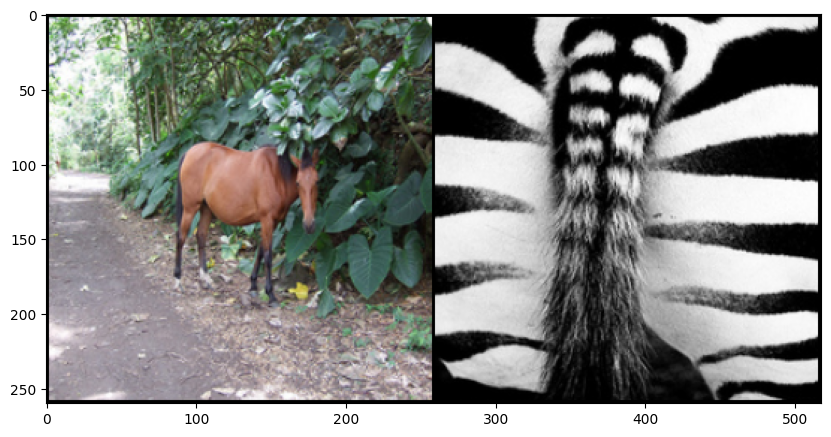

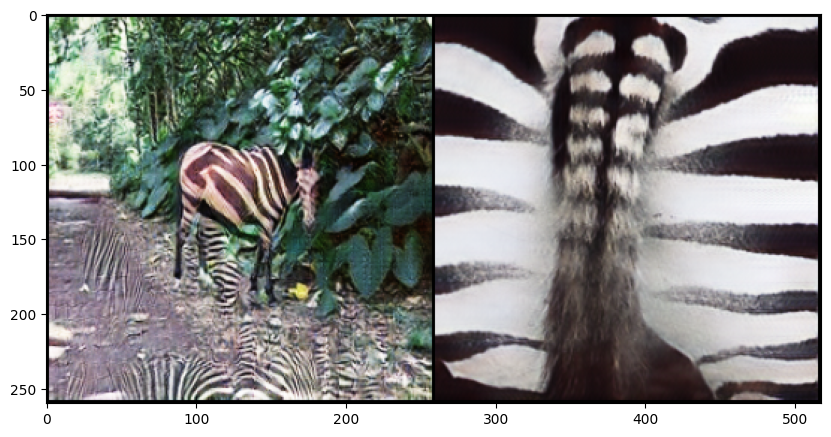

0.6577679514884949 + 0.371930867433548 = 1.0296988487243652
0.1514497846364975 + 0.18256095051765442 = 0.3340107202529907
0.07936930656433105 + 0.1300942599773407 = 0.20946356654167175
gen_loss: 3.157735586166382 fake_A: tensor([[[[-0.5519, -0.5942, -0.5579,  ..., -0.7163, -0.6474, -0.6213],
          [-0.4841, -0.5385, -0.5548,  ..., -0.6924, -0.6392, -0.6064],
          [-0.5159, -0.5308, -0.5375,  ..., -0.6259, -0.6115, -0.5764],
          ...,
          [-0.4798, -0.5611, -0.4436,  ..., -0.1702, -0.1811, -0.1892],
          [-0.4784, -0.5636, -0.4481,  ..., -0.1725, -0.1911, -0.2604],
          [-0.5221, -0.5205, -0.4906,  ..., -0.2633, -0.2006, -0.2402]],

         [[-0.6515, -0.6793, -0.6507,  ..., -0.7100, -0.6230, -0.5672],
          [-0.5765, -0.6300, -0.6564,  ..., -0.6566, -0.5928, -0.5363],
          [-0.6140, -0.6310, -0.6294,  ..., -0.5631, -0.5520, -0.5144],
          ...,
          [-0.5599, -0.6346, -0.5098,  ..., -0.2368, -0.2014, -0.2331],
          [-0.5758, -0.6580

0.5806593894958496 + 0.39039766788482666 = 0.9710570573806763
0.09352743625640869 + 0.11798043549060822 = 0.2115078717470169
0.06705165654420853 + 0.07643551379442215 = 0.14348717033863068
gen_loss: 2.427079439163208 fake_A: tensor([[[[-0.4591, -0.5367, -0.5567,  ..., -0.0539,  0.0364,  0.0425],
          [-0.4855, -0.5298, -0.5472,  ..., -0.0504,  0.0380,  0.0683],
          [-0.4506, -0.5306, -0.5204,  ...,  0.0345,  0.0311,  0.0281],
          ...,
          [ 0.2992,  0.3103,  0.4734,  ...,  0.1601,  0.1209,  0.0519],
          [ 0.4141,  0.4279,  0.4508,  ...,  0.1172,  0.0342, -0.0421],
          [ 0.3646,  0.4426,  0.4194,  ...,  0.0159,  0.0514, -0.0290]],

         [[-0.5340, -0.6020, -0.5939,  ..., -0.0803, -0.0159,  0.0148],
          [-0.4895, -0.5491, -0.5638,  ..., -0.0906, -0.0138,  0.0327],
          [-0.4813, -0.5405, -0.5306,  ..., -0.0077, -0.0221,  0.0180],
          ...,
          [ 0.1235,  0.1740,  0.3561,  ...,  0.3044,  0.2012,  0.1035],
          [ 0.2108,  0.

0.463863343000412 + 0.45810943841934204 = 0.9219727516174316
0.164316326379776 + 0.06499417871236801 = 0.2293105125427246
0.07140631973743439 + 0.08695711195468903 = 0.1583634316921234
gen_loss: 2.528538227081299 fake_A: tensor([[[[-0.3388, -0.4197, -0.4336,  ...,  0.2468,  0.1654,  0.0248],
          [-0.3272, -0.4155, -0.4186,  ...,  0.2466,  0.2208,  0.1347],
          [-0.2990, -0.3807, -0.3441,  ...,  0.1812,  0.1783,  0.0744],
          ...,
          [ 0.0551,  0.0430, -0.0263,  ..., -0.2832, -0.2932, -0.3292],
          [ 0.0410,  0.0151, -0.0340,  ..., -0.2511, -0.2927, -0.3581],
          [ 0.0448,  0.0231, -0.0634,  ..., -0.2831, -0.3085, -0.3718]],

         [[-0.3535, -0.4164, -0.4167,  ...,  0.2276,  0.1325,  0.0230],
          [-0.3340, -0.4073, -0.3964,  ...,  0.2340,  0.2296,  0.1426],
          [-0.3224, -0.3784, -0.3373,  ...,  0.1945,  0.1857,  0.0717],
          ...,
          [ 0.0177,  0.0182, -0.0730,  ..., -0.2531, -0.2644, -0.3019],
          [-0.0055, -0.0091

0.2811362147331238 + 0.5467745661735535 = 0.8279107809066772
0.14116623997688293 + 0.08555291593074799 = 0.22671915590763092
0.04785678908228874 + 0.06556321680545807 = 0.11342000961303711
gen_loss: 1.9847828149795532 fake_A: tensor([[[[-0.6769, -0.6490, -0.5998,  ..., -0.6832, -0.6869, -0.6417],
          [-0.6600, -0.6273, -0.5870,  ..., -0.6776, -0.6706, -0.6154],
          [-0.6427, -0.6114, -0.5768,  ..., -0.7042, -0.7011, -0.6309],
          ...,
          [ 0.0785,  0.0564,  0.0534,  ..., -0.0115,  0.0361,  0.0799],
          [ 0.1229,  0.1470,  0.1706,  ...,  0.0048,  0.0488,  0.0635],
          [ 0.0593,  0.1100,  0.1009,  ..., -0.0517,  0.0422,  0.0008]],

         [[-0.4367, -0.4127, -0.3281,  ..., -0.4808, -0.4723, -0.4240],
          [-0.3869, -0.3692, -0.3129,  ..., -0.4708, -0.4638, -0.4203],
          [-0.3836, -0.3425, -0.2986,  ..., -0.4945, -0.5138, -0.4461],
          ...,
          [ 0.1180,  0.1030,  0.0950,  ...,  0.0064,  0.0543,  0.1099],
          [ 0.1509,  0

0.6445034742355347 + 0.8252683281898499 = 1.4697718620300293
0.16689471900463104 + 0.06237621232867241 = 0.22927093505859375
0.05715591460466385 + 0.05441496893763542 = 0.11157087981700897
gen_loss: 2.608407735824585 fake_A: tensor([[[[-0.9464, -0.9503, -0.9549,  ...,  0.8610,  0.8475,  0.8486],
          [-0.9556, -0.9545, -0.9517,  ...,  0.8807,  0.8506,  0.8391],
          [-0.9557, -0.9580, -0.9588,  ...,  0.8789,  0.8600,  0.8542],
          ...,
          [ 0.2557,  0.2248,  0.2187,  ...,  0.1773,  0.0856,  0.0684],
          [ 0.2348,  0.1936,  0.2122,  ...,  0.1774,  0.0700,  0.0525],
          [ 0.2689,  0.2558,  0.2858,  ...,  0.2314,  0.1607,  0.0953]],

         [[-0.9658, -0.9641, -0.9679,  ...,  0.6650,  0.6711,  0.6967],
          [-0.9692, -0.9656, -0.9620,  ...,  0.6873,  0.6701,  0.6809],
          [-0.9689, -0.9651, -0.9645,  ...,  0.6715,  0.6569,  0.6887],
          ...,
          [ 0.1537,  0.1470,  0.1421,  ...,  0.0633, -0.0134, -0.0818],
          [ 0.1241,  0.

0.7549797296524048 + 0.6048104166984558 = 1.3597900867462158
0.1625942885875702 + 0.11452703177928925 = 0.27712130546569824
0.13512666523456573 + 0.08336283266544342 = 0.21848949790000916
gen_loss: 3.572397232055664 fake_A: tensor([[[[-0.8039, -0.7675, -0.6811,  ...,  0.3741,  0.1017,  0.0920],
          [-0.8365, -0.7691, -0.6834,  ...,  0.3564,  0.1369,  0.1069],
          [-0.8185, -0.7681, -0.7271,  ...,  0.2895,  0.2532,  0.1842],
          ...,
          [ 0.2160, -0.0362, -0.2822,  ..., -0.6098, -0.6665, -0.5017],
          [ 0.1200,  0.0075, -0.2446,  ..., -0.5743, -0.5500, -0.5551],
          [ 0.0197,  0.0065, -0.1394,  ..., -0.4994, -0.4256, -0.5317]],

         [[-0.8614, -0.8085, -0.7525,  ...,  0.1937, -0.0538, -0.0868],
          [-0.8708, -0.8072, -0.7548,  ...,  0.1797, -0.0134, -0.0899],
          [-0.8724, -0.8048, -0.7735,  ...,  0.1078,  0.0903, -0.0191],
          ...,
          [ 0.0576, -0.2430, -0.5297,  ..., -0.6543, -0.6819, -0.5794],
          [-0.0800, -0.2

0.5029934644699097 + 0.16654035449028015 = 0.6695338487625122
0.08676043152809143 + 0.0958755761384964 = 0.18263600766658783
0.06897212564945221 + 0.06368695944547653 = 0.13265907764434814
gen_loss: 2.014388084411621 fake_A: tensor([[[[ 0.6867,  0.6743,  0.6814,  ...,  0.6029,  0.5690,  0.5460],
          [ 0.6767,  0.6637,  0.6629,  ...,  0.5938,  0.5829,  0.6028],
          [ 0.6630,  0.6564,  0.6670,  ...,  0.6104,  0.6099,  0.6026],
          ...,
          [-0.0952, -0.1918, -0.1980,  ..., -0.2883, -0.2650, -0.2845],
          [-0.0885, -0.0774, -0.2103,  ..., -0.2292, -0.2106, -0.2720],
          [-0.1155, -0.1107, -0.1441,  ..., -0.2806, -0.2393, -0.3138]],

         [[ 0.7480,  0.7473,  0.7491,  ...,  0.6543,  0.6314,  0.6092],
          [ 0.7442,  0.7415,  0.7324,  ...,  0.6504,  0.6580,  0.6674],
          [ 0.7273,  0.7368,  0.7358,  ...,  0.6644,  0.6683,  0.6591],
          ...,
          [-0.0396, -0.1927, -0.1817,  ..., -0.3096, -0.2676, -0.3028],
          [-0.0588, -0.

0.46943730115890503 + 0.5322810411453247 = 1.001718282699585
0.19873952865600586 + 0.10698240995407104 = 0.3057219386100769
0.07310035079717636 + 0.05137431621551514 = 0.1244746670126915
gen_loss: 2.2770371437072754 fake_A: tensor([[[[-0.6011, -0.6970, -0.6883,  ..., -0.4897, -0.0891, -0.2786],
          [-0.5592, -0.6924, -0.7366,  ..., -0.3004, -0.1487, -0.3746],
          [-0.5913, -0.6423, -0.6877,  ..., -0.1452, -0.2407, -0.4240],
          ...,
          [-0.7765, -0.8691, -0.8907,  ..., -0.5572, -0.1644,  0.2728],
          [-0.8234, -0.8700, -0.8828,  ..., -0.5727, -0.3186,  0.1213],
          [-0.8668, -0.8813, -0.8736,  ..., -0.4761, -0.2876,  0.0798]],

         [[-0.5667, -0.6679, -0.6680,  ..., -0.6481, -0.3177, -0.4235],
          [-0.4797, -0.6523, -0.6992,  ..., -0.4744, -0.3305, -0.5137],
          [-0.5027, -0.5899, -0.6626,  ..., -0.3286, -0.4233, -0.5558],
          ...,
          [-0.7990, -0.8948, -0.9145,  ..., -0.6463, -0.2633,  0.2050],
          [-0.8411, -0.8

0.4348265528678894 + 0.46447741985321045 = 0.8993039727210999
0.07038572430610657 + 0.09649401903152466 = 0.16687974333763123
0.07128779590129852 + 0.06100117415189743 = 0.13228896260261536
gen_loss: 2.2388815879821777 fake_A: tensor([[[[-0.1449, -0.1138, -0.1287,  ..., -0.0717, -0.0600, -0.0676],
          [-0.1340, -0.1313, -0.1400,  ..., -0.1003, -0.0911, -0.0712],
          [-0.1653, -0.1858, -0.1615,  ..., -0.0900, -0.1181, -0.0964],
          ...,
          [-0.2563, -0.2425, -0.2224,  ...,  0.0285, -0.0079, -0.0260],
          [-0.3133, -0.3086, -0.2310,  ...,  0.0376,  0.0199, -0.0081],
          [-0.3144, -0.2917, -0.2604,  ...,  0.0025,  0.0348, -0.0051]],

         [[-0.2809, -0.2994, -0.2855,  ..., -0.2295, -0.1882, -0.1962],
          [-0.2674, -0.3065, -0.2886,  ..., -0.2433, -0.2048, -0.1920],
          [-0.3070, -0.3273, -0.3021,  ..., -0.2055, -0.2293, -0.2152],
          ...,
          [-0.3031, -0.2751, -0.2586,  ..., -0.0755, -0.0960, -0.1109],
          [-0.3472, -

0.5794754028320312 + 0.5494095683097839 = 1.12888503074646
0.13563567399978638 + 0.08906392753124237 = 0.22469960153102875
0.06924812495708466 + 0.12334683537483215 = 0.1925949603319168
gen_loss: 3.0773046016693115 fake_A: tensor([[[[-0.3863, -0.4547, -0.4707,  ..., -0.6262, -0.5937, -0.4562],
          [-0.5403, -0.5537, -0.6508,  ..., -0.7009, -0.6673, -0.5132],
          [-0.5189, -0.4064, -0.4667,  ..., -0.7394, -0.6855, -0.5737],
          ...,
          [ 0.0478, -0.0737, -0.1169,  ..., -0.3927, -0.4919, -0.4277],
          [-0.0162, -0.0806, -0.1263,  ..., -0.5242, -0.4507, -0.3432],
          [-0.1539, -0.2496, -0.2279,  ..., -0.5579, -0.4683, -0.4260]],

         [[-0.3659, -0.4010, -0.4034,  ..., -0.7527, -0.6948, -0.5574],
          [-0.4834, -0.5500, -0.6344,  ..., -0.7879, -0.7412, -0.6446],
          [-0.4640, -0.3858, -0.4406,  ..., -0.8294, -0.7883, -0.7240],
          ...,
          [-0.2182, -0.3160, -0.2747,  ..., -0.5416, -0.6008, -0.5292],
          [-0.2494, -0.30

0.3834648132324219 + 0.4174479842185974 = 0.8009127974510193
0.16284997761249542 + 0.09299618005752563 = 0.25584614276885986
0.06356842815876007 + 0.06948044151067734 = 0.1330488622188568
gen_loss: 2.1569862365722656 fake_A: tensor([[[[ 0.4104,  0.2772,  0.3092,  ...,  0.8895,  0.8294,  0.8207],
          [ 0.4012,  0.2948,  0.3189,  ...,  0.7760,  0.8105,  0.8100],
          [ 0.3793,  0.3451,  0.3324,  ...,  0.7130,  0.7791,  0.8671],
          ...,
          [ 0.4668,  0.4655,  0.3645,  ...,  0.2058,  0.1628, -0.0034],
          [ 0.4881,  0.4868,  0.3868,  ...,  0.1435,  0.1844,  0.0492],
          [ 0.5645,  0.6012,  0.4494,  ...,  0.1541,  0.1740,  0.0063]],

         [[ 0.3815,  0.2721,  0.3247,  ...,  0.7615,  0.6590,  0.6480],
          [ 0.3799,  0.2805,  0.3305,  ...,  0.6141,  0.7222,  0.6481],
          [ 0.3758,  0.3244,  0.2998,  ...,  0.4981,  0.5066,  0.6487],
          ...,
          [ 0.4944,  0.5649,  0.4609,  ...,  0.2674,  0.2109,  0.0771],
          [ 0.4425,  0.

0.5313900709152222 + 0.35851380228996277 = 0.8899039030075073
0.1686428040266037 + 0.08594014495611191 = 0.254582941532135
0.09167756885290146 + 0.05979076027870178 = 0.15146833658218384
gen_loss: 2.4300456047058105 fake_A: tensor([[[[ 0.8869,  0.9093,  0.9092,  ...,  0.9796,  0.9760,  0.9746],
          [ 0.9197,  0.9048,  0.8975,  ...,  0.9810,  0.9795,  0.9775],
          [ 0.9310,  0.9256,  0.9305,  ...,  0.9781,  0.9794,  0.9740],
          ...,
          [ 0.3939,  0.2642,  0.2300,  ...,  0.2028,  0.2157,  0.2229],
          [ 0.3842,  0.3157,  0.1899,  ...,  0.3120,  0.2708,  0.2114],
          [ 0.3918,  0.3468,  0.2263,  ...,  0.2835,  0.2948,  0.2304]],

         [[ 0.8636,  0.8905,  0.8936,  ...,  0.9788,  0.9694,  0.9695],
          [ 0.9174,  0.8995,  0.9188,  ...,  0.9787,  0.9720,  0.9743],
          [ 0.9222,  0.9224,  0.9148,  ...,  0.9750,  0.9727,  0.9686],
          ...,
          [ 0.2652,  0.1692,  0.1310,  ...,  0.0939,  0.1274,  0.1389],
          [ 0.3037,  0.2

0.5780541896820068 + 0.5433260202407837 = 1.1213802099227905
0.19996468722820282 + 0.280933141708374 = 0.48089784383773804
0.11506789922714233 + 0.05939571186900139 = 0.17446361482143402
gen_loss: 2.9141061305999756 fake_A: tensor([[[[-0.6709, -0.6580, -0.6600,  ..., -0.5235, -0.5011, -0.5296],
          [-0.6684, -0.6551, -0.6760,  ..., -0.5138, -0.5062, -0.4934],
          [-0.6734, -0.6747, -0.6636,  ..., -0.5107, -0.5173, -0.5208],
          ...,
          [ 0.8133,  0.8061,  0.8065,  ...,  0.1788,  0.1562,  0.1884],
          [ 0.7834,  0.7680,  0.7686,  ...,  0.0465,  0.1079,  0.2037],
          [ 0.7371,  0.7030,  0.6959,  ...,  0.0902,  0.1892,  0.2487]],

         [[-0.7496, -0.7569, -0.7517,  ..., -0.6432, -0.6199, -0.6243],
          [-0.7492, -0.7668, -0.7700,  ..., -0.6245, -0.6025, -0.5798],
          [-0.7598, -0.7739, -0.7634,  ..., -0.6104, -0.6034, -0.5905],
          ...,
          [ 0.6954,  0.6992,  0.7014,  ...,  0.0721,  0.0477,  0.0213],
          [ 0.6497,  0.6

0.6139942407608032 + 0.4871341288089752 = 1.101128339767456
0.14780491590499878 + 0.08316446095705032 = 0.2309693694114685
0.06640096008777618 + 0.0774875059723854 = 0.1438884735107422
gen_loss: 2.563109874725342 fake_A: tensor([[[[ 0.9844,  0.9820,  0.9818,  ...,  0.9745,  0.9729,  0.9665],
          [ 0.9849,  0.9823,  0.9812,  ...,  0.9765,  0.9736,  0.9643],
          [ 0.9822,  0.9804,  0.9817,  ...,  0.9773,  0.9736,  0.9634],
          ...,
          [-0.1325, -0.1460, -0.6230,  ...,  0.1377,  0.1176,  0.1353],
          [-0.0887, -0.1838, -0.5909,  ...,  0.1623,  0.2006,  0.1685],
          [-0.1996, -0.2305, -0.5149,  ...,  0.1516,  0.2746,  0.2008]],

         [[ 0.9767,  0.9759,  0.9767,  ...,  0.9674,  0.9677,  0.9638],
          [ 0.9778,  0.9764,  0.9760,  ...,  0.9695,  0.9681,  0.9630],
          [ 0.9771,  0.9770,  0.9769,  ...,  0.9724,  0.9682,  0.9613],
          ...,
          [-0.2938, -0.3073, -0.7327,  ...,  0.1863,  0.1549,  0.1373],
          [-0.3575, -0.3642

0.4937906563282013 + 0.31196627020835876 = 0.8057569265365601
0.1319788694381714 + 0.16193172335624695 = 0.29391059279441833
0.0822988897562027 + 0.099140964448452 = 0.1814398467540741
gen_loss: 2.6495466232299805 fake_A: tensor([[[[ 0.2071,  0.1930,  0.2037,  ...,  0.0867,  0.0889,  0.1771],
          [ 0.2279,  0.2149,  0.2434,  ...,  0.1796,  0.1539,  0.2489],
          [ 0.2436,  0.2030,  0.2183,  ...,  0.2648,  0.0724,  0.0857],
          ...,
          [ 0.1467,  0.1189,  0.1538,  ...,  0.2537, -0.2926, -0.1566],
          [ 0.0448, -0.0995, -0.0166,  ...,  0.0414, -0.3238, -0.2696],
          [ 0.2336,  0.1092,  0.1623,  ...,  0.0306, -0.0705, -0.1824]],

         [[ 0.0134,  0.0586,  0.0672,  ..., -0.0925, -0.1300,  0.0200],
          [ 0.0524,  0.0421,  0.0607,  ..., -0.0011, -0.0357,  0.0444],
          [ 0.0630,  0.0435,  0.0709,  ...,  0.1344, -0.1069, -0.0643],
          ...,
          [ 0.0240, -0.0064, -0.0150,  ...,  0.0013, -0.4867, -0.3827],
          [-0.1173, -0.203

0.5215932130813599 + 0.525340735912323 = 1.046933889389038
0.14893940091133118 + 0.12806519865989685 = 0.277004599571228
0.06719459593296051 + 0.06719740480184555 = 0.13439199328422546
gen_loss: 2.4185543060302734 fake_A: tensor([[[[ 7.0250e-01,  6.8354e-01,  6.6146e-01,  ...,  5.4140e-01,
            5.6182e-01,  5.2156e-01],
          [ 7.2036e-01,  7.0139e-01,  6.7736e-01,  ...,  5.6581e-01,
            5.5927e-01,  5.6315e-01],
          [ 7.3499e-01,  7.1192e-01,  6.9540e-01,  ...,  5.8738e-01,
            5.7399e-01,  5.6617e-01],
          ...,
          [ 4.0746e-01,  3.8498e-01,  3.6835e-01,  ...,  5.8037e-01,
            5.6666e-01,  5.6996e-01],
          [ 4.2987e-01,  3.5785e-01,  3.6842e-01,  ...,  5.8387e-01,
            5.6123e-01,  5.4004e-01],
          [ 4.1089e-01,  3.9234e-01,  3.9500e-01,  ...,  5.6904e-01,
            5.9101e-01,  5.5056e-01]],

         [[ 5.0703e-01,  5.3692e-01,  5.3533e-01,  ...,  3.7601e-01,
            4.2967e-01,  3.9548e-01],
          [ 

0.6908989548683167 + 0.570487380027771 = 1.2613863945007324
0.13562217354774475 + 0.0913272500038147 = 0.22694942355155945
0.10485416650772095 + 0.06872783601284027 = 0.17358200252056122
gen_loss: 3.0199012756347656 fake_A: tensor([[[[-0.8116, -0.7692, -0.5063,  ..., -0.4391, -0.5025, -0.5068],
          [-0.8152, -0.6986, -0.4453,  ..., -0.4510, -0.5174, -0.4914],
          [-0.7878, -0.6718, -0.4730,  ..., -0.4637, -0.5052, -0.4922],
          ...,
          [-0.8346, -0.8349, -0.8391,  ...,  0.2490,  0.2656,  0.2393],
          [-0.8449, -0.8344, -0.8488,  ...,  0.2573,  0.2182,  0.1644],
          [-0.8632, -0.8286, -0.8671,  ...,  0.1773,  0.1752,  0.1142]],

         [[-0.7042, -0.6202, -0.2702,  ..., -0.5293, -0.5977, -0.5831],
          [-0.6947, -0.5244, -0.2127,  ..., -0.5247, -0.5862, -0.5676],
          [-0.6726, -0.5118, -0.2637,  ..., -0.5374, -0.5734, -0.5443],
          ...,
          [-0.8531, -0.8579, -0.8731,  ...,  0.1879,  0.2019,  0.2271],
          [-0.8787, -0.8

0.5238533020019531 + 0.4120028614997864 = 0.9358561635017395
0.1324748545885086 + 0.16678115725517273 = 0.29925602674484253
0.13360880315303802 + 0.06532629579305649 = 0.19893509149551392
gen_loss: 2.9551327228546143 fake_A: tensor([[[[ 0.1184,  0.0889,  0.0927,  ..., -0.5742, -0.5726, -0.6525],
          [ 0.1122,  0.0949,  0.0989,  ..., -0.6149, -0.5750, -0.6537],
          [ 0.1339,  0.1033,  0.0422,  ..., -0.6050, -0.5928, -0.6785],
          ...,
          [ 0.3809,  0.3947,  0.3651,  ...,  0.5329,  0.4416,  0.1076],
          [-0.2820, -0.2868, -0.4083,  ..., -0.3408, -0.1353, -0.1906],
          [-0.7173, -0.6960, -0.7256,  ..., -0.6922, -0.5952, -0.4920]],

         [[ 0.0381,  0.0386,  0.0579,  ..., -0.6399, -0.5466, -0.5911],
          [ 0.0581,  0.0460,  0.0522,  ..., -0.6226, -0.5258, -0.6343],
          [ 0.0657,  0.0615, -0.0028,  ..., -0.6514, -0.5936, -0.6987],
          ...,
          [ 0.3031,  0.2767,  0.3279,  ...,  0.5307,  0.4412, -0.0202],
          [-0.4083, -0.

0.4752424359321594 + 0.5041365623474121 = 0.9793789982795715
0.14711938798427582 + 0.0916326567530632 = 0.23875203728675842
0.07432630658149719 + 0.07695046812295914 = 0.15127676725387573
gen_loss: 2.516021728515625 fake_A: tensor([[[[ 0.5277,  0.5005,  0.4902,  ..., -0.0808, -0.0803, -0.1158],
          [ 0.5189,  0.4699,  0.4295,  ..., -0.1574, -0.1372, -0.1326],
          [ 0.4901,  0.4718,  0.4503,  ..., -0.1965, -0.1909, -0.1765],
          ...,
          [ 0.6044,  0.5433,  0.5221,  ...,  0.5031,  0.3963,  0.3338],
          [ 0.6311,  0.5511,  0.4801,  ...,  0.5170,  0.3849,  0.1994],
          [ 0.6675,  0.6039,  0.5032,  ...,  0.4946,  0.4482,  0.2879]],

         [[ 0.6666,  0.6511,  0.6841,  ...,  0.1632,  0.1899,  0.1279],
          [ 0.6424,  0.6107,  0.6048,  ...,  0.0939,  0.1620,  0.1298],
          [ 0.6261,  0.6034,  0.6044,  ...,  0.0898,  0.1083,  0.1086],
          ...,
          [ 0.5228,  0.4747,  0.4724,  ...,  0.4030,  0.3477,  0.2824],
          [ 0.5564,  0.5

0.39761441946029663 + 0.3782137930393219 = 0.7758282423019409
0.14429159462451935 + 0.08437728136777878 = 0.22866886854171753
0.08415958285331726 + 0.08926120400428772 = 0.17342078685760498
gen_loss: 2.532902956008911 fake_A: tensor([[[[ 0.1942,  0.1855,  0.1859,  ...,  0.1897,  0.1443,  0.0689],
          [ 0.1660,  0.1275,  0.0986,  ...,  0.1755,  0.1469,  0.1164],
          [ 0.1129,  0.0764,  0.0494,  ...,  0.0964,  0.0681,  0.0028],
          ...,
          [ 0.1617,  0.1443, -0.0196,  ..., -0.1669, -0.0720, -0.0849],
          [ 0.1007,  0.1011, -0.0793,  ..., -0.1340, -0.0507, -0.0840],
          [ 0.0538, -0.0006, -0.1466,  ..., -0.1661, -0.0412, -0.0860]],

         [[ 0.3128,  0.3931,  0.4230,  ...,  0.3678,  0.3234,  0.3106],
          [ 0.3221,  0.3515,  0.3370,  ...,  0.3663,  0.3457,  0.3432],
          [ 0.2823,  0.3111,  0.3028,  ...,  0.3368,  0.2963,  0.2714],
          ...,
          [ 0.2536,  0.2510,  0.0928,  ...,  0.0532,  0.1118,  0.1446],
          [ 0.1683,  0

0.44898417592048645 + 0.4689934551715851 = 0.9179776310920715
0.10613523423671722 + 0.1158866435289383 = 0.22202187776565552
0.058582957834005356 + 0.05477480590343475 = 0.11335776746273041
gen_loss: 2.0737576484680176 fake_A: tensor([[[[ 0.1252,  0.1188,  0.1267,  ...,  0.1605,  0.1848,  0.1912],
          [ 0.1257,  0.1248,  0.1346,  ...,  0.1690,  0.1722,  0.1931],
          [ 0.1199,  0.1177,  0.1255,  ...,  0.1687,  0.1758,  0.1826],
          ...,
          [ 0.0493,  0.1059,  0.0925,  ..., -0.0194,  0.0152,  0.0491],
          [ 0.0272,  0.0428,  0.0905,  ...,  0.0369,  0.0496,  0.0929],
          [ 0.0768,  0.0893,  0.0770,  ...,  0.0523,  0.0930,  0.0965]],

         [[ 0.2851,  0.2907,  0.2992,  ...,  0.3186,  0.3414,  0.3478],
          [ 0.2910,  0.2822,  0.2749,  ...,  0.3197,  0.3348,  0.3486],
          [ 0.2694,  0.2792,  0.2837,  ...,  0.3215,  0.3226,  0.3337],
          ...,
          [-0.0164,  0.0419,  0.0008,  ..., -0.0040,  0.0280,  0.0466],
          [-0.0534, -

0.30695798993110657 + 0.39703381061553955 = 0.7039917707443237
0.13730399310588837 + 0.1006411537528038 = 0.23794513940811157
0.044473402202129364 + 0.06221025437116623 = 0.1066836565732956
gen_loss: 1.7946228981018066 fake_A: tensor([[[[ 0.7823,  0.7699,  0.7687,  ..., -0.2463, -0.2026, -0.2185],
          [ 0.7781,  0.7701,  0.7676,  ..., -0.2577, -0.2236, -0.2043],
          [ 0.7737,  0.7676,  0.7742,  ..., -0.2620, -0.2568, -0.2305],
          ...,
          [ 0.0075, -0.0565, -0.1150,  ..., -0.3886, -0.3427, -0.2348],
          [-0.0134, -0.0320, -0.1576,  ..., -0.4195, -0.3568, -0.3025],
          [-0.0104,  0.0070, -0.0700,  ..., -0.4364, -0.3635, -0.3333]],

         [[ 0.8202,  0.8214,  0.8206,  ..., -0.1864, -0.1712, -0.1805],
          [ 0.8101,  0.8117,  0.8067,  ..., -0.1986, -0.1792, -0.1675],
          [ 0.8044,  0.8135,  0.8069,  ..., -0.1915, -0.1970, -0.1849],
          ...,
          [-0.0064, -0.0700, -0.1386,  ..., -0.4357, -0.3790, -0.2690],
          [-0.0183, -

0.6121117472648621 + 0.7079240083694458 = 1.320035696029663
0.12818102538585663 + 0.08369617909193039 = 0.21187719702720642
0.07590186595916748 + 0.05671225115656853 = 0.1326141208410263
gen_loss: 2.6673645973205566 fake_A: tensor([[[[-0.3927, -0.2309, -0.4576,  ..., -0.3728, -0.3967, -0.3557],
          [-0.3650, -0.1996, -0.2364,  ..., -0.3914, -0.5286, -0.3970],
          [-0.3331, -0.3782,  0.1475,  ..., -0.4095, -0.5917, -0.4050],
          ...,
          [ 0.6207, -0.3772, -0.5445,  ..., -0.6379, -0.5851, -0.4959],
          [ 0.3097, -0.1794, -0.3762,  ..., -0.4730, -0.5501, -0.5473],
          [ 0.3333,  0.1677,  0.0349,  ..., -0.2292, -0.2790, -0.2894]],

         [[-0.3534, -0.3203, -0.5507,  ..., -0.3986, -0.4871, -0.4829],
          [-0.3766, -0.3403, -0.4535,  ..., -0.4613, -0.6029, -0.5373],
          [-0.4139, -0.4902, -0.0863,  ..., -0.4516, -0.6460, -0.5389],
          ...,
          [ 0.6983, -0.3522, -0.5455,  ..., -0.7177, -0.6222, -0.5607],
          [ 0.3853, -0.1

0.507504940032959 + 0.3132386803627014 = 0.8207436203956604
0.19292204082012177 + 0.0506942942738533 = 0.24361634254455566
0.04817527160048485 + 0.1821766346693039 = 0.23035190999507904
gen_loss: 3.1486241817474365 fake_A: tensor([[[[-0.5335, -0.5398, -0.5253,  ...,  0.3720,  0.4492,  0.6025],
          [-0.5335, -0.5244, -0.5497,  ...,  0.2978,  0.3651,  0.5887],
          [-0.5442, -0.5536, -0.5639,  ...,  0.2834,  0.3849,  0.5519],
          ...,
          [-0.2094, -0.2253, -0.4836,  ..., -0.3540, -0.2889, -0.2094],
          [-0.2070, -0.2724, -0.3483,  ..., -0.2475, -0.2282, -0.2493],
          [-0.2984, -0.3419, -0.4039,  ..., -0.2194, -0.1873, -0.2030]],

         [[-0.6962, -0.7076, -0.6833,  ...,  0.2666,  0.3775,  0.5294],
          [-0.7072, -0.7187, -0.7187,  ...,  0.2062,  0.2944,  0.5232],
          [-0.7211, -0.7243, -0.7300,  ...,  0.1757,  0.3123,  0.4851],
          ...,
          [-0.2542, -0.2558, -0.5209,  ..., -0.4691, -0.3139, -0.2400],
          [-0.2339, -0.27

0.7649403214454651 + 0.21576696634292603 = 0.9807072877883911
0.26903244853019714 + 0.13595430552959442 = 0.40498673915863037
0.08029517531394958 + 0.07838042080402374 = 0.15867559611797333
gen_loss: 2.607961893081665 fake_A: tensor([[[[ 0.4547,  0.4629,  0.4850,  ...,  0.5214,  0.5236,  0.5100],
          [ 0.4605,  0.4683,  0.4737,  ...,  0.5171,  0.5241,  0.5383],
          [ 0.4786,  0.4624,  0.4603,  ...,  0.5192,  0.5266,  0.5145],
          ...,
          [-0.4749, -0.4690, -0.5357,  ..., -0.5463, -0.5376, -0.5561],
          [-0.4290, -0.4772, -0.4914,  ..., -0.5800, -0.6191, -0.6240],
          [-0.4514, -0.4761, -0.4871,  ..., -0.6424, -0.5779, -0.6079]],

         [[ 0.5711,  0.6033,  0.6240,  ...,  0.5247,  0.5148,  0.5205],
          [ 0.5802,  0.5983,  0.6000,  ...,  0.5048,  0.5128,  0.5370],
          [ 0.5920,  0.5950,  0.5919,  ...,  0.5171,  0.5205,  0.5128],
          ...,
          [-0.6127, -0.6357, -0.6662,  ..., -0.4277, -0.4064, -0.4490],
          [-0.6446, -0

0.4465022087097168 + 0.3521272540092468 = 0.7986294627189636
0.08656489849090576 + 0.1290709376335144 = 0.21563583612442017
0.11523948609828949 + 0.05817730724811554 = 0.17341679334640503
gen_loss: 2.554360866546631 fake_A: tensor([[[[-0.6841, -0.7134, -0.7285,  ..., -0.3644, -0.3462, -0.2813],
          [-0.6356, -0.7119, -0.7543,  ..., -0.3531, -0.3260, -0.2070],
          [-0.7045, -0.7228, -0.7709,  ..., -0.2558, -0.2242, -0.2517],
          ...,
          [ 0.8151,  0.8054,  0.8110,  ...,  0.6709,  0.6330,  0.6293],
          [ 0.8194,  0.8064,  0.8127,  ...,  0.6796,  0.6497,  0.6449],
          [ 0.8507,  0.8311,  0.8150,  ...,  0.7301,  0.7212,  0.7077]],

         [[-0.6017, -0.6008, -0.6553,  ..., -0.1493, -0.1094,  0.0074],
          [-0.4759, -0.5950, -0.6581,  ..., -0.1416, -0.0348,  0.0941],
          [-0.5761, -0.6003, -0.6780,  ..., -0.0430,  0.0295,  0.0261],
          ...,
          [ 0.7427,  0.7581,  0.7641,  ...,  0.5859,  0.5892,  0.6032],
          [ 0.7360,  0.7

0.6641436815261841 + 0.4382498264312744 = 1.1023935079574585
0.14113402366638184 + 0.18879388272762299 = 0.329927921295166
0.06450298428535461 + 0.08278851956129074 = 0.14729151129722595
gen_loss: 2.6083016395568848 fake_A: tensor([[[[ 0.7115,  0.6676,  0.6539,  ...,  0.7399,  0.7197,  0.7997],
          [ 0.6296,  0.6045,  0.6700,  ...,  0.7174,  0.7751,  0.8180],
          [ 0.6614,  0.6403,  0.6943,  ...,  0.7376,  0.8298,  0.8204],
          ...,
          [-0.1565, -0.2036,  0.2044,  ...,  0.0921,  0.2027,  0.2756],
          [-0.2311, -0.3610, -0.0061,  ..., -0.0724,  0.0638,  0.1253],
          [-0.2819, -0.3959, -0.0969,  ..., -0.1716,  0.0616,  0.0948]],

         [[ 0.6135,  0.5940,  0.5580,  ...,  0.7034,  0.6271,  0.7273],
          [ 0.5587,  0.5114,  0.5648,  ...,  0.6828,  0.6966,  0.7633],
          [ 0.5811,  0.5766,  0.6214,  ...,  0.6979,  0.7565,  0.7749],
          ...,
          [-0.1372, -0.1918,  0.2029,  ...,  0.0423,  0.1911,  0.2365],
          [-0.2312, -0.3

0.5984386801719666 + 0.38366442918777466 = 0.9821031093597412
0.11540120095014572 + 0.3023596405982971 = 0.41776084899902344
0.08580493181943893 + 0.0791054219007492 = 0.16491034626960754
gen_loss: 2.672982692718506 fake_A: tensor([[[[ 0.2493,  0.2537,  0.2906,  ...,  0.2386,  0.2343,  0.1553],
          [ 0.2685,  0.2679,  0.2676,  ...,  0.2852,  0.2795,  0.2113],
          [ 0.2057,  0.2175,  0.1904,  ...,  0.2636,  0.2759,  0.1837],
          ...,
          [-0.1183, -0.1386, -0.0321,  ..., -0.5332, -0.5072, -0.4355],
          [-0.0186, -0.0598,  0.0904,  ..., -0.0426, -0.3159, -0.4129],
          [ 0.0873,  0.1024,  0.1214,  ...,  0.1520, -0.0760, -0.2263]],

         [[ 0.3396,  0.3559,  0.3898,  ...,  0.3325,  0.3149,  0.3010],
          [ 0.3819,  0.3368,  0.3532,  ...,  0.3758,  0.3798,  0.3520],
          [ 0.3385,  0.3266,  0.3100,  ...,  0.3800,  0.3815,  0.3406],
          ...,
          [ 0.0598,  0.0158,  0.1045,  ..., -0.4368, -0.4709, -0.3918],
          [ 0.1762,  0.1

0.3857107162475586 + 0.4648410677909851 = 0.8505517840385437
0.10161471366882324 + 0.08754947036504745 = 0.1891641914844513
0.09014451503753662 + 0.07990122586488724 = 0.17004573345184326
gen_loss: 2.569925546646118 fake_A: tensor([[[[-2.4787e-02, -4.9166e-02, -2.4327e-04,  ..., -2.3464e-02,
           -1.1486e-01, -1.4560e-01],
          [-1.1042e-02, -4.1455e-02, -1.7318e-03,  ..., -4.7696e-02,
           -1.2264e-01, -1.6276e-01],
          [-3.0857e-02, -7.0200e-02, -5.1659e-02,  ..., -9.7432e-02,
           -2.5119e-01, -3.0290e-01],
          ...,
          [-2.5265e-03, -7.9318e-02, -1.6028e-01,  ...,  2.4190e-01,
            3.8449e-01,  4.8119e-01],
          [ 2.4908e-02, -2.3930e-02, -8.1782e-02,  ...,  8.5757e-02,
            2.8690e-01,  2.9486e-01],
          [ 1.3449e-02, -5.9777e-02, -8.4815e-02,  ..., -1.5555e-01,
            1.1456e-01,  5.4476e-02]],

         [[ 1.3373e-01,  1.4843e-01,  1.9166e-01,  ...,  1.6959e-01,
            1.0198e-01,  1.0659e-01],
          

0.38633739948272705 + 0.37309807538986206 = 0.7594354748725891
0.14212818443775177 + 0.09317226707935333 = 0.2353004515171051
0.19361422955989838 + 0.06038830429315567 = 0.25400254130363464
gen_loss: 3.322990894317627 fake_A: tensor([[[[-0.2452, -0.2561, -0.0962,  ...,  0.7315,  0.7403,  0.7121],
          [-0.2609, -0.2391, -0.1013,  ...,  0.7860,  0.7494,  0.7181],
          [-0.1656, -0.1572, -0.1141,  ...,  0.7611,  0.7602,  0.6979],
          ...,
          [ 0.2749,  0.2615,  0.2408,  ..., -0.6644, -0.6344, -0.6261],
          [ 0.2845,  0.2849,  0.2693,  ..., -0.6952, -0.6513, -0.6475],
          [ 0.2623,  0.2756,  0.2413,  ..., -0.7234, -0.6550, -0.6568]],

         [[-0.1629, -0.1649, -0.0307,  ...,  0.6107,  0.6370,  0.6419],
          [-0.1636, -0.1681, -0.0463,  ...,  0.6796,  0.6660,  0.6348],
          [-0.0821, -0.0661, -0.0328,  ...,  0.6766,  0.6800,  0.6251],
          ...,
          [ 0.1985,  0.1900,  0.1689,  ..., -0.6380, -0.5903, -0.5802],
          [ 0.2214,  0

0.8127605319023132 + 0.35062384605407715 = 1.1633844375610352
0.13200855255126953 + 0.06014150381088257 = 0.1921500563621521
0.07024098187685013 + 0.07676985114812851 = 0.14701083302497864
gen_loss: 2.652707576751709 fake_A: tensor([[[[-0.1273, -0.1525, -0.1386,  ..., -0.5854, -0.6413, -0.6305],
          [-0.1759, -0.1998, -0.2118,  ..., -0.6195, -0.6111, -0.5595],
          [-0.2717, -0.2949, -0.3445,  ..., -0.6324, -0.6181, -0.6047],
          ...,
          [-0.4721, -0.4522, -0.4220,  ..., -0.8390, -0.8280, -0.7905],
          [-0.4849, -0.4661, -0.3646,  ..., -0.8257, -0.8261, -0.7981],
          [-0.3241, -0.3139, -0.2861,  ..., -0.8386, -0.8065, -0.7903]],

         [[-0.1023, -0.1126, -0.0594,  ..., -0.5774, -0.6368, -0.5894],
          [-0.1688, -0.1834, -0.1530,  ..., -0.6305, -0.6296, -0.5484],
          [-0.2751, -0.2334, -0.2687,  ..., -0.6343, -0.6470, -0.5941],
          ...,
          [-0.3873, -0.3552, -0.3515,  ..., -0.8599, -0.8542, -0.8280],
          [-0.4268, -0.

0.48205330967903137 + 0.26555460691452026 = 0.747607946395874
0.09840506315231323 + 0.09299348294734955 = 0.19139854609966278
0.10029204934835434 + 0.04870104417204857 = 0.1489930897951126
gen_loss: 2.256678581237793 fake_A: tensor([[[[ 0.3678,  0.3516,  0.3817,  ...,  0.0347,  0.1497,  0.0154],
          [ 0.4032,  0.4032,  0.3924,  ...,  0.2205,  0.2514,  0.0731],
          [ 0.4358,  0.4401,  0.4357,  ...,  0.2029,  0.0768, -0.0326],
          ...,
          [-0.0730, -0.0417, -0.0849,  ...,  0.2213,  0.1549,  0.1396],
          [ 0.0674,  0.0883,  0.0458,  ...,  0.1162,  0.1573,  0.1146],
          [ 0.1462,  0.1397,  0.0462,  ...,  0.0343,  0.1027,  0.0514]],

         [[ 0.4082,  0.4388,  0.4380,  ...,  0.1163,  0.2095,  0.0854],
          [ 0.4387,  0.4700,  0.4525,  ...,  0.3131,  0.3596,  0.1531],
          [ 0.4946,  0.5012,  0.4856,  ...,  0.3068,  0.1823,  0.0749],
          ...,
          [-0.0809, -0.0553, -0.1230,  ...,  0.0258,  0.0236,  0.0325],
          [ 0.1039,  0.

0.44118475914001465 + 0.46071678400039673 = 0.9019015431404114
0.09441670030355453 + 0.08219439536333084 = 0.17661109566688538
0.055853985249996185 + 0.07374715805053711 = 0.1296011507511139
gen_loss: 2.215574026107788 fake_A: tensor([[[[-0.1260, -0.1540, -0.3354,  ..., -0.8686, -0.8249, -0.7647],
          [-0.0758, -0.1687, -0.3872,  ..., -0.8700, -0.8294, -0.7665],
          [-0.4516, -0.4532, -0.4861,  ..., -0.8616, -0.8042, -0.7625],
          ...,
          [ 0.7443,  0.7128,  0.7527,  ..., -0.2369, -0.2077, -0.1993],
          [ 0.7495,  0.6980,  0.7733,  ..., -0.2469, -0.2232, -0.2736],
          [ 0.7332,  0.6517,  0.7089,  ..., -0.2739, -0.2012, -0.2331]],

         [[-0.1979, -0.2065, -0.3736,  ..., -0.8161, -0.7421, -0.6996],
          [-0.0510, -0.1922, -0.4102,  ..., -0.8127, -0.7516, -0.7396],
          [-0.4322, -0.4476, -0.5064,  ..., -0.8063, -0.7435, -0.7562],
          ...,
          [ 0.6257,  0.6362,  0.6884,  ..., -0.2345, -0.1783, -0.1860],
          [ 0.5897,  

0.6955656409263611 + 0.6023545265197754 = 1.2979202270507812
0.13874942064285278 + 0.08419012278318405 = 0.22293955087661743
0.12106874585151672 + 0.06122979521751404 = 0.18229854106903076
gen_loss: 3.1431994438171387 fake_A: tensor([[[[-0.1263, -0.1321, -0.0794,  ..., -0.5247, -0.5206, -0.5178],
          [-0.1545, -0.1376, -0.0912,  ..., -0.5325, -0.5315, -0.5261],
          [-0.0897, -0.1047, -0.1246,  ..., -0.4633, -0.5045, -0.5254],
          ...,
          [ 0.2371,  0.2308,  0.3365,  ...,  0.4985,  0.5864,  0.3788],
          [ 0.2156,  0.2522,  0.3675,  ...,  0.5816,  0.5257,  0.4402],
          [ 0.1799,  0.2264,  0.3046,  ...,  0.4565,  0.4746,  0.4611]],

         [[ 0.0772,  0.0977,  0.1235,  ..., -0.4635, -0.4602, -0.4722],
          [ 0.0696,  0.0898,  0.0850,  ..., -0.4665, -0.4570, -0.4729],
          [ 0.0901,  0.0919,  0.0750,  ..., -0.4407, -0.4315, -0.4566],
          ...,
          [ 0.0417,  0.0759,  0.1976,  ...,  0.3224,  0.3663,  0.2098],
          [-0.0105,  0

0.40297263860702515 + 0.41012299060821533 = 0.8130956292152405
0.0912449061870575 + 0.23886214196681976 = 0.33010703325271606
0.07331081479787827 + 0.06428447365760803 = 0.1375952959060669
gen_loss: 2.2220592498779297 fake_A: tensor([[[[ 4.6707e-01,  4.4544e-01,  4.7165e-01,  ...,  5.3496e-01,
            5.1534e-01,  5.2289e-01],
          [ 4.5764e-01,  4.3376e-01,  4.4409e-01,  ...,  5.2448e-01,
            5.0569e-01,  5.1834e-01],
          [ 4.7260e-01,  4.2833e-01,  4.4768e-01,  ...,  5.3221e-01,
            5.4287e-01,  5.1582e-01],
          ...,
          [ 9.1934e-02,  9.2710e-02,  8.5998e-02,  ..., -8.0243e-02,
            1.5476e-03, -1.6339e-04],
          [ 9.8424e-02,  1.0199e-01,  5.8339e-02,  ..., -6.8132e-02,
           -3.7122e-02,  8.7883e-03],
          [ 9.0297e-02,  9.1583e-02,  4.0475e-02,  ..., -8.1620e-02,
           -3.0452e-02,  9.8422e-03]],

         [[ 5.2193e-01,  5.2492e-01,  5.4511e-01,  ...,  6.2516e-01,
            6.1412e-01,  6.3080e-01],
        

0.6982375979423523 + 0.5407580137252808 = 1.2389955520629883
0.1989506185054779 + 0.07484821230173111 = 0.2737988233566284
0.069966159760952 + 0.04732125625014305 = 0.11728741228580475
gen_loss: 2.4392495155334473 fake_A: tensor([[[[0.9680, 0.9754, 0.9781,  ..., 0.9682, 0.9653, 0.9562],
          [0.9802, 0.9799, 0.9771,  ..., 0.9667, 0.9663, 0.9574],
          [0.9836, 0.9874, 0.9883,  ..., 0.9681, 0.9623, 0.9473],
          ...,
          [0.9594, 0.9521, 0.9539,  ..., 0.9674, 0.9591, 0.9407],
          [0.9498, 0.9361, 0.9401,  ..., 0.9652, 0.9402, 0.9056],
          [0.9492, 0.9333, 0.9250,  ..., 0.9601, 0.9454, 0.9173]],

         [[0.9854, 0.9871, 0.9894,  ..., 0.9829, 0.9786, 0.9746],
          [0.9918, 0.9917, 0.9927,  ..., 0.9807, 0.9769, 0.9750],
          [0.9936, 0.9948, 0.9941,  ..., 0.9813, 0.9744, 0.9676],
          ...,
          [0.9708, 0.9696, 0.9692,  ..., 0.9732, 0.9658, 0.9577],
          [0.9693, 0.9668, 0.9690,  ..., 0.9776, 0.9610, 0.9427],
          [0.9659, 0

0.5157681703567505 + 0.6589647531509399 = 1.1747329235076904
0.17061500251293182 + 0.0780152827501297 = 0.24863028526306152
0.07512477785348892 + 0.0672181099653244 = 0.14234289526939392
gen_loss: 2.6230249404907227 fake_A: tensor([[[[ 0.6443,  0.6117,  0.6320,  ...,  0.3066,  0.2598,  0.2058],
          [ 0.6269,  0.5983,  0.5951,  ...,  0.2405,  0.2359,  0.2183],
          [ 0.5954,  0.5742,  0.5780,  ...,  0.2567,  0.2583,  0.2531],
          ...,
          [-0.4025, -0.4181, -0.4457,  ...,  0.9077,  0.8905,  0.9333],
          [-0.4307, -0.4309, -0.4653,  ...,  0.9264,  0.8967,  0.8981],
          [-0.4461, -0.4739, -0.4622,  ...,  0.8624,  0.7473,  0.7646]],

         [[ 0.7022,  0.7017,  0.7267,  ...,  0.5007,  0.4642,  0.4439],
          [ 0.6965,  0.6709,  0.6663,  ...,  0.4473,  0.4582,  0.4588],
          [ 0.6813,  0.6586,  0.6454,  ...,  0.4482,  0.4966,  0.5096],
          ...,
          [-0.4136, -0.4150, -0.4312,  ...,  0.9716,  0.9129,  0.9000],
          [-0.4436, -0.4

0.5107638835906982 + 0.3944909870624542 = 0.9052548408508301
0.08587842434644699 + 0.0910695344209671 = 0.1769479513168335
0.07788420468568802 + 0.059238821268081665 = 0.1371230185031891
gen_loss: 2.294179677963257 fake_A: tensor([[[[-0.2078, -0.2229, -0.2477,  ..., -0.1335, -0.1254, -0.1674],
          [-0.1264, -0.1476, -0.1590,  ..., -0.1666, -0.1555, -0.1553],
          [-0.0033, -0.0193, -0.0630,  ..., -0.1926, -0.1845, -0.1896],
          ...,
          [ 0.0267,  0.0998, -0.0452,  ..., -0.1081, -0.1645, -0.2145],
          [ 0.0297,  0.1107, -0.0606,  ..., -0.1780, -0.1934, -0.2451],
          [ 0.0141,  0.0555, -0.0469,  ..., -0.2365, -0.2377, -0.2779]],

         [[-0.0458, -0.0449, -0.0547,  ...,  0.1073,  0.0921,  0.0564],
          [ 0.0607,  0.0355,  0.0066,  ...,  0.0773,  0.0735,  0.0630],
          [ 0.1834,  0.1669,  0.1312,  ...,  0.0528,  0.0451,  0.0259],
          ...,
          [ 0.1768,  0.2924,  0.1401,  ...,  0.0300,  0.0075, -0.0577],
          [ 0.1570,  0.29

0.47329023480415344 + 0.3964623808860779 = 0.8697526454925537
0.11430780589580536 + 0.14698614180088043 = 0.2612939476966858
0.06630783528089523 + 0.0637599527835846 = 0.13006779551506042
gen_loss: 2.1965599060058594 fake_A: tensor([[[[-0.0159, -0.1280, -0.1656,  ...,  0.7156,  0.7708,  0.7883],
          [ 0.1719,  0.1067,  0.1120,  ...,  0.6159,  0.6615,  0.7453],
          [ 0.3468,  0.2978,  0.2391,  ...,  0.4891,  0.6167,  0.7058],
          ...,
          [-0.3053, -0.0570,  0.1123,  ..., -0.2206, -0.1455, -0.0044],
          [-0.2702, -0.0452, -0.1111,  ..., -0.2051, -0.0667, -0.0049],
          [-0.3124, -0.1636, -0.3374,  ..., -0.1546, -0.0369, -0.0302]],

         [[ 0.0500, -0.0364, -0.0520,  ...,  0.7284,  0.7592,  0.7827],
          [ 0.2246,  0.1696,  0.1378,  ...,  0.6600,  0.6904,  0.7645],
          [ 0.3557,  0.3284,  0.2602,  ...,  0.5742,  0.6525,  0.7428],
          ...,
          [-0.5015, -0.3524, -0.2064,  ..., -0.2651, -0.2632, -0.1050],
          [-0.4418, -0.

0.6837239265441895 + 0.22796282172203064 = 0.9116867780685425
0.12004619091749191 + 0.08811395615339279 = 0.2081601470708847
0.06231221184134483 + 0.07900530099868774 = 0.14131751656532288
gen_loss: 2.3456778526306152 fake_A: tensor([[[[ 0.9397,  0.9228,  0.9264,  ...,  0.3580,  0.3229,  0.3132],
          [ 0.9437,  0.9167,  0.9184,  ...,  0.3562,  0.3389,  0.3370],
          [ 0.9208,  0.8936,  0.9074,  ...,  0.3580,  0.3511,  0.3026],
          ...,
          [-0.4251, -0.4003, -0.2776,  ..., -0.0509, -0.0645, -0.0409],
          [-0.3147, -0.2478, -0.1427,  ..., -0.1106, -0.1383, -0.0899],
          [-0.3768, -0.2941, -0.2366,  ..., -0.1530, -0.1342, -0.0779]],

         [[ 0.9396,  0.9426,  0.9437,  ...,  0.4229,  0.3738,  0.4000],
          [ 0.9364,  0.9318,  0.9344,  ...,  0.4119,  0.3906,  0.4097],
          [ 0.9189,  0.9140,  0.9256,  ...,  0.4229,  0.4089,  0.3869],
          ...,
          [-0.2663, -0.2591, -0.1826,  ..., -0.0402, -0.0428, -0.0197],
          [-0.2302, -0

0.5371994972229004 + 0.5640164017677307 = 1.1012158393859863
0.0926281064748764 + 0.11112599074840546 = 0.20375409722328186
0.06035016104578972 + 0.045329730957746506 = 0.10567989200353622
gen_loss: 2.1783900260925293 fake_A: tensor([[[[ 0.1187,  0.1145,  0.1201,  ...,  0.0205,  0.0183, -0.0165],
          [ 0.1168,  0.1154,  0.1169,  ...,  0.0206,  0.0106,  0.0085],
          [ 0.1148,  0.1101,  0.1164,  ...,  0.0078, -0.0055, -0.0073],
          ...,
          [ 0.1460,  0.1706,  0.2250,  ..., -0.6544, -0.6500, -0.6318],
          [ 0.1212,  0.1429,  0.2029,  ..., -0.6428, -0.6724, -0.6429],
          [ 0.1106,  0.1094,  0.1370,  ..., -0.6427, -0.6273, -0.6009]],

         [[ 0.0356,  0.0477,  0.0563,  ..., -0.0440, -0.0481, -0.0728],
          [ 0.0489,  0.0341,  0.0365,  ..., -0.0529, -0.0534, -0.0637],
          [ 0.0422,  0.0407,  0.0467,  ..., -0.0548, -0.0670, -0.0707],
          ...,
          [ 0.0808,  0.1189,  0.1536,  ..., -0.6874, -0.6874, -0.6682],
          [ 0.0509,  0

0.47417348623275757 + 0.34995487332344055 = 0.8241283893585205
0.11191841959953308 + 0.09801184386014938 = 0.20993027091026306
0.06958664953708649 + 0.08615781366825104 = 0.15574446320533752
gen_loss: 2.4025659561157227 fake_A: tensor([[[[0.9010, 0.8684, 0.8631,  ..., 0.5614, 0.6649, 0.6953],
          [0.9189, 0.8778, 0.8459,  ..., 0.5689, 0.6429, 0.7146],
          [0.9037, 0.8691, 0.8676,  ..., 0.3929, 0.6595, 0.7350],
          ...,
          [0.6563, 0.6291, 0.6096,  ..., 0.7530, 0.7607, 0.7562],
          [0.6646, 0.6339, 0.6437,  ..., 0.7245, 0.6807, 0.6718],
          [0.6652, 0.6034, 0.5956,  ..., 0.6677, 0.6945, 0.7036]],

         [[0.8736, 0.8497, 0.8304,  ..., 0.6841, 0.7475, 0.7371],
          [0.8836, 0.8367, 0.8037,  ..., 0.6992, 0.7555, 0.7543],
          [0.8646, 0.8480, 0.8431,  ..., 0.5667, 0.7533, 0.7730],
          ...,
          [0.5304, 0.5113, 0.4916,  ..., 0.6270, 0.6433, 0.6585],
          [0.5170, 0.5070, 0.5266,  ..., 0.6121, 0.5719, 0.6184],
          [0.4

0.5193011164665222 + 0.38840019702911377 = 0.907701313495636
0.09144668281078339 + 0.12604539096355438 = 0.21749207377433777
0.09161750972270966 + 0.08480130136013031 = 0.17641881108283997
gen_loss: 2.693638563156128 fake_A: tensor([[[[-0.1734, -0.1538, -0.0236,  ...,  0.3632,  0.3731,  0.3139],
          [-0.3019, -0.2666, -0.1579,  ...,  0.2212,  0.2378,  0.2055],
          [-0.1647, -0.1997, -0.1486,  ...,  0.2642,  0.2204,  0.2157],
          ...,
          [ 0.8705,  0.8616,  0.8697,  ..., -0.0535,  0.0439,  0.0495],
          [ 0.8750,  0.8646,  0.8666,  ..., -0.0488,  0.0080, -0.0052],
          [ 0.8882,  0.8736,  0.8753,  ..., -0.0690,  0.0361,  0.0032]],

         [[ 0.0200, -0.0086,  0.0730,  ...,  0.5429,  0.5781,  0.5016],
          [-0.0379, -0.0572,  0.0021,  ...,  0.4404,  0.4257,  0.3951],
          [ 0.0692, -0.0265, -0.0332,  ...,  0.4592,  0.4204,  0.4020],
          ...,
          [ 0.7556,  0.7559,  0.7776,  ..., -0.0137,  0.0233, -0.0108],
          [ 0.7518,  0.

0.461966872215271 + 0.47810977697372437 = 0.9400766491889954
0.24232356250286102 + 0.3498494327068329 = 0.5921729803085327
0.06264375150203705 + 0.06241179257631302 = 0.12505555152893066
gen_loss: 2.249849319458008 fake_A: tensor([[[[-0.6843, -0.7026, -0.7880,  ...,  0.2185,  0.2707,  0.2631],
          [-0.7375, -0.7406, -0.8236,  ...,  0.2780,  0.2724,  0.2484],
          [-0.7641, -0.8002, -0.8427,  ...,  0.2674,  0.3355,  0.3201],
          ...,
          [-0.5024, -0.5136, -0.4583,  ...,  0.0232, -0.0190,  0.0685],
          [-0.5517, -0.5758, -0.5118,  ...,  0.0481, -0.0421, -0.0386],
          [-0.5656, -0.5694, -0.5080,  ..., -0.0378, -0.0674, -0.0484]],

         [[-0.7350, -0.6675, -0.7790,  ...,  0.2242,  0.2765,  0.2918],
          [-0.7279, -0.7044, -0.7981,  ...,  0.2754,  0.2789,  0.2553],
          [-0.8240, -0.7498, -0.8235,  ...,  0.2887,  0.3451,  0.3311],
          ...,
          [-0.5076, -0.5366, -0.4923,  ...,  0.0479, -0.0046,  0.0022],
          [-0.5560, -0.58

0.4623611569404602 + 0.38391783833503723 = 0.8462790250778198
0.12034708261489868 + 0.13128399848937988 = 0.25163108110427856
0.08362661302089691 + 0.06607916206121445 = 0.14970576763153076
gen_loss: 2.368499755859375 fake_A: tensor([[[[ 0.6891,  0.6718,  0.6756,  ..., -0.3266, -0.3686, -0.6182],
          [ 0.7064,  0.6824,  0.6654,  ..., -0.3961, -0.3583, -0.5758],
          [ 0.6790,  0.6690,  0.6761,  ..., -0.4788, -0.4781, -0.6343],
          ...,
          [-0.3071, -0.3513, -0.1629,  ..., -0.0962, -0.1563, -0.1733],
          [-0.3093, -0.3006, -0.2241,  ..., -0.0744, -0.1482, -0.2246],
          [-0.3377, -0.2995, -0.2965,  ..., -0.1339, -0.1180, -0.1599]],

         [[ 0.7334,  0.7427,  0.7428,  ..., -0.3012, -0.4243, -0.6921],
          [ 0.7542,  0.7536,  0.7321,  ..., -0.4430, -0.3935, -0.6667],
          [ 0.7230,  0.7331,  0.7385,  ..., -0.5239, -0.4933, -0.6795],
          ...,
          [-0.4387, -0.4772, -0.2927,  ..., -0.2737, -0.3101, -0.3283],
          [-0.4555, -0

0.4222131371498108 + 0.4097687005996704 = 0.8319818377494812
0.47357815504074097 + 0.1530701369047165 = 0.6266483068466187
0.08078694343566895 + 0.2890390157699585 = 0.36982595920562744
gen_loss: 4.5929059982299805 fake_A: tensor([[[[-0.2860, -0.3013, -0.3443,  ..., -0.1023, -0.0541, -0.0155],
          [-0.2257, -0.2540, -0.2921,  ..., -0.0611, -0.0081, -0.0046],
          [-0.2409, -0.2603, -0.2688,  ..., -0.0625, -0.0117, -0.0258],
          ...,
          [-0.6556, -0.6391, -0.5920,  ..., -0.6136, -0.6427, -0.6570],
          [-0.6819, -0.6613, -0.6332,  ..., -0.6801, -0.6396, -0.6309],
          [-0.6757, -0.6572, -0.6559,  ..., -0.7005, -0.6028, -0.6213]],

         [[-0.4371, -0.4478, -0.4492,  ..., -0.0271, -0.0337, -0.0016],
          [-0.3494, -0.3938, -0.4268,  ..., -0.0767, -0.0353, -0.0384],
          [-0.3856, -0.3706, -0.3720,  ..., -0.0926, -0.0349, -0.0445],
          ...,
          [-0.7180, -0.7127, -0.6312,  ..., -0.6325, -0.6255, -0.6465],
          [-0.7537, -0.73

0.6680450439453125 + 0.44864124059677124 = 1.1166863441467285
0.11095011234283447 + 0.12612390518188477 = 0.23707401752471924
0.13148905336856842 + 0.06076286360621452 = 0.19225192070007324
gen_loss: 3.062912940979004 fake_A: tensor([[[[-0.7926, -0.8225, -0.7963,  ..., -0.8627, -0.8553, -0.8446],
          [-0.7968, -0.7874, -0.7884,  ..., -0.8641, -0.8598, -0.8563],
          [-0.8160, -0.7884, -0.8332,  ..., -0.8689, -0.8711, -0.8499],
          ...,
          [-0.6423, -0.6400, -0.6396,  ..., -0.7810, -0.7624, -0.7406],
          [-0.6797, -0.6873, -0.7109,  ..., -0.7341, -0.7438, -0.7501],
          [-0.7110, -0.7314, -0.7421,  ..., -0.7680, -0.7489, -0.7399]],

         [[-0.8096, -0.8345, -0.8229,  ..., -0.9297, -0.9380, -0.9277],
          [-0.7954, -0.7973, -0.7965,  ..., -0.9248, -0.9388, -0.9332],
          [-0.8023, -0.7774, -0.8251,  ..., -0.9288, -0.9376, -0.9282],
          ...,
          [-0.4919, -0.4865, -0.4777,  ..., -0.6540, -0.6367, -0.6111],
          [-0.5277, -0

0.653096079826355 + 0.3965791165828705 = 1.0496752262115479
0.12616008520126343 + 0.08242711424827576 = 0.20858719944953918
0.05029481649398804 + 0.0651908591389656 = 0.11548567563295364
gen_loss: 2.225390911102295 fake_A: tensor([[[[ 0.5363,  0.4548,  0.3834,  ..., -0.1930, -0.1792, -0.1548],
          [ 0.4008,  0.2821,  0.2250,  ..., -0.1562, -0.1275, -0.1301],
          [ 0.2915,  0.1668,  0.3524,  ...,  0.1068,  0.0133, -0.1714],
          ...,
          [ 0.3755,  0.4431,  0.4403,  ..., -0.0150, -0.0017,  0.1733],
          [ 0.4802,  0.4931,  0.4683,  ..., -0.1108,  0.1445,  0.2307],
          [ 0.4821,  0.4862,  0.4048,  ..., -0.2275,  0.0486,  0.0355]],

         [[ 0.6724,  0.6126,  0.5972,  ...,  0.0543,  0.0272,  0.0770],
          [ 0.5868,  0.4701,  0.4270,  ...,  0.0689,  0.0973,  0.0903],
          [ 0.4908,  0.3547,  0.5278,  ...,  0.2831,  0.2126,  0.0464],
          ...,
          [ 0.6116,  0.7002,  0.6827,  ...,  0.2859,  0.2305,  0.4045],
          [ 0.6924,  0.73

0.39470750093460083 + 0.5269687175750732 = 0.9216762185096741
0.17852479219436646 + 0.08744066953659058 = 0.26596546173095703
0.08388513326644897 + 0.06652183085680008 = 0.15040695667266846
gen_loss: 2.4523422718048096 fake_A: tensor([[[[-0.7000, -0.7334, -0.7513,  ...,  0.6380,  0.6054,  0.5770],
          [-0.7341, -0.7479, -0.7454,  ...,  0.6392,  0.6011,  0.6112],
          [-0.6843, -0.7081, -0.6946,  ...,  0.6298,  0.5982,  0.5971],
          ...,
          [-0.6041, -0.5807, -0.5690,  ..., -0.7735, -0.7961, -0.7405],
          [-0.6730, -0.6770, -0.7242,  ..., -0.7780, -0.7513, -0.6899],
          [-0.6978, -0.6986, -0.7608,  ..., -0.7383, -0.6922, -0.6672]],

         [[-0.7742, -0.8121, -0.8201,  ...,  0.4739,  0.4665,  0.4478],
          [-0.7978, -0.8312, -0.8258,  ...,  0.4495,  0.4414,  0.4495],
          [-0.7827, -0.8036, -0.7902,  ...,  0.4341,  0.3857,  0.4196],
          ...,
          [-0.6394, -0.6408, -0.6255,  ..., -0.6315, -0.6823, -0.6127],
          [-0.7270, -

0.4169277250766754 + 0.2788698375225067 = 0.6957975625991821
0.0786333829164505 + 0.07940502464771271 = 0.1580384075641632
0.07978494465351105 + 0.058414749801158905 = 0.13819968700408936
gen_loss: 2.0935983657836914 fake_A: tensor([[[[-0.0743, -0.0805, -0.0414,  ..., -0.0883, -0.0308, -0.1139],
          [-0.1591, -0.1370, -0.0792,  ...,  0.0252, -0.0076, -0.1107],
          [-0.1606, -0.1945, -0.1586,  ...,  0.1658,  0.0371, -0.1337],
          ...,
          [ 0.1992,  0.1925,  0.1353,  ...,  0.1082,  0.1344,  0.1149],
          [ 0.1788,  0.1737,  0.2070,  ...,  0.2415,  0.1882,  0.0937],
          [ 0.1724,  0.1696,  0.1877,  ...,  0.1885,  0.1767,  0.1105]],

         [[ 0.0830,  0.0821,  0.1311,  ...,  0.0395,  0.0724,  0.0322],
          [ 0.0014, -0.0062,  0.0660,  ...,  0.1598,  0.1436,  0.0549],
          [-0.0188, -0.0777, -0.0386,  ...,  0.3110,  0.1867,  0.0441],
          ...,
          [ 0.1713,  0.1707,  0.1158,  ...,  0.0432,  0.1251,  0.1146],
          [ 0.1407,  0.

0.5673701763153076 + 0.4896119236946106 = 1.0569820404052734
0.27366843819618225 + 0.25865206122398376 = 0.532320499420166
0.05932844802737236 + 0.11729075759649277 = 0.17661920189857483
gen_loss: 2.876406192779541 fake_A: tensor([[[[ 0.2217, -0.0343, -0.0603,  ...,  0.0531, -0.0731, -0.0882],
          [-0.0031, -0.2730, -0.1183,  ...,  0.0089, -0.1076, -0.1239],
          [ 0.1893, -0.0414,  0.1393,  ...,  0.0480,  0.0161, -0.0304],
          ...,
          [ 0.0060, -0.1574, -0.0081,  ...,  0.7883,  0.6702,  0.6728],
          [ 0.0146, -0.1312,  0.0959,  ...,  0.8448,  0.6737,  0.5779],
          [-0.0777, -0.1646, -0.0099,  ...,  0.7847,  0.7071,  0.5844]],

         [[ 0.3136,  0.0977,  0.0712,  ...,  0.0836, -0.0949, -0.0426],
          [ 0.1102, -0.1708, -0.0170,  ...,  0.0690, -0.0474, -0.0412],
          [ 0.2057, -0.0567,  0.2032,  ...,  0.0954,  0.0584,  0.0691],
          ...,
          [ 0.0120, -0.1430,  0.0330,  ...,  0.8182,  0.6843,  0.7065],
          [ 0.0047, -0.14

0.590421199798584 + 0.3818857967853546 = 0.9723069667816162
0.12568515539169312 + 0.06808339804410934 = 0.19376856088638306
0.06350231170654297 + 0.07464022934436798 = 0.13814254105091095
gen_loss: 2.3731093406677246 fake_A: tensor([[[[ 0.3317,  0.1277,  0.0839,  ...,  0.0970,  0.2385,  0.2707],
          [ 0.4229,  0.2809,  0.1938,  ...,  0.1590,  0.1828,  0.2136],
          [ 0.4451,  0.3379,  0.2564,  ...,  0.1699,  0.2643,  0.3046],
          ...,
          [ 0.3192,  0.1370,  0.1533,  ..., -0.0721, -0.4128, -0.4103],
          [ 0.2599,  0.1511,  0.2434,  ...,  0.1755, -0.2950, -0.4135],
          [ 0.1251,  0.1143,  0.2635,  ...,  0.1827, -0.1100, -0.3481]],

         [[ 0.3269,  0.1380,  0.1121,  ...,  0.1376,  0.2326,  0.2584],
          [ 0.4593,  0.2784,  0.2151,  ...,  0.2019,  0.2188,  0.2424],
          [ 0.4443,  0.3229,  0.2753,  ...,  0.1714,  0.2663,  0.3277],
          ...,
          [ 0.1976,  0.0733,  0.1078,  ..., -0.2192, -0.5659, -0.5223],
          [ 0.1404,  0.

0.2820798456668854 + 0.5134243965148926 = 0.7955042123794556
0.13484275341033936 + 0.15295375883579254 = 0.2877964973449707
0.07629767060279846 + 0.07693459838628769 = 0.15323227643966675
gen_loss: 2.3566064834594727 fake_A: tensor([[[[-0.5873, -0.6287, -0.6271,  ..., -0.5219, -0.5027, -0.4976],
          [-0.6481, -0.6462, -0.6761,  ..., -0.5258, -0.5403, -0.5202],
          [-0.6306, -0.5790, -0.6830,  ..., -0.5213, -0.5354, -0.5111],
          ...,
          [ 0.8001,  0.7889,  0.7787,  ...,  0.5403,  0.3977,  0.3804],
          [ 0.8002,  0.7870,  0.7855,  ...,  0.6141,  0.4901,  0.4254],
          [ 0.8300,  0.8202,  0.8086,  ...,  0.6470,  0.6153,  0.5358]],

         [[-0.5940, -0.6350, -0.6342,  ..., -0.5487, -0.5289, -0.4857],
          [-0.6547, -0.6497, -0.6829,  ..., -0.5410, -0.5406, -0.4675],
          [-0.6362, -0.5682, -0.6603,  ..., -0.5225, -0.5133, -0.4472],
          ...,
          [ 0.8267,  0.8211,  0.8151,  ...,  0.4601,  0.3263,  0.3048],
          [ 0.8292,  0.

0.6031519770622253 + 0.3665785789489746 = 0.9697305560112
0.1279212385416031 + 0.08512358367443085 = 0.21304482221603394
0.07719612121582031 + 0.0913814902305603 = 0.16857761144638062
gen_loss: 2.6768112182617188 fake_A: tensor([[[[ 0.4135,  0.1948,  0.0420,  ...,  0.6693,  0.6548,  0.6294],
          [ 0.0468, -0.2394, -0.3969,  ...,  0.4418,  0.4018,  0.5508],
          [ 0.2789,  0.1261, -0.1183,  ...,  0.2825,  0.2005,  0.4239],
          ...,
          [ 0.8446,  0.6974,  0.6445,  ...,  0.6602,  0.6210,  0.6424],
          [ 0.7794,  0.6407,  0.6666,  ...,  0.6512,  0.6346,  0.5826],
          [ 0.6776,  0.6053,  0.6048,  ...,  0.6750,  0.7092,  0.6673]],

         [[ 0.2008,  0.1176,  0.0035,  ...,  0.7807,  0.7385,  0.7346],
          [-0.1595, -0.3273, -0.4529,  ...,  0.5942,  0.5438,  0.6698],
          [-0.0100, -0.0501, -0.2122,  ...,  0.4342,  0.3917,  0.5858],
          ...,
          [ 0.6818,  0.4537,  0.4865,  ...,  0.3983,  0.3406,  0.3843],
          [ 0.5711,  0.3801

0.564797043800354 + 0.4123932421207428 = 0.9771902561187744
0.11859595775604248 + 0.17228052020072937 = 0.29087647795677185
0.060859620571136475 + 0.0651099905371666 = 0.12596961855888367
gen_loss: 2.2659740447998047 fake_A: tensor([[[[-0.1288, -0.1325, -0.0972,  ..., -0.2327, -0.2847, -0.3433],
          [-0.1746, -0.1620, -0.1075,  ..., -0.2476, -0.2705, -0.3023],
          [-0.2279, -0.2541, -0.1896,  ..., -0.2288, -0.2557, -0.3289],
          ...,
          [-0.1015, -0.0942, -0.2408,  ...,  0.0766, -0.1199, -0.1687],
          [-0.1718, -0.1095, -0.4055,  ..., -0.0952, -0.3248, -0.3289],
          [-0.3329, -0.4183, -0.5213,  ..., -0.2845, -0.3857, -0.3572]],

         [[-0.0543, -0.0288,  0.0297,  ..., -0.1492, -0.1601, -0.1777],
          [-0.0939, -0.0984, -0.0310,  ..., -0.1474, -0.1491, -0.1604],
          [-0.1218, -0.1429, -0.1102,  ..., -0.1166, -0.1437, -0.1995],
          ...,
          [-0.0691, -0.0727, -0.2066,  ...,  0.0410, -0.1254, -0.1539],
          [-0.1384, -0.

0.5404631495475769 + 0.5107583999633789 = 1.0512216091156006
0.1482963114976883 + 0.1025000810623169 = 0.250796377658844
0.09452489018440247 + 0.053696103394031525 = 0.1482209861278534
gen_loss: 2.558511257171631 fake_A: tensor([[[[-0.4303, -0.3342, -0.1703,  ..., -0.3976, -0.3525, -0.4593],
          [-0.2575, -0.1917, -0.2449,  ..., -0.4084, -0.4181, -0.4853],
          [-0.3875, -0.3541, -0.4495,  ..., -0.4559, -0.5767, -0.5615],
          ...,
          [ 0.4562,  0.4644,  0.2697,  ...,  0.0885,  0.1179,  0.1450],
          [ 0.0281,  0.0593,  0.0430,  ..., -0.1879,  0.0715,  0.0227],
          [-0.0629, -0.1705, -0.1474,  ..., -0.4154, -0.2057, -0.1447]],

         [[-0.2941, -0.1895, -0.0078,  ..., -0.3555, -0.3686, -0.4587],
          [-0.0744, -0.0346, -0.1304,  ..., -0.3608, -0.3606, -0.4411],
          [-0.2503, -0.2337, -0.3645,  ..., -0.3901, -0.5067, -0.4778],
          ...,
          [ 0.3264,  0.2407,  0.0462,  ...,  0.0327, -0.0028, -0.0011],
          [-0.1454, -0.1739

0.6942752599716187 + 0.44874143600463867 = 1.1430166959762573
0.1686302125453949 + 0.201702281832695 = 0.3703324794769287
0.1319570392370224 + 0.05434013530611992 = 0.18629717826843262
gen_loss: 3.0430216789245605 fake_A: tensor([[[[ 0.3836,  0.3054,  0.3731,  ...,  0.1200,  0.0296,  0.0303],
          [ 0.2756,  0.2449,  0.3433,  ...,  0.1793,  0.1644,  0.1739],
          [ 0.2221,  0.1980,  0.2926,  ...,  0.1381,  0.2261,  0.2322],
          ...,
          [ 0.0244,  0.1541, -0.0796,  ...,  0.4484,  0.4491,  0.4980],
          [ 0.0145,  0.0616, -0.0944,  ...,  0.4546,  0.4743,  0.5112],
          [ 0.0835,  0.1391, -0.0289,  ...,  0.5254,  0.5424,  0.5348]],

         [[ 0.2690,  0.1895,  0.2411,  ...,  0.0560, -0.0553, -0.0430],
          [ 0.1478,  0.0884,  0.1693,  ...,  0.1153,  0.0965,  0.0936],
          [ 0.0993,  0.0592,  0.1308,  ...,  0.0790,  0.1680,  0.1321],
          ...,
          [-0.1268,  0.0232, -0.2280,  ...,  0.2232,  0.2415,  0.3090],
          [-0.1819, -0.051

0.5974668264389038 + 0.5401043891906738 = 1.1375712156295776
0.09287875145673752 + 0.10041048377752304 = 0.19328923523426056
0.087996706366539 + 0.06465169787406921 = 0.15264840424060822
gen_loss: 2.6833841800689697 fake_A: tensor([[[[-0.1174, -0.0101,  0.1224,  ...,  0.5576,  0.4955,  0.4588],
          [-0.0958,  0.0057,  0.0750,  ...,  0.5912,  0.4916,  0.4446],
          [-0.1083, -0.0520, -0.0962,  ...,  0.5658,  0.5860,  0.4869],
          ...,
          [-0.1212, -0.0774, -0.1253,  ..., -0.3512, -0.3586, -0.3266],
          [-0.3348, -0.3224, -0.3034,  ..., -0.2201, -0.2584, -0.2738],
          [-0.5056, -0.4996, -0.5169,  ..., -0.1352, -0.1384, -0.1837]],

         [[-0.1609, -0.0361,  0.0783,  ...,  0.4413,  0.3824,  0.3707],
          [-0.1100, -0.0327,  0.0204,  ...,  0.4997,  0.4070,  0.3395],
          [-0.1075, -0.0670, -0.1166,  ...,  0.4739,  0.4918,  0.3775],
          ...,
          [-0.2584, -0.2214, -0.2606,  ..., -0.4063, -0.3605, -0.3296],
          [-0.4544, -0.4

0.5229336023330688 + 0.43487292528152466 = 0.9578065276145935
0.20565937459468842 + 0.11365573108196259 = 0.319315105676651
0.0670384094119072 + 0.06739233434200287 = 0.13443073630332947
gen_loss: 2.33404541015625 fake_A: tensor([[[[ 0.8367,  0.8514,  0.8752,  ..., -0.4297, -0.3805, -0.3537],
          [ 0.8216,  0.8366,  0.8527,  ..., -0.2293, -0.3119, -0.2641],
          [ 0.8094,  0.8169,  0.8311,  ...,  0.1952, -0.0592, -0.1106],
          ...,
          [-0.7681, -0.7152, -0.5222,  ..., -0.1860, -0.2069, -0.2242],
          [-0.6937, -0.7098, -0.5772,  ..., -0.2924, -0.2473, -0.2084],
          [-0.5981, -0.6920, -0.6269,  ..., -0.3504, -0.2801, -0.2600]],

         [[ 0.8699,  0.8822,  0.8987,  ..., -0.4560, -0.4574, -0.4142],
          [ 0.8657,  0.8623,  0.8726,  ..., -0.2213, -0.3656, -0.3073],
          [ 0.8516,  0.8581,  0.8572,  ...,  0.1337, -0.1032, -0.1372],
          ...,
          [-0.8391, -0.7934, -0.6497,  ..., -0.0556, -0.1516, -0.2192],
          [-0.7773, -0.748

0.7066788673400879 + 0.31432420015335083 = 1.021003007888794
0.1318194568157196 + 0.08207591623067856 = 0.21389538049697876
0.07067272812128067 + 0.08170473575592041 = 0.15237745642662048
gen_loss: 2.566167116165161 fake_A: tensor([[[[ 0.5615,  0.5700,  0.5785,  ...,  0.8859,  0.8839,  0.8746],
          [ 0.5587,  0.5641,  0.5740,  ...,  0.8788,  0.8795,  0.8867],
          [ 0.5644,  0.5685,  0.5695,  ...,  0.8870,  0.8883,  0.8832],
          ...,
          [ 0.1227,  0.0650, -0.0423,  ..., -0.0065, -0.1220, -0.0766],
          [ 0.0745,  0.0258, -0.0678,  ..., -0.0505, -0.0750, -0.0763],
          [-0.0135, -0.0407, -0.0691,  ..., -0.1181, -0.0505, -0.0784]],

         [[ 0.5504,  0.5619,  0.5690,  ...,  0.8934,  0.8862,  0.8768],
          [ 0.5534,  0.5564,  0.5537,  ...,  0.8839,  0.8869,  0.8929],
          [ 0.5477,  0.5584,  0.5643,  ...,  0.8936,  0.8918,  0.8872],
          ...,
          [-0.0468, -0.0907, -0.1938,  ..., -0.1998, -0.2926, -0.2740],
          [-0.1140, -0.1

0.6102098226547241 + 0.24857911467552185 = 0.8587889671325684
0.19450263679027557 + 0.08291243016719818 = 0.27741506695747375
0.07446226477622986 + 0.06646718829870224 = 0.1409294605255127
gen_loss: 2.2958250045776367 fake_A: tensor([[[[0.3288, 0.3272, 0.3309,  ..., 0.2512, 0.2660, 0.2585],
          [0.3332, 0.3398, 0.3485,  ..., 0.2633, 0.2846, 0.2939],
          [0.3242, 0.3255, 0.3462,  ..., 0.2681, 0.2735, 0.2601],
          ...,
          [0.1667, 0.1961, 0.1275,  ..., 0.2092, 0.2434, 0.2649],
          [0.1489, 0.1476, 0.1598,  ..., 0.2519, 0.2803, 0.3130],
          [0.1622, 0.1751, 0.1907,  ..., 0.3416, 0.3437, 0.3476]],

         [[0.3522, 0.3637, 0.3746,  ..., 0.3057, 0.3172, 0.3245],
          [0.3665, 0.3718, 0.3773,  ..., 0.3155, 0.3427, 0.3574],
          [0.3558, 0.3530, 0.3725,  ..., 0.3196, 0.3203, 0.3165],
          ...,
          [0.2061, 0.2512, 0.1623,  ..., 0.2519, 0.3044, 0.3255],
          [0.1675, 0.1975, 0.1964,  ..., 0.3042, 0.3522, 0.3817],
          [0.171

0.6174099445343018 + 0.6174211502075195 = 1.2348310947418213
0.18224166333675385 + 0.11097913980484009 = 0.2932208180427551
0.05521203204989433 + 0.07959774136543274 = 0.13480977714061737
gen_loss: 2.612250804901123 fake_A: tensor([[[[-0.2609, -0.3181, -0.5108,  ..., -0.0146, -0.0126,  0.6491],
          [-0.3199, -0.2437, -0.4883,  ..., -0.0623, -0.0627,  0.6654],
          [-0.3929, -0.2506, -0.4760,  ..., -0.2035, -0.2216,  0.5394],
          ...,
          [-0.5091, -0.4686, -0.5679,  ..., -0.4450, -0.6224, -0.5866],
          [-0.5145, -0.5486, -0.4348,  ..., -0.6718, -0.6928, -0.6018],
          [-0.3393, -0.3919, -0.4336,  ..., -0.6663, -0.6849, -0.6327]],

         [[-0.2577, -0.2694, -0.4371,  ...,  0.3046,  0.1630,  0.7548],
          [-0.3137, -0.1960, -0.4317,  ...,  0.1881,  0.1443,  0.7533],
          [-0.3929, -0.1963, -0.4137,  ...,  0.0775, -0.0951,  0.6594],
          ...,
          [-0.5115, -0.4169, -0.5411,  ..., -0.3396, -0.5166, -0.4885],
          [-0.5179, -0.4

0.47367075085639954 + 0.27209335565567017 = 0.7457641363143921
0.1572362333536148 + 0.13366785645484924 = 0.29090410470962524
0.10278312861919403 + 0.08909717202186584 = 0.19188030064105988
gen_loss: 2.693657398223877 fake_A: tensor([[[[-0.3655, -0.4069, -0.4485,  ..., -0.4237, -0.4481, -0.5322],
          [-0.4462, -0.4438, -0.3792,  ..., -0.4473, -0.4343, -0.4934],
          [-0.4082, -0.4137, -0.3305,  ..., -0.4888, -0.4254, -0.4739],
          ...,
          [-0.1281, -0.1402, -0.0039,  ..., -0.1603, -0.1937, -0.1614],
          [-0.1545, -0.1987, -0.1170,  ...,  0.1860,  0.0491, -0.0436],
          [-0.1901, -0.1989, -0.2016,  ...,  0.2397,  0.1812,  0.0456]],

         [[-0.1413, -0.1876, -0.2422,  ..., -0.1956, -0.2030, -0.2932],
          [-0.2490, -0.2480, -0.1857,  ..., -0.2025, -0.1639, -0.2678],
          [-0.1816, -0.1965, -0.1296,  ..., -0.2271, -0.1486, -0.2300],
          ...,
          [ 0.2396,  0.2213,  0.3540,  ...,  0.1896,  0.2034,  0.2384],
          [ 0.2177,  0

0.6559176445007324 + 0.4853177070617676 = 1.1412353515625
0.1006929874420166 + 0.09952857345342636 = 0.20022156834602356
0.0863540768623352 + 0.09242364019155502 = 0.17877772450447083
gen_loss: 2.9490346908569336 fake_A: tensor([[[[-0.6548, -0.5982, -0.4389,  ..., -0.8332, -0.7985, -0.8010],
          [-0.6023, -0.5355, -0.4683,  ..., -0.8303, -0.7996, -0.7877],
          [-0.6227, -0.6554, -0.6375,  ..., -0.7936, -0.7754, -0.7545],
          ...,
          [-0.1241, -0.3453, -0.6978,  ...,  0.2792,  0.1367,  0.0539],
          [-0.1738, -0.3126, -0.5436,  ...,  0.2937, -0.0744, -0.1710],
          [-0.2065, -0.3154, -0.3049,  ...,  0.2592,  0.0739,  0.0494]],

         [[-0.6545, -0.5159, -0.3578,  ..., -0.8273, -0.7922, -0.7945],
          [-0.6263, -0.5025, -0.4580,  ..., -0.7823, -0.7520, -0.7913],
          [-0.6834, -0.6756, -0.6566,  ..., -0.7611, -0.7628, -0.7924],
          ...,
          [-0.0764, -0.2969, -0.6220,  ...,  0.2422,  0.1451,  0.0204],
          [-0.2189, -0.2723

0.3893786072731018 + 0.2837536334991455 = 0.6731322407722473
0.1331670880317688 + 0.1440112143754959 = 0.2771782875061035
0.0698012113571167 + 0.06573861092329025 = 0.13553982973098755
gen_loss: 2.056248426437378 fake_A: tensor([[[[ 0.9626,  0.9639,  0.9619,  ...,  0.8878,  0.8085,  0.8285],
          [ 0.9672,  0.9647,  0.9633,  ...,  0.9047,  0.8601,  0.8001],
          [ 0.9614,  0.9561,  0.9628,  ...,  0.9146,  0.8971,  0.8651],
          ...,
          [ 0.1561,  0.2521, -0.0343,  ..., -0.1702, -0.2420, -0.1946],
          [ 0.0695,  0.0675, -0.1245,  ..., -0.2904, -0.3010, -0.2703],
          [-0.0510, -0.0948, -0.2380,  ..., -0.3384, -0.2926, -0.2966]],

         [[ 0.9844,  0.9857,  0.9847,  ...,  0.9425,  0.9044,  0.8905],
          [ 0.9822,  0.9836,  0.9833,  ...,  0.9410,  0.9094,  0.8451],
          [ 0.9825,  0.9834,  0.9831,  ...,  0.9303,  0.8835,  0.8869],
          ...,
          [ 0.2731,  0.3260,  0.0683,  ...,  0.0379,  0.0204,  0.0460],
          [ 0.1059,  0.1096

0.6815974712371826 + 0.40234604477882385 = 1.083943486213684
0.17305803298950195 + 0.12104775011539459 = 0.29410576820373535
0.09834875911474228 + 0.09174599498510361 = 0.1900947540998459
gen_loss: 3.0143017768859863 fake_A: tensor([[[[-0.7998, -0.7880, -0.7846,  ..., -0.6362, -0.5961, -0.6195],
          [-0.7715, -0.7413, -0.7462,  ..., -0.5130, -0.5664, -0.6146],
          [-0.7491, -0.7405, -0.7017,  ..., -0.5812, -0.5891, -0.6084],
          ...,
          [-0.4586, -0.5397, -0.7034,  ..., -0.5296, -0.6070, -0.6457],
          [-0.4810, -0.5660, -0.6235,  ..., -0.5448, -0.5911, -0.5984],
          [-0.5553, -0.5495, -0.6320,  ..., -0.6120, -0.5896, -0.6298]],

         [[-0.7291, -0.6222, -0.7318,  ..., -0.4582, -0.4512, -0.4806],
          [-0.6551, -0.6021, -0.7093,  ..., -0.3229, -0.3849, -0.5024],
          [-0.7069, -0.6499, -0.6692,  ..., -0.3980, -0.4241, -0.4853],
          ...,
          [-0.3598, -0.4291, -0.6412,  ..., -0.4165, -0.4924, -0.5520],
          [-0.4546, -0.

0.5363065004348755 + 0.39116448163986206 = 0.9274709820747375
0.15633535385131836 + 0.2388627529144287 = 0.39519810676574707
0.06702616065740585 + 0.0743432492017746 = 0.14136940240859985
gen_loss: 2.3806848526000977 fake_A: tensor([[[[-0.7414, -0.8019, -0.7313,  ...,  0.4996,  0.4279,  0.3758],
          [-0.7593, -0.7815, -0.7277,  ...,  0.3621,  0.3363,  0.3029],
          [-0.7237, -0.7517, -0.7505,  ...,  0.2983,  0.2621,  0.3117],
          ...,
          [ 0.2990,  0.2904,  0.2541,  ...,  0.4836,  0.4542,  0.4521],
          [ 0.2359,  0.1934,  0.1135,  ...,  0.4659,  0.4529,  0.4065],
          [ 0.2034,  0.1361,  0.0853,  ...,  0.4596,  0.4516,  0.3826]],

         [[-0.6783, -0.7551, -0.6688,  ...,  0.7373,  0.6930,  0.6059],
          [-0.6554, -0.7022, -0.6351,  ...,  0.6589,  0.6648,  0.5795],
          [-0.6349, -0.6666, -0.6487,  ...,  0.5996,  0.6007,  0.5946],
          ...,
          [ 0.1952,  0.1954,  0.1682,  ...,  0.3923,  0.4000,  0.3948],
          [ 0.0856,  0.

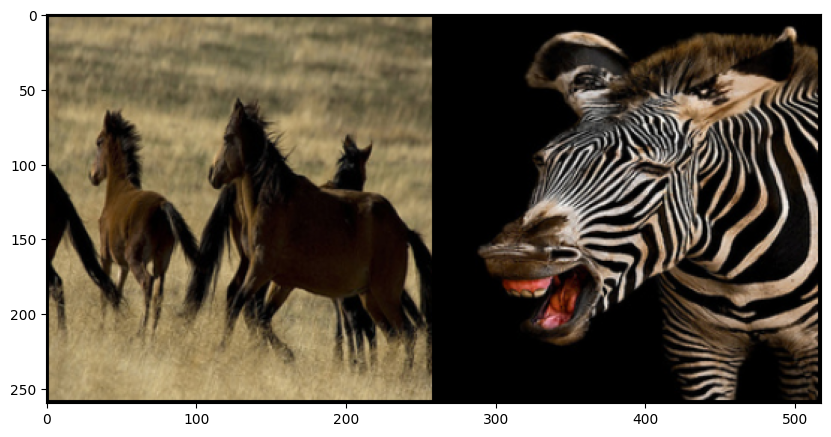

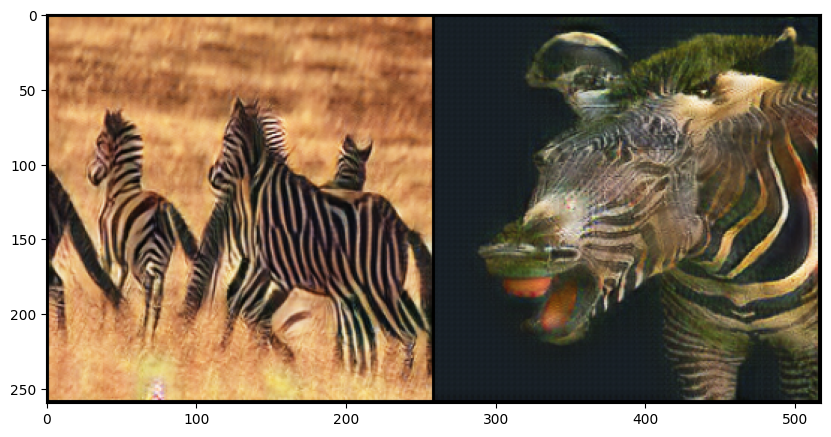

0.46275484561920166 + 0.35411933064460754 = 0.8168741464614868
0.1153181791305542 + 0.09332944452762604 = 0.20864762365818024
0.10499316453933716 + 0.07397614419460297 = 0.17896930873394012
gen_loss: 2.627432107925415 fake_A: tensor([[[[ 0.3179,  0.3312,  0.3291,  ...,  0.3554,  0.3883,  0.3558],
          [ 0.2512,  0.3068,  0.3437,  ...,  0.3375,  0.3843,  0.4043],
          [ 0.3262,  0.2999,  0.2867,  ...,  0.3715,  0.4117,  0.3940],
          ...,
          [ 0.2027,  0.2287,  0.1137,  ..., -0.2050, -0.2364, -0.1321],
          [ 0.2010,  0.2538,  0.0955,  ..., -0.2363, -0.2058, -0.1339],
          [ 0.1135,  0.1233,  0.0210,  ..., -0.1307, -0.0648, -0.0590]],

         [[ 0.2368,  0.2587,  0.2643,  ...,  0.2777,  0.2898,  0.3362],
          [ 0.1576,  0.1912,  0.2269,  ...,  0.2684,  0.3078,  0.3670],
          [ 0.2211,  0.1952,  0.1735,  ...,  0.3174,  0.3240,  0.3363],
          ...,
          [ 0.0521,  0.1697,  0.0887,  ..., -0.2011, -0.2469, -0.1855],
          [ 0.0478,  0

0.5658752918243408 + 0.2661285996437073 = 0.8320038914680481
0.12827208638191223 + 0.12168421596288681 = 0.24995630979537964
0.05188222974538803 + 0.08007848262786865 = 0.13196071982383728
gen_loss: 2.1766066551208496 fake_A: tensor([[[[ 1.5338e-01,  1.7175e-01,  1.8519e-01,  ...,  4.7887e-01,
            5.7444e-01,  7.3402e-01],
          [ 1.6676e-01,  1.6082e-01,  1.8917e-01,  ...,  6.0663e-01,
            6.4446e-01,  7.5797e-01],
          [ 1.6093e-01,  1.7217e-01,  1.9645e-01,  ...,  8.0984e-01,
            7.9682e-01,  8.1186e-01],
          ...,
          [ 1.3654e-01,  1.0655e-01,  1.1194e-01,  ..., -1.7208e-02,
           -1.5732e-02,  1.0887e-02],
          [ 1.5214e-01,  1.5928e-01,  1.5093e-01,  ..., -6.9631e-02,
           -4.6058e-02, -2.3678e-02],
          [ 1.2023e-01,  1.3390e-01,  1.4154e-01,  ..., -3.6316e-02,
           -3.0125e-03, -1.7386e-02]],

         [[ 1.6552e-01,  1.8950e-01,  1.9559e-01,  ...,  6.3005e-01,
            6.7616e-01,  8.0134e-01],
        

0.6382747292518616 + 0.6659539341926575 = 1.304228663444519
0.13860541582107544 + 0.11927032470703125 = 0.2578757405281067
0.12599119544029236 + 0.0705534815788269 = 0.19654467701911926
gen_loss: 3.2954630851745605 fake_A: tensor([[[[ 0.1053,  0.0905,  0.0934,  ...,  0.1189,  0.0126, -0.0767],
          [ 0.0283,  0.0442,  0.1365,  ..., -0.0206, -0.0776, -0.0579],
          [ 0.0209,  0.0314,  0.1454,  ..., -0.1645, -0.1624, -0.1312],
          ...,
          [-0.1733, -0.0490, -0.0992,  ...,  0.0058, -0.0136,  0.0519],
          [ 0.0671,  0.1360,  0.0027,  ..., -0.0499, -0.0062,  0.0854],
          [ 0.1135,  0.0709, -0.1045,  ...,  0.0122,  0.0450,  0.0671]],

         [[ 0.3897,  0.4086,  0.4232,  ...,  0.4070,  0.3684,  0.3211],
          [ 0.3479,  0.3610,  0.4721,  ...,  0.3017,  0.3177,  0.3408],
          [ 0.3741,  0.3896,  0.4847,  ...,  0.2282,  0.2720,  0.3143],
          ...,
          [ 0.1526,  0.2190,  0.1193,  ...,  0.2797,  0.3087,  0.3748],
          [ 0.3208,  0.35

0.4662330448627472 + 0.3740787208080292 = 0.8403117656707764
0.1561545729637146 + 0.13627761602401733 = 0.29243218898773193
0.12400804460048676 + 0.04847786948084831 = 0.17248591780662537
gen_loss: 2.594414234161377 fake_A: tensor([[[[-0.0122, -0.0119,  0.0544,  ...,  0.0155,  0.0703,  0.0614],
          [-0.0192, -0.0242,  0.0565,  ...,  0.0299,  0.0923,  0.1246],
          [-0.0280, -0.0319,  0.0350,  ...,  0.0138,  0.0557,  0.0726],
          ...,
          [ 0.8027,  0.7961,  0.7906,  ...,  0.7866,  0.7558,  0.7525],
          [ 0.8055,  0.7936,  0.7903,  ...,  0.7700,  0.7530,  0.7475],
          [ 0.8258,  0.8032,  0.8005,  ...,  0.7883,  0.7946,  0.7837]],

         [[ 0.2309,  0.2445,  0.2860,  ...,  0.0624,  0.1107,  0.1345],
          [ 0.2066,  0.2062,  0.2561,  ...,  0.0764,  0.1452,  0.1978],
          [ 0.2043,  0.2097,  0.2737,  ...,  0.0949,  0.1273,  0.1623],
          ...,
          [ 0.7528,  0.7696,  0.7459,  ...,  0.7109,  0.6816,  0.6970],
          [ 0.7605,  0.7

0.538478672504425 + 0.311576247215271 = 0.850054919719696
0.19432368874549866 + 0.23008178174495697 = 0.42440545558929443
0.14665167033672333 + 0.05308559536933899 = 0.19973726570606232
gen_loss: 2.8898680210113525 fake_A: tensor([[[[ 0.6747,  0.6805,  0.6798,  ...,  0.9510,  0.8773,  0.9051],
          [ 0.6803,  0.6827,  0.6865,  ...,  0.9561,  0.9043,  0.8476],
          [ 0.6792,  0.6696,  0.6924,  ...,  0.9626,  0.9400,  0.9114],
          ...,
          [-0.2727, -0.3335, -0.4206,  ..., -0.1769, -0.2783, -0.3520],
          [-0.2972, -0.2980, -0.3030,  ..., -0.1358, -0.2465, -0.3642],
          [-0.3089, -0.2987, -0.2863,  ..., -0.2649, -0.2905, -0.4046]],

         [[ 0.8550,  0.8668,  0.8653,  ...,  0.9750,  0.9494,  0.9592],
          [ 0.8653,  0.8672,  0.8607,  ...,  0.9767,  0.9608,  0.9404],
          [ 0.8622,  0.8645,  0.8632,  ...,  0.9717,  0.9525,  0.9522],
          ...,
          [-0.1247, -0.1719, -0.2826,  ...,  0.0295, -0.0438, -0.1285],
          [-0.1418, -0.15

0.3215618133544922 + 0.37183696031570435 = 0.6933987736701965
0.15173058211803436 + 0.10379039496183395 = 0.2555209696292877
0.08690018951892853 + 0.054121196269989014 = 0.14102138578891754
gen_loss: 2.129164695739746 fake_A: tensor([[[[-0.4018, -0.3965, -0.3820,  ..., -0.1077, -0.1010, -0.1032],
          [-0.3904, -0.3927, -0.3853,  ..., -0.0753, -0.0811, -0.0745],
          [-0.3935, -0.4056, -0.4020,  ..., -0.0246, -0.0352, -0.0410],
          ...,
          [ 0.2179,  0.2365,  0.2360,  ...,  0.6769,  0.6512,  0.6347],
          [ 0.2739,  0.2758,  0.2616,  ...,  0.6555,  0.6143,  0.5999],
          [ 0.3512,  0.3456,  0.3200,  ...,  0.5800,  0.5813,  0.5832]],

         [[-0.0374, -0.0280, -0.0094,  ...,  0.2267,  0.2310,  0.2425],
          [-0.0239, -0.0407, -0.0435,  ...,  0.2538,  0.2593,  0.2675],
          [-0.0467, -0.0479, -0.0372,  ...,  0.3116,  0.2991,  0.3016],
          ...,
          [ 0.2919,  0.3163,  0.3108,  ...,  0.7063,  0.6737,  0.6729],
          [ 0.3423,  0

0.5933692455291748 + 0.6332434415817261 = 1.2266126871109009
0.13393524289131165 + 0.17151299118995667 = 0.3054482340812683
0.08419918268918991 + 0.08815498650074005 = 0.17235416173934937
gen_loss: 2.980699062347412 fake_A: tensor([[[[ 0.4179,  0.0335,  0.3269,  ...,  0.5193,  0.3894,  0.0716],
          [ 0.7652,  0.6890,  0.8002,  ...,  0.4506,  0.3511,  0.0823],
          [ 0.8823,  0.8972,  0.9035,  ...,  0.4338,  0.2965,  0.0028],
          ...,
          [-0.1486, -0.1787, -0.1723,  ..., -0.2742, -0.0832, -0.1802],
          [-0.1338, -0.2218, -0.2314,  ..., -0.4355, -0.2447, -0.2655],
          [-0.1024, -0.1729, -0.1786,  ..., -0.4885, -0.3712, -0.3172]],

         [[ 0.5051,  0.3606,  0.4687,  ...,  0.7492,  0.6882,  0.4136],
          [ 0.7615,  0.7612,  0.8003,  ...,  0.7306,  0.7158,  0.4680],
          [ 0.9092,  0.9168,  0.9000,  ...,  0.7191,  0.6787,  0.4131],
          ...,
          [-0.1105, -0.0962, -0.0793,  ..., -0.1711,  0.0707,  0.0165],
          [-0.1531, -0.1

0.4632906913757324 + 0.5000810623168945 = 0.963371753692627
0.12516704201698303 + 0.06718577444553375 = 0.19235281646251678
0.05585664510726929 + 0.06820587813854218 = 0.12406252324581146
gen_loss: 2.2232322692871094 fake_A: tensor([[[[-0.3050, -0.2838, -0.0802,  ...,  0.8787,  0.7666,  0.7726],
          [-0.5117, -0.4820, -0.2943,  ...,  0.8550,  0.7203,  0.6734],
          [-0.4681, -0.5307, -0.5336,  ...,  0.8594,  0.7934,  0.7781],
          ...,
          [ 0.8533,  0.8508,  0.8652,  ...,  0.4049,  0.4294,  0.4081],
          [ 0.8749,  0.8624,  0.8736,  ...,  0.4666,  0.4519,  0.3489],
          [ 0.8433,  0.7838,  0.8245,  ...,  0.4245,  0.4573,  0.3462]],

         [[-0.1465, -0.1086,  0.1025,  ...,  0.9252,  0.8330,  0.8383],
          [-0.3671, -0.3711, -0.1048,  ...,  0.9171,  0.7986,  0.7938],
          [-0.2673, -0.3799, -0.3647,  ...,  0.9175,  0.8651,  0.8551],
          ...,
          [ 0.8488,  0.8791,  0.8758,  ...,  0.5020,  0.5104,  0.5260],
          [ 0.8895,  0.

0.5322383046150208 + 0.40838202834129333 = 0.9406203031539917
0.15977446734905243 + 0.08655428886413574 = 0.24632875621318817
0.11799129098653793 + 0.07903915643692017 = 0.1970304548740387
gen_loss: 2.9355576038360596 fake_A: tensor([[[[-0.3211, -0.3433, -0.3796,  ...,  0.4189,  0.3253,  0.2018],
          [-0.3125, -0.3016, -0.3621,  ...,  0.3580,  0.2716,  0.2177],
          [-0.3215, -0.3750, -0.3887,  ...,  0.2763,  0.1603,  0.1274],
          ...,
          [ 0.3279,  0.3678,  0.3904,  ...,  0.4123,  0.3224,  0.3794],
          [ 0.3394,  0.3630,  0.4252,  ...,  0.5276,  0.4435,  0.3972],
          [ 0.3203,  0.3300,  0.3478,  ...,  0.5611,  0.5957,  0.4706]],

         [[-0.4215, -0.4520, -0.4743,  ...,  0.3263,  0.2043,  0.1101],
          [-0.4016, -0.4017, -0.4469,  ...,  0.2262,  0.1488,  0.1034],
          [-0.4508, -0.4536, -0.4627,  ...,  0.1486,  0.0648,  0.0213],
          ...,
          [ 0.2443,  0.2919,  0.3066,  ...,  0.3727,  0.2521,  0.2822],
          [ 0.2513,  0

0.5161019563674927 + 0.5515282154083252 = 1.0676301717758179
0.08903559297323227 + 0.14713850617408752 = 0.2361741065979004
0.07793475687503815 + 0.09588631242513657 = 0.17382106184959412
gen_loss: 2.829458236694336 fake_A: tensor([[[[ 0.0951,  0.0815,  0.0646,  ...,  0.0595,  0.0640,  0.0506],
          [ 0.1107,  0.1110,  0.1083,  ...,  0.0485,  0.0811,  0.0885],
          [ 0.1347,  0.1488,  0.1548,  ...,  0.0297,  0.0921,  0.1005],
          ...,
          [-0.4915, -0.4501, -0.4283,  ..., -0.4784, -0.3825, -0.3164],
          [-0.3890, -0.3793, -0.3458,  ..., -0.4507, -0.3612, -0.3462],
          [-0.3619, -0.3619, -0.3885,  ..., -0.4118, -0.3153, -0.3146]],

         [[ 0.0650,  0.0807,  0.0605,  ...,  0.0547,  0.0656,  0.0539],
          [ 0.1089,  0.0938,  0.0861,  ...,  0.0161,  0.0659,  0.0554],
          [ 0.1186,  0.1340,  0.1466,  ...,  0.0110,  0.0721,  0.0691],
          ...,
          [-0.5130, -0.4661, -0.4483,  ..., -0.5281, -0.4054, -0.3726],
          [-0.4451, -0.4

0.6744507551193237 + 0.6156602501869202 = 1.2901110649108887
0.13612091541290283 + 0.18654952943325043 = 0.32267045974731445
0.0655316710472107 + 0.09000452607870102 = 0.1555362045764923
gen_loss: 2.8777401447296143 fake_A: tensor([[[[0.3325, 0.2562, 0.2321,  ..., 0.7196, 0.7103, 0.6942],
          [0.3081, 0.2411, 0.2088,  ..., 0.6884, 0.6810, 0.6996],
          [0.3079, 0.2523, 0.2120,  ..., 0.6969, 0.7005, 0.6842],
          ...,
          [0.2785, 0.1691, 0.1110,  ..., 0.4829, 0.3541, 0.4147],
          [0.3023, 0.2075, 0.1586,  ..., 0.5187, 0.4267, 0.4432],
          [0.3405, 0.2935, 0.2732,  ..., 0.5942, 0.5613, 0.5054]],

         [[0.4170, 0.3557, 0.3494,  ..., 0.8225, 0.8003, 0.7902],
          [0.4043, 0.3496, 0.3227,  ..., 0.8140, 0.7922, 0.8063],
          [0.3961, 0.3579, 0.3365,  ..., 0.8229, 0.8014, 0.7949],
          ...,
          [0.3197, 0.2329, 0.1706,  ..., 0.4893, 0.3831, 0.4033],
          [0.3525, 0.2751, 0.2517,  ..., 0.5499, 0.4795, 0.4755],
          [0.3958,

0.730119526386261 + 0.48107147216796875 = 1.211190938949585
0.1565370410680771 + 0.11883538961410522 = 0.2753724455833435
0.06993105262517929 + 0.07287847250699997 = 0.14280952513217926
gen_loss: 2.666823387145996 fake_A: tensor([[[[ 0.5067,  0.5219,  0.5639,  ...,  0.7908,  0.8050,  0.7775],
          [ 0.2655,  0.3134,  0.3742,  ...,  0.7805,  0.7850,  0.7875],
          [ 0.3016,  0.2992,  0.3515,  ...,  0.7718,  0.7729,  0.7693],
          ...,
          [-0.4568, -0.4803, -0.6018,  ...,  0.5603,  0.5708,  0.5217],
          [-0.4487, -0.4702, -0.6363,  ...,  0.3937,  0.5023,  0.4943],
          [-0.5023, -0.4956, -0.5933,  ...,  0.3629,  0.3804,  0.3015]],

         [[ 0.5070,  0.4924,  0.4996,  ...,  0.8589,  0.8485,  0.8332],
          [ 0.3094,  0.2885,  0.2865,  ...,  0.8411,  0.8390,  0.8446],
          [ 0.3514,  0.3020,  0.2871,  ...,  0.8317,  0.8293,  0.8281],
          ...,
          [-0.5464, -0.5931, -0.6736,  ...,  0.6620,  0.6153,  0.5149],
          [-0.5653, -0.584

0.3520527482032776 + 0.38738328218460083 = 0.7394360303878784
0.19751107692718506 + 0.14301277697086334 = 0.3405238389968872
0.07200486958026886 + 0.08865448087453842 = 0.16065934300422668
gen_loss: 2.3800816535949707 fake_A: tensor([[[[-0.7986, -0.8143, -0.8362,  ..., -0.3359, -0.0910,  0.0349],
          [-0.8149, -0.8317, -0.8379,  ..., -0.3112,  0.0551,  0.1116],
          [-0.8272, -0.8381, -0.8375,  ..., -0.5117, -0.2785, -0.1037],
          ...,
          [-0.4383, -0.4607, -0.4922,  ...,  0.0135, -0.2460, -0.4321],
          [-0.5980, -0.5875, -0.5300,  ..., -0.2044, -0.3494, -0.5014],
          [-0.6323, -0.6235, -0.6008,  ..., -0.3377, -0.4304, -0.5870]],

         [[-0.8773, -0.8623, -0.8862,  ..., -0.2007,  0.0574,  0.2183],
          [-0.8690, -0.8589, -0.8747,  ..., -0.2097,  0.2058,  0.2874],
          [-0.8777, -0.8700, -0.8678,  ..., -0.4150, -0.1587,  0.0322],
          ...,
          [-0.4399, -0.4835, -0.5343,  ...,  0.0451, -0.0983, -0.2817],
          [-0.6027, -0

0.41908925771713257 + 0.5475224256515503 = 0.9666116833686829
0.1483633816242218 + 0.10943914949893951 = 0.2578025460243225
0.0631369948387146 + 0.06319612264633179 = 0.1263331174850464
gen_loss: 2.255722999572754 fake_A: tensor([[[[-0.1440, -0.1359, -0.0616,  ..., -0.3058, -0.3301, -0.3645],
          [-0.1642, -0.0835,  0.0450,  ..., -0.2231, -0.2263, -0.2715],
          [-0.1220, -0.0634,  0.0328,  ...,  0.0120, -0.1206, -0.3290],
          ...,
          [ 0.1863,  0.0466, -0.1090,  ..., -0.3412, -0.0897,  0.0692],
          [ 0.3039,  0.2349, -0.0465,  ..., -0.2323, -0.1754, -0.0552],
          [ 0.2483,  0.1775, -0.0024,  ..., -0.0357,  0.0173,  0.0839]],

         [[ 0.1554,  0.2011,  0.2792,  ..., -0.1034, -0.1730, -0.1452],
          [ 0.1296,  0.2149,  0.3344,  ..., -0.0391, -0.0617, -0.0395],
          [ 0.1949,  0.2743,  0.3650,  ...,  0.1957,  0.0387, -0.0948],
          ...,
          [ 0.3667,  0.2436,  0.0838,  ..., -0.1820,  0.1361,  0.2697],
          [ 0.4017,  0.362

0.5402546525001526 + 0.2656433880329132 = 0.8058980703353882
0.12495510280132294 + 0.10075455904006958 = 0.22570966184139252
0.07899529486894608 + 0.07222861051559448 = 0.15122389793395996
gen_loss: 2.340708017349243 fake_A: tensor([[[[ 0.6580,  0.6610,  0.6983,  ...,  0.9767,  0.9737,  0.9671],
          [ 0.6324,  0.6107,  0.6626,  ...,  0.9762,  0.9775,  0.9738],
          [ 0.6142,  0.6130,  0.6691,  ...,  0.9752,  0.9800,  0.9728],
          ...,
          [ 0.5628,  0.3883,  0.3697,  ..., -0.3781, -0.3679, -0.3494],
          [ 0.4195,  0.3224,  0.3076,  ..., -0.3960, -0.3872, -0.3955],
          [ 0.4053,  0.3843,  0.3378,  ..., -0.4158, -0.3833, -0.4166]],

         [[ 0.5905,  0.6202,  0.6626,  ...,  0.9887,  0.9840,  0.9814],
          [ 0.5874,  0.5677,  0.6169,  ...,  0.9875,  0.9854,  0.9845],
          [ 0.5715,  0.5828,  0.6274,  ...,  0.9877,  0.9877,  0.9830],
          ...,
          [ 0.6386,  0.4502,  0.4500,  ..., -0.3224, -0.2967, -0.2711],
          [ 0.4882,  0.

0.5277076363563538 + 0.6851558089256287 = 1.2128634452819824
0.36125725507736206 + 0.11499854177236557 = 0.4762558043003082
0.05296758934855461 + 0.14639656245708466 = 0.19936415553092957
gen_loss: 3.2541306018829346 fake_A: tensor([[[[-0.4838, -0.4941, -0.5183,  ..., -0.4113, -0.4232, -0.4458],
          [-0.4848, -0.4722, -0.4925,  ..., -0.4130, -0.4250, -0.4271],
          [-0.4847, -0.5054, -0.4937,  ..., -0.4062, -0.4395, -0.4444],
          ...,
          [-0.3904, -0.4204, -0.4092,  ..., -0.4570, -0.4185, -0.4576],
          [-0.3748, -0.4029, -0.4384,  ..., -0.4683, -0.4285, -0.4430],
          [-0.3525, -0.3962, -0.4144,  ..., -0.4414, -0.4091, -0.4508]],

         [[-0.7652, -0.7432, -0.7580,  ...,  0.4341,  0.3782,  0.3280],
          [-0.7508, -0.7410, -0.7612,  ...,  0.4157,  0.4026,  0.3388],
          [-0.7643, -0.7532, -0.7552,  ...,  0.4368,  0.3815,  0.3496],
          ...,
          [ 0.4034,  0.3809,  0.3735,  ..., -0.6986, -0.6323, -0.6429],
          [ 0.4126,  0.

0.3784826397895813 + 0.45647239685058594 = 0.8349550366401672
0.1794300377368927 + 0.20460747182369232 = 0.38403749465942383
0.07867001742124557 + 0.04343169927597046 = 0.12210171669721603
gen_loss: 2.0943758487701416 fake_A: tensor([[[[ 0.7903,  0.8502,  0.7419,  ...,  0.8954,  0.8839,  0.8851],
          [ 0.7771,  0.8343,  0.7467,  ...,  0.8907,  0.8932,  0.8894],
          [ 0.8089,  0.8150,  0.7529,  ...,  0.8836,  0.9028,  0.8867],
          ...,
          [-0.2391, -0.2336, -0.2384,  ..., -0.3646, -0.4174, -0.4867],
          [-0.2430, -0.2670, -0.2682,  ..., -0.4010, -0.4439, -0.5121],
          [-0.3039, -0.3258, -0.3591,  ..., -0.5017, -0.5221, -0.5718]],

         [[ 0.8313,  0.9041,  0.8305,  ...,  0.9550,  0.9397,  0.9382],
          [ 0.8131,  0.8914,  0.8244,  ...,  0.9479,  0.9416,  0.9435],
          [ 0.8301,  0.8647,  0.8125,  ...,  0.9444,  0.9480,  0.9389],
          ...,
          [-0.2678, -0.2519, -0.2566,  ..., -0.3512, -0.3720, -0.4456],
          [-0.2974, -0

0.5586062073707581 + 0.45902663469314575 = 1.0176328420639038
0.10075847804546356 + 0.1067018136382103 = 0.20746028423309326
0.04402971267700195 + 0.0617067813873291 = 0.10573649406433105
gen_loss: 2.0957436561584473 fake_A: tensor([[[[-3.4549e-04, -6.5478e-02, -1.3860e-01,  ..., -4.3933e-02,
           -4.1601e-01, -4.3134e-01],
          [-6.9975e-02, -1.2334e-01, -2.0595e-01,  ..., -3.4198e-02,
           -3.7881e-01, -4.0638e-01],
          [-9.9103e-02, -1.8109e-01, -3.1006e-01,  ..., -2.4457e-02,
           -2.5023e-01, -3.1643e-01],
          ...,
          [ 6.2755e-01,  6.2351e-01,  6.7113e-01,  ...,  7.3146e-01,
            7.6016e-01,  7.4129e-01],
          [ 6.5504e-01,  6.1760e-01,  6.6547e-01,  ...,  7.9993e-01,
            7.5146e-01,  6.3694e-01],
          [ 6.7024e-01,  6.1348e-01,  6.1898e-01,  ...,  8.3112e-01,
            8.0449e-01,  6.9335e-01]],

         [[ 5.1300e-02,  9.4008e-02,  7.7617e-02,  ...,  4.4728e-02,
           -3.3783e-01, -3.9981e-01],
         

0.3701512813568115 + 0.44596973061561584 = 0.816120982170105
0.11364996433258057 + 0.12781451642513275 = 0.24146448075771332
0.09633272886276245 + 0.056283317506313324 = 0.15261605381965637
gen_loss: 2.3664278984069824 fake_A: tensor([[[[ 0.8283,  0.8258,  0.8272,  ...,  0.9073,  0.9091,  0.9097],
          [ 0.8313,  0.8379,  0.8300,  ...,  0.9075,  0.9189,  0.9254],
          [ 0.8465,  0.8492,  0.8342,  ...,  0.9151,  0.9227,  0.9226],
          ...,
          [-0.4774, -0.4989, -0.5610,  ..., -0.7666, -0.7863, -0.7768],
          [-0.5330, -0.5497, -0.5582,  ..., -0.8192, -0.8176, -0.8095],
          [-0.4704, -0.4761, -0.5192,  ..., -0.8167, -0.7476, -0.7481]],

         [[ 0.9161,  0.9174,  0.9142,  ...,  0.9630,  0.9618,  0.9616],
          [ 0.9096,  0.9148,  0.9102,  ...,  0.9594,  0.9629,  0.9672],
          [ 0.9118,  0.9146,  0.9052,  ...,  0.9634,  0.9649,  0.9634],
          ...,
          [-0.5284, -0.5527, -0.6098,  ..., -0.7262, -0.7211, -0.7400],
          [-0.6162, -

0.4538612961769104 + 0.5560998320579529 = 1.0099611282348633
0.1567181944847107 + 0.10840149968862534 = 0.2651197016239166
0.08008340001106262 + 0.07308050990104675 = 0.15316390991210938
gen_loss: 2.568112373352051 fake_A: tensor([[[[-0.0877, -0.1291, -0.2684,  ...,  0.7802,  0.8335,  0.8559],
          [-0.1131, -0.0608, -0.1692,  ...,  0.7704,  0.8014,  0.8234],
          [-0.0538, -0.0937, -0.1369,  ...,  0.7772,  0.7792,  0.7975],
          ...,
          [-0.3264, -0.3485, -0.3294,  ...,  0.3791,  0.3976,  0.5648],
          [-0.3142, -0.3807, -0.3366,  ...,  0.7676,  0.6772,  0.5850],
          [-0.3752, -0.4184, -0.4212,  ...,  0.8134,  0.7395,  0.6472]],

         [[ 0.0663,  0.0648, -0.0449,  ...,  0.5028,  0.6012,  0.6685],
          [ 0.1354,  0.2077,  0.0929,  ...,  0.5105,  0.5795,  0.6440],
          [ 0.2648,  0.2193,  0.1582,  ...,  0.5232,  0.5204,  0.6069],
          ...,
          [ 0.1544,  0.1088,  0.1065,  ...,  0.5677,  0.5453,  0.6885],
          [ 0.1211,  0.05

0.4703447222709656 + 0.38236701488494873 = 0.8527117371559143
0.20538835227489471 + 0.10674802958965302 = 0.31213638186454773
0.06212829798460007 + 0.059589650481939316 = 0.12171794474124908
gen_loss: 2.101104736328125 fake_A: tensor([[[[0.9281, 0.9221, 0.9220,  ..., 0.4779, 0.6699, 0.6674],
          [0.9290, 0.9173, 0.9134,  ..., 0.4370, 0.6141, 0.6867],
          [0.9221, 0.9092, 0.9175,  ..., 0.4204, 0.6096, 0.6747],
          ...,
          [0.8935, 0.8667, 0.8967,  ..., 0.9153, 0.9301, 0.9127],
          [0.8909, 0.8726, 0.8727,  ..., 0.8880, 0.8683, 0.8754],
          [0.8846, 0.8533, 0.8449,  ..., 0.8720, 0.8449, 0.8629]],

         [[0.9586, 0.9599, 0.9602,  ..., 0.5107, 0.6950, 0.6981],
          [0.9570, 0.9513, 0.9495,  ..., 0.4323, 0.6265, 0.6978],
          [0.9496, 0.9493, 0.9484,  ..., 0.4428, 0.6258, 0.6937],
          ...,
          [0.8657, 0.8524, 0.8795,  ..., 0.9088, 0.9185, 0.9028],
          [0.8827, 0.8774, 0.8793,  ..., 0.8957, 0.8801, 0.8865],
          [0.87

0.36448344588279724 + 0.30412840843200684 = 0.6686118841171265
0.08201052993535995 + 0.08341476321220398 = 0.16542530059814453
0.07767285406589508 + 0.074282705783844 = 0.15195555984973907
gen_loss: 2.204710006713867 fake_A: tensor([[[[-0.5050,  0.2772,  0.2089,  ..., -0.5868, -0.6047, -0.6250],
          [-0.5241,  0.2943,  0.2316,  ..., -0.5916, -0.5967, -0.5976],
          [-0.3427,  0.3564,  0.1675,  ..., -0.6087, -0.6221, -0.6064],
          ...,
          [ 0.9603,  0.9534,  0.9581,  ..., -0.6808, -0.6711, -0.6819],
          [ 0.9602,  0.9592,  0.9596,  ..., -0.7265, -0.7080, -0.7057],
          [ 0.9644,  0.9617,  0.9624,  ..., -0.7731, -0.7271, -0.7134]],

         [[-0.5068,  0.3617,  0.2579,  ..., -0.4801, -0.5050, -0.5499],
          [-0.5243,  0.3796,  0.2435,  ..., -0.4969, -0.4854, -0.5135],
          [-0.4041,  0.4120,  0.1876,  ..., -0.5140, -0.5150, -0.5202],
          ...,
          [ 0.9052,  0.8931,  0.8972,  ..., -0.5712, -0.5651, -0.5963],
          [ 0.8989,  0.

  0%|          | 0/1067 [00:00<?, ?it/s]

0.6620811820030212 + 0.4914824366569519 = 1.1535636186599731
0.11702275276184082 + 0.0686161071062088 = 0.18563885986804962
0.05063080042600632 + 0.05478677153587341 = 0.10541757196187973
gen_loss: 2.2263031005859375 fake_A: tensor([[[[-0.3053, -0.2993, -0.2890,  ..., -0.4331, -0.4014, -0.4086],
          [-0.3073, -0.3105, -0.3026,  ..., -0.4516, -0.4217, -0.3916],
          [-0.2896, -0.3094, -0.3112,  ..., -0.4633, -0.4522, -0.4071],
          ...,
          [-0.5591, -0.5501, -0.6007,  ..., -0.4070, -0.4495, -0.4431],
          [-0.6320, -0.6371, -0.6454,  ..., -0.4630, -0.4942, -0.4640],
          [-0.6710, -0.6763, -0.6689,  ..., -0.4457, -0.4586, -0.4084]],

         [[-0.2854, -0.2671, -0.2552,  ..., -0.3685, -0.3464, -0.3591],
          [-0.2667, -0.2779, -0.2715,  ..., -0.3876, -0.3576, -0.3428],
          [-0.2643, -0.2699, -0.2726,  ..., -0.3979, -0.3837, -0.3423],
          ...,
          [-0.1971, -0.1439, -0.2468,  ...,  0.0615,  0.0113, -0.0165],
          [-0.2997, -0.

0.43630337715148926 + 0.5182356834411621 = 0.9545390605926514
0.12338137626647949 + 0.08930866420269012 = 0.21269004046916962
0.07785283774137497 + 0.08899520337581635 = 0.16684803366661072
gen_loss: 2.6442885398864746 fake_A: tensor([[[[ 0.2649,  0.1931,  0.1586,  ...,  0.1706,  0.1261,  0.0881],
          [ 0.0881,  0.0929,  0.1200,  ...,  0.1262, -0.0241,  0.0142],
          [ 0.0485,  0.0009,  0.0620,  ..., -0.1399, -0.3275, -0.1583],
          ...,
          [ 0.1458,  0.2483,  0.1802,  ..., -0.0289,  0.1531, -0.1299],
          [ 0.0946,  0.0653,  0.1635,  ..., -0.0222, -0.1673, -0.2874],
          [-0.0811, -0.1762, -0.1971,  ..., -0.2204, -0.3632, -0.3499]],

         [[ 0.5399,  0.5257,  0.4960,  ...,  0.2225,  0.1766,  0.1257],
          [ 0.4253,  0.4469,  0.4465,  ...,  0.1802,  0.0421,  0.0434],
          [ 0.3646,  0.3509,  0.3962,  ..., -0.0864, -0.2457, -0.0795],
          ...,
          [ 0.3078,  0.4164,  0.3661,  ...,  0.2978,  0.4925,  0.2748],
          [ 0.2497,  

0.7115808129310608 + 0.4257470369338989 = 1.1373279094696045
0.16637404263019562 + 0.11367328464984894 = 0.28004732728004456
0.0632164403796196 + 0.05910967290401459 = 0.12232611328363419
gen_loss: 2.3885936737060547 fake_A: tensor([[[[-0.8828, -0.8860, -0.8835,  ..., -0.0529, -0.0145, -0.0195],
          [-0.8947, -0.8945, -0.8872,  ...,  0.0470,  0.0049,  0.0483],
          [-0.8799, -0.8927, -0.8869,  ...,  0.3100,  0.2218,  0.1787],
          ...,
          [-0.7732, -0.6981, -0.6213,  ..., -0.2084, -0.2221, -0.2431],
          [-0.7649, -0.7398, -0.7080,  ..., -0.1102, -0.1878, -0.2114],
          [-0.7198, -0.7268, -0.7849,  ..., -0.1852, -0.2640, -0.2853]],

         [[-0.8760, -0.8698, -0.8885,  ...,  0.0647,  0.1107,  0.0905],
          [-0.8845, -0.8761, -0.8869,  ...,  0.1045,  0.0637,  0.0946],
          [-0.8769, -0.8785, -0.8836,  ...,  0.2943,  0.1911,  0.1971],
          ...,
          [-0.7773, -0.6940, -0.6339,  ..., -0.3030, -0.2223, -0.2162],
          [-0.7697, -0.

0.4150380790233612 + 0.5056219100952148 = 0.9206600189208984
0.1894664764404297 + 0.12456288933753967 = 0.31402936577796936
0.08195110410451889 + 0.06615936756134033 = 0.14811047911643982
gen_loss: 2.4331679344177246 fake_A: tensor([[[[ 3.0483e-01,  1.8281e-01, -1.2262e-04,  ...,  6.2746e-01,
            6.7367e-01,  4.7405e-01],
          [ 1.4591e-01,  6.7119e-02, -1.0210e-02,  ...,  6.4901e-01,
            6.2738e-01,  4.7891e-01],
          [ 3.1259e-01,  8.5870e-02, -1.5696e-01,  ...,  6.5967e-01,
            4.7910e-01,  3.8652e-01],
          ...,
          [ 7.0526e-02,  2.3896e-03,  3.9751e-02,  ..., -2.4496e-01,
           -2.7049e-01, -1.6485e-01],
          [ 1.1890e-01,  7.1773e-02,  6.4550e-02,  ..., -2.9522e-01,
           -2.9502e-01, -1.9607e-01],
          [ 8.4705e-02,  4.8425e-02, -1.0836e-02,  ..., -3.2092e-01,
           -2.6625e-01, -1.8416e-01]],

         [[ 2.6017e-01,  1.5503e-01,  1.2933e-02,  ...,  6.6539e-01,
            7.7256e-01,  6.5697e-01],
         

0.9338570833206177 + 0.553328812122345 = 1.4871859550476074
0.1373724788427353 + 0.07737688720226288 = 0.21474936604499817
0.07671350240707397 + 0.06645338982343674 = 0.1431668996810913
gen_loss: 2.9403300285339355 fake_A: tensor([[[[-2.9824e-02, -2.3339e-02, -1.9853e-02,  ..., -4.1467e-01,
           -4.5935e-01, -5.0558e-01],
          [-4.8212e-02, -3.2536e-02, -1.0315e-02,  ..., -4.3116e-01,
           -4.4783e-01, -4.7962e-01],
          [ 1.3097e-02,  3.2611e-03,  5.1222e-04,  ..., -4.7534e-01,
           -4.7787e-01, -4.9530e-01],
          ...,
          [ 2.6914e-01,  2.4819e-01,  2.4032e-01,  ...,  2.0974e-01,
            5.4224e-01,  3.2548e-01],
          [ 2.4000e-01,  2.0124e-01,  2.1437e-01,  ...,  2.2567e-01,
            3.0235e-01,  2.8060e-01],
          [ 2.1827e-01,  1.9836e-01,  1.8112e-01,  ...,  1.4283e-01,
            1.8390e-01,  2.9163e-01]],

         [[ 2.5835e-01,  2.7303e-01,  2.6599e-01,  ..., -2.6934e-01,
           -3.1067e-01, -3.8033e-01],
          [

0.5958165526390076 + 0.4263635575771332 = 1.0221800804138184
0.32897377014160156 + 0.12985406816005707 = 0.4588278532028198
0.11732925474643707 + 0.05586230754852295 = 0.17319156229496002
gen_loss: 2.799978494644165 fake_A: tensor([[[[ 0.0925,  0.0794,  0.0485,  ...,  0.2104,  0.1961,  0.1706],
          [ 0.0606,  0.0419,  0.0421,  ...,  0.2075,  0.1767,  0.1636],
          [ 0.0261,  0.0101,  0.0194,  ...,  0.1823,  0.1437,  0.1356],
          ...,
          [-0.9723, -0.9716, -0.9767,  ...,  0.8104,  0.7809,  0.7401],
          [-0.9646, -0.9735, -0.9791,  ...,  0.8392,  0.7934,  0.7186],
          [-0.9572, -0.9633, -0.9719,  ...,  0.8293,  0.8026,  0.7423]],

         [[ 0.2390,  0.2345,  0.2210,  ...,  0.3437,  0.3419,  0.3318],
          [ 0.2205,  0.1849,  0.1849,  ...,  0.3294,  0.3181,  0.3143],
          [ 0.1804,  0.1696,  0.1815,  ...,  0.3191,  0.2849,  0.2966],
          ...,
          [-0.9740, -0.9715, -0.9762,  ...,  0.8555,  0.8361,  0.8098],
          [-0.9710, -0.9

0.7525852918624878 + 0.5423798561096191 = 1.294965147972107
0.12116061896085739 + 0.15023283660411835 = 0.27139344811439514
0.06942220032215118 + 0.06187286227941513 = 0.13129505515098572
gen_loss: 2.6350550651550293 fake_A: tensor([[[[ 0.1199,  0.1067,  0.0980,  ..., -0.3440, -0.2545, -0.3206],
          [ 0.1073,  0.1068,  0.1378,  ..., -0.3871, -0.2754, -0.2952],
          [ 0.1310,  0.1286,  0.1597,  ..., -0.3712, -0.3586, -0.3413],
          ...,
          [-0.5423, -0.5757, -0.5770,  ..., -0.3071, -0.5419, -0.4358],
          [-0.5470, -0.5989, -0.5880,  ..., -0.4358, -0.4657, -0.3930],
          [-0.5553, -0.5977, -0.5943,  ..., -0.3333, -0.2961, -0.3538]],

         [[-0.1085, -0.0986, -0.0892,  ..., -0.4047, -0.3365, -0.4070],
          [-0.0843, -0.1130, -0.0899,  ..., -0.4595, -0.3599, -0.3976],
          [-0.0860, -0.0921, -0.0707,  ..., -0.4401, -0.4357, -0.4383],
          ...,
          [-0.6388, -0.6442, -0.6416,  ..., -0.5460, -0.6839, -0.6196],
          [-0.6518, -0.

0.5679119825363159 + 0.47914981842041016 = 1.047061800956726
0.14246287941932678 + 0.12895792722702026 = 0.27142080664634705
0.06298451125621796 + 0.06203910708427429 = 0.12502361834049225
gen_loss: 2.3244400024414062 fake_A: tensor([[[[-4.0458e-01, -3.8885e-01, -3.4785e-01,  ...,  6.1191e-02,
            3.8727e-02,  4.9242e-02],
          [-2.5005e-01, -2.3325e-01, -1.3539e-01,  ...,  3.4126e-02,
            1.4700e-02,  4.9570e-02],
          [-7.3673e-02, -2.2373e-02,  2.1621e-02,  ..., -4.0246e-03,
            6.5160e-04,  4.4999e-02],
          ...,
          [ 4.0505e-01,  3.8753e-01,  3.7707e-01,  ...,  5.6372e-01,
            5.0468e-01,  4.7098e-01],
          [ 4.2415e-01,  3.9968e-01,  3.9082e-01,  ...,  5.7748e-01,
            5.0934e-01,  4.4474e-01],
          [ 4.1999e-01,  3.9397e-01,  3.7605e-01,  ...,  5.7478e-01,
            5.4434e-01,  4.8573e-01]],

         [[-1.6252e-01, -1.4518e-01, -1.0873e-01,  ...,  3.3264e-01,
            3.0370e-01,  2.9835e-01],
        

0.6028064489364624 + 0.6291354894638062 = 1.2319419384002686
0.1549704670906067 + 0.10808070003986359 = 0.2630511522293091
0.09077700227499008 + 0.08742262423038483 = 0.1781996190547943
gen_loss: 3.040243148803711 fake_A: tensor([[[[-0.2593, -0.2568, -0.2911,  ..., -0.1736, -0.0895, -0.1144],
          [-0.1919, -0.1315, -0.1945,  ..., -0.1989, -0.1505, -0.1152],
          [-0.2991, -0.2019, -0.2263,  ..., -0.2452, -0.1505, -0.0946],
          ...,
          [-0.4982, -0.4972, -0.5379,  ..., -0.6480, -0.5853, -0.3780],
          [-0.5118, -0.5682, -0.5320,  ..., -0.5205, -0.4869, -0.3496],
          [-0.5331, -0.5730, -0.5742,  ..., -0.4029, -0.2923, -0.2426]],

         [[-0.0114,  0.0105, -0.0072,  ..., -0.2109, -0.0548, -0.0483],
          [ 0.0753,  0.1382,  0.0525,  ..., -0.2216, -0.0631, -0.0142],
          [-0.0563,  0.0584,  0.0497,  ..., -0.2555, -0.1128, -0.0479],
          ...,
          [-0.3612, -0.3529, -0.3495,  ..., -0.5570, -0.4819, -0.2626],
          [-0.4154, -0.466

0.45054590702056885 + 0.4059966802597046 = 0.8565425872802734
0.14107680320739746 + 0.11430337280035019 = 0.25538018345832825
0.06623640656471252 + 0.11571743339300156 = 0.18195384740829468
gen_loss: 2.7016191482543945 fake_A: tensor([[[[ 0.1707,  0.2081,  0.2858,  ...,  0.4895,  0.5318,  0.5590],
          [ 0.1437,  0.2190,  0.2389,  ...,  0.4191,  0.5519,  0.6111],
          [ 0.1741,  0.2786,  0.2742,  ...,  0.5174,  0.5961,  0.5994],
          ...,
          [ 0.4594,  0.3954,  0.3916,  ...,  0.5262,  0.4453,  0.3734],
          [ 0.3781,  0.3143,  0.2865,  ...,  0.4709,  0.4531,  0.3877],
          [ 0.2783,  0.1981,  0.1624,  ...,  0.4092,  0.3968,  0.3070]],

         [[ 0.0418,  0.0546,  0.1542,  ...,  0.3642,  0.3885,  0.4323],
          [ 0.0579,  0.0889,  0.1052,  ...,  0.2850,  0.4171,  0.4929],
          [ 0.0872,  0.1436,  0.1276,  ...,  0.3817,  0.4534,  0.4612],
          ...,
          [ 0.2972,  0.2208,  0.2444,  ...,  0.4160,  0.3382,  0.2722],
          [ 0.1886,  

0.5461164712905884 + 0.3251912295818329 = 0.8713077306747437
0.10951142758131027 + 0.10144330561161041 = 0.2109547257423401
0.08100800216197968 + 0.09528788179159164 = 0.17629587650299072
gen_loss: 2.6553618907928467 fake_A: tensor([[[[ 0.2131,  0.0441,  0.1758,  ..., -0.1601, -0.0658, -0.1923],
          [ 0.1830,  0.0337,  0.0863,  ..., -0.0572, -0.1061, -0.2118],
          [ 0.0997,  0.0842,  0.2177,  ...,  0.0607, -0.1509, -0.2261],
          ...,
          [ 0.3676,  0.3456,  0.3271,  ...,  0.2916,  0.2527,  0.2584],
          [ 0.4656,  0.4172,  0.3833,  ...,  0.3575,  0.3142,  0.2073],
          [ 0.4519,  0.3719,  0.3093,  ...,  0.2820,  0.3505,  0.2623]],

         [[ 0.3019,  0.0768,  0.2191,  ..., -0.1426, -0.0894, -0.1869],
          [ 0.3073,  0.1149,  0.1281,  ..., -0.0744, -0.1222, -0.2141],
          [ 0.1954,  0.0939,  0.2058,  ..., -0.0010, -0.2031, -0.2442],
          ...,
          [ 0.6503,  0.6658,  0.6516,  ...,  0.4637,  0.3878,  0.3777],
          [ 0.6894,  0.

0.5653602480888367 + 0.4443681240081787 = 1.0097284317016602
0.12659218907356262 + 0.07730291783809662 = 0.20389510691165924
0.06245553120970726 + 0.09616105258464813 = 0.1586165875196457
gen_loss: 2.616283893585205 fake_A: tensor([[[[-2.1792e-01, -2.2681e-01, -1.9698e-01,  ...,  3.7673e-01,
            1.9692e-01,  2.9029e-01],
          [-4.2948e-01, -4.0009e-01, -3.1990e-01,  ...,  4.0508e-01,
            2.9057e-01,  2.7015e-01],
          [-4.4533e-01, -4.8901e-01, -3.1644e-01,  ...,  7.5812e-02,
            3.0974e-01,  2.6660e-01],
          ...,
          [ 4.6309e-01,  1.2444e-01, -8.8182e-02,  ...,  1.8973e-01,
           -2.3205e-02,  1.2946e-02],
          [ 2.0855e-01,  8.3266e-02,  2.0894e-01,  ..., -2.0678e-02,
           -3.1788e-02, -5.2190e-02],
          [ 9.9125e-02,  9.6735e-02,  3.1270e-01,  ..., -7.5510e-02,
            6.1791e-02, -3.5110e-02]],

         [[-1.8104e-01, -1.8848e-01, -1.8018e-01,  ...,  4.1713e-01,
            1.6584e-01,  2.4743e-01],
          

0.5762691497802734 + 0.2305031269788742 = 0.8067722916603088
0.11093106120824814 + 0.0736517608165741 = 0.18458282947540283
0.05867627263069153 + 0.06904546916484833 = 0.12772174179553986
gen_loss: 2.102447986602783 fake_A: tensor([[[[ 0.9810,  0.9765,  0.9783,  ...,  0.9808,  0.9789,  0.9760],
          [ 0.9823,  0.9790,  0.9805,  ...,  0.9816,  0.9818,  0.9789],
          [ 0.9830,  0.9799,  0.9835,  ...,  0.9833,  0.9840,  0.9779],
          ...,
          [-0.5294, -0.5095, -0.5756,  ...,  0.0895, -0.0345, -0.0073],
          [-0.5461, -0.5447, -0.5842,  ...,  0.2193,  0.1529,  0.0307],
          [-0.5743, -0.5709, -0.6156,  ...,  0.1348,  0.0516, -0.0580]],

         [[ 0.9844,  0.9824,  0.9825,  ...,  0.9810,  0.9761,  0.9723],
          [ 0.9825,  0.9816,  0.9827,  ...,  0.9816,  0.9794,  0.9776],
          [ 0.9832,  0.9826,  0.9830,  ...,  0.9827,  0.9817,  0.9747],
          ...,
          [-0.5895, -0.5611, -0.6054,  ..., -0.0702, -0.1745, -0.1433],
          [-0.6612, -0.6

0.6008208394050598 + 0.698408842086792 = 1.299229621887207
0.2088775485754013 + 0.09919967502355576 = 0.30807721614837646
0.09096814692020416 + 0.058418624103069305 = 0.14938676357269287
gen_loss: 2.8239049911499023 fake_A: tensor([[[[-0.3451, -0.3867, -0.3614,  ..., -0.5384, -0.6024, -0.6282],
          [-0.3385, -0.3969, -0.3559,  ..., -0.5560, -0.6018, -0.6205],
          [-0.3781, -0.4206, -0.3528,  ..., -0.5684, -0.6007, -0.6130],
          ...,
          [-0.4594, -0.4641, -0.4371,  ..., -0.8956, -0.9031, -0.9093],
          [-0.4590, -0.4703, -0.4438,  ..., -0.9152, -0.9159, -0.9164],
          [-0.4335, -0.4776, -0.4513,  ..., -0.9315, -0.9152, -0.9164]],

         [[-0.2699, -0.3205, -0.3038,  ..., -0.4869, -0.5594, -0.5897],
          [-0.2641, -0.3400, -0.3395,  ..., -0.5004, -0.5557, -0.5896],
          [-0.3007, -0.3536, -0.3287,  ..., -0.5299, -0.5669, -0.5905],
          ...,
          [-0.4062, -0.4018, -0.4020,  ..., -0.8648, -0.8747, -0.8735],
          [-0.4379, -0.4

0.519900918006897 + 0.1657949537038803 = 0.6856958866119385
0.08822189271450043 + 0.07883965969085693 = 0.16706155240535736
0.0826408863067627 + 0.08476685732603073 = 0.16740775108337402
gen_loss: 2.3764796257019043 fake_A: tensor([[[[0.6409, 0.6440, 0.6475,  ..., 0.7355, 0.7398, 0.7373],
          [0.6449, 0.6383, 0.6371,  ..., 0.7309, 0.7312, 0.7453],
          [0.6513, 0.6405, 0.6437,  ..., 0.7369, 0.7345, 0.7309],
          ...,
          [0.4631, 0.4311, 0.4335,  ..., 0.5443, 0.4789, 0.5754],
          [0.4408, 0.4239, 0.3834,  ..., 0.6419, 0.5528, 0.6378],
          [0.4610, 0.4598, 0.4152,  ..., 0.6709, 0.6203, 0.6712]],

         [[0.7046, 0.7151, 0.7131,  ..., 0.7971, 0.8082, 0.8153],
          [0.6968, 0.7025, 0.6995,  ..., 0.7903, 0.8079, 0.8256],
          [0.6902, 0.6947, 0.6951,  ..., 0.8010, 0.8067, 0.8130],
          ...,
          [0.3379, 0.3227, 0.3258,  ..., 0.4849, 0.4457, 0.5342],
          [0.2968, 0.3034, 0.2756,  ..., 0.5955, 0.5239, 0.6121],
          [0.3431,

0.6466312408447266 + 0.4894505441188812 = 1.1360818147659302
0.2821020781993866 + 0.17520920932292938 = 0.4573112726211548
0.08735611289739609 + 0.09362299740314484 = 0.18097910284996033
gen_loss: 2.9916040897369385 fake_A: tensor([[[[-0.1598, -0.1121, -0.1400,  ..., -0.7159, -0.7027, -0.6934],
          [-0.1571, -0.1109, -0.1307,  ..., -0.7019, -0.7035, -0.6973],
          [-0.2596, -0.2554, -0.2378,  ..., -0.7039, -0.7279, -0.7325],
          ...,
          [-0.1130, -0.2719, -0.3516,  ..., -0.6306, -0.5650, -0.5867],
          [-0.3252, -0.3894, -0.4393,  ..., -0.6454, -0.6197, -0.5931],
          [-0.4346, -0.4262, -0.4859,  ..., -0.6751, -0.6354, -0.6016]],

         [[-0.1470, -0.1072, -0.1418,  ..., -0.7631, -0.7671, -0.7891],
          [-0.1556, -0.1259, -0.1616,  ..., -0.7502, -0.7522, -0.7818],
          [-0.2248, -0.2464, -0.2402,  ..., -0.7457, -0.7660, -0.7903],
          ...,
          [-0.2128, -0.3152, -0.3576,  ..., -0.5103, -0.4251, -0.4637],
          [-0.4222, -0.4

0.44131404161453247 + 0.3557093143463135 = 0.797023355960846
0.11541654914617538 + 0.10039319843053818 = 0.21580974757671356
0.06663540005683899 + 0.06600016355514526 = 0.13263556361198425
gen_loss: 2.1449599266052246 fake_A: tensor([[[[ 0.9810,  0.9765,  0.9778,  ...,  0.7527,  0.7036,  0.6686],
          [ 0.9826,  0.9775,  0.9781,  ...,  0.7486,  0.7020,  0.6872],
          [ 0.9812,  0.9753,  0.9804,  ...,  0.7652,  0.7328,  0.7086],
          ...,
          [-0.3395, -0.3397, -0.3648,  ...,  0.7358,  0.7574,  0.7508],
          [-0.3339, -0.3454, -0.3572,  ...,  0.7264,  0.6494,  0.6561],
          [-0.3298, -0.3348, -0.3924,  ...,  0.6445,  0.6372,  0.6406]],

         [[ 0.9861,  0.9870,  0.9873,  ...,  0.6342,  0.5873,  0.5725],
          [ 0.9845,  0.9849,  0.9857,  ...,  0.6163,  0.5718,  0.5725],
          [ 0.9839,  0.9841,  0.9850,  ...,  0.6162,  0.5751,  0.5906],
          ...,
          [-0.2422, -0.2229, -0.2700,  ...,  0.7710,  0.7762,  0.7491],
          [-0.2453, -0

0.3098410367965698 + 0.4854373335838318 = 0.7952783703804016
0.1163649782538414 + 0.1366770714521408 = 0.2530420422554016
0.08815968036651611 + 0.0920729860663414 = 0.1802326738834381
gen_loss: 2.6229093074798584 fake_A: tensor([[[[ 0.0820,  0.0736,  0.1847,  ...,  0.2166,  0.2020,  0.1447],
          [ 0.0696,  0.0877,  0.1777,  ...,  0.1151,  0.1450,  0.1759],
          [ 0.0704,  0.1511,  0.2100,  ...,  0.1594,  0.1715,  0.2122],
          ...,
          [-0.0698, -0.1765, -0.0592,  ..., -0.1688, -0.2131, -0.1171],
          [-0.0487, -0.0967, -0.0617,  ..., -0.1904, -0.1877, -0.1652],
          [-0.0534, -0.0807, -0.0704,  ..., -0.1310, -0.0502, -0.0501]],

         [[-0.0793, -0.0441,  0.0433,  ...,  0.1044,  0.0805,  0.0250],
          [-0.0773, -0.0504,  0.0008,  ...,  0.0038,  0.0242,  0.0418],
          [-0.0970, -0.0011,  0.0291,  ...,  0.0302,  0.0291,  0.0509],
          ...,
          [-0.2533, -0.3328, -0.2165,  ..., -0.3702, -0.3722, -0.3127],
          [-0.2750, -0.2976

0.5902171730995178 + 0.4439312219619751 = 1.0341484546661377
0.16847947239875793 + 0.1262332648038864 = 0.29471272230148315
0.07048575580120087 + 0.08323130011558533 = 0.1537170559167862
gen_loss: 2.60079026222229 fake_A: tensor([[[[ 0.9711,  0.9662,  0.9693,  ...,  0.9692,  0.9689,  0.9634],
          [ 0.9744,  0.9718,  0.9699,  ...,  0.9738,  0.9719,  0.9666],
          [ 0.9725,  0.9699,  0.9730,  ...,  0.9749,  0.9728,  0.9642],
          ...,
          [ 0.4694,  0.3623,  0.3177,  ...,  0.1702,  0.2127,  0.3182],
          [ 0.4334,  0.3004,  0.3829,  ...,  0.2998,  0.3371,  0.3193],
          [ 0.4788,  0.4091,  0.4680,  ...,  0.2993,  0.4197,  0.3466]],

         [[ 0.9852,  0.9833,  0.9835,  ...,  0.9815,  0.9795,  0.9760],
          [ 0.9849,  0.9834,  0.9824,  ...,  0.9832,  0.9815,  0.9778],
          [ 0.9831,  0.9825,  0.9817,  ...,  0.9839,  0.9804,  0.9735],
          ...,
          [ 0.3970,  0.3085,  0.2579,  ...,  0.1526,  0.2100,  0.3116],
          [ 0.3048,  0.204

0.7069152593612671 + 0.27860864996910095 = 0.9855239391326904
0.08957518637180328 + 0.1401902139186859 = 0.2297654002904892
0.06788879632949829 + 0.08102767169475555 = 0.14891646802425385
gen_loss: 2.4976651668548584 fake_A: tensor([[[[-0.0168, -0.0047, -0.0024,  ..., -0.4285, -0.4393, -0.4281],
          [-0.0174,  0.0450,  0.0881,  ..., -0.3870, -0.4395, -0.4614],
          [-0.0077,  0.0246,  0.0456,  ..., -0.3373, -0.4174, -0.4504],
          ...,
          [ 0.2846,  0.3221,  0.3284,  ...,  0.7804,  0.7528,  0.7624],
          [ 0.7665,  0.7564,  0.7924,  ...,  0.9033,  0.8492,  0.7783],
          [ 0.8727,  0.8374,  0.8312,  ...,  0.9022,  0.8660,  0.8099]],

         [[ 0.0189,  0.0343,  0.0092,  ..., -0.1998, -0.1887, -0.1883],
          [ 0.0629,  0.1154,  0.1211,  ..., -0.1185, -0.1854, -0.2259],
          [ 0.0751,  0.1047,  0.1033,  ..., -0.1154, -0.2032, -0.2241],
          ...,
          [ 0.2862,  0.4045,  0.4146,  ...,  0.8237,  0.7828,  0.7809],
          [ 0.7475,  0.

0.4227724075317383 + 0.5781046152114868 = 1.000877022743225
0.23249363899230957 + 0.12070588767528534 = 0.3531995415687561
0.0719679743051529 + 0.10851296037435532 = 0.1804809272289276
gen_loss: 2.841006278991699 fake_A: tensor([[[[-0.1231, -0.1061, -0.0096,  ..., -0.8871, -0.9026, -0.8930],
          [-0.0604, -0.1249, -0.0471,  ..., -0.8903, -0.9092, -0.9053],
          [-0.0109,  0.0292,  0.0632,  ..., -0.9165, -0.8934, -0.9078],
          ...,
          [ 0.0155,  0.0181,  0.0821,  ...,  0.7566,  0.7251,  0.7523],
          [-0.0051, -0.0446, -0.0212,  ...,  0.7918,  0.7314,  0.7385],
          [ 0.0197, -0.0343, -0.0073,  ...,  0.8307,  0.8234,  0.7884]],

         [[-0.2559, -0.2134, -0.0789,  ..., -0.8376, -0.8803, -0.8594],
          [-0.1552, -0.1842, -0.1031,  ..., -0.8253, -0.8635, -0.8892],
          [-0.0515,  0.0198,  0.0224,  ..., -0.8780, -0.8772, -0.9131],
          ...,
          [-0.1246, -0.1169, -0.0761,  ...,  0.4169,  0.4336,  0.4875],
          [-0.1841, -0.2085

0.5897595286369324 + 0.4058530330657959 = 0.9956125617027283
0.2011144608259201 + 0.10846769064664841 = 0.3095821440219879
0.0812339261174202 + 0.07804843783378601 = 0.1592823565006256
gen_loss: 2.619394302368164 fake_A: tensor([[[[-0.5813, -0.5950, -0.6267,  ..., -0.8045, -0.7831, -0.8067],
          [-0.6024, -0.6256, -0.6340,  ..., -0.8112, -0.8349, -0.8550],
          [-0.5996, -0.6260, -0.6454,  ..., -0.8331, -0.8450, -0.8348],
          ...,
          [ 0.5445,  0.4546,  0.3898,  ...,  0.4893,  0.5835,  0.5293],
          [ 0.6174,  0.5243,  0.4275,  ...,  0.5138,  0.4636,  0.3519],
          [ 0.6893,  0.6057,  0.5561,  ...,  0.3842,  0.3987,  0.3316]],

         [[-0.5017, -0.5100, -0.5425,  ..., -0.5953, -0.5774, -0.6241],
          [-0.4625, -0.4950, -0.5143,  ..., -0.6078, -0.6510, -0.7309],
          [-0.4502, -0.4634, -0.4763,  ..., -0.6604, -0.6919, -0.6848],
          ...,
          [ 0.5273,  0.4479,  0.4238,  ...,  0.5503,  0.6693,  0.6289],
          [ 0.5816,  0.5002

0.5567428469657898 + 0.48854702711105347 = 1.0452898740768433
0.11541835963726044 + 0.09588011354207993 = 0.21129846572875977
0.055347274988889694 + 0.05797735974192619 = 0.11332463473081589
gen_loss: 2.1996660232543945 fake_A: tensor([[[[-0.8048, -0.8130, -0.8185,  ..., -0.8422, -0.8429, -0.8280],
          [-0.8155, -0.8330, -0.8334,  ..., -0.8616, -0.8633, -0.8364],
          [-0.7759, -0.8026, -0.7994,  ..., -0.8396, -0.8534, -0.8293],
          ...,
          [-0.2344, -0.2735, -0.2031,  ..., -0.8907, -0.8979, -0.8620],
          [-0.1296, -0.2352, -0.0873,  ..., -0.8798, -0.8833, -0.8612],
          [ 0.0616, -0.0571,  0.0441,  ..., -0.8812, -0.8608, -0.8426]],

         [[-0.7011, -0.6733, -0.6962,  ..., -0.7625, -0.7783, -0.7673],
          [-0.6810, -0.6523, -0.6705,  ..., -0.7593, -0.7780, -0.7569],
          [-0.6802, -0.6230, -0.6205,  ..., -0.7325, -0.7760, -0.7706],
          ...,
          [-0.1733, -0.2054, -0.1920,  ..., -0.7574, -0.8044, -0.7915],
          [-0.1049, 

0.6326050758361816 + 0.375455379486084 = 1.0080604553222656
0.10392924398183823 + 0.10842706263065338 = 0.212356299161911
0.07631070911884308 + 0.08290460705757141 = 0.1592153161764145
gen_loss: 2.6214492321014404 fake_A: tensor([[[[-0.6888, -0.7715, -0.7753,  ..., -0.6548, -0.6869, -0.6765],
          [-0.7151, -0.7760, -0.7700,  ..., -0.6302, -0.5860, -0.5848],
          [-0.7337, -0.7503, -0.7176,  ..., -0.6708, -0.4978, -0.5090],
          ...,
          [-0.2159, -0.1459,  0.0584,  ...,  0.1012,  0.2278,  0.3660],
          [-0.2735, -0.2888, -0.0660,  ...,  0.4644,  0.3611,  0.3312],
          [-0.0243, -0.0871, -0.0273,  ...,  0.5132,  0.5104,  0.4390]],

         [[-0.7947, -0.8412, -0.8504,  ..., -0.6372, -0.6826, -0.6472],
          [-0.7998, -0.8260, -0.8228,  ..., -0.5840, -0.5315, -0.5460],
          [-0.8333, -0.8309, -0.7974,  ..., -0.6530, -0.4689, -0.4988],
          ...,
          [-0.2756, -0.2060, -0.0342,  ..., -0.0644,  0.0807,  0.2640],
          [-0.3481, -0.343

0.602957546710968 + 0.5273858308792114 = 1.1303434371948242
0.1585768759250641 + 0.10501903295516968 = 0.26359590888023376
0.06968392431735992 + 0.0663987547159195 = 0.13608267903327942
gen_loss: 2.5175297260284424 fake_A: tensor([[[[-0.7469, -0.7472, -0.7231,  ..., -0.6129, -0.6101, -0.6455],
          [-0.7539, -0.7478, -0.7602,  ..., -0.7326, -0.7276, -0.7258],
          [-0.7729, -0.7485, -0.7773,  ..., -0.7653, -0.7098, -0.7092],
          ...,
          [-0.7327, -0.7127, -0.7029,  ..., -0.8111, -0.6704, -0.4638],
          [-0.7563, -0.7542, -0.6853,  ..., -0.7294, -0.6385, -0.5764],
          [-0.7594, -0.7789, -0.7561,  ..., -0.7431, -0.6092, -0.6098]],

         [[-0.6683, -0.5937, -0.5410,  ..., -0.4367, -0.4212, -0.5182],
          [-0.6228, -0.5930, -0.6249,  ..., -0.5527, -0.4988, -0.5518],
          [-0.6345, -0.5063, -0.6008,  ..., -0.6006, -0.4744, -0.4774],
          ...,
          [-0.7371, -0.6913, -0.6717,  ..., -0.7895, -0.6122, -0.4104],
          [-0.7970, -0.81

0.5939873456954956 + 0.5634150505065918 = 1.1574023962020874
0.14315608143806458 + 0.14437198638916016 = 0.28752806782722473
0.08386944979429245 + 0.07540692389011383 = 0.15927636623382568
gen_loss: 2.778918743133545 fake_A: tensor([[[[ 0.9760,  0.9742,  0.9723,  ...,  0.9598,  0.9577,  0.9475],
          [ 0.9756,  0.9742,  0.9731,  ...,  0.9609,  0.9588,  0.9465],
          [ 0.9729,  0.9725,  0.9765,  ...,  0.9618,  0.9606,  0.9452],
          ...,
          [ 0.0875,  0.1227,  0.1212,  ..., -0.8639, -0.8550, -0.6809],
          [ 0.0093,  0.0711,  0.1629,  ..., -0.8571, -0.8235, -0.7267],
          [ 0.0650,  0.1322,  0.2072,  ..., -0.8668, -0.7411, -0.7067]],

         [[ 0.9851,  0.9844,  0.9835,  ...,  0.9752,  0.9733,  0.9703],
          [ 0.9839,  0.9833,  0.9834,  ...,  0.9743,  0.9742,  0.9701],
          [ 0.9821,  0.9829,  0.9844,  ...,  0.9755,  0.9736,  0.9671],
          ...,
          [ 0.1923,  0.2363,  0.1635,  ..., -0.8230, -0.8030, -0.6051],
          [ 0.0940,  0.

0.40365761518478394 + 0.20281986892223358 = 0.6064774990081787
0.10888798534870148 + 0.10742636770009995 = 0.21631434559822083
0.10355883836746216 + 0.07374304533004761 = 0.17730188369750977
gen_loss: 2.401127815246582 fake_A: tensor([[[[-0.1075, -0.1243, -0.1146,  ..., -0.3054, -0.2990, -0.3115],
          [-0.1441, -0.1560, -0.1256,  ..., -0.2928, -0.2988, -0.3145],
          [-0.1323, -0.1510, -0.1370,  ..., -0.1862, -0.2184, -0.2909],
          ...,
          [-0.6834, -0.6710, -0.6510,  ..., -0.5918, -0.5901, -0.5950],
          [-0.6676, -0.7102, -0.6579,  ..., -0.6068, -0.5593, -0.5719],
          [-0.6190, -0.6723, -0.7033,  ..., -0.5995, -0.5335, -0.5391]],

         [[ 0.3615,  0.3526,  0.3632,  ...,  0.1760,  0.1763,  0.2178],
          [ 0.3341,  0.3112,  0.3134,  ...,  0.2017,  0.1941,  0.2131],
          [ 0.2778,  0.2508,  0.2552,  ...,  0.2657,  0.2378,  0.2219],
          ...,
          [-0.3371, -0.3035, -0.2979,  ..., -0.4460, -0.3824, -0.3848],
          [-0.2816, -

0.4781745672225952 + 0.5953958630561829 = 1.0735704898834229
0.08397535979747772 + 0.07715803384780884 = 0.16113339364528656
0.08157266676425934 + 0.058806758373975754 = 0.1403794288635254
gen_loss: 2.4934780597686768 fake_A: tensor([[[[ 0.0662,  0.1598, -0.0758,  ..., -0.6432, -0.6903, -0.6495],
          [ 0.0848,  0.1876, -0.0424,  ..., -0.7237, -0.7030, -0.6356],
          [ 0.0238,  0.2089, -0.0461,  ..., -0.7732, -0.7196, -0.6666],
          ...,
          [ 0.5718,  0.5635,  0.5931,  ...,  0.5324,  0.6646,  0.6109],
          [ 0.6771,  0.6651,  0.6172,  ..., -0.0708,  0.3407,  0.4100],
          [ 0.7574,  0.7521,  0.6825,  ..., -0.4831, -0.1381,  0.0212]],

         [[-0.0058,  0.1860, -0.0263,  ..., -0.5967, -0.6059, -0.5060],
          [ 0.0568,  0.2156, -0.0011,  ..., -0.6553, -0.5618, -0.4572],
          [-0.0219,  0.2402,  0.0247,  ..., -0.6763, -0.5572, -0.4387],
          ...,
          [ 0.5015,  0.5186,  0.5833,  ...,  0.5911,  0.7421,  0.6555],
          [ 0.5853,  0

0.525479793548584 + 0.5362602472305298 = 1.0617400407791138
0.13797399401664734 + 0.10372455418109894 = 0.24169854819774628
0.09802113473415375 + 0.0690375342965126 = 0.16705867648124695
gen_loss: 2.7564966678619385 fake_A: tensor([[[[-0.2957, -0.2842, -0.2264,  ..., -0.6246, -0.6517, -0.6954],
          [-0.2904, -0.2571, -0.1913,  ..., -0.6751, -0.6867, -0.7013],
          [-0.2870, -0.2415, -0.2002,  ..., -0.7301, -0.7229, -0.7097],
          ...,
          [-0.1944, -0.1804, -0.1611,  ...,  0.5275,  0.3444,  0.2274],
          [-0.1593, -0.1968, -0.1481,  ...,  0.4992,  0.3744,  0.2507],
          [-0.1366, -0.1770, -0.1256,  ...,  0.4558,  0.3962,  0.2717]],

         [[-0.2216, -0.1839, -0.1427,  ..., -0.5124, -0.5229, -0.6139],
          [-0.2070, -0.1739, -0.1302,  ..., -0.5807, -0.5602, -0.6193],
          [-0.1889, -0.1523, -0.1114,  ..., -0.6510, -0.6226, -0.6250],
          ...,
          [-0.1897, -0.1792, -0.1777,  ...,  0.4641,  0.2810,  0.1570],
          [-0.1910, -0.2

0.6462219953536987 + 0.3506375849246979 = 0.9968595504760742
0.16801533102989197 + 0.07101469486951828 = 0.23903003334999084
0.053878188133239746 + 0.06387268006801605 = 0.1177508682012558
gen_loss: 2.1982712745666504 fake_A: tensor([[[[-0.9083, -0.9377, -0.9312,  ..., -0.6639, -0.7351, -0.7812],
          [-0.8831, -0.8974, -0.9032,  ..., -0.6820, -0.7545, -0.7797],
          [-0.9088, -0.9269, -0.9369,  ..., -0.6652, -0.7706, -0.7852],
          ...,
          [-0.8045, -0.8231, -0.7570,  ..., -0.3416, -0.6399, -0.6338],
          [-0.8056, -0.8249, -0.8112,  ..., -0.2641, -0.5150, -0.5205],
          [-0.7573, -0.7724, -0.7625,  ..., -0.3265, -0.4397, -0.4810]],

         [[-0.7352, -0.7585, -0.7494,  ..., -0.5839, -0.6672, -0.7346],
          [-0.6728, -0.6289, -0.6435,  ..., -0.6344, -0.7031, -0.7556],
          [-0.7598, -0.7578, -0.7942,  ..., -0.6293, -0.7284, -0.7719],
          ...,
          [-0.5899, -0.6551, -0.5510,  ..., -0.2605, -0.4824, -0.4864],
          [-0.6189, -0

In [ ]:
from skimage import color
import numpy as np
plt.rcParams["figure.figsize"] = (10, 10)


def train(save_model=False):
    mean_generator_loss = 0
    mean_discriminator_loss = 0
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    cur_step = 0

    for epoch in range(n_epochs):
        # Dataloader returns the batches
        # for image, _ in tqdm(dataloader):
        for real_A, real_B in tqdm(dataloader):
            # image_width = image.shape[3]
            real_A = nn.functional.interpolate(real_A, size=target_shape)
            real_B = nn.functional.interpolate(real_B, size=target_shape)
            cur_batch_size = len(real_A)
            real_A = real_A.to(device)
            real_B = real_B.to(device)

            ### Update discriminator A ###
            disc_A_opt.zero_grad() # Zero out the gradient before backpropagation
            with torch.no_grad():
                fake_A = gen_BA(real_B)
            disc_A_loss = get_disc_loss(real_A, fake_A, disc_A, adv_criterion)
            disc_A_loss.backward(retain_graph=True) # Update gradients
            disc_A_opt.step() # Update optimizer

            ### Update discriminator B ###
            disc_B_opt.zero_grad() # Zero out the gradient before backpropagation
            with torch.no_grad():
                fake_B = gen_AB(real_A)
            disc_B_loss = get_disc_loss(real_B, fake_B, disc_B, adv_criterion)
            disc_B_loss.backward(retain_graph=True) # Update gradients
            disc_B_opt.step() # Update optimizer

            ### Update generator ###
            gen_opt.zero_grad()
            gen_loss, fake_A, fake_B = get_gen_loss(
                real_A, real_B, gen_AB, gen_BA, disc_A, disc_B, adv_criterion, recon_criterion, recon_criterion
            )
            gen_loss.backward() # Update gradients
            gen_opt.step() # Update optimizer

            # Keep track of the average discriminator loss
            mean_discriminator_loss += disc_A_loss.item() / display_step
            # Keep track of the average generator loss
            mean_generator_loss += gen_loss.item() / display_step

            ### Visualization code ###
            if cur_step % display_step == 0:
                print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
                show_tensor_images(torch.cat([real_A, real_B]), size=(dim_A, target_shape, target_shape))
                show_tensor_images(torch.cat([fake_B, fake_A]), size=(dim_B, target_shape, target_shape))
                mean_generator_loss = 0
                mean_discriminator_loss = 0
                # You can change save_model to True if you'd like to save the model
                if save_model:
                    torch.save({
                        'gen_AB': gen_AB.state_dict(),
                        'gen_BA': gen_BA.state_dict(),
                        'gen_opt': gen_opt.state_dict(),
                        'disc_A': disc_A.state_dict(),
                        'disc_A_opt': disc_A_opt.state_dict(),
                        'disc_B': disc_B.state_dict(),
                        'disc_B_opt': disc_B_opt.state_dict()
                    }, f"cycleGAN_{cur_step}.pth")
            cur_step += 1
train()